# Medical Machine Learning

### Learning Objectives

* Understand how an **ITK** and **MONAI** address the needs for **artifical intelligence analysis** of **medical imaging** data
* Gain experience **training a 3D UNet** on a medical imaging dataset with MONAI
* Understand how **ITK** and **MONAI** store **spatial metadata** and how to convert between representations


This is an extension of the MONAI Tutorial [Spleen 3D segmentation](https://github.com/Project-MONAI/tutorials/blob/main/3d_segmentation/spleen_segmentation_3d.ipynb) notebook.

## Basics of convolutional neural networks (CNNs)
### Convolution
![Convolution operator](data/convolution.png)
Copy from [website](https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac).

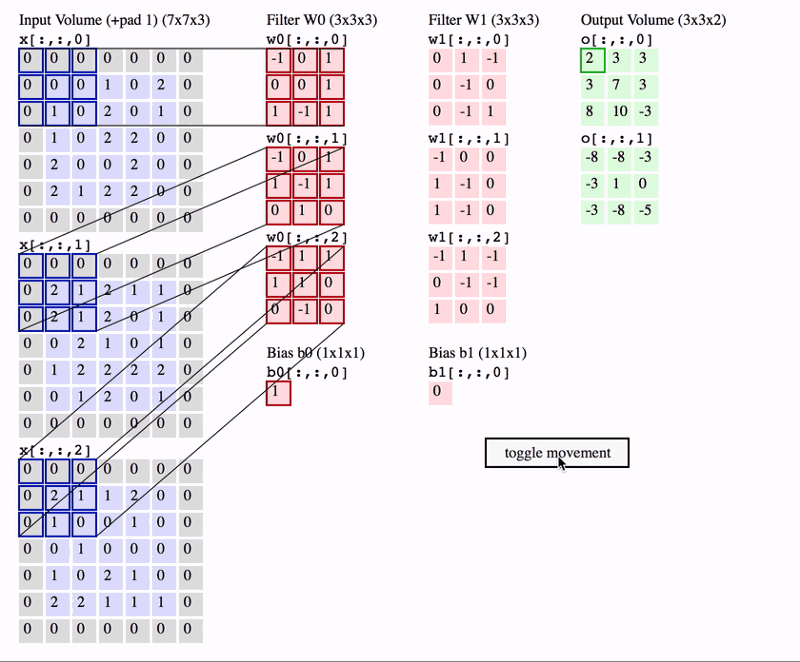
Source: http://cs231n.github.io/convolutional-networks/

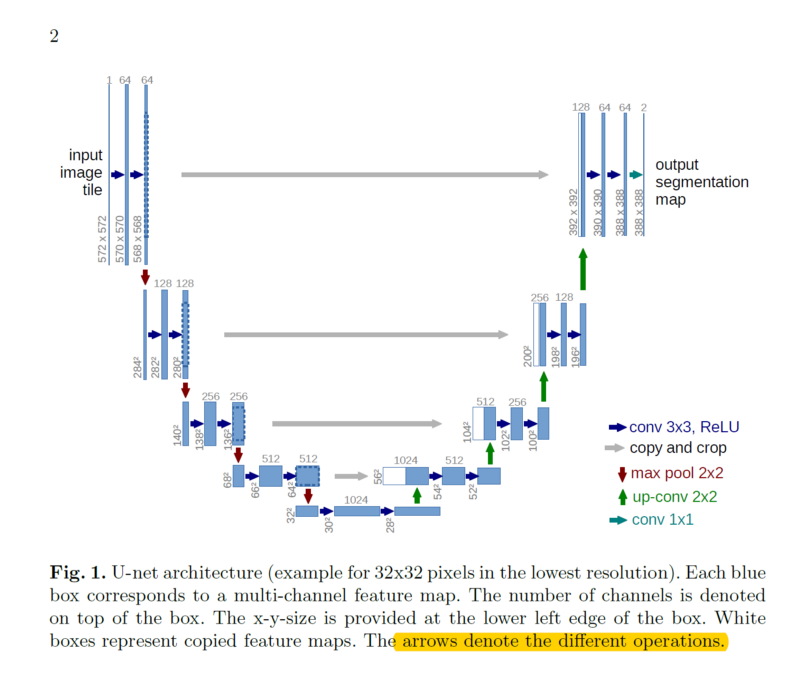
Source: Olaf Ronneberger et al., U-Net: Convolutional Networks for Biomedical Image Segmentation

## Neural networks and medical images

For medical imaging data, creation of an effective, generalizable artificial intelligence (AI) pipeline requires more than defining a model architecture and training the model. These extra challenges with medical data is the work of the wizard in [this figure from the nnU-Net project](https://github.com/MIC-DKFZ/nnUNet/):

<img src="https://github.com/MIC-DKFZ/nnUNet/blob/master/documentation/assets/nnU-Net_overview.png?raw=true">

> Citation: Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring 
method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.

Unlike other domains, medical data must handle:

- 3D data
- Anisotropic sampling
- Patient orientation
- Multiple modalities
- Substantially different noise, acquisition system characteristics, and target structure properties
- Extreme class imbalance
- Extremely small datasets

The [Medical Open Network for AI (MONAI)](https://monai.io) is an open-source framework designed to facilitate the development, training, and deployment of AI models specifically for healthcare imaging. MONAI plays a similar role to ITK, but with a focus on machine learning as opposed to general advanced medical computational processing and analysis. Founded by NVIDIA, Kitware, and leading academic medical centers, MONAI aims to establish an inclusive community of AI researchers dedicated to innovating and sharing best practices for AI applications in healthcare imaging. This initiative seeks to bridge the gap between academic research and clinical application, thereby accelerating the transition of AI research breakthroughs into impactful clinical solutions.

MONAI addresses several key challenges in medical imaging AI:

1. **Domain-Specific Needs**: Medical imaging data often require specialized preprocessing, augmentation, and normalization techniques that are not commonly found in general AI frameworks. MONAI provides medical-specific image transformations and utilities to cater to these needs. ITK provides complementary functionality in this area. 

2. **3D Image Analysis**: Many healthcare applications involve volumetric (3D) data, which poses unique challenges in terms of analysis and model training. MONAI offers state-of-the-art 3D segmentation algorithms, such as UNETR, designed to work efficiently with 3D medical images.

3. **Integration and Deployment**: Deploying AI models into clinical workflows can be complex due to the need for integration with existing healthcare IT systems and adherence to medical regulations. MONAI simplifies this process with tools like MONAI Deploy and MONAI Application Packages (MAPs), which provide standardized ways to package and deploy AI models.

4. **Reproducibility and Validation**: Ensuring that AI models produce consistent and reliable results across different datasets and clinical settings is crucial. MONAI supports reproducible research practices by offering a framework that facilitates the validation and refinement of AI models for medical imaging.

5. **Community and Collaboration**: By fostering a collaborative environment, MONAI encourages the exchange of ideas and best practices among researchers, clinicians, and developers. This collaborative effort helps to advance the field of medical imaging AI more rapidly and effectively.

In summary, MONAI is a sibling to ITK, designed to overcome the specific challenges of developing and deploying AI models in the healthcare domain, with a particular focus on medical imaging. It provides specialized tools and a collaborative platform to accelerate the application of AI technologies for improving healthcare outcomes.

## MONAI 3D Spleen Segmentation

This is an extension of the MONAI Tutorial [Spleen 3D segmentation](https://github.com/Project-MONAI/tutorials/blob/main/3d_segmentation/spleen_segmentation_3d.ipynb) notebook.

The following demonstrates MONAI's features:

1. Transforms for dictionary format data.
1. Load Nifti image with metadata.
1. Add channel dim to the data if no channel dimension.
1. Scale medical image intensity with expected range.
1. Crop out a batch of balanced images based on positive / negative label ratio.
1. Cache IO and transforms to accelerate training and validation.
1. 3D UNet model, Dice loss function, Mean Dice metric for 3D segmentation task.
1. Sliding window inference method.
1. Deterministic training for reproducibility.

MONAI is based on PyTorch.

The Spleen dataset was obtained from http://medicaldecathlon.com/.

Target: Spleen  
Modality: CT  
Size: 61 3D volumes (41 Training + 20 Testing)  
Source: Memorial Sloan Kettering Cancer Center  
Challenge: Large ranging foreground size

In [1]:
from monai.utils import first, set_determinism
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    EnsureTyped,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    Invertd,
)
from monai.handlers.utils import from_engine
from monai.networks.nets import UNet
from monai.networks.layers import Norm
from monai.metrics import DiceMetric
from monai.losses import DiceLoss
from monai.inferers import sliding_window_inference
from monai.data import CacheDataset, DataLoader, Dataset, decollate_batch, itk_image_to_metatensor, metatensor_to_itk_image, ITKReader, MetaTensor
from monai.config import print_config
from monai.apps import download_and_extract
import torch
import numpy as np
import matplotlib.pyplot as plt
from itkwidgets import view
from rich import print
import tempfile
import shutil
import os
import glob

print_config()

MONAI version: 1.3.0
Numpy version: 1.26.4
Pytorch version: 2.2.0+cu121
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 865972f7a791bf7b42efbcd87c8402bd865b329e
MONAI __file__: /home/<username>/bin/micromamba/envs/itk-course/lib/python3.11/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.11
ITK version: 5.3.0
Nibabel version: 5.2.0
scikit-image version: NOT INSTALLED or UNKNOWN VERSION.
scipy version: 1.12.0
Pillow version: 10.2.0
Tensorboard version: NOT INSTALLED or UNKNOWN VERSION.
gdown version: 4.7.3
TorchVision version: NOT INSTALLED or UNKNOWN VERSION.
tqdm version: 4.66.2
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.8
pandas version: 2.2.0
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.
clearml version: NOT INSTALLED or UNKNOW

## Setup data directory

You can specify a directory with the `MONAI_DATA_DIRECTORY` environment variable.  
This allows you to save results and reuse downloads.  
If not specified a temporary directory will be used.

In [2]:
directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/matt/data/monai

## Download dataset

Downloads and extracts the dataset.  
The dataset comes from http://medicaldecathlon.com/.

In [3]:
resource = "https://msd-for-monai.s3-us-west-2.amazonaws.com/Task09_Spleen.tar"
md5 = "410d4a301da4e5b2f6f86ec3ddba524e"

compressed_file = os.path.join(root_dir, "Task09_Spleen.tar")
data_dir = os.path.join(root_dir, "Task09_Spleen")
if not os.path.exists(data_dir):
    download_and_extract(resource, compressed_file, root_dir, md5)

## Set MSD Spleen dataset path

In [4]:
train_images = sorted(glob.glob(os.path.join(data_dir, "imagesTr", "*.nii.gz")))
train_labels = sorted(glob.glob(os.path.join(data_dir, "labelsTr", "*.nii.gz")))
data_dicts = [{"image": image_name, "label": label_name} for image_name, label_name in zip(train_images, train_labels)]
train_files, val_files = data_dicts[:-9], data_dicts[-9:]

## Set deterministic training for reproducibility

In [5]:
set_determinism(seed=0)

## Setup transforms for training and validation

Here we use several transforms to augment the dataset:
1. `LoadImaged` loads the spleen CT images and labels from NIfTI format files.
1. `EnsureChannelFirstd` ensures the original data to construct "channel first" shape.
1. `Orientationd` unifies the data orientation based on the affine matrix.
1. `Spacingd` adjusts the spacing by `pixdim=(1.5, 1.5, 2.)` based on the affine matrix.
1. `ScaleIntensityRanged` extracts intensity range [-57, 164] and scales to [0, 1].
1. `CropForegroundd` removes all zero borders to focus on the valid body area of the images and labels.
1. `RandCropByPosNegLabeld` randomly crop patch samples from big image based on pos / neg ratio.  
The image centers of negative samples must be in valid body area.
1. `RandAffined` efficiently performs `rotate`, `scale`, `shear`, `translate`, etc. together based on PyTorch affine transform.

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-57,
            a_max=164,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 2.0), mode=("bilinear", "nearest")),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 96),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        # user can also add other random transforms
        # RandAffined(
        #     keys=['image', 'label'],
        #     mode=('bilinear', 'nearest'),
        #     prob=1.0, spatial_size=(96, 96, 96),
        #     rotate_range=(0, 0, np.pi/15),
        #     scale_range=(0.1, 0.1, 0.1)),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-57,
            a_max=164,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 2.0), mode=("bilinear", "nearest")),
    ]
)

monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.


## Check transforms in DataLoader

image shape: torch.Size([228, 158, 113]), label shape: torch.Size([228, 158, 113])

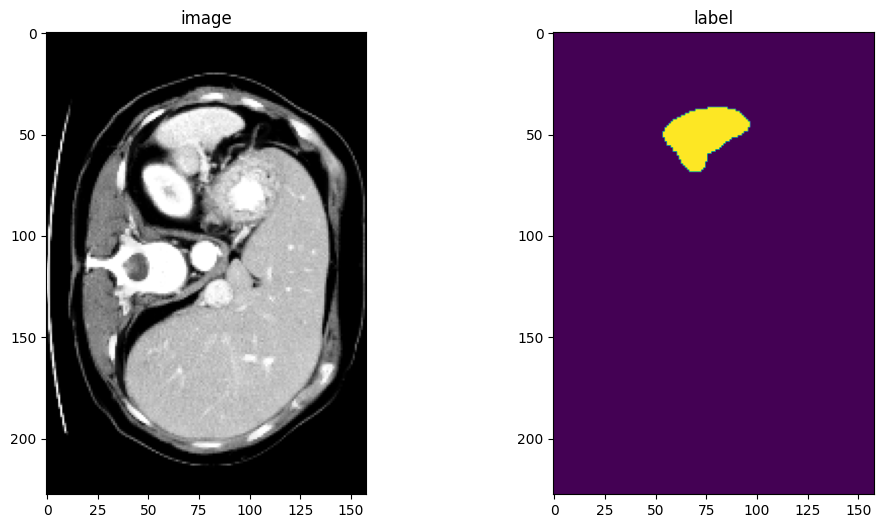

In [7]:
check_ds = Dataset(data=val_files, transform=val_transforms)
check_loader = DataLoader(check_ds, batch_size=1)
check_data = first(check_loader)
image, label = (check_data["image"][0][0], check_data["label"][0][0])
print(f"image shape: {image.shape}, label shape: {label.shape}")
# plot the slice [:, :, 80]
plt.figure("check", (12, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(image[:, :, 80], cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[:, :, 80])
plt.show()

## MetaTensor's

MONAI works with their `MetaTensor` data structure, which is a an extension of `torch.Tensor` that adds metadata. The spatial metadata is stored in the `.affine` matrix and the remainder of the metadata is stored in `.meta`.

In [8]:
print(type(image))
print(type(label))

<class 'monai.data.meta_tensor.MetaTensor'>

<class 'monai.data.meta_tensor.MetaTensor'>

In [9]:
print(image.affine)

tensor([[   1.5000,    0.0000,    0.0000, -353.1056],
        [   0.0000,    1.5000,    0.0000, -324.4376],
        [   0.0000,    0.0000,    2.0000,    0.0000],
        [   0.0000,    0.0000,    0.0000,    1.0000]], dtype=torch.float64)

In [10]:
print(image.meta)

{
    'glmin': 0,
    'vox_offset': 0.0,
    'intent_code': 0,
    'scl_inter': nan,
    'intent_p2': 0.0,
    'qform_code': 1,
    'srow_x': tensor([   0.6992,    0.0000,    0.0000, -357.3009]),
    'sizeof_hdr': 348,
    spatial_shape: tensor([512, 512,  33], dtype=torch.int16),
    original_affine: tensor([[   0.6992,    0.0000,    0.0000, -357.3009],
        [   0.0000,    0.6992,    0.0000, -357.3009],
        [   0.0000,    0.0000,    7.0000,    0.0000],
        [   0.0000,    0.0000,    0.0000,    1.0000]], dtype=torch.float64),
    'as_closest_canonical': False,
    'scl_slope': nan,
    'pixdim': tensor([1.0000, 0.6992, 0.6992, 7.0000, 0.0000, 0.0000, 0.0000, 0.0000]),
    'slice_end': 0,
    'xyzt_units': 10,
    'bitpix': 32,
    'slice_start': 0,
    affine: tensor([[   1.5000,    0.0000,    0.0000, -353.1056],
        [   0.0000,    1.5000,    0.0000, -324.4376],
        [   0.0000,    0.0000,    2.0000,    0.0000],
        [   0.0000,    0.0000,    0.0000,    1.0000]], dtype=torch.float64),
    original_channel_dim: nan,
    'toffset': 0.0,
    'intent_p1': 0.0,
    'qoffset_z': 0.0,
    'datatype': 16,
    'dim_info': 0,
    'session_error': 0,
    space: RAS,
    'quatern_b': 0.0,
    'extents': 0,
    'slice_code': 0,
    'filename_or_obj': '/home/matt/data/monai/Task09_Spleen/imagesTr/spleen_56.nii.gz',
    'quatern_c': 0.0,
    'quatern_d': 0.0,
    'glmax': 0,
    'qoffset_y': -357.3009033203125,
    'qoffset_x': -357.3009033203125,
    'slice_duration': 0.0,
    'cal_max': 0.0,
    'srow_y': tensor([   0.0000,    0.6992,    0.0000, -357.3009]),
    'cal_min': 0.0,
    'intent_p3': 0.0,
    'sform_code': 1,
    'dim': tensor([  3, 512, 512,  33,   1,   1,   1,   1], dtype=torch.int16),
    'srow_z': tensor([0.0000, 0.0000, 7.0000, 0.0000])
}

We can convert between `itk.Image` and `monai.MetaTensor` while preserving spatial metadata with `itk_image_to_metatensor` and `metatensor_to_itk_image`.

In [11]:
help(metatensor_to_itk_image)

Help on function metatensor_to_itk_image in module monai.data.itk_torch_bridge:

metatensor_to_itk_image(meta_tensor: 'MetaTensor', channel_dim: 'int | None' = 0, dtype: 'DtypeLike' = <class 'numpy.float32'>, **kwargs)
    Converts a MetaTensor object to an ITK image. Expects the MetaTensor to be in ChannelFirst format.
    
    Args:
        meta_tensor: The MetaTensor to be converted.
        channel_dim: channel dimension of the data array, defaults to ``0`` (Channel-first).
            ``None`` indicates no channel dimension. This is used to create a Vector Image if it is not ``None``.
        dtype: output data type, defaults to `np.float32`.
        kwargs: additional keyword arguments. Currently `itk.GetImageFromArray` will get ``ttype`` from this dictionary.
    
    Returns:
        The ITK image.
    
    See also: :py:func:`ITKWriter.create_backend_obj`



In [12]:
# It currently helps to multiply by 255 for visualization with itkwidgets
itk_image = metatensor_to_itk_image(image*255, channel_dim=None)
print(itk_image)

Image (0x5593e8fd0540)
  RTTI typeinfo:   itk::Image<float, 3u>
  Reference Count: 1
  Modified Time: 130
  Debug: Off
  Object Name: 
  Observers: 
    none
  Source: (none)
  Source output name: (none)
  Release Data: Off
  Data Released: False
  Global Release Data: Off
  PipelineMTime: 0
  UpdateMTime: 0
  RealTimeStamp: 0 seconds 
  LargestPossibleRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  BufferedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  RequestedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  Spacing: [1.5, 1.5, 2]
  Origin: [353.106, 324.438, 0]
  Direction: 
-1 0 0
0 -1 0
0 0 1

  IndexToPointMatrix: 
-1.5 0 0
0 -1.5 0
0 0 2

  PointToIndexMatrix: 
-0.666667 0 0
0 -0.666667 0
0 0 0.5

  Inverse Direction: 
-1 0 0
0 -1 0
0 0 1

  PixelContainer: 
    ImportImageContainer (0x5593e3b4bc00)
      RTTI typeinfo:   itk::ImportImageContainer<unsigned long, float>
      Reference Count: 1
      Modified Time: 126
      Debug: Off
      Object Name: 
      Observers: 
        none
      Pointer: 0x5593efa80c20
      Container manages memory: true
      Size: 4070712
      Capacity: 4070712

In [13]:
itk_label = metatensor_to_itk_image(label, channel_dim=None, dtype=np.uint16)
print(itk_label)

Image (0x5593e9bbaaa0)
  RTTI typeinfo:   itk::Image<unsigned short, 3u>
  Reference Count: 1
  Modified Time: 148
  Debug: Off
  Object Name: 
  Observers: 
    none
  Source: (none)
  Source output name: (none)
  Release Data: Off
  Data Released: False
  Global Release Data: Off
  PipelineMTime: 0
  UpdateMTime: 0
  RealTimeStamp: 0 seconds 
  LargestPossibleRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  BufferedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  RequestedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [228, 158, 113]
  Spacing: [1.5, 1.5, 2]
  Origin: [353.106, 324.438, 0]
  Direction: 
-1 0 0
0 -1 0
0 0 1

  IndexToPointMatrix: 
-1.5 0 0
0 -1.5 0
0 0 2

  PointToIndexMatrix: 
-0.666667 0 0
0 -0.666667 0
0 0 0.5

  Inverse Direction: 
-1 0 0
0 -1 0
0 0 1

  PixelContainer: 
    ImportImageContainer (0x5593e980bdc0)
      RTTI typeinfo:   itk::ImportImageContainer<unsigned long, unsigned short>
      Reference Count: 1
      Modified Time: 144
      Debug: Off
      Object Name: 
      Observers: 
        none
      Pointer: 0x5593edb72220
      Container manages memory: true
      Size: 4070712
      Capacity: 4070712


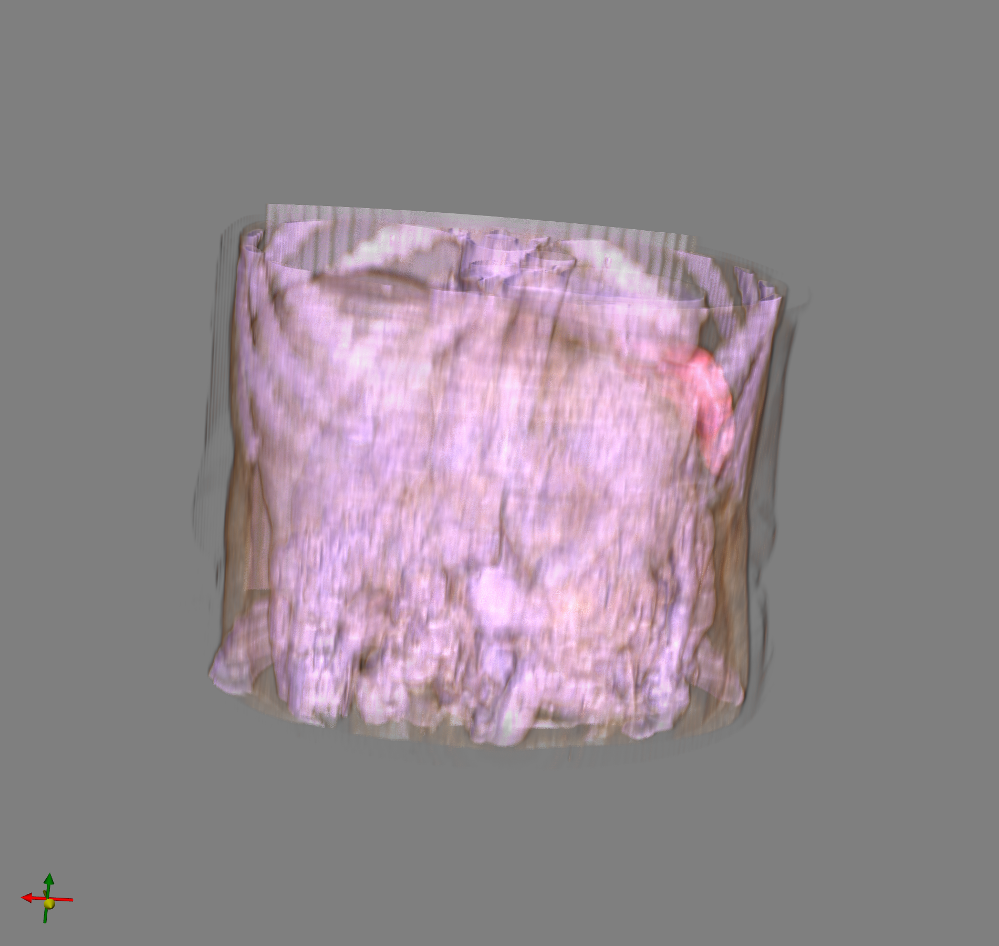
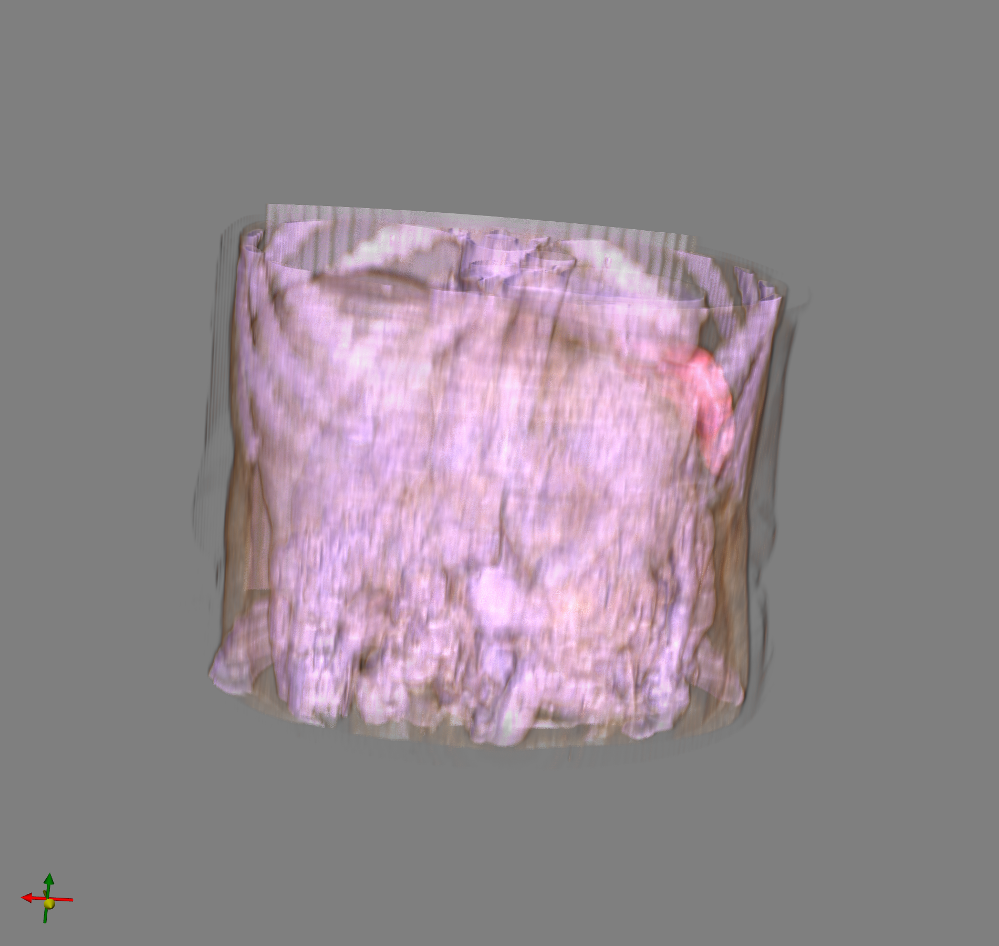

<IPython.core.display.Javascript object>

In [14]:
view(image=itk_image, label_image=itk_label)

## Load medical imaging datasets with ITK Python

If MONAI is installed with the `itk` option, i.e.:

```sh
pip install "monai[itk]"
```

Support will be available in `LoadImaged` for all [ITK's supported file formats](https://docs.itk.org/en/latest/learn/faq.html#what-3d-data-file-formats-can-itk-import-and-export), including DICOM.

In [15]:
help(ITKReader)

Help on class ITKReader in module monai.data.image_reader:

class ITKReader(ImageReader)
 |  ITKReader(channel_dim: 'str | int | None' = None, series_name: 'str' = '', reverse_indexing: 'bool' = False, series_meta: 'bool' = False, affine_lps_to_ras: 'bool' = True, **kwargs)
 |  
 |  Load medical images based on ITK library.
 |  All the supported image formats can be found at:
 |  https://github.com/InsightSoftwareConsortium/ITK/tree/master/Modules/IO
 |  The loaded data array will be in C order, for example, a 3D image NumPy
 |  array index order will be `CDWH`.
 |  
 |  Args:
 |      channel_dim: the channel dimension of the input image, default is None.
 |          This is used to set original_channel_dim in the metadata, EnsureChannelFirstD reads this field.
 |          If None, `original_channel_dim` will be either `no_channel` or `-1`.
 |  
 |              - Nifti file is usually "channel last", so there is no need to specify this argument.
 |              - PNG file usually has `

## Define CacheDataset and DataLoader for training and validation

Here we use CacheDataset to accelerate training and validation process, it's 10x faster than the regular Dataset.  
To achieve best performance, set `cache_rate=1.0` to cache all the data, if memory is not enough, set lower value.  
Users can also set `cache_num` instead of `cache_rate`, will use the minimum value of the 2 settings.  
And set `num_workers` to enable multi-threads during caching.  
If want to to try the regular Dataset, just change to use the commented code below.

In [41]:
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4)
# train_ds = Dataset(data=train_files, transform=train_transforms)

# use batch_size=2 to load images and use RandCropByPosNegLabeld
# to generate 2 x 4 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

val_ds = CacheDataset(data=val_files, transform=val_transforms, cache_rate=1.0, num_workers=4)
# val_ds = Dataset(data=val_files, transform=val_transforms)
val_loader = DataLoader(val_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.92it/s]


## Create Model, Loss, Optimizer

In [42]:
# standard PyTorch program style: create UNet, DiceLoss and Adam optimizer
device = torch.device("cuda:0")
model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=2,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)
loss_function = DiceLoss(to_onehot_y=True, softmax=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-4)
dice_metric = DiceMetric(include_background=False, reduction="mean")

## Execute a typical PyTorch training process

In [43]:
max_epochs = 600
val_interval = 2
best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
post_pred = Compose([AsDiscrete(argmax=True, to_onehot=2)])
post_label = Compose([AsDiscrete(to_onehot=2)])

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["label"].to(device),
        )
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        print(f"{step}/{len(train_ds) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            for val_data in val_loader:
                val_inputs, val_labels = (
                    val_data["image"].to(device),
                    val_data["label"].to(device),
                )
                roi_size = (160, 160, 160)
                sw_batch_size = 4
                val_outputs = sliding_window_inference(val_inputs, roi_size, sw_batch_size, model)
                val_outputs = [post_pred(i) for i in decollate_batch(val_outputs)]
                val_labels = [post_label(i) for i in decollate_batch(val_labels)]
                # compute metric for current iteration
                dice_metric(y_pred=val_outputs, y=val_labels)

            # aggregate the final mean dice result
            metric = dice_metric.aggregate().item()
            # reset the status for next validation round
            dice_metric.reset()

            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

----------

epoch 1/600

1/16, train_loss: 0.6680

2/16, train_loss: 0.6766

3/16, train_loss: 0.6748

4/16, train_loss: 0.6673

5/16, train_loss: 0.6558

6/16, train_loss: 0.6692

7/16, train_loss: 0.6452

8/16, train_loss: 0.6658

9/16, train_loss: 0.6554

10/16, train_loss: 0.6404

11/16, train_loss: 0.6571

12/16, train_loss: 0.6305

13/16, train_loss: 0.6524

14/16, train_loss: 0.6561

15/16, train_loss: 0.6549

16/16, train_loss: 0.6324

epoch 1 average loss: 0.6564

----------

epoch 2/600

1/16, train_loss: 0.6039

2/16, train_loss: 0.6501

3/16, train_loss: 0.6466

4/16, train_loss: 0.6381

5/16, train_loss: 0.6552

6/16, train_loss: 0.6130

7/16, train_loss: 0.6224

8/16, train_loss: 0.6369

9/16, train_loss: 0.6207

10/16, train_loss: 0.6020

11/16, train_loss: 0.6414

12/16, train_loss: 0.6310

13/16, train_loss: 0.6520

14/16, train_loss: 0.6253

15/16, train_loss: 0.6335

16/16, train_loss: 0.6090

epoch 2 average loss: 0.6301

saved new best metric model

current epoch: 2 current mean dice: 0.0341
best mean dice: 0.0341 at epoch: 2

----------

epoch 3/600

1/16, train_loss: 0.5867

2/16, train_loss: 0.6045

3/16, train_loss: 0.6331

4/16, train_loss: 0.6398

5/16, train_loss: 0.6151

6/16, train_loss: 0.6132

7/16, train_loss: 0.6115

8/16, train_loss: 0.6261

9/16, train_loss: 0.6160

10/16, train_loss: 0.6169

11/16, train_loss: 0.6126

12/16, train_loss: 0.6265

13/16, train_loss: 0.6220

14/16, train_loss: 0.5990

15/16, train_loss: 0.6072

16/16, train_loss: 0.6222

epoch 3 average loss: 0.6158

----------

epoch 4/600

1/16, train_loss: 0.6138

2/16, train_loss: 0.6070

3/16, train_loss: 0.5617

4/16, train_loss: 0.5859

5/16, train_loss: 0.5759

6/16, train_loss: 0.6148

7/16, train_loss: 0.5590

8/16, train_loss: 0.6308

9/16, train_loss: 0.6232

10/16, train_loss: 0.6147

11/16, train_loss: 0.5949

12/16, train_loss: 0.5906

13/16, train_loss: 0.6221

14/16, train_loss: 0.6053

15/16, train_loss: 0.5907

16/16, train_loss: 0.6195

epoch 4 average loss: 0.6006

saved new best metric model

current epoch: 4 current mean dice: 0.0511
best mean dice: 0.0511 at epoch: 4

----------

epoch 5/600

1/16, train_loss: 0.6183

2/16, train_loss: 0.6059

3/16, train_loss: 0.6059

4/16, train_loss: 0.5831

5/16, train_loss: 0.6150

6/16, train_loss: 0.5905

7/16, train_loss: 0.5805

8/16, train_loss: 0.5629

9/16, train_loss: 0.5707

10/16, train_loss: 0.5998

11/16, train_loss: 0.5921

12/16, train_loss: 0.5606

13/16, train_loss: 0.5761

14/16, train_loss: 0.5889

15/16, train_loss: 0.5637

16/16, train_loss: 0.5958

epoch 5 average loss: 0.5881

----------

epoch 6/600

1/16, train_loss: 0.5715

2/16, train_loss: 0.5732

3/16, train_loss: 0.5558

4/16, train_loss: 0.5385

5/16, train_loss: 0.5871

6/16, train_loss: 0.6016

7/16, train_loss: 0.5827

8/16, train_loss: 0.5677

9/16, train_loss: 0.5874

10/16, train_loss: 0.5498

11/16, train_loss: 0.5291

12/16, train_loss: 0.5811

13/16, train_loss: 0.5671

14/16, train_loss: 0.5986

15/16, train_loss: 0.5931

16/16, train_loss: 0.5594

epoch 6 average loss: 0.5715

saved new best metric model

current epoch: 6 current mean dice: 0.0695
best mean dice: 0.0695 at epoch: 6

----------

epoch 7/600

1/16, train_loss: 0.6093

2/16, train_loss: 0.5566

3/16, train_loss: 0.6257

4/16, train_loss: 0.5709

5/16, train_loss: 0.5753

6/16, train_loss: 0.5696

7/16, train_loss: 0.5190

8/16, train_loss: 0.5762

9/16, train_loss: 0.5611

10/16, train_loss: 0.5509

11/16, train_loss: 0.5541

12/16, train_loss: 0.5172

13/16, train_loss: 0.5925

14/16, train_loss: 0.5818

15/16, train_loss: 0.5705

16/16, train_loss: 0.5724

epoch 7 average loss: 0.5689

----------

epoch 8/600

1/16, train_loss: 0.5804

2/16, train_loss: 0.5938

3/16, train_loss: 0.5538

4/16, train_loss: 0.5723

5/16, train_loss: 0.5164

6/16, train_loss: 0.5809

7/16, train_loss: 0.5882

8/16, train_loss: 0.5558

9/16, train_loss: 0.5914

10/16, train_loss: 0.5179

11/16, train_loss: 0.5568

12/16, train_loss: 0.5915

13/16, train_loss: 0.5830

14/16, train_loss: 0.5170

15/16, train_loss: 0.5419

16/16, train_loss: 0.5329

epoch 8 average loss: 0.5609

saved new best metric model

current epoch: 8 current mean dice: 0.0907
best mean dice: 0.0907 at epoch: 8

----------

epoch 9/600

1/16, train_loss: 0.5742

2/16, train_loss: 0.5439

3/16, train_loss: 0.5854

4/16, train_loss: 0.5765

5/16, train_loss: 0.5342

6/16, train_loss: 0.5241

7/16, train_loss: 0.5880

8/16, train_loss: 0.5144

9/16, train_loss: 0.5671

10/16, train_loss: 0.5413

11/16, train_loss: 0.5140

12/16, train_loss: 0.5564

13/16, train_loss: 0.5639

14/16, train_loss: 0.5200

15/16, train_loss: 0.5341

16/16, train_loss: 0.5224

epoch 9 average loss: 0.5475

----------

epoch 10/600

1/16, train_loss: 0.5605

2/16, train_loss: 0.5469

3/16, train_loss: 0.5523

4/16, train_loss: 0.5702

5/16, train_loss: 0.5292

6/16, train_loss: 0.5140

7/16, train_loss: 0.5669

8/16, train_loss: 0.5329

9/16, train_loss: 0.5620

10/16, train_loss: 0.5102

11/16, train_loss: 0.5805

12/16, train_loss: 0.5457

13/16, train_loss: 0.5145

14/16, train_loss: 0.5330

15/16, train_loss: 0.5245

16/16, train_loss: 0.5680

epoch 10 average loss: 0.5445

saved new best metric model

current epoch: 10 current mean dice: 0.0931
best mean dice: 0.0931 at epoch: 10

----------

epoch 11/600

1/16, train_loss: 0.5428

2/16, train_loss: 0.5584

3/16, train_loss: 0.5513

4/16, train_loss: 0.5560

5/16, train_loss: 0.5222

6/16, train_loss: 0.5568

7/16, train_loss: 0.4862

8/16, train_loss: 0.5723

9/16, train_loss: 0.5414

10/16, train_loss: 0.5481

11/16, train_loss: 0.4759

12/16, train_loss: 0.4834

13/16, train_loss: 0.5398

14/16, train_loss: 0.5605

15/16, train_loss: 0.5415

16/16, train_loss: 0.5452

epoch 11 average loss: 0.5364

----------

epoch 12/600

1/16, train_loss: 0.5570

2/16, train_loss: 0.5392

3/16, train_loss: 0.5833

4/16, train_loss: 0.5570

5/16, train_loss: 0.5510

6/16, train_loss: 0.5523

7/16, train_loss: 0.5290

8/16, train_loss: 0.5814

9/16, train_loss: 0.4719

10/16, train_loss: 0.4908

11/16, train_loss: 0.5491

12/16, train_loss: 0.5886

13/16, train_loss: 0.5359

14/16, train_loss: 0.5580

15/16, train_loss: 0.5804

16/16, train_loss: 0.5828

epoch 12 average loss: 0.5505

current epoch: 12 current mean dice: 0.0909
best mean dice: 0.0931 at epoch: 10

----------

epoch 13/600

1/16, train_loss: 0.5506

2/16, train_loss: 0.4733

3/16, train_loss: 0.5426

4/16, train_loss: 0.5482

5/16, train_loss: 0.5595

6/16, train_loss: 0.5799

7/16, train_loss: 0.5280

8/16, train_loss: 0.4797

9/16, train_loss: 0.5205

10/16, train_loss: 0.5141

11/16, train_loss: 0.5620

12/16, train_loss: 0.5287

13/16, train_loss: 0.4938

14/16, train_loss: 0.5748

15/16, train_loss: 0.5803

16/16, train_loss: 0.5141

epoch 13 average loss: 0.5344

----------

epoch 14/600

1/16, train_loss: 0.5061

2/16, train_loss: 0.4960

3/16, train_loss: 0.5289

4/16, train_loss: 0.4219

5/16, train_loss: 0.4928

6/16, train_loss: 0.5564

7/16, train_loss: 0.5755

8/16, train_loss: 0.5014

9/16, train_loss: 0.4992

10/16, train_loss: 0.5472

11/16, train_loss: 0.5477

12/16, train_loss: 0.5243

13/16, train_loss: 0.5313

14/16, train_loss: 0.4848

15/16, train_loss: 0.5444

16/16, train_loss: 0.5334

epoch 14 average loss: 0.5182

saved new best metric model

current epoch: 14 current mean dice: 0.1138
best mean dice: 0.1138 at epoch: 14

----------

epoch 15/600

1/16, train_loss: 0.4937

2/16, train_loss: 0.5326

3/16, train_loss: 0.5048

4/16, train_loss: 0.4975

5/16, train_loss: 0.5236

6/16, train_loss: 0.4925

7/16, train_loss: 0.5118

8/16, train_loss: 0.5423

9/16, train_loss: 0.5030

10/16, train_loss: 0.5173

11/16, train_loss: 0.6030

12/16, train_loss: 0.5582

13/16, train_loss: 0.5463

14/16, train_loss: 0.5405

15/16, train_loss: 0.5147

16/16, train_loss: 0.4717

epoch 15 average loss: 0.5221

----------

epoch 16/600

1/16, train_loss: 0.5356

2/16, train_loss: 0.5382

3/16, train_loss: 0.5381

4/16, train_loss: 0.5001

5/16, train_loss: 0.4758

6/16, train_loss: 0.5074

7/16, train_loss: 0.4845

8/16, train_loss: 0.5399

9/16, train_loss: 0.4984

10/16, train_loss: 0.5246

11/16, train_loss: 0.5268

12/16, train_loss: 0.5444

13/16, train_loss: 0.5597

14/16, train_loss: 0.5269

15/16, train_loss: 0.4649

16/16, train_loss: 0.4473

epoch 16 average loss: 0.5133

current epoch: 16 current mean dice: 0.0626
best mean dice: 0.1138 at epoch: 14

----------

epoch 17/600

1/16, train_loss: 0.5494

2/16, train_loss: 0.5096

3/16, train_loss: 0.5032

4/16, train_loss: 0.4908

5/16, train_loss: 0.5491

6/16, train_loss: 0.4600

7/16, train_loss: 0.4425

8/16, train_loss: 0.5073

9/16, train_loss: 0.3822

10/16, train_loss: 0.5294

11/16, train_loss: 0.4624

12/16, train_loss: 0.5116

13/16, train_loss: 0.4869

14/16, train_loss: 0.5241

15/16, train_loss: 0.5575

16/16, train_loss: 0.5063

epoch 17 average loss: 0.4983

----------

epoch 18/600

1/16, train_loss: 0.4777

2/16, train_loss: 0.5381

3/16, train_loss: 0.4877

4/16, train_loss: 0.4113

5/16, train_loss: 0.5137

6/16, train_loss: 0.4787

7/16, train_loss: 0.5524

8/16, train_loss: 0.5211

9/16, train_loss: 0.5065

10/16, train_loss: 0.4626

11/16, train_loss: 0.4230

12/16, train_loss: 0.4153

13/16, train_loss: 0.5571

14/16, train_loss: 0.5202

15/16, train_loss: 0.4885

16/16, train_loss: 0.5527

epoch 18 average loss: 0.4942

current epoch: 18 current mean dice: 0.0493
best mean dice: 0.1138 at epoch: 14

----------

epoch 19/600

1/16, train_loss: 0.4908

2/16, train_loss: 0.5078

3/16, train_loss: 0.4716

4/16, train_loss: 0.4967

5/16, train_loss: 0.5144

6/16, train_loss: 0.5154

7/16, train_loss: 0.4384

8/16, train_loss: 0.4859

9/16, train_loss: 0.5226

10/16, train_loss: 0.4782

11/16, train_loss: 0.4650

12/16, train_loss: 0.4110

13/16, train_loss: 0.4040

14/16, train_loss: 0.4435

15/16, train_loss: 0.4029

16/16, train_loss: 0.5182

epoch 19 average loss: 0.4729

----------

epoch 20/600

1/16, train_loss: 0.5233

2/16, train_loss: 0.4915

3/16, train_loss: 0.5668

4/16, train_loss: 0.5007

5/16, train_loss: 0.4600

6/16, train_loss: 0.4590

7/16, train_loss: 0.4987

8/16, train_loss: 0.4311

9/16, train_loss: 0.5099

10/16, train_loss: 0.4843

11/16, train_loss: 0.4779

12/16, train_loss: 0.4872

13/16, train_loss: 0.4834

14/16, train_loss: 0.4593

15/16, train_loss: 0.4863

16/16, train_loss: 0.4493

epoch 20 average loss: 0.4855

current epoch: 20 current mean dice: 0.0580
best mean dice: 0.1138 at epoch: 14

----------

epoch 21/600

1/16, train_loss: 0.4826

2/16, train_loss: 0.4702

3/16, train_loss: 0.5053

4/16, train_loss: 0.5486

5/16, train_loss: 0.4678

6/16, train_loss: 0.5212

7/16, train_loss: 0.4741

8/16, train_loss: 0.5046

9/16, train_loss: 0.4253

10/16, train_loss: 0.4443

11/16, train_loss: 0.4823

12/16, train_loss: 0.4615

13/16, train_loss: 0.4253

14/16, train_loss: 0.4163

15/16, train_loss: 0.4881

16/16, train_loss: 0.4445

epoch 21 average loss: 0.4726

----------

epoch 22/600

1/16, train_loss: 0.3790

2/16, train_loss: 0.3925

3/16, train_loss: 0.4460

4/16, train_loss: 0.4337

5/16, train_loss: 0.5169

6/16, train_loss: 0.4801

7/16, train_loss: 0.4261

8/16, train_loss: 0.5424

9/16, train_loss: 0.4685

10/16, train_loss: 0.3931

11/16, train_loss: 0.4383

12/16, train_loss: 0.4444

13/16, train_loss: 0.4861

14/16, train_loss: 0.4778

15/16, train_loss: 0.5231

16/16, train_loss: 0.4832

epoch 22 average loss: 0.4582

current epoch: 22 current mean dice: 0.0567
best mean dice: 0.1138 at epoch: 14

----------

epoch 23/600

1/16, train_loss: 0.4906

2/16, train_loss: 0.5097

3/16, train_loss: 0.4485

4/16, train_loss: 0.4887

5/16, train_loss: 0.4786

6/16, train_loss: 0.5004

7/16, train_loss: 0.4075

8/16, train_loss: 0.4458

9/16, train_loss: 0.4910

10/16, train_loss: 0.4150

11/16, train_loss: 0.5617

12/16, train_loss: 0.4549

13/16, train_loss: 0.5169

14/16, train_loss: 0.4984

15/16, train_loss: 0.4679

16/16, train_loss: 0.4221

epoch 23 average loss: 0.4748

----------

epoch 24/600

1/16, train_loss: 0.4851

2/16, train_loss: 0.4498

3/16, train_loss: 0.4427

4/16, train_loss: 0.4025

5/16, train_loss: 0.4777

6/16, train_loss: 0.4040

7/16, train_loss: 0.4731

8/16, train_loss: 0.4048

9/16, train_loss: 0.5384

10/16, train_loss: 0.4723

11/16, train_loss: 0.5243

12/16, train_loss: 0.4810

13/16, train_loss: 0.4262

14/16, train_loss: 0.4058

15/16, train_loss: 0.4408

16/16, train_loss: 0.4221

epoch 24 average loss: 0.4532

current epoch: 24 current mean dice: 0.0860
best mean dice: 0.1138 at epoch: 14

----------

epoch 25/600

1/16, train_loss: 0.3853

2/16, train_loss: 0.5428

3/16, train_loss: 0.4162

4/16, train_loss: 0.3875

5/16, train_loss: 0.4290

6/16, train_loss: 0.4265

7/16, train_loss: 0.4944

8/16, train_loss: 0.4763

9/16, train_loss: 0.4714

10/16, train_loss: 0.4417

11/16, train_loss: 0.4334

12/16, train_loss: 0.4362

13/16, train_loss: 0.4180

14/16, train_loss: 0.3804

15/16, train_loss: 0.4539

16/16, train_loss: 0.5418

epoch 25 average loss: 0.4459

----------

epoch 26/600

1/16, train_loss: 0.3827

2/16, train_loss: 0.4623

3/16, train_loss: 0.5202

4/16, train_loss: 0.4181

5/16, train_loss: 0.4279

6/16, train_loss: 0.4328

7/16, train_loss: 0.5034

8/16, train_loss: 0.4530

9/16, train_loss: 0.4168

10/16, train_loss: 0.4511

11/16, train_loss: 0.4421

12/16, train_loss: 0.4782

13/16, train_loss: 0.4173

14/16, train_loss: 0.4918

15/16, train_loss: 0.4633

16/16, train_loss: 0.4502

epoch 26 average loss: 0.4507

current epoch: 26 current mean dice: 0.0474
best mean dice: 0.1138 at epoch: 14

----------

epoch 27/600

1/16, train_loss: 0.4448

2/16, train_loss: 0.4538

3/16, train_loss: 0.4824

4/16, train_loss: 0.5274

5/16, train_loss: 0.5472

6/16, train_loss: 0.4710

7/16, train_loss: 0.4611

8/16, train_loss: 0.3890

9/16, train_loss: 0.4309

10/16, train_loss: 0.5027

11/16, train_loss: 0.4282

12/16, train_loss: 0.3257

13/16, train_loss: 0.3915

14/16, train_loss: 0.4572

15/16, train_loss: 0.4799

16/16, train_loss: 0.4787

epoch 27 average loss: 0.4545

----------

epoch 28/600

1/16, train_loss: 0.4308

2/16, train_loss: 0.4494

3/16, train_loss: 0.5147

4/16, train_loss: 0.4530

5/16, train_loss: 0.4716

6/16, train_loss: 0.4291

7/16, train_loss: 0.4281

8/16, train_loss: 0.4600

9/16, train_loss: 0.4481

10/16, train_loss: 0.4297

11/16, train_loss: 0.3968

12/16, train_loss: 0.4147

13/16, train_loss: 0.4607

14/16, train_loss: 0.5402

15/16, train_loss: 0.4289

16/16, train_loss: 0.3774

epoch 28 average loss: 0.4458

current epoch: 28 current mean dice: 0.0762
best mean dice: 0.1138 at epoch: 14

----------

epoch 29/600

1/16, train_loss: 0.3422

2/16, train_loss: 0.3992

3/16, train_loss: 0.4778

4/16, train_loss: 0.4505

5/16, train_loss: 0.4264

6/16, train_loss: 0.4435

7/16, train_loss: 0.5023

8/16, train_loss: 0.4155

9/16, train_loss: 0.3498

10/16, train_loss: 0.4071

11/16, train_loss: 0.4567

12/16, train_loss: 0.4135

13/16, train_loss: 0.4319

14/16, train_loss: 0.4850

15/16, train_loss: 0.4099

16/16, train_loss: 0.4143

epoch 29 average loss: 0.4266

----------

epoch 30/600

1/16, train_loss: 0.3860

2/16, train_loss: 0.4532

3/16, train_loss: 0.3874

4/16, train_loss: 0.4607

5/16, train_loss: 0.3959

6/16, train_loss: 0.3985

7/16, train_loss: 0.4691

8/16, train_loss: 0.4172

9/16, train_loss: 0.3998

10/16, train_loss: 0.5117

11/16, train_loss: 0.4945

12/16, train_loss: 0.4075

13/16, train_loss: 0.3426

14/16, train_loss: 0.4414

15/16, train_loss: 0.4439

16/16, train_loss: 0.4816

epoch 30 average loss: 0.4307

current epoch: 30 current mean dice: 0.0829
best mean dice: 0.1138 at epoch: 14

----------

epoch 31/600

1/16, train_loss: 0.4193

2/16, train_loss: 0.4247

3/16, train_loss: 0.4256

4/16, train_loss: 0.4593

5/16, train_loss: 0.4222

6/16, train_loss: 0.3950

7/16, train_loss: 0.3137

8/16, train_loss: 0.3541

9/16, train_loss: 0.4290

10/16, train_loss: 0.5174

11/16, train_loss: 0.4469

12/16, train_loss: 0.4240

13/16, train_loss: 0.4176

14/16, train_loss: 0.4983

15/16, train_loss: 0.3755

16/16, train_loss: 0.3825

epoch 31 average loss: 0.4191

----------

epoch 32/600

1/16, train_loss: 0.4147

2/16, train_loss: 0.4466

3/16, train_loss: 0.3051

4/16, train_loss: 0.3597

5/16, train_loss: 0.3700

6/16, train_loss: 0.3864

7/16, train_loss: 0.2920

8/16, train_loss: 0.4319

9/16, train_loss: 0.4687

10/16, train_loss: 0.3157

11/16, train_loss: 0.3250

12/16, train_loss: 0.3906

13/16, train_loss: 0.4060

14/16, train_loss: 0.4299

15/16, train_loss: 0.3467

16/16, train_loss: 0.3967

epoch 32 average loss: 0.3804

current epoch: 32 current mean dice: 0.0359
best mean dice: 0.1138 at epoch: 14

----------

epoch 33/600

1/16, train_loss: 0.3098

2/16, train_loss: 0.3442

3/16, train_loss: 0.4201

4/16, train_loss: 0.4594

5/16, train_loss: 0.4185

6/16, train_loss: 0.4239

7/16, train_loss: 0.4778

8/16, train_loss: 0.4644

9/16, train_loss: 0.3261

10/16, train_loss: 0.3077

11/16, train_loss: 0.4342

12/16, train_loss: 0.3798

13/16, train_loss: 0.4318

14/16, train_loss: 0.4413

15/16, train_loss: 0.3633

16/16, train_loss: 0.4250

epoch 33 average loss: 0.4017

----------

epoch 34/600

1/16, train_loss: 0.3264

2/16, train_loss: 0.4091

3/16, train_loss: 0.4222

4/16, train_loss: 0.4139

5/16, train_loss: 0.4305

6/16, train_loss: 0.3204

7/16, train_loss: 0.3889

8/16, train_loss: 0.3309

9/16, train_loss: 0.4193

10/16, train_loss: 0.4363

11/16, train_loss: 0.3607

12/16, train_loss: 0.4343

13/16, train_loss: 0.4417

14/16, train_loss: 0.3941

15/16, train_loss: 0.3988

16/16, train_loss: 0.4090

epoch 34 average loss: 0.3960

current epoch: 34 current mean dice: 0.0852
best mean dice: 0.1138 at epoch: 14

----------

epoch 35/600

1/16, train_loss: 0.4001

2/16, train_loss: 0.3653

3/16, train_loss: 0.3683

4/16, train_loss: 0.4376

5/16, train_loss: 0.4347

6/16, train_loss: 0.4331

7/16, train_loss: 0.3826

8/16, train_loss: 0.3114

9/16, train_loss: 0.4543

10/16, train_loss: 0.3608

11/16, train_loss: 0.3504

12/16, train_loss: 0.3864

13/16, train_loss: 0.4244

14/16, train_loss: 0.3511

15/16, train_loss: 0.3464

16/16, train_loss: 0.3776

epoch 35 average loss: 0.3865

----------

epoch 36/600

1/16, train_loss: 0.5103

2/16, train_loss: 0.4148

3/16, train_loss: 0.3831

4/16, train_loss: 0.4076

5/16, train_loss: 0.4492

6/16, train_loss: 0.3218

7/16, train_loss: 0.3866

8/16, train_loss: 0.3403

9/16, train_loss: 0.4370

10/16, train_loss: 0.3920

11/16, train_loss: 0.4274

12/16, train_loss: 0.3304

13/16, train_loss: 0.4430

14/16, train_loss: 0.3152

15/16, train_loss: 0.3654

16/16, train_loss: 0.4577

epoch 36 average loss: 0.3989

saved new best metric model

current epoch: 36 current mean dice: 0.1276
best mean dice: 0.1276 at epoch: 36

----------

epoch 37/600

1/16, train_loss: 0.3958

2/16, train_loss: 0.3256

3/16, train_loss: 0.3504

4/16, train_loss: 0.4159

5/16, train_loss: 0.3264

6/16, train_loss: 0.3406

7/16, train_loss: 0.4135

8/16, train_loss: 0.3276

9/16, train_loss: 0.3772

10/16, train_loss: 0.4400

11/16, train_loss: 0.2929

12/16, train_loss: 0.4378

13/16, train_loss: 0.3087

14/16, train_loss: 0.3291

15/16, train_loss: 0.5275

16/16, train_loss: 0.3661

epoch 37 average loss: 0.3734

----------

epoch 38/600

1/16, train_loss: 0.3691

2/16, train_loss: 0.4670

3/16, train_loss: 0.4179

4/16, train_loss: 0.4090

5/16, train_loss: 0.3142

6/16, train_loss: 0.4254

7/16, train_loss: 0.3586

8/16, train_loss: 0.3507

9/16, train_loss: 0.4275

10/16, train_loss: 0.4335

11/16, train_loss: 0.3993

12/16, train_loss: 0.3579

13/16, train_loss: 0.5139

14/16, train_loss: 0.4217

15/16, train_loss: 0.3930

16/16, train_loss: 0.4263

epoch 38 average loss: 0.4053

saved new best metric model

current epoch: 38 current mean dice: 0.2028
best mean dice: 0.2028 at epoch: 38

----------

epoch 39/600

1/16, train_loss: 0.4053

2/16, train_loss: 0.4420

3/16, train_loss: 0.3609

4/16, train_loss: 0.4049

5/16, train_loss: 0.4444

6/16, train_loss: 0.4245

7/16, train_loss: 0.3433

8/16, train_loss: 0.3549

9/16, train_loss: 0.3598

10/16, train_loss: 0.2760

11/16, train_loss: 0.3161

12/16, train_loss: 0.3086

13/16, train_loss: 0.3534

14/16, train_loss: 0.3688

15/16, train_loss: 0.2847

16/16, train_loss: 0.4096

epoch 39 average loss: 0.3661

----------

epoch 40/600

1/16, train_loss: 0.3832

2/16, train_loss: 0.3354

3/16, train_loss: 0.2521

4/16, train_loss: 0.3519

5/16, train_loss: 0.3640

6/16, train_loss: 0.3597

7/16, train_loss: 0.3762

8/16, train_loss: 0.4121

9/16, train_loss: 0.3365

10/16, train_loss: 0.3877

11/16, train_loss: 0.3036

12/16, train_loss: 0.3743

13/16, train_loss: 0.3426

14/16, train_loss: 0.3925

15/16, train_loss: 0.2692

16/16, train_loss: 0.4038

epoch 40 average loss: 0.3528

current epoch: 40 current mean dice: 0.1426
best mean dice: 0.2028 at epoch: 38

----------

epoch 41/600

1/16, train_loss: 0.3168

2/16, train_loss: 0.3135

3/16, train_loss: 0.3610

4/16, train_loss: 0.3484

5/16, train_loss: 0.3513

6/16, train_loss: 0.3762

7/16, train_loss: 0.3664

8/16, train_loss: 0.3678

9/16, train_loss: 0.3781

10/16, train_loss: 0.2575

11/16, train_loss: 0.3637

12/16, train_loss: 0.4131

13/16, train_loss: 0.3588

14/16, train_loss: 0.3738

15/16, train_loss: 0.3373

16/16, train_loss: 0.3569

epoch 41 average loss: 0.3525

----------

epoch 42/600

1/16, train_loss: 0.3513

2/16, train_loss: 0.3342

3/16, train_loss: 0.3278

4/16, train_loss: 0.3925

5/16, train_loss: 0.2838

6/16, train_loss: 0.3651

7/16, train_loss: 0.3247

8/16, train_loss: 0.3700

9/16, train_loss: 0.3140

10/16, train_loss: 0.3441

11/16, train_loss: 0.3016

12/16, train_loss: 0.3014

13/16, train_loss: 0.3988

14/16, train_loss: 0.3116

15/16, train_loss: 0.3469

16/16, train_loss: 0.3815

epoch 42 average loss: 0.3406

current epoch: 42 current mean dice: 0.1242
best mean dice: 0.2028 at epoch: 38

----------

epoch 43/600

1/16, train_loss: 0.3647

2/16, train_loss: 0.3452

3/16, train_loss: 0.3779

4/16, train_loss: 0.3912

5/16, train_loss: 0.2976

6/16, train_loss: 0.3107

7/16, train_loss: 0.4449

8/16, train_loss: 0.3963

9/16, train_loss: 0.3560

10/16, train_loss: 0.3328

11/16, train_loss: 0.4490

12/16, train_loss: 0.3711

13/16, train_loss: 0.2280

14/16, train_loss: 0.3844

15/16, train_loss: 0.2908

16/16, train_loss: 0.3602

epoch 43 average loss: 0.3563

----------

epoch 44/600

1/16, train_loss: 0.3755

2/16, train_loss: 0.3662

3/16, train_loss: 0.3556

4/16, train_loss: 0.3814

5/16, train_loss: 0.2824

6/16, train_loss: 0.3114

7/16, train_loss: 0.3679

8/16, train_loss: 0.3450

9/16, train_loss: 0.3699

10/16, train_loss: 0.2965

11/16, train_loss: 0.3617

12/16, train_loss: 0.4024

13/16, train_loss: 0.2772

14/16, train_loss: 0.3712

15/16, train_loss: 0.3115

16/16, train_loss: 0.2500

epoch 44 average loss: 0.3391

current epoch: 44 current mean dice: 0.0794
best mean dice: 0.2028 at epoch: 38

----------

epoch 45/600

1/16, train_loss: 0.2934

2/16, train_loss: 0.2970

3/16, train_loss: 0.3184

4/16, train_loss: 0.3499

5/16, train_loss: 0.5004

6/16, train_loss: 0.4261

7/16, train_loss: 0.4290

8/16, train_loss: 0.3460

9/16, train_loss: 0.4265

10/16, train_loss: 0.3636

11/16, train_loss: 0.3034

12/16, train_loss: 0.2439

13/16, train_loss: 0.3734

14/16, train_loss: 0.2994

15/16, train_loss: 0.3205

16/16, train_loss: 0.3915

epoch 45 average loss: 0.3552

----------

epoch 46/600

1/16, train_loss: 0.3108

2/16, train_loss: 0.3213

3/16, train_loss: 0.2926

4/16, train_loss: 0.2404

5/16, train_loss: 0.3179

6/16, train_loss: 0.3354

7/16, train_loss: 0.3209

8/16, train_loss: 0.4491

9/16, train_loss: 0.3523

10/16, train_loss: 0.3300

11/16, train_loss: 0.4208

12/16, train_loss: 0.3880

13/16, train_loss: 0.3322

14/16, train_loss: 0.3431

15/16, train_loss: 0.2916

16/16, train_loss: 0.2888

epoch 46 average loss: 0.3335

current epoch: 46 current mean dice: 0.1455
best mean dice: 0.2028 at epoch: 38

----------

epoch 47/600

1/16, train_loss: 0.3230

2/16, train_loss: 0.3782

3/16, train_loss: 0.3607

4/16, train_loss: 0.2958

5/16, train_loss: 0.2579

6/16, train_loss: 0.3269

7/16, train_loss: 0.2275

8/16, train_loss: 0.2830

9/16, train_loss: 0.3102

10/16, train_loss: 0.2953

11/16, train_loss: 0.4180

12/16, train_loss: 0.3660

13/16, train_loss: 0.3533

14/16, train_loss: 0.3838

15/16, train_loss: 0.4310

16/16, train_loss: 0.3219

epoch 47 average loss: 0.3333

----------

epoch 48/600

1/16, train_loss: 0.2556

2/16, train_loss: 0.3041

3/16, train_loss: 0.2976

4/16, train_loss: 0.2731

5/16, train_loss: 0.3376

6/16, train_loss: 0.3199

7/16, train_loss: 0.3463

8/16, train_loss: 0.3289

9/16, train_loss: 0.3790

10/16, train_loss: 0.2955

11/16, train_loss: 0.3309

12/16, train_loss: 0.3341

13/16, train_loss: 0.3454

14/16, train_loss: 0.3442

15/16, train_loss: 0.3386

16/16, train_loss: 0.2871

epoch 48 average loss: 0.3199

saved new best metric model

current epoch: 48 current mean dice: 0.3225
best mean dice: 0.3225 at epoch: 48

----------

epoch 49/600

1/16, train_loss: 0.3793

2/16, train_loss: 0.4300

3/16, train_loss: 0.3771

4/16, train_loss: 0.3569

5/16, train_loss: 0.3859

6/16, train_loss: 0.2987

7/16, train_loss: 0.2539

8/16, train_loss: 0.3670

9/16, train_loss: 0.3735

10/16, train_loss: 0.3418

11/16, train_loss: 0.3312

12/16, train_loss: 0.3478

13/16, train_loss: 0.3734

14/16, train_loss: 0.3018

15/16, train_loss: 0.2843

16/16, train_loss: 0.4012

epoch 49 average loss: 0.3502

----------

epoch 50/600

1/16, train_loss: 0.2074

2/16, train_loss: 0.2257

3/16, train_loss: 0.2538

4/16, train_loss: 0.3885

5/16, train_loss: 0.2372

6/16, train_loss: 0.3339

7/16, train_loss: 0.3241

8/16, train_loss: 0.3096

9/16, train_loss: 0.2442

10/16, train_loss: 0.4115

11/16, train_loss: 0.4091

12/16, train_loss: 0.4029

13/16, train_loss: 0.2954

14/16, train_loss: 0.2879

15/16, train_loss: 0.3145

16/16, train_loss: 0.2695

epoch 50 average loss: 0.3072

current epoch: 50 current mean dice: 0.1277
best mean dice: 0.3225 at epoch: 48

----------

epoch 51/600

1/16, train_loss: 0.1685

2/16, train_loss: 0.2482

3/16, train_loss: 0.4170

4/16, train_loss: 0.2743

5/16, train_loss: 0.3412

6/16, train_loss: 0.2716

7/16, train_loss: 0.3570

8/16, train_loss: 0.3266

9/16, train_loss: 0.3397

10/16, train_loss: 0.3077

11/16, train_loss: 0.3107

12/16, train_loss: 0.2494

13/16, train_loss: 0.2994

14/16, train_loss: 0.2825

15/16, train_loss: 0.2680

16/16, train_loss: 0.2926

epoch 51 average loss: 0.2972

----------

epoch 52/600

1/16, train_loss: 0.5411

2/16, train_loss: 0.2845

3/16, train_loss: 0.3254

4/16, train_loss: 0.2923

5/16, train_loss: 0.3126

6/16, train_loss: 0.2559

7/16, train_loss: 0.3086

8/16, train_loss: 0.3352

9/16, train_loss: 0.3058

10/16, train_loss: 0.2476

11/16, train_loss: 0.4300

12/16, train_loss: 0.2710

13/16, train_loss: 0.2634

14/16, train_loss: 0.3822

15/16, train_loss: 0.3811

16/16, train_loss: 0.3306

epoch 52 average loss: 0.3292

current epoch: 52 current mean dice: 0.1667
best mean dice: 0.3225 at epoch: 48

----------

epoch 53/600

1/16, train_loss: 0.3699

2/16, train_loss: 0.2578

3/16, train_loss: 0.3273

4/16, train_loss: 0.2858

5/16, train_loss: 0.3464

6/16, train_loss: 0.2213

7/16, train_loss: 0.3248

8/16, train_loss: 0.3628

9/16, train_loss: 0.2557

10/16, train_loss: 0.3258

11/16, train_loss: 0.2864

12/16, train_loss: 0.4252

13/16, train_loss: 0.3750

14/16, train_loss: 0.3422

15/16, train_loss: 0.2937

16/16, train_loss: 0.2295

epoch 53 average loss: 0.3144

----------

epoch 54/600

1/16, train_loss: 0.3373

2/16, train_loss: 0.1997

3/16, train_loss: 0.2880

4/16, train_loss: 0.3031

5/16, train_loss: 0.3707

6/16, train_loss: 0.3927

7/16, train_loss: 0.2251

8/16, train_loss: 0.2719

9/16, train_loss: 0.2823

10/16, train_loss: 0.2300

11/16, train_loss: 0.2715

12/16, train_loss: 0.3194

13/16, train_loss: 0.2462

14/16, train_loss: 0.3470

15/16, train_loss: 0.3141

16/16, train_loss: 0.2993

epoch 54 average loss: 0.2936

current epoch: 54 current mean dice: 0.1407
best mean dice: 0.3225 at epoch: 48

----------

epoch 55/600

1/16, train_loss: 0.4231

2/16, train_loss: 0.2788

3/16, train_loss: 0.2400

4/16, train_loss: 0.3540

5/16, train_loss: 0.2773

6/16, train_loss: 0.3488

7/16, train_loss: 0.2314

8/16, train_loss: 0.3576

9/16, train_loss: 0.4136

10/16, train_loss: 0.3792

11/16, train_loss: 0.2677

12/16, train_loss: 0.2726

13/16, train_loss: 0.2155

14/16, train_loss: 0.3584

15/16, train_loss: 0.1985

16/16, train_loss: 0.3031

epoch 55 average loss: 0.3075

----------

epoch 56/600

1/16, train_loss: 0.3222

2/16, train_loss: 0.3114

3/16, train_loss: 0.2410

4/16, train_loss: 0.2925

5/16, train_loss: 0.2855

6/16, train_loss: 0.3689

7/16, train_loss: 0.3130

8/16, train_loss: 0.3390

9/16, train_loss: 0.2708

10/16, train_loss: 0.2889

11/16, train_loss: 0.2400

12/16, train_loss: 0.3199

13/16, train_loss: 0.3017

14/16, train_loss: 0.2640

15/16, train_loss: 0.2485

16/16, train_loss: 0.3112

epoch 56 average loss: 0.2949

current epoch: 56 current mean dice: 0.2704
best mean dice: 0.3225 at epoch: 48

----------

epoch 57/600

1/16, train_loss: 0.2815

2/16, train_loss: 0.2543

3/16, train_loss: 0.2768

4/16, train_loss: 0.3220

5/16, train_loss: 0.4262

6/16, train_loss: 0.2410

7/16, train_loss: 0.2984

8/16, train_loss: 0.2665

9/16, train_loss: 0.2893

10/16, train_loss: 0.2790

11/16, train_loss: 0.2497

12/16, train_loss: 0.2096

13/16, train_loss: 0.2793

14/16, train_loss: 0.3037

15/16, train_loss: 0.2793

16/16, train_loss: 0.3047

epoch 57 average loss: 0.2851

----------

epoch 58/600

1/16, train_loss: 0.3511

2/16, train_loss: 0.3774

3/16, train_loss: 0.3324

4/16, train_loss: 0.3189

5/16, train_loss: 0.2373

6/16, train_loss: 0.2919

7/16, train_loss: 0.3474

8/16, train_loss: 0.3178

9/16, train_loss: 0.3121

10/16, train_loss: 0.2111

11/16, train_loss: 0.3667

12/16, train_loss: 0.2255

13/16, train_loss: 0.1791

14/16, train_loss: 0.1792

15/16, train_loss: 0.2568

16/16, train_loss: 0.2500

epoch 58 average loss: 0.2847

current epoch: 58 current mean dice: 0.1489
best mean dice: 0.3225 at epoch: 48

----------

epoch 59/600

1/16, train_loss: 0.2878

2/16, train_loss: 0.3211

3/16, train_loss: 0.2511

4/16, train_loss: 0.3491

5/16, train_loss: 0.2113

6/16, train_loss: 0.1876

7/16, train_loss: 0.1983

8/16, train_loss: 0.3206

9/16, train_loss: 0.3226

10/16, train_loss: 0.2453

11/16, train_loss: 0.3326

12/16, train_loss: 0.2433

13/16, train_loss: 0.2660

14/16, train_loss: 0.4753

15/16, train_loss: 0.3061

16/16, train_loss: 0.3038

epoch 59 average loss: 0.2889

----------

epoch 60/600

1/16, train_loss: 0.2689

2/16, train_loss: 0.2172

3/16, train_loss: 0.2703

4/16, train_loss: 0.3687

5/16, train_loss: 0.1928

6/16, train_loss: 0.2480

7/16, train_loss: 0.3723

8/16, train_loss: 0.2374

9/16, train_loss: 0.3544

10/16, train_loss: 0.2707

11/16, train_loss: 0.1935

12/16, train_loss: 0.3182

13/16, train_loss: 0.1998

14/16, train_loss: 0.3323

15/16, train_loss: 0.2029

16/16, train_loss: 0.2775

epoch 60 average loss: 0.2703

current epoch: 60 current mean dice: 0.1940
best mean dice: 0.3225 at epoch: 48

----------

epoch 61/600

1/16, train_loss: 0.2393

2/16, train_loss: 0.3650

3/16, train_loss: 0.3572

4/16, train_loss: 0.4198

5/16, train_loss: 0.2630

6/16, train_loss: 0.3790

7/16, train_loss: 0.3078

8/16, train_loss: 0.3002

9/16, train_loss: 0.2683

10/16, train_loss: 0.2194

11/16, train_loss: 0.3675

12/16, train_loss: 0.2296

13/16, train_loss: 0.3008

14/16, train_loss: 0.2178

15/16, train_loss: 0.3615

16/16, train_loss: 0.2510

epoch 61 average loss: 0.3029

----------

epoch 62/600

1/16, train_loss: 0.2071

2/16, train_loss: 0.2042

3/16, train_loss: 0.3190

4/16, train_loss: 0.2687

5/16, train_loss: 0.3154

6/16, train_loss: 0.3896

7/16, train_loss: 0.2598

8/16, train_loss: 0.2248

9/16, train_loss: 0.3415

10/16, train_loss: 0.2285

11/16, train_loss: 0.2452

12/16, train_loss: 0.3635

13/16, train_loss: 0.3277

14/16, train_loss: 0.2754

15/16, train_loss: 0.2979

16/16, train_loss: 0.2180

epoch 62 average loss: 0.2804

saved new best metric model

current epoch: 62 current mean dice: 0.5032
best mean dice: 0.5032 at epoch: 62

----------

epoch 63/600

1/16, train_loss: 0.2469

2/16, train_loss: 0.3217

3/16, train_loss: 0.2924

4/16, train_loss: 0.2854

5/16, train_loss: 0.3336

6/16, train_loss: 0.2654

7/16, train_loss: 0.3189

8/16, train_loss: 0.3051

9/16, train_loss: 0.2019

10/16, train_loss: 0.2369

11/16, train_loss: 0.2252

12/16, train_loss: 0.2344

13/16, train_loss: 0.2442

14/16, train_loss: 0.2123

15/16, train_loss: 0.2628

16/16, train_loss: 0.2413

epoch 63 average loss: 0.2643

----------

epoch 64/600

1/16, train_loss: 0.1717

2/16, train_loss: 0.2573

3/16, train_loss: 0.2709

4/16, train_loss: 0.2413

5/16, train_loss: 0.2585

6/16, train_loss: 0.2719

7/16, train_loss: 0.3609

8/16, train_loss: 0.3207

9/16, train_loss: 0.2225

10/16, train_loss: 0.2657

11/16, train_loss: 0.3186

12/16, train_loss: 0.4121

13/16, train_loss: 0.2458

14/16, train_loss: 0.3881

15/16, train_loss: 0.4063

16/16, train_loss: 0.3791

epoch 64 average loss: 0.2995

saved new best metric model

current epoch: 64 current mean dice: 0.8330
best mean dice: 0.8330 at epoch: 64

----------

epoch 65/600

1/16, train_loss: 0.2007

2/16, train_loss: 0.2650

3/16, train_loss: 0.2198

4/16, train_loss: 0.2083

5/16, train_loss: 0.2930

6/16, train_loss: 0.2870

7/16, train_loss: 0.2852

8/16, train_loss: 0.2367

9/16, train_loss: 0.3521

10/16, train_loss: 0.3545

11/16, train_loss: 0.3630

12/16, train_loss: 0.2594

13/16, train_loss: 0.3376

14/16, train_loss: 0.3202

15/16, train_loss: 0.2303

16/16, train_loss: 0.3058

epoch 65 average loss: 0.2824

----------

epoch 66/600

1/16, train_loss: 0.3691

2/16, train_loss: 0.3296

3/16, train_loss: 0.2172

4/16, train_loss: 0.2637

5/16, train_loss: 0.3208

6/16, train_loss: 0.3086

7/16, train_loss: 0.3534

8/16, train_loss: 0.2501

9/16, train_loss: 0.2309

10/16, train_loss: 0.3221

11/16, train_loss: 0.2422

12/16, train_loss: 0.2841

13/16, train_loss: 0.2438

14/16, train_loss: 0.3219

15/16, train_loss: 0.3192

16/16, train_loss: 0.2361

epoch 66 average loss: 0.2883

current epoch: 66 current mean dice: 0.6947
best mean dice: 0.8330 at epoch: 64

----------

epoch 67/600

1/16, train_loss: 0.2070

2/16, train_loss: 0.1726

3/16, train_loss: 0.2105

4/16, train_loss: 0.1998

5/16, train_loss: 0.1906

6/16, train_loss: 0.3022

7/16, train_loss: 0.2381

8/16, train_loss: 0.2736

9/16, train_loss: 0.2754

10/16, train_loss: 0.2107

11/16, train_loss: 0.2728

12/16, train_loss: 0.3558

13/16, train_loss: 0.2828

14/16, train_loss: 0.2087

15/16, train_loss: 0.3048

16/16, train_loss: 0.2428

epoch 67 average loss: 0.2468

----------

epoch 68/600

1/16, train_loss: 0.1508

2/16, train_loss: 0.2465

3/16, train_loss: 0.3871

4/16, train_loss: 0.3213

5/16, train_loss: 0.3564

6/16, train_loss: 0.2524

7/16, train_loss: 0.1864

8/16, train_loss: 0.2664

9/16, train_loss: 0.2266

10/16, train_loss: 0.3508

11/16, train_loss: 0.1889

12/16, train_loss: 0.2338

13/16, train_loss: 0.2714

14/16, train_loss: 0.2822

15/16, train_loss: 0.3234

16/16, train_loss: 0.2452

epoch 68 average loss: 0.2681

current epoch: 68 current mean dice: 0.4434
best mean dice: 0.8330 at epoch: 64

----------

epoch 69/600

1/16, train_loss: 0.2426

2/16, train_loss: 0.2689

3/16, train_loss: 0.2398

4/16, train_loss: 0.1570

5/16, train_loss: 0.1911

6/16, train_loss: 0.1752

7/16, train_loss: 0.2454

8/16, train_loss: 0.1510

9/16, train_loss: 0.2538

10/16, train_loss: 0.3934

11/16, train_loss: 0.2421

12/16, train_loss: 0.2536

13/16, train_loss: 0.1875

14/16, train_loss: 0.3823

15/16, train_loss: 0.2635

16/16, train_loss: 0.1960

epoch 69 average loss: 0.2402

----------

epoch 70/600

1/16, train_loss: 0.2612

2/16, train_loss: 0.2028

3/16, train_loss: 0.3034

4/16, train_loss: 0.2563

5/16, train_loss: 0.1967

6/16, train_loss: 0.1982

7/16, train_loss: 0.1787

8/16, train_loss: 0.1736

9/16, train_loss: 0.2969

10/16, train_loss: 0.2522

11/16, train_loss: 0.3637

12/16, train_loss: 0.2548

13/16, train_loss: 0.1576

14/16, train_loss: 0.3379

15/16, train_loss: 0.3378

16/16, train_loss: 0.2362

epoch 70 average loss: 0.2505

current epoch: 70 current mean dice: 0.5002
best mean dice: 0.8330 at epoch: 64

----------

epoch 71/600

1/16, train_loss: 0.2354

2/16, train_loss: 0.3127

3/16, train_loss: 0.2105

4/16, train_loss: 0.2866

5/16, train_loss: 0.3520

6/16, train_loss: 0.1837

7/16, train_loss: 0.3508

8/16, train_loss: 0.2330

9/16, train_loss: 0.2551

10/16, train_loss: 0.2072

11/16, train_loss: 0.1689

12/16, train_loss: 0.3508

13/16, train_loss: 0.2605

14/16, train_loss: 0.2867

15/16, train_loss: 0.2473

16/16, train_loss: 0.2110

epoch 71 average loss: 0.2595

----------

epoch 72/600

1/16, train_loss: 0.3471

2/16, train_loss: 0.3008

3/16, train_loss: 0.2375

4/16, train_loss: 0.3003

5/16, train_loss: 0.2846

6/16, train_loss: 0.2059

7/16, train_loss: 0.2090

8/16, train_loss: 0.3429

9/16, train_loss: 0.2381

10/16, train_loss: 0.2132

11/16, train_loss: 0.3500

12/16, train_loss: 0.3204

13/16, train_loss: 0.3444

14/16, train_loss: 0.4338

15/16, train_loss: 0.3690

16/16, train_loss: 0.1695

epoch 72 average loss: 0.2917

current epoch: 72 current mean dice: 0.6127
best mean dice: 0.8330 at epoch: 64

----------

epoch 73/600

1/16, train_loss: 0.3045

2/16, train_loss: 0.2574

3/16, train_loss: 0.1337

4/16, train_loss: 0.2305

5/16, train_loss: 0.2577

6/16, train_loss: 0.3453

7/16, train_loss: 0.2287

8/16, train_loss: 0.2322

9/16, train_loss: 0.3447

10/16, train_loss: 0.3885

11/16, train_loss: 0.2457

12/16, train_loss: 0.3439

13/16, train_loss: 0.1858

14/16, train_loss: 0.2992

15/16, train_loss: 0.2284

16/16, train_loss: 0.2785

epoch 73 average loss: 0.2691

----------

epoch 74/600

1/16, train_loss: 0.1822

2/16, train_loss: 0.1887

3/16, train_loss: 0.2987

4/16, train_loss: 0.3198

5/16, train_loss: 0.2123

6/16, train_loss: 0.2196

7/16, train_loss: 0.1386

8/16, train_loss: 0.3203

9/16, train_loss: 0.2928

10/16, train_loss: 0.2317

11/16, train_loss: 0.2566

12/16, train_loss: 0.3561

13/16, train_loss: 0.1828

14/16, train_loss: 0.2664

15/16, train_loss: 0.2894

16/16, train_loss: 0.1521

epoch 74 average loss: 0.2443

saved new best metric model

current epoch: 74 current mean dice: 0.8891
best mean dice: 0.8891 at epoch: 74

----------

epoch 75/600

1/16, train_loss: 0.2297

2/16, train_loss: 0.1822

3/16, train_loss: 0.2133

4/16, train_loss: 0.2265

5/16, train_loss: 0.1583

6/16, train_loss: 0.1586

7/16, train_loss: 0.3604

8/16, train_loss: 0.1909

9/16, train_loss: 0.2938

10/16, train_loss: 0.2291

11/16, train_loss: 0.1987

12/16, train_loss: 0.3022

13/16, train_loss: 0.2476

14/16, train_loss: 0.4041

15/16, train_loss: 0.2584

16/16, train_loss: 0.3563

epoch 75 average loss: 0.2506

----------

epoch 76/600

1/16, train_loss: 0.2546

2/16, train_loss: 0.2358

3/16, train_loss: 0.2232

4/16, train_loss: 0.1382

5/16, train_loss: 0.2453

6/16, train_loss: 0.3654

7/16, train_loss: 0.2322

8/16, train_loss: 0.1802

9/16, train_loss: 0.4545

10/16, train_loss: 0.2898

11/16, train_loss: 0.2684

12/16, train_loss: 0.2350

13/16, train_loss: 0.1995

14/16, train_loss: 0.2454

15/16, train_loss: 0.1792

16/16, train_loss: 0.3018

epoch 76 average loss: 0.2530

current epoch: 76 current mean dice: 0.3170
best mean dice: 0.8891 at epoch: 74

----------

epoch 77/600

1/16, train_loss: 0.2090

2/16, train_loss: 0.3023

3/16, train_loss: 0.2325

4/16, train_loss: 0.2958

5/16, train_loss: 0.2908

6/16, train_loss: 0.2598

7/16, train_loss: 0.2349

8/16, train_loss: 0.2973

9/16, train_loss: 0.2569

10/16, train_loss: 0.3280

11/16, train_loss: 0.1850

12/16, train_loss: 0.2268

13/16, train_loss: 0.1837

14/16, train_loss: 0.1721

15/16, train_loss: 0.2429

16/16, train_loss: 0.2488

epoch 77 average loss: 0.2479

----------

epoch 78/600

1/16, train_loss: 0.2163

2/16, train_loss: 0.1708

3/16, train_loss: 0.2227

4/16, train_loss: 0.2785

5/16, train_loss: 0.3187

6/16, train_loss: 0.5195

7/16, train_loss: 0.2397

8/16, train_loss: 0.2494

9/16, train_loss: 0.3468

10/16, train_loss: 0.1796

11/16, train_loss: 0.2213

12/16, train_loss: 0.2312

13/16, train_loss: 0.2568

14/16, train_loss: 0.1666

15/16, train_loss: 0.2414

16/16, train_loss: 0.2300

epoch 78 average loss: 0.2556

current epoch: 78 current mean dice: 0.5768
best mean dice: 0.8891 at epoch: 74

----------

epoch 79/600

1/16, train_loss: 0.1521

2/16, train_loss: 0.2901

3/16, train_loss: 0.1955

4/16, train_loss: 0.2670

5/16, train_loss: 0.2109

6/16, train_loss: 0.2492

7/16, train_loss: 0.1780

8/16, train_loss: 0.3275

9/16, train_loss: 0.2499

10/16, train_loss: 0.1828

11/16, train_loss: 0.2246

12/16, train_loss: 0.3044

13/16, train_loss: 0.1848

14/16, train_loss: 0.3479

15/16, train_loss: 0.2327

16/16, train_loss: 0.1749

epoch 79 average loss: 0.2358

----------

epoch 80/600

1/16, train_loss: 0.1278

2/16, train_loss: 0.2264

3/16, train_loss: 0.2989

4/16, train_loss: 0.1787

5/16, train_loss: 0.3996

6/16, train_loss: 0.2856

7/16, train_loss: 0.1061

8/16, train_loss: 0.2933

9/16, train_loss: 0.2064

10/16, train_loss: 0.2377

11/16, train_loss: 0.2131

12/16, train_loss: 0.1722

13/16, train_loss: 0.2416

14/16, train_loss: 0.2997

15/16, train_loss: 0.3003

16/16, train_loss: 0.1619

epoch 80 average loss: 0.2343

current epoch: 80 current mean dice: 0.7838
best mean dice: 0.8891 at epoch: 74

----------

epoch 81/600

1/16, train_loss: 0.2369

2/16, train_loss: 0.1765

3/16, train_loss: 0.1383

4/16, train_loss: 0.1981

5/16, train_loss: 0.1755

6/16, train_loss: 0.3470

7/16, train_loss: 0.1217

8/16, train_loss: 0.2972

9/16, train_loss: 0.2401

10/16, train_loss: 0.2971

11/16, train_loss: 0.2208

12/16, train_loss: 0.1346

13/16, train_loss: 0.3175

14/16, train_loss: 0.2269

15/16, train_loss: 0.1320

16/16, train_loss: 0.2948

epoch 81 average loss: 0.2222

----------

epoch 82/600

1/16, train_loss: 0.3495

2/16, train_loss: 0.3422

3/16, train_loss: 0.2390

4/16, train_loss: 0.1392

5/16, train_loss: 0.2693

6/16, train_loss: 0.2880

7/16, train_loss: 0.2795

8/16, train_loss: 0.2757

9/16, train_loss: 0.2346

10/16, train_loss: 0.2972

11/16, train_loss: 0.2971

12/16, train_loss: 0.1625

13/16, train_loss: 0.3408

14/16, train_loss: 0.2069

15/16, train_loss: 0.1192

16/16, train_loss: 0.1782

epoch 82 average loss: 0.2512

current epoch: 82 current mean dice: 0.4954
best mean dice: 0.8891 at epoch: 74

----------

epoch 83/600

1/16, train_loss: 0.2866

2/16, train_loss: 0.3679

3/16, train_loss: 0.2493

4/16, train_loss: 0.3641

5/16, train_loss: 0.2859

6/16, train_loss: 0.3047

7/16, train_loss: 0.3545

8/16, train_loss: 0.2211

9/16, train_loss: 0.2264

10/16, train_loss: 0.2125

11/16, train_loss: 0.2225

12/16, train_loss: 0.1188

13/16, train_loss: 0.4325

14/16, train_loss: 0.1739

15/16, train_loss: 0.3317

16/16, train_loss: 0.2320

epoch 83 average loss: 0.2740

----------

epoch 84/600

1/16, train_loss: 0.2863

2/16, train_loss: 0.2802

3/16, train_loss: 0.1737

4/16, train_loss: 0.2949

5/16, train_loss: 0.2377

6/16, train_loss: 0.3101

7/16, train_loss: 0.2179

8/16, train_loss: 0.2315

9/16, train_loss: 0.3032

10/16, train_loss: 0.2040

11/16, train_loss: 0.1815

12/16, train_loss: 0.2318

13/16, train_loss: 0.1744

14/16, train_loss: 0.0784

15/16, train_loss: 0.2083

16/16, train_loss: 0.3437

epoch 84 average loss: 0.2349

current epoch: 84 current mean dice: 0.2263
best mean dice: 0.8891 at epoch: 74

----------

epoch 85/600

1/16, train_loss: 0.2966

2/16, train_loss: 0.1977

3/16, train_loss: 0.1862

4/16, train_loss: 0.1679

5/16, train_loss: 0.1272

6/16, train_loss: 0.1265

7/16, train_loss: 0.2886

8/16, train_loss: 0.2669

9/16, train_loss: 0.1832

10/16, train_loss: 0.3402

11/16, train_loss: 0.2959

12/16, train_loss: 0.0630

13/16, train_loss: 0.2412

14/16, train_loss: 0.1939

15/16, train_loss: 0.2286

16/16, train_loss: 0.3421

epoch 85 average loss: 0.2216

----------

epoch 86/600

1/16, train_loss: 0.3091

2/16, train_loss: 0.2272

3/16, train_loss: 0.1824

4/16, train_loss: 0.3375

5/16, train_loss: 0.3924

6/16, train_loss: 0.2317

7/16, train_loss: 0.2775

8/16, train_loss: 0.2813

9/16, train_loss: 0.2806

10/16, train_loss: 0.1776

11/16, train_loss: 0.1640

12/16, train_loss: 0.3539

13/16, train_loss: 0.2389

14/16, train_loss: 0.4031

15/16, train_loss: 0.2902

16/16, train_loss: 0.3513

epoch 86 average loss: 0.2812

current epoch: 86 current mean dice: 0.8606
best mean dice: 0.8891 at epoch: 74

----------

epoch 87/600

1/16, train_loss: 0.1859

2/16, train_loss: 0.2249

3/16, train_loss: 0.1623

4/16, train_loss: 0.2205

5/16, train_loss: 0.1667

6/16, train_loss: 0.2279

7/16, train_loss: 0.2756

8/16, train_loss: 0.1673

9/16, train_loss: 0.2581

10/16, train_loss: 0.1650

11/16, train_loss: 0.2937

12/16, train_loss: 0.3943

13/16, train_loss: 0.2027

14/16, train_loss: 0.1740

15/16, train_loss: 0.2164

16/16, train_loss: 0.3387

epoch 87 average loss: 0.2296

----------

epoch 88/600

1/16, train_loss: 0.2992

2/16, train_loss: 0.1340

3/16, train_loss: 0.2968

4/16, train_loss: 0.2448

5/16, train_loss: 0.3494

6/16, train_loss: 0.2266

7/16, train_loss: 0.1849

8/16, train_loss: 0.3210

9/16, train_loss: 0.1548

10/16, train_loss: 0.2793

11/16, train_loss: 0.3484

12/16, train_loss: 0.2933

13/16, train_loss: 0.2584

14/16, train_loss: 0.2226

15/16, train_loss: 0.2364

16/16, train_loss: 0.2677

epoch 88 average loss: 0.2573

current epoch: 88 current mean dice: 0.4188
best mean dice: 0.8891 at epoch: 74

----------

epoch 89/600

1/16, train_loss: 0.1997

2/16, train_loss: 0.1693

3/16, train_loss: 0.1455

4/16, train_loss: 0.2903

5/16, train_loss: 0.1796

6/16, train_loss: 0.2813

7/16, train_loss: 0.1732

8/16, train_loss: 0.1162

9/16, train_loss: 0.1713

10/16, train_loss: 0.2727

11/16, train_loss: 0.1290

12/16, train_loss: 0.2724

13/16, train_loss: 0.3015

14/16, train_loss: 0.1224

15/16, train_loss: 0.1467

16/16, train_loss: 0.2828

epoch 89 average loss: 0.2034

----------

epoch 90/600

1/16, train_loss: 0.3286

2/16, train_loss: 0.3334

3/16, train_loss: 0.2904

4/16, train_loss: 0.2848

5/16, train_loss: 0.2326

6/16, train_loss: 0.1700

7/16, train_loss: 0.2510

8/16, train_loss: 0.1626

9/16, train_loss: 0.1851

10/16, train_loss: 0.2515

11/16, train_loss: 0.2607

12/16, train_loss: 0.1856

13/16, train_loss: 0.2231

14/16, train_loss: 0.2308

15/16, train_loss: 0.2392

16/16, train_loss: 0.2938

epoch 90 average loss: 0.2452

current epoch: 90 current mean dice: 0.1242
best mean dice: 0.8891 at epoch: 74

----------

epoch 91/600

1/16, train_loss: 0.3108

2/16, train_loss: 0.3000

3/16, train_loss: 0.3490

4/16, train_loss: 0.2855

5/16, train_loss: 0.2377

6/16, train_loss: 0.2303

7/16, train_loss: 0.1315

8/16, train_loss: 0.3392

9/16, train_loss: 0.2566

10/16, train_loss: 0.2543

11/16, train_loss: 0.3668

12/16, train_loss: 0.1576

13/16, train_loss: 0.4066

14/16, train_loss: 0.2595

15/16, train_loss: 0.2588

16/16, train_loss: 0.1748

epoch 91 average loss: 0.2699

----------

epoch 92/600

1/16, train_loss: 0.1785

2/16, train_loss: 0.0895

3/16, train_loss: 0.1457

4/16, train_loss: 0.3353

5/16, train_loss: 0.2849

6/16, train_loss: 0.3472

7/16, train_loss: 0.1871

8/16, train_loss: 0.2478

9/16, train_loss: 0.2421

10/16, train_loss: 0.2247

11/16, train_loss: 0.1980

12/16, train_loss: 0.1475

13/16, train_loss: 0.3792

14/16, train_loss: 0.2371

15/16, train_loss: 0.1877

16/16, train_loss: 0.2806

epoch 92 average loss: 0.2320

current epoch: 92 current mean dice: 0.8331
best mean dice: 0.8891 at epoch: 74

----------

epoch 93/600

1/16, train_loss: 0.2603

2/16, train_loss: 0.1928

3/16, train_loss: 0.3094

4/16, train_loss: 0.2553

5/16, train_loss: 0.2785

6/16, train_loss: 0.3563

7/16, train_loss: 0.2389

8/16, train_loss: 0.2848

9/16, train_loss: 0.2567

10/16, train_loss: 0.2282

11/16, train_loss: 0.3477

12/16, train_loss: 0.1990

13/16, train_loss: 0.3497

14/16, train_loss: 0.2888

15/16, train_loss: 0.2700

16/16, train_loss: 0.1194

epoch 93 average loss: 0.2647

----------

epoch 94/600

1/16, train_loss: 0.2625

2/16, train_loss: 0.2088

3/16, train_loss: 0.2276

4/16, train_loss: 0.1688

5/16, train_loss: 0.1844

6/16, train_loss: 0.1714

7/16, train_loss: 0.1597

8/16, train_loss: 0.2905

9/16, train_loss: 0.2726

10/16, train_loss: 0.2121

11/16, train_loss: 0.2198

12/16, train_loss: 0.1649

13/16, train_loss: 0.2350

14/16, train_loss: 0.1271

15/16, train_loss: 0.1694

16/16, train_loss: 0.3791

epoch 94 average loss: 0.2159

current epoch: 94 current mean dice: 0.4235
best mean dice: 0.8891 at epoch: 74

----------

epoch 95/600

1/16, train_loss: 0.2412

2/16, train_loss: 0.1324

3/16, train_loss: 0.2764

4/16, train_loss: 0.1594

5/16, train_loss: 0.1367

6/16, train_loss: 0.1737

7/16, train_loss: 0.2911

8/16, train_loss: 0.2310

9/16, train_loss: 0.2750

10/16, train_loss: 0.2242

11/16, train_loss: 0.2762

12/16, train_loss: 0.2410

13/16, train_loss: 0.2760

14/16, train_loss: 0.2559

15/16, train_loss: 0.1211

16/16, train_loss: 0.1336

epoch 95 average loss: 0.2153

----------

epoch 96/600

1/16, train_loss: 0.2882

2/16, train_loss: 0.2766

3/16, train_loss: 0.1891

4/16, train_loss: 0.2770

5/16, train_loss: 0.3322

6/16, train_loss: 0.2251

7/16, train_loss: 0.2750

8/16, train_loss: 0.1600

9/16, train_loss: 0.3349

10/16, train_loss: 0.2939

11/16, train_loss: 0.2776

12/16, train_loss: 0.1789

13/16, train_loss: 0.2013

14/16, train_loss: 0.2147

15/16, train_loss: 0.2791

16/16, train_loss: 0.2829

epoch 96 average loss: 0.2554

current epoch: 96 current mean dice: 0.7990
best mean dice: 0.8891 at epoch: 74

----------

epoch 97/600

1/16, train_loss: 0.2192

2/16, train_loss: 0.2848

3/16, train_loss: 0.1451

4/16, train_loss: 0.2774

5/16, train_loss: 0.2146

6/16, train_loss: 0.1251

7/16, train_loss: 0.2743

8/16, train_loss: 0.1571

9/16, train_loss: 0.2385

10/16, train_loss: 0.2916

11/16, train_loss: 0.2251

12/16, train_loss: 0.1262

13/16, train_loss: 0.2436

14/16, train_loss: 0.2821

15/16, train_loss: 0.1118

16/16, train_loss: 0.2779

epoch 97 average loss: 0.2184

----------

epoch 98/600

1/16, train_loss: 0.1940

2/16, train_loss: 0.4303

3/16, train_loss: 0.1871

4/16, train_loss: 0.3124

5/16, train_loss: 0.1883

6/16, train_loss: 0.2768

7/16, train_loss: 0.2311

8/16, train_loss: 0.2258

9/16, train_loss: 0.1673

10/16, train_loss: 0.1355

11/16, train_loss: 0.1679

12/16, train_loss: 0.2060

13/16, train_loss: 0.2174

14/16, train_loss: 0.1633

15/16, train_loss: 0.1423

16/16, train_loss: 0.2726

epoch 98 average loss: 0.2199

current epoch: 98 current mean dice: 0.4711
best mean dice: 0.8891 at epoch: 74

----------

epoch 99/600

1/16, train_loss: 0.2177

2/16, train_loss: 0.2752

3/16, train_loss: 0.4029

4/16, train_loss: 0.1420

5/16, train_loss: 0.1255

6/16, train_loss: 0.2006

7/16, train_loss: 0.2597

8/16, train_loss: 0.1985

9/16, train_loss: 0.3894

10/16, train_loss: 0.2792

11/16, train_loss: 0.1695

12/16, train_loss: 0.3059

13/16, train_loss: 0.2476

14/16, train_loss: 0.2174

15/16, train_loss: 0.2532

16/16, train_loss: 0.3893

epoch 99 average loss: 0.2546

----------

epoch 100/600

1/16, train_loss: 0.1167

2/16, train_loss: 0.2717

3/16, train_loss: 0.1826

4/16, train_loss: 0.2384

5/16, train_loss: 0.3387

6/16, train_loss: 0.3278

7/16, train_loss: 0.2550

8/16, train_loss: 0.2143

9/16, train_loss: 0.2875

10/16, train_loss: 0.0890

11/16, train_loss: 0.0585

12/16, train_loss: 0.1407

13/16, train_loss: 0.2080

14/16, train_loss: 0.2520

15/16, train_loss: 0.2259

16/16, train_loss: 0.3105

epoch 100 average loss: 0.2198

current epoch: 100 current mean dice: 0.1406
best mean dice: 0.8891 at epoch: 74

----------

epoch 101/600

1/16, train_loss: 0.2328

2/16, train_loss: 0.2863

3/16, train_loss: 0.1814

4/16, train_loss: 0.3438

5/16, train_loss: 0.1640

6/16, train_loss: 0.3511

7/16, train_loss: 0.2155

8/16, train_loss: 0.2752

9/16, train_loss: 0.1582

10/16, train_loss: 0.0959

11/16, train_loss: 0.1253

12/16, train_loss: 0.2774

13/16, train_loss: 0.2783

14/16, train_loss: 0.4009

15/16, train_loss: 0.1738

16/16, train_loss: 0.3444

epoch 101 average loss: 0.2440

----------

epoch 102/600

1/16, train_loss: 0.3040

2/16, train_loss: 0.3320

3/16, train_loss: 0.2186

4/16, train_loss: 0.2796

5/16, train_loss: 0.3378

6/16, train_loss: 0.1124

7/16, train_loss: 0.2290

8/16, train_loss: 0.2229

9/16, train_loss: 0.2140

10/16, train_loss: 0.2284

11/16, train_loss: 0.3384

12/16, train_loss: 0.1618

13/16, train_loss: 0.5130

14/16, train_loss: 0.2318

15/16, train_loss: 0.1437

16/16, train_loss: 0.4285

epoch 102 average loss: 0.2685

current epoch: 102 current mean dice: 0.8658
best mean dice: 0.8891 at epoch: 74

----------

epoch 103/600

1/16, train_loss: 0.2753

2/16, train_loss: 0.1940

3/16, train_loss: 0.2759

4/16, train_loss: 0.2238

5/16, train_loss: 0.1947

6/16, train_loss: 0.2323

7/16, train_loss: 0.1476

8/16, train_loss: 0.1205

9/16, train_loss: 0.1028

10/16, train_loss: 0.3915

11/16, train_loss: 0.1934

12/16, train_loss: 0.2703

13/16, train_loss: 0.2186

14/16, train_loss: 0.2192

15/16, train_loss: 0.2793

16/16, train_loss: 0.0912

epoch 103 average loss: 0.2144

----------

epoch 104/600

1/16, train_loss: 0.1549

2/16, train_loss: 0.2184

3/16, train_loss: 0.2048

4/16, train_loss: 0.2203

5/16, train_loss: 0.2869

6/16, train_loss: 0.2019

7/16, train_loss: 0.1679

8/16, train_loss: 0.5126

9/16, train_loss: 0.1720

10/16, train_loss: 0.1201

11/16, train_loss: 0.1775

12/16, train_loss: 0.2336

13/16, train_loss: 0.2884

14/16, train_loss: 0.3383

15/16, train_loss: 0.3512

16/16, train_loss: 0.1707

epoch 104 average loss: 0.2387

current epoch: 104 current mean dice: 0.3102
best mean dice: 0.8891 at epoch: 74

----------

epoch 105/600

1/16, train_loss: 0.3180

2/16, train_loss: 0.2201

3/16, train_loss: 0.1686

4/16, train_loss: 0.2307

5/16, train_loss: 0.2256

6/16, train_loss: 0.3300

7/16, train_loss: 0.1030

8/16, train_loss: 0.3441

9/16, train_loss: 0.1660

10/16, train_loss: 0.2255

11/16, train_loss: 0.2132

12/16, train_loss: 0.1740

13/16, train_loss: 0.2704

14/16, train_loss: 0.1669

15/16, train_loss: 0.1403

16/16, train_loss: 0.2267

epoch 105 average loss: 0.2202

----------

epoch 106/600

1/16, train_loss: 0.2557

2/16, train_loss: 0.1338

3/16, train_loss: 0.2194

4/16, train_loss: 0.1774

5/16, train_loss: 0.1627

6/16, train_loss: 0.2550

7/16, train_loss: 0.2174

8/16, train_loss: 0.1587

9/16, train_loss: 0.2136

10/16, train_loss: 0.2166

11/16, train_loss: 0.2128

12/16, train_loss: 0.3304

13/16, train_loss: 0.1197

14/16, train_loss: 0.2184

15/16, train_loss: 0.1622

16/16, train_loss: 0.1825

epoch 106 average loss: 0.2023

current epoch: 106 current mean dice: 0.8141
best mean dice: 0.8891 at epoch: 74

----------

epoch 107/600

1/16, train_loss: 0.1609

2/16, train_loss: 0.1844

3/16, train_loss: 0.2799

4/16, train_loss: 0.2088

5/16, train_loss: 0.1698

6/16, train_loss: 0.3332

7/16, train_loss: 0.1010

8/16, train_loss: 0.2278

9/16, train_loss: 0.2785

10/16, train_loss: 0.1979

11/16, train_loss: 0.2469

12/16, train_loss: 0.1650

13/16, train_loss: 0.2720

14/16, train_loss: 0.1682

15/16, train_loss: 0.1712

16/16, train_loss: 0.2903

epoch 107 average loss: 0.2160

----------

epoch 108/600

1/16, train_loss: 0.1818

2/16, train_loss: 0.1519

3/16, train_loss: 0.2317

4/16, train_loss: 0.2139

5/16, train_loss: 0.2249

6/16, train_loss: 0.3447

7/16, train_loss: 0.3480

8/16, train_loss: 0.2188

9/16, train_loss: 0.2447

10/16, train_loss: 0.2414

11/16, train_loss: 0.3051

12/16, train_loss: 0.1673

13/16, train_loss: 0.1795

14/16, train_loss: 0.0799

15/16, train_loss: 0.1874

16/16, train_loss: 0.3328

epoch 108 average loss: 0.2283

current epoch: 108 current mean dice: 0.6961
best mean dice: 0.8891 at epoch: 74

----------

epoch 109/600

1/16, train_loss: 0.2876

2/16, train_loss: 0.2197

3/16, train_loss: 0.2966

4/16, train_loss: 0.3021

5/16, train_loss: 0.2252

6/16, train_loss: 0.2722

7/16, train_loss: 0.3817

8/16, train_loss: 0.2019

9/16, train_loss: 0.2209

10/16, train_loss: 0.3143

11/16, train_loss: 0.1638

12/16, train_loss: 0.3900

13/16, train_loss: 0.2220

14/16, train_loss: 0.1449

15/16, train_loss: 0.3437

16/16, train_loss: 0.1665

epoch 109 average loss: 0.2596

----------

epoch 110/600

1/16, train_loss: 0.2095

2/16, train_loss: 0.1928

3/16, train_loss: 0.2777

4/16, train_loss: 0.2370

5/16, train_loss: 0.1007

6/16, train_loss: 0.1154

7/16, train_loss: 0.0959

8/16, train_loss: 0.2292

9/16, train_loss: 0.2794

10/16, train_loss: 0.1164

11/16, train_loss: 0.4452

12/16, train_loss: 0.0587

13/16, train_loss: 0.3894

14/16, train_loss: 0.2253

15/16, train_loss: 0.2183

16/16, train_loss: 0.1609

epoch 110 average loss: 0.2095

current epoch: 110 current mean dice: 0.5755
best mean dice: 0.8891 at epoch: 74

----------

epoch 111/600

1/16, train_loss: 0.1087

2/16, train_loss: 0.1506

3/16, train_loss: 0.2686

4/16, train_loss: 0.1575

5/16, train_loss: 0.3956

6/16, train_loss: 0.0906

7/16, train_loss: 0.2462

8/16, train_loss: 0.0968

9/16, train_loss: 0.1316

10/16, train_loss: 0.1312

11/16, train_loss: 0.2135

12/16, train_loss: 0.3334

13/16, train_loss: 0.2742

14/16, train_loss: 0.2227

15/16, train_loss: 0.2287

16/16, train_loss: 0.2006

epoch 111 average loss: 0.2032

----------

epoch 112/600

1/16, train_loss: 0.2252

2/16, train_loss: 0.2275

3/16, train_loss: 0.1745

4/16, train_loss: 0.3371

5/16, train_loss: 0.2179

6/16, train_loss: 0.1751

7/16, train_loss: 0.2243

8/16, train_loss: 0.1674

9/16, train_loss: 0.2317

10/16, train_loss: 0.2789

11/16, train_loss: 0.2826

12/16, train_loss: 0.1715

13/16, train_loss: 0.1556

14/16, train_loss: 0.2021

15/16, train_loss: 0.2742

16/16, train_loss: 0.2590

epoch 112 average loss: 0.2253

current epoch: 112 current mean dice: 0.4240
best mean dice: 0.8891 at epoch: 74

----------

epoch 113/600

1/16, train_loss: 0.2168

2/16, train_loss: 0.2301

3/16, train_loss: 0.1735

4/16, train_loss: 0.1676

5/16, train_loss: 0.2224

6/16, train_loss: 0.2807

7/16, train_loss: 0.2582

8/16, train_loss: 0.2205

9/16, train_loss: 0.2706

10/16, train_loss: 0.4010

11/16, train_loss: 0.3252

12/16, train_loss: 0.1553

13/16, train_loss: 0.2220

14/16, train_loss: 0.2779

15/16, train_loss: 0.1747

16/16, train_loss: 0.1257

epoch 113 average loss: 0.2326

----------

epoch 114/600

1/16, train_loss: 0.2284

2/16, train_loss: 0.1050

3/16, train_loss: 0.2461

4/16, train_loss: 0.3242

5/16, train_loss: 0.2394

6/16, train_loss: 0.3342

7/16, train_loss: 0.2184

8/16, train_loss: 0.2796

9/16, train_loss: 0.2144

10/16, train_loss: 0.3301

11/16, train_loss: 0.3296

12/16, train_loss: 0.4565

13/16, train_loss: 0.3271

14/16, train_loss: 0.2237

15/16, train_loss: 0.1571

16/16, train_loss: 0.1538

epoch 114 average loss: 0.2605

saved new best metric model

current epoch: 114 current mean dice: 0.8960
best mean dice: 0.8960 at epoch: 114

----------

epoch 115/600

1/16, train_loss: 0.2205

2/16, train_loss: 0.2861

3/16, train_loss: 0.1594

4/16, train_loss: 0.3925

5/16, train_loss: 0.3849

6/16, train_loss: 0.1621

7/16, train_loss: 0.2062

8/16, train_loss: 0.2510

9/16, train_loss: 0.1205

10/16, train_loss: 0.1787

11/16, train_loss: 0.0961

12/16, train_loss: 0.2736

13/16, train_loss: 0.3862

14/16, train_loss: 0.1595

15/16, train_loss: 0.2212

16/16, train_loss: 0.2250

epoch 115 average loss: 0.2327

----------

epoch 116/600

1/16, train_loss: 0.2085

2/16, train_loss: 0.2238

3/16, train_loss: 0.2203

4/16, train_loss: 0.3936

5/16, train_loss: 0.3307

6/16, train_loss: 0.1426

7/16, train_loss: 0.1340

8/16, train_loss: 0.2164

9/16, train_loss: 0.2778

10/16, train_loss: 0.1654

11/16, train_loss: 0.1709

12/16, train_loss: 0.2759

13/16, train_loss: 0.1407

14/16, train_loss: 0.1657

15/16, train_loss: 0.0876

16/16, train_loss: 0.2310

epoch 116 average loss: 0.2116

current epoch: 116 current mean dice: 0.7535
best mean dice: 0.8960 at epoch: 114

----------

epoch 117/600

1/16, train_loss: 0.1546

2/16, train_loss: 0.3387

3/16, train_loss: 0.1559

4/16, train_loss: 0.2694

5/16, train_loss: 0.2116

6/16, train_loss: 0.2060

7/16, train_loss: 0.1620

8/16, train_loss: 0.1563

9/16, train_loss: 0.2241

10/16, train_loss: 0.1175

11/16, train_loss: 0.1549

12/16, train_loss: 0.0725

13/16, train_loss: 0.1012

14/16, train_loss: 0.3504

15/16, train_loss: 0.3348

16/16, train_loss: 0.2211

epoch 117 average loss: 0.2019

----------

epoch 118/600

1/16, train_loss: 0.2172

2/16, train_loss: 0.2437

3/16, train_loss: 0.1427

4/16, train_loss: 0.2115

5/16, train_loss: 0.1160

6/16, train_loss: 0.2503

7/16, train_loss: 0.2245

8/16, train_loss: 0.2102

9/16, train_loss: 0.2575

10/16, train_loss: 0.2213

11/16, train_loss: 0.2119

12/16, train_loss: 0.3274

13/16, train_loss: 0.2716

14/16, train_loss: 0.1546

15/16, train_loss: 0.2095

16/16, train_loss: 0.3311

epoch 118 average loss: 0.2251

current epoch: 118 current mean dice: 0.2625
best mean dice: 0.8960 at epoch: 114

----------

epoch 119/600

1/16, train_loss: 0.1594

2/16, train_loss: 0.1561

3/16, train_loss: 0.2167

4/16, train_loss: 0.3889

5/16, train_loss: 0.0474

6/16, train_loss: 0.2789

7/16, train_loss: 0.2124

8/16, train_loss: 0.2733

9/16, train_loss: 0.2189

10/16, train_loss: 0.2856

11/16, train_loss: 0.2619

12/16, train_loss: 0.2105

13/16, train_loss: 0.2690

14/16, train_loss: 0.2061

15/16, train_loss: 0.1950

16/16, train_loss: 0.3369

epoch 119 average loss: 0.2323

----------

epoch 120/600

1/16, train_loss: 0.2208

2/16, train_loss: 0.3312

3/16, train_loss: 0.2684

4/16, train_loss: 0.1171

5/16, train_loss: 0.0756

6/16, train_loss: 0.2736

7/16, train_loss: 0.1056

8/16, train_loss: 0.2130

9/16, train_loss: 0.0993

10/16, train_loss: 0.2452

11/16, train_loss: 0.2783

12/16, train_loss: 0.1516

13/16, train_loss: 0.0704

14/16, train_loss: 0.2409

15/16, train_loss: 0.1254

16/16, train_loss: 0.3731

epoch 120 average loss: 0.1993

current epoch: 120 current mean dice: 0.5536
best mean dice: 0.8960 at epoch: 114

----------

epoch 121/600

1/16, train_loss: 0.1616

2/16, train_loss: 0.2023

3/16, train_loss: 0.3297

4/16, train_loss: 0.0511

5/16, train_loss: 0.2743

6/16, train_loss: 0.1022

7/16, train_loss: 0.1749

8/16, train_loss: 0.1713

9/16, train_loss: 0.2721

10/16, train_loss: 0.1174

11/16, train_loss: 0.2112

12/16, train_loss: 0.2347

13/16, train_loss: 0.2704

14/16, train_loss: 0.2684

15/16, train_loss: 0.0989

16/16, train_loss: 0.1119

epoch 121 average loss: 0.1908

----------

epoch 122/600

1/16, train_loss: 0.2179

2/16, train_loss: 0.1504

3/16, train_loss: 0.1421

4/16, train_loss: 0.3253

5/16, train_loss: 0.2161

6/16, train_loss: 0.1568

7/16, train_loss: 0.1556

8/16, train_loss: 0.1494

9/16, train_loss: 0.1590

10/16, train_loss: 0.2632

11/16, train_loss: 0.2202

12/16, train_loss: 0.2716

13/16, train_loss: 0.3329

14/16, train_loss: 0.3263

15/16, train_loss: 0.1625

16/16, train_loss: 0.2674

epoch 122 average loss: 0.2198

current epoch: 122 current mean dice: 0.4252
best mean dice: 0.8960 at epoch: 114

----------

epoch 123/600

1/16, train_loss: 0.3274

2/16, train_loss: 0.2252

3/16, train_loss: 0.2178

4/16, train_loss: 0.1748

5/16, train_loss: 0.2099

6/16, train_loss: 0.2117

7/16, train_loss: 0.2724

8/16, train_loss: 0.3322

9/16, train_loss: 0.2074

10/16, train_loss: 0.1256

11/16, train_loss: 0.3367

12/16, train_loss: 0.2768

13/16, train_loss: 0.2852

14/16, train_loss: 0.2912

15/16, train_loss: 0.3610

16/16, train_loss: 0.2013

epoch 123 average loss: 0.2535

----------

epoch 124/600

1/16, train_loss: 0.2096

2/16, train_loss: 0.2128

3/16, train_loss: 0.1243

4/16, train_loss: 0.0794

5/16, train_loss: 0.0455

6/16, train_loss: 0.2676

7/16, train_loss: 0.2981

8/16, train_loss: 0.1123

9/16, train_loss: 0.1681

10/16, train_loss: 0.1681

11/16, train_loss: 0.3306

12/16, train_loss: 0.2102

13/16, train_loss: 0.2177

14/16, train_loss: 0.3277

15/16, train_loss: 0.0657

16/16, train_loss: 0.3862

epoch 124 average loss: 0.2015

saved new best metric model

current epoch: 124 current mean dice: 0.9217
best mean dice: 0.9217 at epoch: 124

----------

epoch 125/600

1/16, train_loss: 0.2102

2/16, train_loss: 0.2059

3/16, train_loss: 0.1335

4/16, train_loss: 0.1082

5/16, train_loss: 0.2121

6/16, train_loss: 0.2108

7/16, train_loss: 0.2100

8/16, train_loss: 0.2283

9/16, train_loss: 0.2909

10/16, train_loss: 0.1781

11/16, train_loss: 0.0930

12/16, train_loss: 0.0596

13/16, train_loss: 0.2201

14/16, train_loss: 0.1041

15/16, train_loss: 0.2680

16/16, train_loss: 0.1118

epoch 125 average loss: 0.1778

----------

epoch 126/600

1/16, train_loss: 0.1597

2/16, train_loss: 0.3890

3/16, train_loss: 0.2381

4/16, train_loss: 0.2685

5/16, train_loss: 0.1292

6/16, train_loss: 0.0963

7/16, train_loss: 0.2303

8/16, train_loss: 0.3862

9/16, train_loss: 0.0417

10/16, train_loss: 0.1033

11/16, train_loss: 0.1050

12/16, train_loss: 0.2064

13/16, train_loss: 0.1539

14/16, train_loss: 0.1543

15/16, train_loss: 0.1211

16/16, train_loss: 0.3288

epoch 126 average loss: 0.1945

current epoch: 126 current mean dice: 0.9056
best mean dice: 0.9217 at epoch: 124

----------

epoch 127/600

1/16, train_loss: 0.2783

2/16, train_loss: 0.1938

3/16, train_loss: 0.2177

4/16, train_loss: 0.1153

5/16, train_loss: 0.1007

6/16, train_loss: 0.3259

7/16, train_loss: 0.2063

8/16, train_loss: 0.1796

9/16, train_loss: 0.0455

10/16, train_loss: 0.2186

11/16, train_loss: 0.1657

12/16, train_loss: 0.2698

13/16, train_loss: 0.3857

14/16, train_loss: 0.2180

15/16, train_loss: 0.2129

16/16, train_loss: 0.2715

epoch 127 average loss: 0.2128

----------

epoch 128/600

1/16, train_loss: 0.2753

2/16, train_loss: 0.3265

3/16, train_loss: 0.1258

4/16, train_loss: 0.1056

5/16, train_loss: 0.1622

6/16, train_loss: 0.1025

7/16, train_loss: 0.0466

8/16, train_loss: 0.2068

9/16, train_loss: 0.2236

10/16, train_loss: 0.1544

11/16, train_loss: 0.1144

12/16, train_loss: 0.2212

13/16, train_loss: 0.0591

14/16, train_loss: 0.2106

15/16, train_loss: 0.0949

16/16, train_loss: 0.2702

epoch 128 average loss: 0.1687

current epoch: 128 current mean dice: 0.9196
best mean dice: 0.9217 at epoch: 124

----------

epoch 129/600

1/16, train_loss: 0.1972

2/16, train_loss: 0.2713

3/16, train_loss: 0.2059

4/16, train_loss: 0.2297

5/16, train_loss: 0.2707

6/16, train_loss: 0.2095

7/16, train_loss: 0.2015

8/16, train_loss: 0.3868

9/16, train_loss: 0.2157

10/16, train_loss: 0.1597

11/16, train_loss: 0.3878

12/16, train_loss: 0.1575

13/16, train_loss: 0.3291

14/16, train_loss: 0.2180

15/16, train_loss: 0.2792

16/16, train_loss: 0.1527

epoch 129 average loss: 0.2420

----------

epoch 130/600

1/16, train_loss: 0.0567

2/16, train_loss: 0.1727

3/16, train_loss: 0.2471

4/16, train_loss: 0.2118

5/16, train_loss: 0.1551

6/16, train_loss: 0.1590

7/16, train_loss: 0.0894

8/16, train_loss: 0.2682

9/16, train_loss: 0.3397

10/16, train_loss: 0.1508

11/16, train_loss: 0.1843

12/16, train_loss: 0.1185

13/16, train_loss: 0.2112

14/16, train_loss: 0.1980

15/16, train_loss: 0.1661

16/16, train_loss: 0.2068

epoch 130 average loss: 0.1835

current epoch: 130 current mean dice: 0.3313
best mean dice: 0.9217 at epoch: 124

----------

epoch 131/600

1/16, train_loss: 0.2109

2/16, train_loss: 0.2803

3/16, train_loss: 0.3292

4/16, train_loss: 0.2693

5/16, train_loss: 0.2101

6/16, train_loss: 0.3850

7/16, train_loss: 0.1573

8/16, train_loss: 0.2694

9/16, train_loss: 0.1529

10/16, train_loss: 0.1616

11/16, train_loss: 0.2701

12/16, train_loss: 0.1524

13/16, train_loss: 0.2749

14/16, train_loss: 0.2281

15/16, train_loss: 0.2689

16/16, train_loss: 0.1566

epoch 131 average loss: 0.2361

----------

epoch 132/600

1/16, train_loss: 0.2243

2/16, train_loss: 0.1566

3/16, train_loss: 0.1363

4/16, train_loss: 0.2166

5/16, train_loss: 0.1269

6/16, train_loss: 0.1959

7/16, train_loss: 0.1053

8/16, train_loss: 0.2226

9/16, train_loss: 0.2152

10/16, train_loss: 0.1077

11/16, train_loss: 0.2682

12/16, train_loss: 0.1540

13/16, train_loss: 0.3284

14/16, train_loss: 0.3808

15/16, train_loss: 0.1583

16/16, train_loss: 0.2109

epoch 132 average loss: 0.2005

current epoch: 132 current mean dice: 0.4644
best mean dice: 0.9217 at epoch: 124

----------

epoch 133/600

1/16, train_loss: 0.1836

2/16, train_loss: 0.2801

3/16, train_loss: 0.3262

4/16, train_loss: 0.2679

5/16, train_loss: 0.1845

6/16, train_loss: 0.2703

7/16, train_loss: 0.2514

8/16, train_loss: 0.1533

9/16, train_loss: 0.1125

10/16, train_loss: 0.2829

11/16, train_loss: 0.1557

12/16, train_loss: 0.2373

13/16, train_loss: 0.2350

14/16, train_loss: 0.1747

15/16, train_loss: 0.2767

16/16, train_loss: 0.2549

epoch 133 average loss: 0.2279

----------

epoch 134/600

1/16, train_loss: 0.2198

2/16, train_loss: 0.3590

3/16, train_loss: 0.0950

4/16, train_loss: 0.2428

5/16, train_loss: 0.1724

6/16, train_loss: 0.2569

7/16, train_loss: 0.1637

8/16, train_loss: 0.3866

9/16, train_loss: 0.1202

10/16, train_loss: 0.1556

11/16, train_loss: 0.1117

12/16, train_loss: 0.2231

13/16, train_loss: 0.2679

14/16, train_loss: 0.1260

15/16, train_loss: 0.2708

16/16, train_loss: 0.3337

epoch 134 average loss: 0.2191

current epoch: 134 current mean dice: 0.9160
best mean dice: 0.9217 at epoch: 124

----------

epoch 135/600

1/16, train_loss: 0.2649

2/16, train_loss: 0.2703

3/16, train_loss: 0.1541

4/16, train_loss: 0.2748

5/16, train_loss: 0.1102

6/16, train_loss: 0.3794

7/16, train_loss: 0.2052

8/16, train_loss: 0.2153

9/16, train_loss: 0.2128

10/16, train_loss: 0.1373

11/16, train_loss: 0.0945

12/16, train_loss: 0.1499

13/16, train_loss: 0.1465

14/16, train_loss: 0.2780

15/16, train_loss: 0.2097

16/16, train_loss: 0.2087

epoch 135 average loss: 0.2070

----------

epoch 136/600

1/16, train_loss: 0.1153

2/16, train_loss: 0.1750

3/16, train_loss: 0.2713

4/16, train_loss: 0.2218

5/16, train_loss: 0.3259

6/16, train_loss: 0.0955

7/16, train_loss: 0.2122

8/16, train_loss: 0.0879

9/16, train_loss: 0.3742

10/16, train_loss: 0.2489

11/16, train_loss: 0.0851

12/16, train_loss: 0.3956

13/16, train_loss: 0.2091

14/16, train_loss: 0.1515

15/16, train_loss: 0.2245

16/16, train_loss: 0.0969

epoch 136 average loss: 0.2057

current epoch: 136 current mean dice: 0.8545
best mean dice: 0.9217 at epoch: 124

----------

epoch 137/600

1/16, train_loss: 0.3358

2/16, train_loss: 0.0559

3/16, train_loss: 0.3294

4/16, train_loss: 0.2831

5/16, train_loss: 0.1585

6/16, train_loss: 0.2180

7/16, train_loss: 0.1243

8/16, train_loss: 0.2071

9/16, train_loss: 0.2633

10/16, train_loss: 0.1742

11/16, train_loss: 0.3055

12/16, train_loss: 0.3295

13/16, train_loss: 0.1626

14/16, train_loss: 0.2716

15/16, train_loss: 0.2704

16/16, train_loss: 0.2479

epoch 137 average loss: 0.2336

----------

epoch 138/600

1/16, train_loss: 0.1844

2/16, train_loss: 0.2784

3/16, train_loss: 0.1792

4/16, train_loss: 0.1686

5/16, train_loss: 0.2277

6/16, train_loss: 0.3850

7/16, train_loss: 0.3262

8/16, train_loss: 0.2081

9/16, train_loss: 0.2679

10/16, train_loss: 0.1609

11/16, train_loss: 0.1008

12/16, train_loss: 0.3624

13/16, train_loss: 0.1058

14/16, train_loss: 0.3520

15/16, train_loss: 0.1047

16/16, train_loss: 0.2110

epoch 138 average loss: 0.2264

current epoch: 138 current mean dice: 0.3549
best mean dice: 0.9217 at epoch: 124

----------

epoch 139/600

1/16, train_loss: 0.2458

2/16, train_loss: 0.2212

3/16, train_loss: 0.2572

4/16, train_loss: 0.2132

5/16, train_loss: 0.1176

6/16, train_loss: 0.1628

7/16, train_loss: 0.2087

8/16, train_loss: 0.1807

9/16, train_loss: 0.2504

10/16, train_loss: 0.2249

11/16, train_loss: 0.2847

12/16, train_loss: 0.0531

13/16, train_loss: 0.2686

14/16, train_loss: 0.1613

15/16, train_loss: 0.2685

16/16, train_loss: 0.2745

epoch 139 average loss: 0.2121

----------

epoch 140/600

1/16, train_loss: 0.2102

2/16, train_loss: 0.2548

3/16, train_loss: 0.2465

4/16, train_loss: 0.2261

5/16, train_loss: 0.0371

6/16, train_loss: 0.2235

7/16, train_loss: 0.1024

8/16, train_loss: 0.4448

9/16, train_loss: 0.2170

10/16, train_loss: 0.1655

11/16, train_loss: 0.2944

12/16, train_loss: 0.1545

13/16, train_loss: 0.0966

14/16, train_loss: 0.0981

15/16, train_loss: 0.2159

16/16, train_loss: 0.1592

epoch 140 average loss: 0.1967

current epoch: 140 current mean dice: 0.8644
best mean dice: 0.9217 at epoch: 124

----------

epoch 141/600

1/16, train_loss: 0.1524

2/16, train_loss: 0.2444

3/16, train_loss: 0.1482

4/16, train_loss: 0.2437

5/16, train_loss: 0.2524

6/16, train_loss: 0.1732

7/16, train_loss: 0.2651

8/16, train_loss: 0.2111

9/16, train_loss: 0.2164

10/16, train_loss: 0.2678

11/16, train_loss: 0.0446

12/16, train_loss: 0.2696

13/16, train_loss: 0.1049

14/16, train_loss: 0.1811

15/16, train_loss: 0.2627

16/16, train_loss: 0.1567

epoch 141 average loss: 0.1996

----------

epoch 142/600

1/16, train_loss: 0.2146

2/16, train_loss: 0.3314

3/16, train_loss: 0.1522

4/16, train_loss: 0.1914

5/16, train_loss: 0.3834

6/16, train_loss: 0.1194

7/16, train_loss: 0.0929

8/16, train_loss: 0.1264

9/16, train_loss: 0.1468

10/16, train_loss: 0.2671

11/16, train_loss: 0.0511

12/16, train_loss: 0.1017

13/16, train_loss: 0.3269

14/16, train_loss: 0.1522

15/16, train_loss: 0.2135

16/16, train_loss: 0.0287

epoch 142 average loss: 0.1812

current epoch: 142 current mean dice: 0.9076
best mean dice: 0.9217 at epoch: 124

----------

epoch 143/600

1/16, train_loss: 0.0626

2/16, train_loss: 0.1973

3/16, train_loss: 0.3863

4/16, train_loss: 0.1591

5/16, train_loss: 0.1669

6/16, train_loss: 0.3287

7/16, train_loss: 0.2083

8/16, train_loss: 0.1020

9/16, train_loss: 0.2123

10/16, train_loss: 0.1655

11/16, train_loss: 0.2081

12/16, train_loss: 0.2094

13/16, train_loss: 0.1138

14/16, train_loss: 0.2192

15/16, train_loss: 0.2110

16/16, train_loss: 0.2769

epoch 143 average loss: 0.2017

----------

epoch 144/600

1/16, train_loss: 0.2835

2/16, train_loss: 0.2664

3/16, train_loss: 0.1516

4/16, train_loss: 0.2824

5/16, train_loss: 0.2066

6/16, train_loss: 0.1547

7/16, train_loss: 0.2085

8/16, train_loss: 0.2207

9/16, train_loss: 0.2150

10/16, train_loss: 0.3245

11/16, train_loss: 0.2047

12/16, train_loss: 0.2768

13/16, train_loss: 0.1981

14/16, train_loss: 0.1555

15/16, train_loss: 0.0986

16/16, train_loss: 0.1034

epoch 144 average loss: 0.2094

current epoch: 144 current mean dice: 0.4155
best mean dice: 0.9217 at epoch: 124

----------

epoch 145/600

1/16, train_loss: 0.2097

2/16, train_loss: 0.1889

3/16, train_loss: 0.1522

4/16, train_loss: 0.1192

5/16, train_loss: 0.2086

6/16, train_loss: 0.2677

7/16, train_loss: 0.3901

8/16, train_loss: 0.1453

9/16, train_loss: 0.2547

10/16, train_loss: 0.2939

11/16, train_loss: 0.1644

12/16, train_loss: 0.1856

13/16, train_loss: 0.2212

14/16, train_loss: 0.1465

15/16, train_loss: 0.3279

16/16, train_loss: 0.2685

epoch 145 average loss: 0.2215

----------

epoch 146/600

1/16, train_loss: 0.2795

2/16, train_loss: 0.2368

3/16, train_loss: 0.1510

4/16, train_loss: 0.0813

5/16, train_loss: 0.0961

6/16, train_loss: 0.2188

7/16, train_loss: 0.2367

8/16, train_loss: 0.2832

9/16, train_loss: 0.2682

10/16, train_loss: 0.0429

11/16, train_loss: 0.3264

12/16, train_loss: 0.1341

13/16, train_loss: 0.1125

14/16, train_loss: 0.2999

15/16, train_loss: 0.1332

16/16, train_loss: 0.1293

epoch 146 average loss: 0.1894

saved new best metric model

current epoch: 146 current mean dice: 0.9332
best mean dice: 0.9332 at epoch: 146

----------

epoch 147/600

1/16, train_loss: 0.3284

2/16, train_loss: 0.2114

3/16, train_loss: 0.1544

4/16, train_loss: 0.2237

5/16, train_loss: 0.0991

6/16, train_loss: 0.2082

7/16, train_loss: 0.2697

8/16, train_loss: 0.2247

9/16, train_loss: 0.1843

10/16, train_loss: 0.1534

11/16, train_loss: 0.1558

12/16, train_loss: 0.2134

13/16, train_loss: 0.3030

14/16, train_loss: 0.1605

15/16, train_loss: 0.0983

16/16, train_loss: 0.2411

epoch 147 average loss: 0.2018

----------

epoch 148/600

1/16, train_loss: 0.2102

2/16, train_loss: 0.2501

3/16, train_loss: 0.2704

4/16, train_loss: 0.0914

5/16, train_loss: 0.2105

6/16, train_loss: 0.2105

7/16, train_loss: 0.2743

8/16, train_loss: 0.2095

9/16, train_loss: 0.2674

10/16, train_loss: 0.1192

11/16, train_loss: 0.2138

12/16, train_loss: 0.1483

13/16, train_loss: 0.2112

14/16, train_loss: 0.1518

15/16, train_loss: 0.0970

16/16, train_loss: 0.2188

epoch 148 average loss: 0.1972

current epoch: 148 current mean dice: 0.8715
best mean dice: 0.9332 at epoch: 146

----------

epoch 149/600

1/16, train_loss: 0.2113

2/16, train_loss: 0.1757

3/16, train_loss: 0.2662

4/16, train_loss: 0.2712

5/16, train_loss: 0.1338

6/16, train_loss: 0.1938

7/16, train_loss: 0.2455

8/16, train_loss: 0.2131

9/16, train_loss: 0.2953

10/16, train_loss: 0.2680

11/16, train_loss: 0.3307

12/16, train_loss: 0.3854

13/16, train_loss: 0.1367

14/16, train_loss: 0.2104

15/16, train_loss: 0.1487

16/16, train_loss: 0.1643

epoch 149 average loss: 0.2281

----------

epoch 150/600

1/16, train_loss: 0.2772

2/16, train_loss: 0.2668

3/16, train_loss: 0.2228

4/16, train_loss: 0.1566

5/16, train_loss: 0.1270

6/16, train_loss: 0.2398

7/16, train_loss: 0.2156

8/16, train_loss: 0.0676

9/16, train_loss: 0.2068

10/16, train_loss: 0.2552

11/16, train_loss: 0.3282

12/16, train_loss: 0.2647

13/16, train_loss: 0.2798

14/16, train_loss: 0.2149

15/16, train_loss: 0.2680

16/16, train_loss: 0.2747

epoch 150 average loss: 0.2291

current epoch: 150 current mean dice: 0.5339
best mean dice: 0.9332 at epoch: 146

----------

epoch 151/600

1/16, train_loss: 0.2047

2/16, train_loss: 0.1484

3/16, train_loss: 0.3247

4/16, train_loss: 0.0540

5/16, train_loss: 0.0912

6/16, train_loss: 0.1355

7/16, train_loss: 0.1544

8/16, train_loss: 0.1314

9/16, train_loss: 0.1480

10/16, train_loss: 0.0934

11/16, train_loss: 0.1198

12/16, train_loss: 0.1291

13/16, train_loss: 0.0991

14/16, train_loss: 0.2069

15/16, train_loss: 0.1762

16/16, train_loss: 0.2115

epoch 151 average loss: 0.1518

----------

epoch 152/600

1/16, train_loss: 0.0916

2/16, train_loss: 0.1482

3/16, train_loss: 0.2102

4/16, train_loss: 0.2068

5/16, train_loss: 0.3257

6/16, train_loss: 0.2933

7/16, train_loss: 0.1520

8/16, train_loss: 0.1551

9/16, train_loss: 0.3861

10/16, train_loss: 0.1850

11/16, train_loss: 0.1058

12/16, train_loss: 0.2922

13/16, train_loss: 0.2129

14/16, train_loss: 0.1547

15/16, train_loss: 0.2975

16/16, train_loss: 0.2686

epoch 152 average loss: 0.2179

current epoch: 152 current mean dice: 0.6153
best mean dice: 0.9332 at epoch: 146

----------

epoch 153/600

1/16, train_loss: 0.3557

2/16, train_loss: 0.1612

3/16, train_loss: 0.2749

4/16, train_loss: 0.1593

5/16, train_loss: 0.3243

6/16, train_loss: 0.1241

7/16, train_loss: 0.1576

8/16, train_loss: 0.2710

9/16, train_loss: 0.2275

10/16, train_loss: 0.0406

11/16, train_loss: 0.1144

12/16, train_loss: 0.3272

13/16, train_loss: 0.2735

14/16, train_loss: 0.2047

15/16, train_loss: 0.0467

16/16, train_loss: 0.2084

epoch 153 average loss: 0.2044

----------

epoch 154/600

1/16, train_loss: 0.0432

2/16, train_loss: 0.1975

3/16, train_loss: 0.0926

4/16, train_loss: 0.2205

5/16, train_loss: 0.2096

6/16, train_loss: 0.2035

7/16, train_loss: 0.2086

8/16, train_loss: 0.1683

9/16, train_loss: 0.1310

10/16, train_loss: 0.2076

11/16, train_loss: 0.3275

12/16, train_loss: 0.2323

13/16, train_loss: 0.1518

14/16, train_loss: 0.2810

15/16, train_loss: 0.1708

16/16, train_loss: 0.2885

epoch 154 average loss: 0.1959

current epoch: 154 current mean dice: 0.5741
best mean dice: 0.9332 at epoch: 146

----------

epoch 155/600

1/16, train_loss: 0.3831

2/16, train_loss: 0.2116

3/16, train_loss: 0.2068

4/16, train_loss: 0.1662

5/16, train_loss: 0.2695

6/16, train_loss: 0.1454

7/16, train_loss: 0.0954

8/16, train_loss: 0.0915

9/16, train_loss: 0.1529

10/16, train_loss: 0.1509

11/16, train_loss: 0.2113

12/16, train_loss: 0.3314

13/16, train_loss: 0.3232

14/16, train_loss: 0.1459

15/16, train_loss: 0.2051

16/16, train_loss: 0.2060

epoch 155 average loss: 0.2060

----------

epoch 156/600

1/16, train_loss: 0.2030

2/16, train_loss: 0.2624

3/16, train_loss: 0.1308

4/16, train_loss: 0.2799

5/16, train_loss: 0.3849

6/16, train_loss: 0.1510

7/16, train_loss: 0.2671

8/16, train_loss: 0.1937

9/16, train_loss: 0.0981

10/16, train_loss: 0.1487

11/16, train_loss: 0.1455

12/16, train_loss: 0.2093

13/16, train_loss: 0.1360

14/16, train_loss: 0.1051

15/16, train_loss: 0.2067

16/16, train_loss: 0.2741

epoch 156 average loss: 0.1998

current epoch: 156 current mean dice: 0.7753
best mean dice: 0.9332 at epoch: 146

----------

epoch 157/600

1/16, train_loss: 0.0980

2/16, train_loss: 0.2047

3/16, train_loss: 0.2175

4/16, train_loss: 0.1488

5/16, train_loss: 0.2090

6/16, train_loss: 0.0981

7/16, train_loss: 0.3278

8/16, train_loss: 0.1089

9/16, train_loss: 0.0435

10/16, train_loss: 0.2173

11/16, train_loss: 0.1516

12/16, train_loss: 0.2649

13/16, train_loss: 0.1597

14/16, train_loss: 0.1607

15/16, train_loss: 0.2208

16/16, train_loss: 0.1060

epoch 157 average loss: 0.1711

----------

epoch 158/600

1/16, train_loss: 0.1510

2/16, train_loss: 0.2057

3/16, train_loss: 0.1528

4/16, train_loss: 0.2668

5/16, train_loss: 0.2677

6/16, train_loss: 0.1006

7/16, train_loss: 0.0340

8/16, train_loss: 0.0280

9/16, train_loss: 0.1514

10/16, train_loss: 0.2059

11/16, train_loss: 0.1478

12/16, train_loss: 0.1514

13/16, train_loss: 0.2656

14/16, train_loss: 0.1606

15/16, train_loss: 0.0949

16/16, train_loss: 0.3342

epoch 158 average loss: 0.1699

current epoch: 158 current mean dice: 0.8206
best mean dice: 0.9332 at epoch: 146

----------

epoch 159/600

1/16, train_loss: 0.1496

2/16, train_loss: 0.2806

3/16, train_loss: 0.1003

4/16, train_loss: 0.1118

5/16, train_loss: 0.1124

6/16, train_loss: 0.2696

7/16, train_loss: 0.0897

8/16, train_loss: 0.0899

9/16, train_loss: 0.3330

10/16, train_loss: 0.1472

11/16, train_loss: 0.1629

12/16, train_loss: 0.0964

13/16, train_loss: 0.2125

14/16, train_loss: 0.2098

15/16, train_loss: 0.1517

16/16, train_loss: 0.1566

epoch 159 average loss: 0.1671

----------

epoch 160/600

1/16, train_loss: 0.2016

2/16, train_loss: 0.1565

3/16, train_loss: 0.1486

4/16, train_loss: 0.2137

5/16, train_loss: 0.2114

6/16, train_loss: 0.1511

7/16, train_loss: 0.1371

8/16, train_loss: 0.2665

9/16, train_loss: 0.1633

10/16, train_loss: 0.2057

11/16, train_loss: 0.1446

12/16, train_loss: 0.2345

13/16, train_loss: 0.2688

14/16, train_loss: 0.1496

15/16, train_loss: 0.2203

16/16, train_loss: 0.2682

epoch 160 average loss: 0.1963

current epoch: 160 current mean dice: 0.9204
best mean dice: 0.9332 at epoch: 146

----------

epoch 161/600

1/16, train_loss: 0.2943

2/16, train_loss: 0.2075

3/16, train_loss: 0.2108

4/16, train_loss: 0.2120

5/16, train_loss: 0.1526

6/16, train_loss: 0.2184

7/16, train_loss: 0.2084

8/16, train_loss: 0.2668

9/16, train_loss: 0.0396

10/16, train_loss: 0.1440

11/16, train_loss: 0.0891

12/16, train_loss: 0.2072

13/16, train_loss: 0.3235

14/16, train_loss: 0.2183

15/16, train_loss: 0.3222

16/16, train_loss: 0.2068

epoch 161 average loss: 0.2076

----------

epoch 162/600

1/16, train_loss: 0.0877

2/16, train_loss: 0.2660

3/16, train_loss: 0.2053

4/16, train_loss: 0.2122

5/16, train_loss: 0.2043

6/16, train_loss: 0.3836

7/16, train_loss: 0.2711

8/16, train_loss: 0.3238

9/16, train_loss: 0.2060

10/16, train_loss: 0.1837

11/16, train_loss: 0.1473

12/16, train_loss: 0.1508

13/16, train_loss: 0.1492

14/16, train_loss: 0.1469

15/16, train_loss: 0.3269

16/16, train_loss: 0.2053

epoch 162 average loss: 0.2169

current epoch: 162 current mean dice: 0.9207
best mean dice: 0.9332 at epoch: 146

----------

epoch 163/600

1/16, train_loss: 0.1495

2/16, train_loss: 0.1569

3/16, train_loss: 0.1473

4/16, train_loss: 0.0661

5/16, train_loss: 0.1494

6/16, train_loss: 0.2526

7/16, train_loss: 0.0949

8/16, train_loss: 0.0943

9/16, train_loss: 0.1443

10/16, train_loss: 0.1439

11/16, train_loss: 0.1606

12/16, train_loss: 0.1610

13/16, train_loss: 0.1063

14/16, train_loss: 0.1516

15/16, train_loss: 0.2170

16/16, train_loss: 0.2095

epoch 163 average loss: 0.1503

----------

epoch 164/600

1/16, train_loss: 0.1879

2/16, train_loss: 0.1757

3/16, train_loss: 0.1480

4/16, train_loss: 0.2672

5/16, train_loss: 0.1576

6/16, train_loss: 0.1717

7/16, train_loss: 0.1773

8/16, train_loss: 0.2139

9/16, train_loss: 0.2687

10/16, train_loss: 0.2055

11/16, train_loss: 0.1439

12/16, train_loss: 0.1461

13/16, train_loss: 0.1015

14/16, train_loss: 0.0884

15/16, train_loss: 0.4471

16/16, train_loss: 0.3173

epoch 164 average loss: 0.2011

current epoch: 164 current mean dice: 0.6331
best mean dice: 0.9332 at epoch: 146

----------

epoch 165/600

1/16, train_loss: 0.1468

2/16, train_loss: 0.2092

3/16, train_loss: 0.1433

4/16, train_loss: 0.1761

5/16, train_loss: 0.2031

6/16, train_loss: 0.2076

7/16, train_loss: 0.0875

8/16, train_loss: 0.0982

9/16, train_loss: 0.1477

10/16, train_loss: 0.2708

11/16, train_loss: 0.2664

12/16, train_loss: 0.2197

13/16, train_loss: 0.1522

14/16, train_loss: 0.2075

15/16, train_loss: 0.1489

16/16, train_loss: 0.2621

epoch 165 average loss: 0.1842

----------

epoch 166/600

1/16, train_loss: 0.1412

2/16, train_loss: 0.2007

3/16, train_loss: 0.1288

4/16, train_loss: 0.0867

5/16, train_loss: 0.1430

6/16, train_loss: 0.2745

7/16, train_loss: 0.1471

8/16, train_loss: 0.2387

9/16, train_loss: 0.0999

10/16, train_loss: 0.1472

11/16, train_loss: 0.1092

12/16, train_loss: 0.1632

13/16, train_loss: 0.0394

14/16, train_loss: 0.1699

15/16, train_loss: 0.1504

16/16, train_loss: 0.0964

epoch 166 average loss: 0.1460

current epoch: 166 current mean dice: 0.7180
best mean dice: 0.9332 at epoch: 146

----------

epoch 167/600

1/16, train_loss: 0.2420

2/16, train_loss: 0.2075

3/16, train_loss: 0.2740

4/16, train_loss: 0.2873

5/16, train_loss: 0.1497

6/16, train_loss: 0.2963

7/16, train_loss: 0.2091

8/16, train_loss: 0.3246

9/16, train_loss: 0.0897

10/16, train_loss: 0.2775

11/16, train_loss: 0.2912

12/16, train_loss: 0.3222

13/16, train_loss: 0.1075

14/16, train_loss: 0.0928

15/16, train_loss: 0.2643

16/16, train_loss: 0.2644

epoch 167 average loss: 0.2313

----------

epoch 168/600

1/16, train_loss: 0.0877

2/16, train_loss: 0.2694

3/16, train_loss: 0.1110

4/16, train_loss: 0.0869

5/16, train_loss: 0.3832

6/16, train_loss: 0.2445

7/16, train_loss: 0.0618

8/16, train_loss: 0.4195

9/16, train_loss: 0.1559

10/16, train_loss: 0.2677

11/16, train_loss: 0.0907

12/16, train_loss: 0.1017

13/16, train_loss: 0.1475

14/16, train_loss: 0.2125

15/16, train_loss: 0.2439

16/16, train_loss: 0.0899

epoch 168 average loss: 0.1859

current epoch: 168 current mean dice: 0.9320
best mean dice: 0.9332 at epoch: 146

----------

epoch 169/600

1/16, train_loss: 0.1560

2/16, train_loss: 0.3253

3/16, train_loss: 0.2128

4/16, train_loss: 0.1495

5/16, train_loss: 0.1443

6/16, train_loss: 0.2654

7/16, train_loss: 0.3264

8/16, train_loss: 0.2716

9/16, train_loss: 0.1029

10/16, train_loss: 0.2082

11/16, train_loss: 0.1500

12/16, train_loss: 0.1581

13/16, train_loss: 0.2646

14/16, train_loss: 0.2206

15/16, train_loss: 0.1235

16/16, train_loss: 0.0639

epoch 169 average loss: 0.1964

----------

epoch 170/600

1/16, train_loss: 0.1520

2/16, train_loss: 0.0273

3/16, train_loss: 0.2030

4/16, train_loss: 0.2047

5/16, train_loss: 0.0923

6/16, train_loss: 0.1010

7/16, train_loss: 0.2207

8/16, train_loss: 0.0919

9/16, train_loss: 0.2072

10/16, train_loss: 0.1711

11/16, train_loss: 0.2055

12/16, train_loss: 0.2162

13/16, train_loss: 0.2074

14/16, train_loss: 0.2089

15/16, train_loss: 0.2750

16/16, train_loss: 0.1488

epoch 170 average loss: 0.1708

current epoch: 170 current mean dice: 0.9276
best mean dice: 0.9332 at epoch: 146

----------

epoch 171/600

1/16, train_loss: 0.3842

2/16, train_loss: 0.2211

3/16, train_loss: 0.2026

4/16, train_loss: 0.1449

5/16, train_loss: 0.1529

6/16, train_loss: 0.1537

7/16, train_loss: 0.1389

8/16, train_loss: 0.2292

9/16, train_loss: 0.2675

10/16, train_loss: 0.2085

11/16, train_loss: 0.0934

12/16, train_loss: 0.1612

13/16, train_loss: 0.2161

14/16, train_loss: 0.2648

15/16, train_loss: 0.1772

16/16, train_loss: 0.1526

epoch 171 average loss: 0.1980

----------

epoch 172/600

1/16, train_loss: 0.2175

2/16, train_loss: 0.2157

3/16, train_loss: 0.2077

4/16, train_loss: 0.1595

5/16, train_loss: 0.2655

6/16, train_loss: 0.2675

7/16, train_loss: 0.2076

8/16, train_loss: 0.1441

9/16, train_loss: 0.0938

10/16, train_loss: 0.1307

11/16, train_loss: 0.0967

12/16, train_loss: 0.2750

13/16, train_loss: 0.1232

14/16, train_loss: 0.1078

15/16, train_loss: 0.1466

16/16, train_loss: 0.2630

epoch 172 average loss: 0.1826

current epoch: 172 current mean dice: 0.9283
best mean dice: 0.9332 at epoch: 146

----------

epoch 173/600

1/16, train_loss: 0.0383

2/16, train_loss: 0.1084

3/16, train_loss: 0.2197

4/16, train_loss: 0.0934

5/16, train_loss: 0.2128

6/16, train_loss: 0.2077

7/16, train_loss: 0.2627

8/16, train_loss: 0.2062

9/16, train_loss: 0.1306

10/16, train_loss: 0.0887

11/16, train_loss: 0.1478

12/16, train_loss: 0.2070

13/16, train_loss: 0.1447

14/16, train_loss: 0.1603

15/16, train_loss: 0.2099

16/16, train_loss: 0.1057

epoch 173 average loss: 0.1590

----------

epoch 174/600

1/16, train_loss: 0.2372

2/16, train_loss: 0.3002

3/16, train_loss: 0.1169

4/16, train_loss: 0.2671

5/16, train_loss: 0.1477

6/16, train_loss: 0.1495

7/16, train_loss: 0.0978

8/16, train_loss: 0.3452

9/16, train_loss: 0.2088

10/16, train_loss: 0.1097

11/16, train_loss: 0.1488

12/16, train_loss: 0.3467

13/16, train_loss: 0.2098

14/16, train_loss: 0.0965

15/16, train_loss: 0.2057

16/16, train_loss: 0.2209

epoch 174 average loss: 0.2005

current epoch: 174 current mean dice: 0.9147
best mean dice: 0.9332 at epoch: 146

----------

epoch 175/600

1/16, train_loss: 0.2654

2/16, train_loss: 0.2633

3/16, train_loss: 0.2075

4/16, train_loss: 0.2040

5/16, train_loss: 0.2678

6/16, train_loss: 0.1118

7/16, train_loss: 0.1451

8/16, train_loss: 0.2080

9/16, train_loss: 0.1448

10/16, train_loss: 0.2357

11/16, train_loss: 0.3253

12/16, train_loss: 0.2658

13/16, train_loss: 0.0309

14/16, train_loss: 0.1470

15/16, train_loss: 0.2622

16/16, train_loss: 0.2063

epoch 175 average loss: 0.2057

----------

epoch 176/600

1/16, train_loss: 0.1973

2/16, train_loss: 0.2060

3/16, train_loss: 0.2630

4/16, train_loss: 0.1488

5/16, train_loss: 0.1439

6/16, train_loss: 0.1466

7/16, train_loss: 0.2036

8/16, train_loss: 0.2101

9/16, train_loss: 0.2186

10/16, train_loss: 0.1449

11/16, train_loss: 0.1433

12/16, train_loss: 0.2056

13/16, train_loss: 0.2705

14/16, train_loss: 0.2661

15/16, train_loss: 0.1838

16/16, train_loss: 0.2108

epoch 176 average loss: 0.1977

current epoch: 176 current mean dice: 0.9323
best mean dice: 0.9332 at epoch: 146

----------

epoch 177/600

1/16, train_loss: 0.2030

2/16, train_loss: 0.2772

3/16, train_loss: 0.2169

4/16, train_loss: 0.1995

5/16, train_loss: 0.0863

6/16, train_loss: 0.0948

7/16, train_loss: 0.3244

8/16, train_loss: 0.1881

9/16, train_loss: 0.2111

10/16, train_loss: 0.2829

11/16, train_loss: 0.2108

12/16, train_loss: 0.1576

13/16, train_loss: 0.0907

14/16, train_loss: 0.1674

15/16, train_loss: 0.2035

16/16, train_loss: 0.1987

epoch 177 average loss: 0.1946

----------

epoch 178/600

1/16, train_loss: 0.2090

2/16, train_loss: 0.0462

3/16, train_loss: 0.1435

4/16, train_loss: 0.1177

5/16, train_loss: 0.1958

6/16, train_loss: 0.1060

7/16, train_loss: 0.3836

8/16, train_loss: 0.2078

9/16, train_loss: 0.3810

10/16, train_loss: 0.0881

11/16, train_loss: 0.1612

12/16, train_loss: 0.2688

13/16, train_loss: 0.0909

14/16, train_loss: 0.0998

15/16, train_loss: 0.2105

16/16, train_loss: 0.2116

epoch 178 average loss: 0.1826

current epoch: 178 current mean dice: 0.9277
best mean dice: 0.9332 at epoch: 146

----------

epoch 179/600

1/16, train_loss: 0.1844

2/16, train_loss: 0.0917

3/16, train_loss: 0.2635

4/16, train_loss: 0.1561

5/16, train_loss: 0.4343

6/16, train_loss: 0.2059

7/16, train_loss: 0.2038

8/16, train_loss: 0.1561

9/16, train_loss: 0.2761

10/16, train_loss: 0.2116

11/16, train_loss: 0.1525

12/16, train_loss: 0.2072

13/16, train_loss: 0.0977

14/16, train_loss: 0.2108

15/16, train_loss: 0.0900

16/16, train_loss: 0.2085

epoch 179 average loss: 0.1969

----------

epoch 180/600

1/16, train_loss: 0.2711

2/16, train_loss: 0.3227

3/16, train_loss: 0.2032

4/16, train_loss: 0.1558

5/16, train_loss: 0.3241

6/16, train_loss: 0.1121

7/16, train_loss: 0.1549

8/16, train_loss: 0.1796

9/16, train_loss: 0.2772

10/16, train_loss: 0.2109

11/16, train_loss: 0.2099

12/16, train_loss: 0.3233

13/16, train_loss: 0.2605

14/16, train_loss: 0.2454

15/16, train_loss: 0.1501

16/16, train_loss: 0.1991

epoch 180 average loss: 0.2250

current epoch: 180 current mean dice: 0.9108
best mean dice: 0.9332 at epoch: 146

----------

epoch 181/600

1/16, train_loss: 0.2698

2/16, train_loss: 0.2683

3/16, train_loss: 0.2050

4/16, train_loss: 0.0886

5/16, train_loss: 0.1073

6/16, train_loss: 0.0320

7/16, train_loss: 0.1464

8/16, train_loss: 0.3256

9/16, train_loss: 0.3251

10/16, train_loss: 0.2039

11/16, train_loss: 0.1514

12/16, train_loss: 0.2112

13/16, train_loss: 0.2562

14/16, train_loss: 0.0441

15/16, train_loss: 0.3242

16/16, train_loss: 0.3291

epoch 181 average loss: 0.2055

----------

epoch 182/600

1/16, train_loss: 0.1942

2/16, train_loss: 0.2176

3/16, train_loss: 0.1284

4/16, train_loss: 0.1539

5/16, train_loss: 0.2035

6/16, train_loss: 0.1561

7/16, train_loss: 0.0877

8/16, train_loss: 0.0327

9/16, train_loss: 0.1448

10/16, train_loss: 0.1465

11/16, train_loss: 0.1513

12/16, train_loss: 0.2069

13/16, train_loss: 0.1456

14/16, train_loss: 0.2609

15/16, train_loss: 0.0938

16/16, train_loss: 0.1458

epoch 182 average loss: 0.1544

current epoch: 182 current mean dice: 0.9273
best mean dice: 0.9332 at epoch: 146

----------

epoch 183/600

1/16, train_loss: 0.2007

2/16, train_loss: 0.0922

3/16, train_loss: 0.2083

4/16, train_loss: 0.1933

5/16, train_loss: 0.1516

6/16, train_loss: 0.1455

7/16, train_loss: 0.1771

8/16, train_loss: 0.1890

9/16, train_loss: 0.2311

10/16, train_loss: 0.0878

11/16, train_loss: 0.1484

12/16, train_loss: 0.2072

13/16, train_loss: 0.2056

14/16, train_loss: 0.2043

15/16, train_loss: 0.2012

16/16, train_loss: 0.2178

epoch 183 average loss: 0.1788

----------

epoch 184/600

1/16, train_loss: 0.2234

2/16, train_loss: 0.2710

3/16, train_loss: 0.0834

4/16, train_loss: 0.2664

5/16, train_loss: 0.2215

6/16, train_loss: 0.1543

7/16, train_loss: 0.1533

8/16, train_loss: 0.2641

9/16, train_loss: 0.2638

10/16, train_loss: 0.0568

11/16, train_loss: 0.2016

12/16, train_loss: 0.2013

13/16, train_loss: 0.1542

14/16, train_loss: 0.2054

15/16, train_loss: 0.2653

16/16, train_loss: 0.2030

epoch 184 average loss: 0.1993

current epoch: 184 current mean dice: 0.9057
best mean dice: 0.9332 at epoch: 146

----------

epoch 185/600

1/16, train_loss: 0.2635

2/16, train_loss: 0.0915

3/16, train_loss: 0.3181

4/16, train_loss: 0.1505

5/16, train_loss: 0.2047

6/16, train_loss: 0.3252

7/16, train_loss: 0.1517

8/16, train_loss: 0.1779

9/16, train_loss: 0.1462

10/16, train_loss: 0.2070

11/16, train_loss: 0.1097

12/16, train_loss: 0.0854

13/16, train_loss: 0.1462

14/16, train_loss: 0.2023

15/16, train_loss: 0.3935

16/16, train_loss: 0.0890

epoch 185 average loss: 0.1914

----------

epoch 186/600

1/16, train_loss: 0.0873

2/16, train_loss: 0.2718

3/16, train_loss: 0.2614

4/16, train_loss: 0.2081

5/16, train_loss: 0.2638

6/16, train_loss: 0.2636

7/16, train_loss: 0.3533

8/16, train_loss: 0.1343

9/16, train_loss: 0.2055

10/16, train_loss: 0.3852

11/16, train_loss: 0.2078

12/16, train_loss: 0.2046

13/16, train_loss: 0.2074

14/16, train_loss: 0.1461

15/16, train_loss: 0.0864

16/16, train_loss: 0.1464

epoch 186 average loss: 0.2146

current epoch: 186 current mean dice: 0.9193
best mean dice: 0.9332 at epoch: 146

----------

epoch 187/600

1/16, train_loss: 0.1515

2/16, train_loss: 0.0883

3/16, train_loss: 0.0328

4/16, train_loss: 0.1982

5/16, train_loss: 0.1774

6/16, train_loss: 0.2668

7/16, train_loss: 0.2428

8/16, train_loss: 0.0417

9/16, train_loss: 0.2671

10/16, train_loss: 0.1647

11/16, train_loss: 0.2714

12/16, train_loss: 0.0897

13/16, train_loss: 0.1451

14/16, train_loss: 0.3416

15/16, train_loss: 0.2166

16/16, train_loss: 0.0524

epoch 187 average loss: 0.1718

----------

epoch 188/600

1/16, train_loss: 0.1640

2/16, train_loss: 0.2782

3/16, train_loss: 0.0910

4/16, train_loss: 0.2187

5/16, train_loss: 0.2052

6/16, train_loss: 0.1945

7/16, train_loss: 0.2037

8/16, train_loss: 0.1452

9/16, train_loss: 0.2074

10/16, train_loss: 0.1530

11/16, train_loss: 0.3266

12/16, train_loss: 0.2068

13/16, train_loss: 0.2648

14/16, train_loss: 0.3365

15/16, train_loss: 0.3335

16/16, train_loss: 0.3222

epoch 188 average loss: 0.2282

current epoch: 188 current mean dice: 0.9247
best mean dice: 0.9332 at epoch: 146

----------

epoch 189/600

1/16, train_loss: 0.2051

2/16, train_loss: 0.0968

3/16, train_loss: 0.0887

4/16, train_loss: 0.0957

5/16, train_loss: 0.1594

6/16, train_loss: 0.2065

7/16, train_loss: 0.1731

8/16, train_loss: 0.3210

9/16, train_loss: 0.3257

10/16, train_loss: 0.0865

11/16, train_loss: 0.2073

12/16, train_loss: 0.0884

13/16, train_loss: 0.0394

14/16, train_loss: 0.2472

15/16, train_loss: 0.2261

16/16, train_loss: 0.2017

epoch 189 average loss: 0.1730

----------

epoch 190/600

1/16, train_loss: 0.2054

2/16, train_loss: 0.2036

3/16, train_loss: 0.0861

4/16, train_loss: 0.2058

5/16, train_loss: 0.2123

6/16, train_loss: 0.2006

7/16, train_loss: 0.0377

8/16, train_loss: 0.1449

9/16, train_loss: 0.3030

10/16, train_loss: 0.2124

11/16, train_loss: 0.1114

12/16, train_loss: 0.1460

13/16, train_loss: 0.2708

14/16, train_loss: 0.1461

15/16, train_loss: 0.0994

16/16, train_loss: 0.1463

epoch 190 average loss: 0.1707

current epoch: 190 current mean dice: 0.3957
best mean dice: 0.9332 at epoch: 146

----------

epoch 191/600

1/16, train_loss: 0.0864

2/16, train_loss: 0.2044

3/16, train_loss: 0.3169

4/16, train_loss: 0.2048

5/16, train_loss: 0.2213

6/16, train_loss: 0.0906

7/16, train_loss: 0.0960

8/16, train_loss: 0.0341

9/16, train_loss: 0.1510

10/16, train_loss: 0.0897

11/16, train_loss: 0.3182

12/16, train_loss: 0.2453

13/16, train_loss: 0.1049

14/16, train_loss: 0.2189

15/16, train_loss: 0.1328

16/16, train_loss: 0.1420

epoch 191 average loss: 0.1661

----------

epoch 192/600

1/16, train_loss: 0.3871

2/16, train_loss: 0.0861

3/16, train_loss: 0.0962

4/16, train_loss: 0.1491

5/16, train_loss: 0.1432

6/16, train_loss: 0.2203

7/16, train_loss: 0.2651

8/16, train_loss: 0.1534

9/16, train_loss: 0.1811

10/16, train_loss: 0.2060

11/16, train_loss: 0.0969

12/16, train_loss: 0.0994

13/16, train_loss: 0.3228

14/16, train_loss: 0.1520

15/16, train_loss: 0.2132

16/16, train_loss: 0.2038

epoch 192 average loss: 0.1860

current epoch: 192 current mean dice: 0.9286
best mean dice: 0.9332 at epoch: 146

----------

epoch 193/600

1/16, train_loss: 0.0932

2/16, train_loss: 0.0899

3/16, train_loss: 0.1280

4/16, train_loss: 0.0861

5/16, train_loss: 0.2067

6/16, train_loss: 0.2117

7/16, train_loss: 0.0351

8/16, train_loss: 0.2099

9/16, train_loss: 0.1515

10/16, train_loss: 0.2737

11/16, train_loss: 0.0297

12/16, train_loss: 0.0335

13/16, train_loss: 0.1045

14/16, train_loss: 0.0911

15/16, train_loss: 0.3833

16/16, train_loss: 0.2626

epoch 193 average loss: 0.1494

----------

epoch 194/600

1/16, train_loss: 0.0898

2/16, train_loss: 0.1233

3/16, train_loss: 0.1539

4/16, train_loss: 0.2155

5/16, train_loss: 0.0854

6/16, train_loss: 0.1475

7/16, train_loss: 0.2037

8/16, train_loss: 0.2039

9/16, train_loss: 0.1534

10/16, train_loss: 0.2592

11/16, train_loss: 0.1856

12/16, train_loss: 0.1528

13/16, train_loss: 0.1118

14/16, train_loss: 0.2123

15/16, train_loss: 0.2093

16/16, train_loss: 0.0802

epoch 194 average loss: 0.1617

current epoch: 194 current mean dice: 0.8384
best mean dice: 0.9332 at epoch: 146

----------

epoch 195/600

1/16, train_loss: 0.1510

2/16, train_loss: 0.2709

3/16, train_loss: 0.0915

4/16, train_loss: 0.2090

5/16, train_loss: 0.2020

6/16, train_loss: 0.1447

7/16, train_loss: 0.2038

8/16, train_loss: 0.1515

9/16, train_loss: 0.0297

10/16, train_loss: 0.1584

11/16, train_loss: 0.2087

12/16, train_loss: 0.2033

13/16, train_loss: 0.0322

14/16, train_loss: 0.1525

15/16, train_loss: 0.2055

16/16, train_loss: 0.1481

epoch 195 average loss: 0.1602

----------

epoch 196/600

1/16, train_loss: 0.1489

2/16, train_loss: 0.1207

3/16, train_loss: 0.3225

4/16, train_loss: 0.1790

5/16, train_loss: 0.1434

6/16, train_loss: 0.2089

7/16, train_loss: 0.2646

8/16, train_loss: 0.2060

9/16, train_loss: 0.2098

10/16, train_loss: 0.2157

11/16, train_loss: 0.1501

12/16, train_loss: 0.0860

13/16, train_loss: 0.2160

14/16, train_loss: 0.2246

15/16, train_loss: 0.2043

16/16, train_loss: 0.0329

epoch 196 average loss: 0.1833

current epoch: 196 current mean dice: 0.9144
best mean dice: 0.9332 at epoch: 146

----------

epoch 197/600

1/16, train_loss: 0.3208

2/16, train_loss: 0.2274

3/16, train_loss: 0.2149

4/16, train_loss: 0.0328

5/16, train_loss: 0.2761

6/16, train_loss: 0.1125

7/16, train_loss: 0.2645

8/16, train_loss: 0.1849

9/16, train_loss: 0.2132

10/16, train_loss: 0.2035

11/16, train_loss: 0.0360

12/16, train_loss: 0.1681

13/16, train_loss: 0.0923

14/16, train_loss: 0.0279

15/16, train_loss: 0.3222

16/16, train_loss: 0.2904

epoch 197 average loss: 0.1867

----------

epoch 198/600

1/16, train_loss: 0.3225

2/16, train_loss: 0.1062

3/16, train_loss: 0.2041

4/16, train_loss: 0.2630

5/16, train_loss: 0.0984

6/16, train_loss: 0.3819

7/16, train_loss: 0.1472

8/16, train_loss: 0.1613

9/16, train_loss: 0.2649

10/16, train_loss: 0.2082

11/16, train_loss: 0.1873

12/16, train_loss: 0.3212

13/16, train_loss: 0.1542

14/16, train_loss: 0.2044

15/16, train_loss: 0.1448

16/16, train_loss: 0.2849

epoch 198 average loss: 0.2159

current epoch: 198 current mean dice: 0.8407
best mean dice: 0.9332 at epoch: 146

----------

epoch 199/600

1/16, train_loss: 0.1435

2/16, train_loss: 0.1601

3/16, train_loss: 0.1603

4/16, train_loss: 0.0254

5/16, train_loss: 0.2612

6/16, train_loss: 0.4439

7/16, train_loss: 0.1487

8/16, train_loss: 0.1664

9/16, train_loss: 0.1483

10/16, train_loss: 0.2750

11/16, train_loss: 0.1448

12/16, train_loss: 0.1489

13/16, train_loss: 0.2666

14/16, train_loss: 0.0854

15/16, train_loss: 0.3214

16/16, train_loss: 0.2160

epoch 199 average loss: 0.1948

----------

epoch 200/600

1/16, train_loss: 0.2628

2/16, train_loss: 0.2097

3/16, train_loss: 0.2014

4/16, train_loss: 0.2660

5/16, train_loss: 0.1344

6/16, train_loss: 0.2762

7/16, train_loss: 0.2062

8/16, train_loss: 0.2620

9/16, train_loss: 0.2008

10/16, train_loss: 0.2149

11/16, train_loss: 0.2023

12/16, train_loss: 0.2365

13/16, train_loss: 0.1458

14/16, train_loss: 0.1992

15/16, train_loss: 0.2185

16/16, train_loss: 0.1520

epoch 200 average loss: 0.2118

current epoch: 200 current mean dice: 0.9303
best mean dice: 0.9332 at epoch: 146

----------

epoch 201/600

1/16, train_loss: 0.2632

2/16, train_loss: 0.1037

3/16, train_loss: 0.1468

4/16, train_loss: 0.0506

5/16, train_loss: 0.2635

6/16, train_loss: 0.2076

7/16, train_loss: 0.3253

8/16, train_loss: 0.2610

9/16, train_loss: 0.2414

10/16, train_loss: 0.2652

11/16, train_loss: 0.2073

12/16, train_loss: 0.2061

13/16, train_loss: 0.3263

14/16, train_loss: 0.2655

15/16, train_loss: 0.2071

16/16, train_loss: 0.1017

epoch 201 average loss: 0.2151

----------

epoch 202/600

1/16, train_loss: 0.2641

2/16, train_loss: 0.0927

3/16, train_loss: 0.2652

4/16, train_loss: 0.1451

5/16, train_loss: 0.0349

6/16, train_loss: 0.2051

7/16, train_loss: 0.1615

8/16, train_loss: 0.2079

9/16, train_loss: 0.2250

10/16, train_loss: 0.2261

11/16, train_loss: 0.0435

12/16, train_loss: 0.0947

13/16, train_loss: 0.2027

14/16, train_loss: 0.2631

15/16, train_loss: 0.2712

16/16, train_loss: 0.2881

epoch 202 average loss: 0.1869

current epoch: 202 current mean dice: 0.1488
best mean dice: 0.9332 at epoch: 146

----------

epoch 203/600

1/16, train_loss: 0.2188

2/16, train_loss: 0.1464

3/16, train_loss: 0.1580

4/16, train_loss: 0.1458

5/16, train_loss: 0.2039

6/16, train_loss: 0.2036

7/16, train_loss: 0.2050

8/16, train_loss: 0.2660

9/16, train_loss: 0.2709

10/16, train_loss: 0.1634

11/16, train_loss: 0.2054

12/16, train_loss: 0.1779

13/16, train_loss: 0.2644

14/16, train_loss: 0.2650

15/16, train_loss: 0.1530

16/16, train_loss: 0.2072

epoch 203 average loss: 0.2034

----------

epoch 204/600

1/16, train_loss: 0.2629

2/16, train_loss: 0.0420

3/16, train_loss: 0.0934

4/16, train_loss: 0.0853

5/16, train_loss: 0.3264

6/16, train_loss: 0.2272

7/16, train_loss: 0.1443

8/16, train_loss: 0.2058

9/16, train_loss: 0.0872

10/16, train_loss: 0.2027

11/16, train_loss: 0.0879

12/16, train_loss: 0.2661

13/16, train_loss: 0.1776

14/16, train_loss: 0.1617

15/16, train_loss: 0.2050

16/16, train_loss: 0.2364

epoch 204 average loss: 0.1757

current epoch: 204 current mean dice: 0.9249
best mean dice: 0.9332 at epoch: 146

----------

epoch 205/600

1/16, train_loss: 0.0593

2/16, train_loss: 0.2705

3/16, train_loss: 0.1838

4/16, train_loss: 0.2083

5/16, train_loss: 0.2686

6/16, train_loss: 0.0943

7/16, train_loss: 0.3227

8/16, train_loss: 0.1137

9/16, train_loss: 0.1769

10/16, train_loss: 0.3235

11/16, train_loss: 0.2039

12/16, train_loss: 0.3247

13/16, train_loss: 0.1598

14/16, train_loss: 0.3300

15/16, train_loss: 0.1377

16/16, train_loss: 0.2290

epoch 205 average loss: 0.2129

----------

epoch 206/600

1/16, train_loss: 0.0699

2/16, train_loss: 0.1357

3/16, train_loss: 0.2082

4/16, train_loss: 0.1506

5/16, train_loss: 0.1572

6/16, train_loss: 0.1571

7/16, train_loss: 0.1261

8/16, train_loss: 0.1644

9/16, train_loss: 0.2078

10/16, train_loss: 0.1470

11/16, train_loss: 0.2712

12/16, train_loss: 0.0718

13/16, train_loss: 0.1747

14/16, train_loss: 0.1650

15/16, train_loss: 0.2635

16/16, train_loss: 0.0932

epoch 206 average loss: 0.1602

current epoch: 206 current mean dice: 0.9271
best mean dice: 0.9332 at epoch: 146

----------

epoch 207/600

1/16, train_loss: 0.2603

2/16, train_loss: 0.1323

3/16, train_loss: 0.1771

4/16, train_loss: 0.3232

5/16, train_loss: 0.2212

6/16, train_loss: 0.1038

7/16, train_loss: 0.1440

8/16, train_loss: 0.3309

9/16, train_loss: 0.2166

10/16, train_loss: 0.1426

11/16, train_loss: 0.1431

12/16, train_loss: 0.2666

13/16, train_loss: 0.1407

14/16, train_loss: 0.1100

15/16, train_loss: 0.1513

16/16, train_loss: 0.2254

epoch 207 average loss: 0.1931

----------

epoch 208/600

1/16, train_loss: 0.3222

2/16, train_loss: 0.3831

3/16, train_loss: 0.3218

4/16, train_loss: 0.2575

5/16, train_loss: 0.0916

6/16, train_loss: 0.0842

7/16, train_loss: 0.2642

8/16, train_loss: 0.1550

9/16, train_loss: 0.1561

10/16, train_loss: 0.0481

11/16, train_loss: 0.1439

12/16, train_loss: 0.2246

13/16, train_loss: 0.1618

14/16, train_loss: 0.1461

15/16, train_loss: 0.1460

16/16, train_loss: 0.0440

epoch 208 average loss: 0.1844

saved new best metric model

current epoch: 208 current mean dice: 0.9413
best mean dice: 0.9413 at epoch: 208

----------

epoch 209/600

1/16, train_loss: 0.2116

2/16, train_loss: 0.1436

3/16, train_loss: 0.0999

4/16, train_loss: 0.1498

5/16, train_loss: 0.1710

6/16, train_loss: 0.1436

7/16, train_loss: 0.2053

8/16, train_loss: 0.1121

9/16, train_loss: 0.3219

10/16, train_loss: 0.0952

11/16, train_loss: 0.1478

12/16, train_loss: 0.0625

13/16, train_loss: 0.2652

14/16, train_loss: 0.1472

15/16, train_loss: 0.1419

16/16, train_loss: 0.2052

epoch 209 average loss: 0.1640

----------

epoch 210/600

1/16, train_loss: 0.3174

2/16, train_loss: 0.1463

3/16, train_loss: 0.1505

4/16, train_loss: 0.2091

5/16, train_loss: 0.0888

6/16, train_loss: 0.4460

7/16, train_loss: 0.3256

8/16, train_loss: 0.1438

9/16, train_loss: 0.1469

10/16, train_loss: 0.0857

11/16, train_loss: 0.3842

12/16, train_loss: 0.2641

13/16, train_loss: 0.1441

14/16, train_loss: 0.0354

15/16, train_loss: 0.0864

16/16, train_loss: 0.0848

epoch 210 average loss: 0.1912

current epoch: 210 current mean dice: 0.9398
best mean dice: 0.9413 at epoch: 208

----------

epoch 211/600

1/16, train_loss: 0.2602

2/16, train_loss: 0.1434

3/16, train_loss: 0.2723

4/16, train_loss: 0.2128

5/16, train_loss: 0.2004

6/16, train_loss: 0.2675

7/16, train_loss: 0.1791

8/16, train_loss: 0.1735

9/16, train_loss: 0.2678

10/16, train_loss: 0.0851

11/16, train_loss: 0.1542

12/16, train_loss: 0.2067

13/16, train_loss: 0.1455

14/16, train_loss: 0.2129

15/16, train_loss: 0.2038

16/16, train_loss: 0.1494

epoch 211 average loss: 0.1959

----------

epoch 212/600

1/16, train_loss: 0.2033

2/16, train_loss: 0.2019

3/16, train_loss: 0.2032

4/16, train_loss: 0.0914

5/16, train_loss: 0.1865

6/16, train_loss: 0.2055

7/16, train_loss: 0.1486

8/16, train_loss: 0.1457

9/16, train_loss: 0.0926

10/16, train_loss: 0.1659

11/16, train_loss: 0.2229

12/16, train_loss: 0.1519

13/16, train_loss: 0.2571

14/16, train_loss: 0.0943

15/16, train_loss: 0.1394

16/16, train_loss: 0.0963

epoch 212 average loss: 0.1629

current epoch: 212 current mean dice: 0.9374
best mean dice: 0.9413 at epoch: 208

----------

epoch 213/600

1/16, train_loss: 0.2031

2/16, train_loss: 0.2076

3/16, train_loss: 0.1513

4/16, train_loss: 0.2669

5/16, train_loss: 0.1581

6/16, train_loss: 0.3257

7/16, train_loss: 0.2074

8/16, train_loss: 0.1488

9/16, train_loss: 0.1539

10/16, train_loss: 0.2060

11/16, train_loss: 0.2782

12/16, train_loss: 0.2477

13/16, train_loss: 0.1921

14/16, train_loss: 0.1443

15/16, train_loss: 0.0835

16/16, train_loss: 0.2051

epoch 213 average loss: 0.1987

----------

epoch 214/600

1/16, train_loss: 0.2037

2/16, train_loss: 0.2412

3/16, train_loss: 0.2036

4/16, train_loss: 0.2636

5/16, train_loss: 0.2057

6/16, train_loss: 0.2662

7/16, train_loss: 0.1611

8/16, train_loss: 0.0865

9/16, train_loss: 0.1415

10/16, train_loss: 0.1062

11/16, train_loss: 0.1520

12/16, train_loss: 0.3245

13/16, train_loss: 0.3241

14/16, train_loss: 0.2053

15/16, train_loss: 0.2641

16/16, train_loss: 0.2726

epoch 214 average loss: 0.2139

current epoch: 214 current mean dice: 0.8150
best mean dice: 0.9413 at epoch: 208

----------

epoch 215/600

1/16, train_loss: 0.3263

2/16, train_loss: 0.0827

3/16, train_loss: 0.3223

4/16, train_loss: 0.0876

5/16, train_loss: 0.2062

6/16, train_loss: 0.1409

7/16, train_loss: 0.3825

8/16, train_loss: 0.2183

9/16, train_loss: 0.2037

10/16, train_loss: 0.1610

11/16, train_loss: 0.2643

12/16, train_loss: 0.2063

13/16, train_loss: 0.2636

14/16, train_loss: 0.2625

15/16, train_loss: 0.2053

16/16, train_loss: 0.0887

epoch 215 average loss: 0.2139

----------

epoch 216/600

1/16, train_loss: 0.2635

2/16, train_loss: 0.3239

3/16, train_loss: 0.1656

4/16, train_loss: 0.0820

5/16, train_loss: 0.1516

6/16, train_loss: 0.0369

7/16, train_loss: 0.2105

8/16, train_loss: 0.2611

9/16, train_loss: 0.2242

10/16, train_loss: 0.0912

11/16, train_loss: 0.1932

12/16, train_loss: 0.2192

13/16, train_loss: 0.2045

14/16, train_loss: 0.1983

15/16, train_loss: 0.0870

16/16, train_loss: 0.1444

epoch 216 average loss: 0.1786

current epoch: 216 current mean dice: 0.9325
best mean dice: 0.9413 at epoch: 208

----------

epoch 217/600

1/16, train_loss: 0.0271

2/16, train_loss: 0.0540

3/16, train_loss: 0.2024

4/16, train_loss: 0.1993

5/16, train_loss: 0.2638

6/16, train_loss: 0.1473

7/16, train_loss: 0.1457

8/16, train_loss: 0.2682

9/16, train_loss: 0.3120

10/16, train_loss: 0.0867

11/16, train_loss: 0.0949

12/16, train_loss: 0.0305

13/16, train_loss: 0.3438

14/16, train_loss: 0.0910

15/16, train_loss: 0.1450

16/16, train_loss: 0.2023

epoch 217 average loss: 0.1634

----------

epoch 218/600

1/16, train_loss: 0.2135

2/16, train_loss: 0.1422

3/16, train_loss: 0.2030

4/16, train_loss: 0.1462

5/16, train_loss: 0.0851

6/16, train_loss: 0.1381

7/16, train_loss: 0.2057

8/16, train_loss: 0.2637

9/16, train_loss: 0.3277

10/16, train_loss: 0.2094

11/16, train_loss: 0.1413

12/16, train_loss: 0.1424

13/16, train_loss: 0.1583

14/16, train_loss: 0.2684

15/16, train_loss: 0.2095

16/16, train_loss: 0.1776

epoch 218 average loss: 0.1895

current epoch: 218 current mean dice: 0.9289
best mean dice: 0.9413 at epoch: 208

----------

epoch 219/600

1/16, train_loss: 0.0882

2/16, train_loss: 0.2048

3/16, train_loss: 0.0884

4/16, train_loss: 0.3666

5/16, train_loss: 0.1445

6/16, train_loss: 0.1035

7/16, train_loss: 0.2110

8/16, train_loss: 0.1586

9/16, train_loss: 0.1437

10/16, train_loss: 0.1852

11/16, train_loss: 0.2034

12/16, train_loss: 0.1422

13/16, train_loss: 0.1526

14/16, train_loss: 0.2633

15/16, train_loss: 0.1048

16/16, train_loss: 0.1537

epoch 219 average loss: 0.1697

----------

epoch 220/600

1/16, train_loss: 0.0866

2/16, train_loss: 0.2790

3/16, train_loss: 0.2117

4/16, train_loss: 0.2622

5/16, train_loss: 0.0979

6/16, train_loss: 0.1419

7/16, train_loss: 0.2616

8/16, train_loss: 0.1409

9/16, train_loss: 0.2004

10/16, train_loss: 0.0876

11/16, train_loss: 0.1675

12/16, train_loss: 0.2034

13/16, train_loss: 0.0339

14/16, train_loss: 0.0884

15/16, train_loss: 0.2639

16/16, train_loss: 0.2054

epoch 220 average loss: 0.1708

current epoch: 220 current mean dice: 0.9411
best mean dice: 0.9413 at epoch: 208

----------

epoch 221/600

1/16, train_loss: 0.2049

2/16, train_loss: 0.2037

3/16, train_loss: 0.1439

4/16, train_loss: 0.2012

5/16, train_loss: 0.1913

6/16, train_loss: 0.2630

7/16, train_loss: 0.0807

8/16, train_loss: 0.1450

9/16, train_loss: 0.1594

10/16, train_loss: 0.2128

11/16, train_loss: 0.1002

12/16, train_loss: 0.0939

13/16, train_loss: 0.2656

14/16, train_loss: 0.0856

15/16, train_loss: 0.2033

16/16, train_loss: 0.1455

epoch 221 average loss: 0.1687

----------

epoch 222/600

1/16, train_loss: 0.2048

2/16, train_loss: 0.1839

3/16, train_loss: 0.2675

4/16, train_loss: 0.1418

5/16, train_loss: 0.1414

6/16, train_loss: 0.3269

7/16, train_loss: 0.0844

8/16, train_loss: 0.2064

9/16, train_loss: 0.2023

10/16, train_loss: 0.2650

11/16, train_loss: 0.0858

12/16, train_loss: 0.0819

13/16, train_loss: 0.2398

14/16, train_loss: 0.2440

15/16, train_loss: 0.2054

16/16, train_loss: 0.1997

epoch 222 average loss: 0.1926

saved new best metric model

current epoch: 222 current mean dice: 0.9430
best mean dice: 0.9430 at epoch: 222

----------

epoch 223/600

1/16, train_loss: 0.0321

2/16, train_loss: 0.0944

3/16, train_loss: 0.1560

4/16, train_loss: 0.2629

5/16, train_loss: 0.0814

6/16, train_loss: 0.1223

7/16, train_loss: 0.2380

8/16, train_loss: 0.1436

9/16, train_loss: 0.2639

10/16, train_loss: 0.2011

11/16, train_loss: 0.2680

12/16, train_loss: 0.0863

13/16, train_loss: 0.1489

14/16, train_loss: 0.3802

15/16, train_loss: 0.0872

16/16, train_loss: 0.0330

epoch 223 average loss: 0.1625

----------

epoch 224/600

1/16, train_loss: 0.1881

2/16, train_loss: 0.1452

3/16, train_loss: 0.0366

4/16, train_loss: 0.0873

5/16, train_loss: 0.2016

6/16, train_loss: 0.1402

7/16, train_loss: 0.1413

8/16, train_loss: 0.1486

9/16, train_loss: 0.2053

10/16, train_loss: 0.2578

11/16, train_loss: 0.2481

12/16, train_loss: 0.0906

13/16, train_loss: 0.3247

14/16, train_loss: 0.3583

15/16, train_loss: 0.1430

16/16, train_loss: 0.0845

epoch 224 average loss: 0.1751

current epoch: 224 current mean dice: 0.0836
best mean dice: 0.9430 at epoch: 222

----------

epoch 225/600

1/16, train_loss: 0.3870

2/16, train_loss: 0.3027

3/16, train_loss: 0.3246

4/16, train_loss: 0.2058

5/16, train_loss: 0.3027

6/16, train_loss: 0.0900

7/16, train_loss: 0.0960

8/16, train_loss: 0.1515

9/16, train_loss: 0.2060

10/16, train_loss: 0.1461

11/16, train_loss: 0.1495

12/16, train_loss: 0.1917

13/16, train_loss: 0.1855

14/16, train_loss: 0.1612

15/16, train_loss: 0.1506

16/16, train_loss: 0.1446

epoch 225 average loss: 0.1997

----------

epoch 226/600

1/16, train_loss: 0.2076

2/16, train_loss: 0.1450

3/16, train_loss: 0.2660

4/16, train_loss: 0.1436

5/16, train_loss: 0.2630

6/16, train_loss: 0.0881

7/16, train_loss: 0.2655

8/16, train_loss: 0.2637

9/16, train_loss: 0.1495

10/16, train_loss: 0.1441

11/16, train_loss: 0.2062

12/16, train_loss: 0.0573

13/16, train_loss: 0.2015

14/16, train_loss: 0.0823

15/16, train_loss: 0.1459

16/16, train_loss: 0.1507

epoch 226 average loss: 0.1738

current epoch: 226 current mean dice: 0.9220
best mean dice: 0.9430 at epoch: 222

----------

epoch 227/600

1/16, train_loss: 0.1439

2/16, train_loss: 0.2672

3/16, train_loss: 0.1552

4/16, train_loss: 0.1437

5/16, train_loss: 0.0903

6/16, train_loss: 0.1465

7/16, train_loss: 0.2630

8/16, train_loss: 0.1806

9/16, train_loss: 0.2060

10/16, train_loss: 0.1430

11/16, train_loss: 0.0939

12/16, train_loss: 0.3215

13/16, train_loss: 0.0900

14/16, train_loss: 0.2028

15/16, train_loss: 0.1805

16/16, train_loss: 0.0848

epoch 227 average loss: 0.1696

----------

epoch 228/600

1/16, train_loss: 0.1453

2/16, train_loss: 0.3226

3/16, train_loss: 0.2055

4/16, train_loss: 0.1527

5/16, train_loss: 0.2103

6/16, train_loss: 0.0287

7/16, train_loss: 0.2066

8/16, train_loss: 0.0919

9/16, train_loss: 0.1647

10/16, train_loss: 0.2638

11/16, train_loss: 0.1514

12/16, train_loss: 0.2035

13/16, train_loss: 0.2056

14/16, train_loss: 0.2648

15/16, train_loss: 0.2676

16/16, train_loss: 0.0452

epoch 228 average loss: 0.1831

current epoch: 228 current mean dice: 0.5688
best mean dice: 0.9430 at epoch: 222

----------

epoch 229/600

1/16, train_loss: 0.2035

2/16, train_loss: 0.1467

3/16, train_loss: 0.0856

4/16, train_loss: 0.1441

5/16, train_loss: 0.2619

6/16, train_loss: 0.1450

7/16, train_loss: 0.0921

8/16, train_loss: 0.0650

9/16, train_loss: 0.2035

10/16, train_loss: 0.2680

11/16, train_loss: 0.3875

12/16, train_loss: 0.2060

13/16, train_loss: 0.1723

14/16, train_loss: 0.2494

15/16, train_loss: 0.3262

16/16, train_loss: 0.0392

epoch 229 average loss: 0.1873

----------

epoch 230/600

1/16, train_loss: 0.0901

2/16, train_loss: 0.1464

3/16, train_loss: 0.0888

4/16, train_loss: 0.1497

5/16, train_loss: 0.1525

6/16, train_loss: 0.1669

7/16, train_loss: 0.2082

8/16, train_loss: 0.0832

9/16, train_loss: 0.2154

10/16, train_loss: 0.2063

11/16, train_loss: 0.1105

12/16, train_loss: 0.2018

13/16, train_loss: 0.2709

14/16, train_loss: 0.2055

15/16, train_loss: 0.1466

16/16, train_loss: 0.0862

epoch 230 average loss: 0.1581

current epoch: 230 current mean dice: 0.1690
best mean dice: 0.9430 at epoch: 222

----------

epoch 231/600

1/16, train_loss: 0.1476

2/16, train_loss: 0.2634

3/16, train_loss: 0.2352

4/16, train_loss: 0.2058

5/16, train_loss: 0.2031

6/16, train_loss: 0.2692

7/16, train_loss: 0.2184

8/16, train_loss: 0.0844

9/16, train_loss: 0.2030

10/16, train_loss: 0.2997

11/16, train_loss: 0.0909

12/16, train_loss: 0.2875

13/16, train_loss: 0.1718

14/16, train_loss: 0.0892

15/16, train_loss: 0.1784

16/16, train_loss: 0.1434

epoch 231 average loss: 0.1932

----------

epoch 232/600

1/16, train_loss: 0.2785

2/16, train_loss: 0.0947

3/16, train_loss: 0.2844

4/16, train_loss: 0.1427

5/16, train_loss: 0.1266

6/16, train_loss: 0.2632

7/16, train_loss: 0.2158

8/16, train_loss: 0.2658

9/16, train_loss: 0.0902

10/16, train_loss: 0.0964

11/16, train_loss: 0.2613

12/16, train_loss: 0.1484

13/16, train_loss: 0.2031

14/16, train_loss: 0.1507

15/16, train_loss: 0.2647

16/16, train_loss: 0.2068

epoch 232 average loss: 0.1933

current epoch: 232 current mean dice: 0.4230
best mean dice: 0.9430 at epoch: 222

----------

epoch 233/600

1/16, train_loss: 0.1446

2/16, train_loss: 0.1427

3/16, train_loss: 0.1641

4/16, train_loss: 0.1519

5/16, train_loss: 0.2072

6/16, train_loss: 0.2086

7/16, train_loss: 0.2200

8/16, train_loss: 0.0532

9/16, train_loss: 0.0891

10/16, train_loss: 0.1436

11/16, train_loss: 0.3229

12/16, train_loss: 0.1432

13/16, train_loss: 0.0890

14/16, train_loss: 0.3212

15/16, train_loss: 0.1447

16/16, train_loss: 0.2001

epoch 233 average loss: 0.1716

----------

epoch 234/600

1/16, train_loss: 0.2669

2/16, train_loss: 0.2641

3/16, train_loss: 0.0869

4/16, train_loss: 0.0866

5/16, train_loss: 0.2164

6/16, train_loss: 0.2032

7/16, train_loss: 0.1571

8/16, train_loss: 0.1438

9/16, train_loss: 0.1609

10/16, train_loss: 0.2624

11/16, train_loss: 0.1508

12/16, train_loss: 0.1536

13/16, train_loss: 0.2045

14/16, train_loss: 0.1419

15/16, train_loss: 0.2778

16/16, train_loss: 0.2634

epoch 234 average loss: 0.1900

current epoch: 234 current mean dice: 0.4873
best mean dice: 0.9430 at epoch: 222

----------

epoch 235/600

1/16, train_loss: 0.2036

2/16, train_loss: 0.1521

3/16, train_loss: 0.1411

4/16, train_loss: 0.2051

5/16, train_loss: 0.0914

6/16, train_loss: 0.1501

7/16, train_loss: 0.0894

8/16, train_loss: 0.1430

9/16, train_loss: 0.3805

10/16, train_loss: 0.0906

11/16, train_loss: 0.3238

12/16, train_loss: 0.0913

13/16, train_loss: 0.0984

14/16, train_loss: 0.0809

15/16, train_loss: 0.2108

16/16, train_loss: 0.1455

epoch 235 average loss: 0.1623

----------

epoch 236/600

1/16, train_loss: 0.2026

2/16, train_loss: 0.2072

3/16, train_loss: 0.2487

4/16, train_loss: 0.2020

5/16, train_loss: 0.1473

6/16, train_loss: 0.2012

7/16, train_loss: 0.1458

8/16, train_loss: 0.3676

9/16, train_loss: 0.1854

10/16, train_loss: 0.2604

11/16, train_loss: 0.2091

12/16, train_loss: 0.0302

13/16, train_loss: 0.0902

14/16, train_loss: 0.1130

15/16, train_loss: 0.2027

16/16, train_loss: 0.3220

epoch 236 average loss: 0.1959

current epoch: 236 current mean dice: 0.6883
best mean dice: 0.9430 at epoch: 222

----------

epoch 237/600

1/16, train_loss: 0.1666

2/16, train_loss: 0.2034

3/16, train_loss: 0.1474

4/16, train_loss: 0.2057

5/16, train_loss: 0.1550

6/16, train_loss: 0.3016

7/16, train_loss: 0.0927

8/16, train_loss: 0.2050

9/16, train_loss: 0.2620

10/16, train_loss: 0.1494

11/16, train_loss: 0.2703

12/16, train_loss: 0.0386

13/16, train_loss: 0.2030

14/16, train_loss: 0.0962

15/16, train_loss: 0.1491

16/16, train_loss: 0.2663

epoch 237 average loss: 0.1820

----------

epoch 238/600

1/16, train_loss: 0.0231

2/16, train_loss: 0.1423

3/16, train_loss: 0.1571

4/16, train_loss: 0.1479

5/16, train_loss: 0.2018

6/16, train_loss: 0.2078

7/16, train_loss: 0.2689

8/16, train_loss: 0.3216

9/16, train_loss: 0.3213

10/16, train_loss: 0.3252

11/16, train_loss: 0.2657

12/16, train_loss: 0.1394

13/16, train_loss: 0.0862

14/16, train_loss: 0.1463

15/16, train_loss: 0.1465

16/16, train_loss: 0.2638

epoch 238 average loss: 0.1978

current epoch: 238 current mean dice: 0.8925
best mean dice: 0.9430 at epoch: 222

----------

epoch 239/600

1/16, train_loss: 0.3890

2/16, train_loss: 0.2012

3/16, train_loss: 0.3828

4/16, train_loss: 0.2614

5/16, train_loss: 0.3941

6/16, train_loss: 0.2023

7/16, train_loss: 0.2623

8/16, train_loss: 0.1438

9/16, train_loss: 0.2053

10/16, train_loss: 0.1480

11/16, train_loss: 0.0958

12/16, train_loss: 0.3465

13/16, train_loss: 0.3207

14/16, train_loss: 0.0878

15/16, train_loss: 0.0821

16/16, train_loss: 0.2670

epoch 239 average loss: 0.2369

----------

epoch 240/600

1/16, train_loss: 0.2695

2/16, train_loss: 0.2621

3/16, train_loss: 0.3860

4/16, train_loss: 0.0825

5/16, train_loss: 0.0858

6/16, train_loss: 0.1774

7/16, train_loss: 0.2670

8/16, train_loss: 0.3231

9/16, train_loss: 0.2177

10/16, train_loss: 0.2123

11/16, train_loss: 0.3833

12/16, train_loss: 0.1399

13/16, train_loss: 0.2115

14/16, train_loss: 0.2098

15/16, train_loss: 0.1432

16/16, train_loss: 0.3306

epoch 240 average loss: 0.2314

current epoch: 240 current mean dice: 0.9285
best mean dice: 0.9430 at epoch: 222

----------

epoch 241/600

1/16, train_loss: 0.1404

2/16, train_loss: 0.2464

3/16, train_loss: 0.1103

4/16, train_loss: 0.2636

5/16, train_loss: 0.2208

6/16, train_loss: 0.0891

7/16, train_loss: 0.0857

8/16, train_loss: 0.2646

9/16, train_loss: 0.0835

10/16, train_loss: 0.2778

11/16, train_loss: 0.2034

12/16, train_loss: 0.0236

13/16, train_loss: 0.1523

14/16, train_loss: 0.2117

15/16, train_loss: 0.2634

16/16, train_loss: 0.2022

epoch 241 average loss: 0.1774

----------

epoch 242/600

1/16, train_loss: 0.2067

2/16, train_loss: 0.1476

3/16, train_loss: 0.2008

4/16, train_loss: 0.1725

5/16, train_loss: 0.1462

6/16, train_loss: 0.2021

7/16, train_loss: 0.2105

8/16, train_loss: 0.2062

9/16, train_loss: 0.0996

10/16, train_loss: 0.1596

11/16, train_loss: 0.1404

12/16, train_loss: 0.2637

13/16, train_loss: 0.0854

14/16, train_loss: 0.1433

15/16, train_loss: 0.1520

16/16, train_loss: 0.1423

epoch 242 average loss: 0.1674

current epoch: 242 current mean dice: 0.9349
best mean dice: 0.9430 at epoch: 222

----------

epoch 243/600

1/16, train_loss: 0.2620

2/16, train_loss: 0.1624

3/16, train_loss: 0.2060

4/16, train_loss: 0.3868

5/16, train_loss: 0.0864

6/16, train_loss: 0.0282

7/16, train_loss: 0.2621

8/16, train_loss: 0.1099

9/16, train_loss: 0.2633

10/16, train_loss: 0.0266

11/16, train_loss: 0.2627

12/16, train_loss: 0.1452

13/16, train_loss: 0.0791

14/16, train_loss: 0.2310

15/16, train_loss: 0.0209

16/16, train_loss: 0.0725

epoch 243 average loss: 0.1628

----------

epoch 244/600

1/16, train_loss: 0.1419

2/16, train_loss: 0.1539

3/16, train_loss: 0.2057

4/16, train_loss: 0.1428

5/16, train_loss: 0.1523

6/16, train_loss: 0.2106

7/16, train_loss: 0.3247

8/16, train_loss: 0.4453

9/16, train_loss: 0.3252

10/16, train_loss: 0.1439

11/16, train_loss: 0.2027

12/16, train_loss: 0.2064

13/16, train_loss: 0.2042

14/16, train_loss: 0.3832

15/16, train_loss: 0.2036

16/16, train_loss: 0.4416

epoch 244 average loss: 0.2430

current epoch: 244 current mean dice: 0.8497
best mean dice: 0.9430 at epoch: 222

----------

epoch 245/600

1/16, train_loss: 0.2058

2/16, train_loss: 0.2651

3/16, train_loss: 0.2090

4/16, train_loss: 0.0851

5/16, train_loss: 0.3254

6/16, train_loss: 0.1436

7/16, train_loss: 0.3155

8/16, train_loss: 0.2064

9/16, train_loss: 0.1407

10/16, train_loss: 0.3231

11/16, train_loss: 0.2367

12/16, train_loss: 0.1918

13/16, train_loss: 0.1439

14/16, train_loss: 0.0840

15/16, train_loss: 0.2634

16/16, train_loss: 0.3239

epoch 245 average loss: 0.2165

----------

epoch 246/600

1/16, train_loss: 0.2040

2/16, train_loss: 0.0867

3/16, train_loss: 0.1600

4/16, train_loss: 0.2603

5/16, train_loss: 0.2008

6/16, train_loss: 0.2627

7/16, train_loss: 0.2096

8/16, train_loss: 0.2040

9/16, train_loss: 0.0861

10/16, train_loss: 0.1929

11/16, train_loss: 0.2040

12/16, train_loss: 0.3546

13/16, train_loss: 0.0370

14/16, train_loss: 0.1456

15/16, train_loss: 0.1494

16/16, train_loss: 0.2596

epoch 246 average loss: 0.1886

current epoch: 246 current mean dice: 0.9302
best mean dice: 0.9430 at epoch: 222

----------

epoch 247/600

1/16, train_loss: 0.2052

2/16, train_loss: 0.0918

3/16, train_loss: 0.2640

4/16, train_loss: 0.2604

5/16, train_loss: 0.1614

6/16, train_loss: 0.0929

7/16, train_loss: 0.1452

8/16, train_loss: 0.3233

9/16, train_loss: 0.2622

10/16, train_loss: 0.0868

11/16, train_loss: 0.1438

12/16, train_loss: 0.2026

13/16, train_loss: 0.1012

14/16, train_loss: 0.2026

15/16, train_loss: 0.1433

16/16, train_loss: 0.0801

epoch 247 average loss: 0.1729

----------

epoch 248/600

1/16, train_loss: 0.2603

2/16, train_loss: 0.1480

3/16, train_loss: 0.0825

4/16, train_loss: 0.1393

5/16, train_loss: 0.1442

6/16, train_loss: 0.2031

7/16, train_loss: 0.0796

8/16, train_loss: 0.1432

9/16, train_loss: 0.2012

10/16, train_loss: 0.2631

11/16, train_loss: 0.1487

12/16, train_loss: 0.0627

13/16, train_loss: 0.2658

14/16, train_loss: 0.3223

15/16, train_loss: 0.0874

16/16, train_loss: 0.3498

epoch 248 average loss: 0.1813

current epoch: 248 current mean dice: 0.5934
best mean dice: 0.9430 at epoch: 222

----------

epoch 249/600

1/16, train_loss: 0.1992

2/16, train_loss: 0.2655

3/16, train_loss: 0.2630

4/16, train_loss: 0.1706

5/16, train_loss: 0.2030

6/16, train_loss: 0.1484

7/16, train_loss: 0.2324

8/16, train_loss: 0.2396

9/16, train_loss: 0.3335

10/16, train_loss: 0.1458

11/16, train_loss: 0.2668

12/16, train_loss: 0.2711

13/16, train_loss: 0.0913

14/16, train_loss: 0.3280

15/16, train_loss: 0.1606

16/16, train_loss: 0.2087

epoch 249 average loss: 0.2205

----------

epoch 250/600

1/16, train_loss: 0.3970

2/16, train_loss: 0.0889

3/16, train_loss: 0.1556

4/16, train_loss: 0.2071

5/16, train_loss: 0.1448

6/16, train_loss: 0.0392

7/16, train_loss: 0.1456

8/16, train_loss: 0.1848

9/16, train_loss: 0.2645

10/16, train_loss: 0.2079

11/16, train_loss: 0.3822

12/16, train_loss: 0.1573

13/16, train_loss: 0.1447

14/16, train_loss: 0.1430

15/16, train_loss: 0.0242

16/16, train_loss: 0.2559

epoch 250 average loss: 0.1839

current epoch: 250 current mean dice: 0.8928
best mean dice: 0.9430 at epoch: 222

----------

epoch 251/600

1/16, train_loss: 0.1131

2/16, train_loss: 0.1656

3/16, train_loss: 0.2550

4/16, train_loss: 0.2635

5/16, train_loss: 0.3359

6/16, train_loss: 0.1554

7/16, train_loss: 0.2116

8/16, train_loss: 0.1458

9/16, train_loss: 0.0826

10/16, train_loss: 0.2712

11/16, train_loss: 0.1508

12/16, train_loss: 0.3242

13/16, train_loss: 0.0827

14/16, train_loss: 0.1461

15/16, train_loss: 0.2052

16/16, train_loss: 0.3195

epoch 251 average loss: 0.2018

----------

epoch 252/600

1/16, train_loss: 0.3213

2/16, train_loss: 0.0438

3/16, train_loss: 0.2015

4/16, train_loss: 0.3214

5/16, train_loss: 0.2311

6/16, train_loss: 0.1091

7/16, train_loss: 0.2685

8/16, train_loss: 0.1464

9/16, train_loss: 0.2626

10/16, train_loss: 0.2632

11/16, train_loss: 0.1505

12/16, train_loss: 0.0415

13/16, train_loss: 0.0261

14/16, train_loss: 0.2093

15/16, train_loss: 0.2028

16/16, train_loss: 0.1495

epoch 252 average loss: 0.1843

current epoch: 252 current mean dice: 0.9259
best mean dice: 0.9430 at epoch: 222

----------

epoch 253/600

1/16, train_loss: 0.3286

2/16, train_loss: 0.1472

3/16, train_loss: 0.0584

4/16, train_loss: 0.2859

5/16, train_loss: 0.2053

6/16, train_loss: 0.1444

7/16, train_loss: 0.2020

8/16, train_loss: 0.2070

9/16, train_loss: 0.0926

10/16, train_loss: 0.1431

11/16, train_loss: 0.0820

12/16, train_loss: 0.1511

13/16, train_loss: 0.1183

14/16, train_loss: 0.3187

15/16, train_loss: 0.3245

16/16, train_loss: 0.1611

epoch 253 average loss: 0.1856

----------

epoch 254/600

1/16, train_loss: 0.1481

2/16, train_loss: 0.2029

3/16, train_loss: 0.1793

4/16, train_loss: 0.1511

5/16, train_loss: 0.0884

6/16, train_loss: 0.2303

7/16, train_loss: 0.1554

8/16, train_loss: 0.2100

9/16, train_loss: 0.1451

10/16, train_loss: 0.2020

11/16, train_loss: 0.1547

12/16, train_loss: 0.2057

13/16, train_loss: 0.1452

14/16, train_loss: 0.2625

15/16, train_loss: 0.0894

16/16, train_loss: 0.0883

epoch 254 average loss: 0.1661

current epoch: 254 current mean dice: 0.8867
best mean dice: 0.9430 at epoch: 222

----------

epoch 255/600

1/16, train_loss: 0.1426

2/16, train_loss: 0.2054

3/16, train_loss: 0.2019

4/16, train_loss: 0.1551

5/16, train_loss: 0.1876

6/16, train_loss: 0.2020

7/16, train_loss: 0.2713

8/16, train_loss: 0.0894

9/16, train_loss: 0.2683

10/16, train_loss: 0.0987

11/16, train_loss: 0.0892

12/16, train_loss: 0.2037

13/16, train_loss: 0.2161

14/16, train_loss: 0.1501

15/16, train_loss: 0.1399

16/16, train_loss: 0.1399

epoch 255 average loss: 0.1726

----------

epoch 256/600

1/16, train_loss: 0.2609

2/16, train_loss: 0.2620

3/16, train_loss: 0.0499

4/16, train_loss: 0.2035

5/16, train_loss: 0.0881

6/16, train_loss: 0.1492

7/16, train_loss: 0.0919

8/16, train_loss: 0.2060

9/16, train_loss: 0.1510

10/16, train_loss: 0.2141

11/16, train_loss: 0.2031

12/16, train_loss: 0.1438

13/16, train_loss: 0.1993

14/16, train_loss: 0.2036

15/16, train_loss: 0.1441

16/16, train_loss: 0.1790

epoch 256 average loss: 0.1718

current epoch: 256 current mean dice: 0.9181
best mean dice: 0.9430 at epoch: 222

----------

epoch 257/600

1/16, train_loss: 0.1011

2/16, train_loss: 0.1450

3/16, train_loss: 0.0848

4/16, train_loss: 0.1493

5/16, train_loss: 0.1456

6/16, train_loss: 0.0842

7/16, train_loss: 0.3217

8/16, train_loss: 0.1028

9/16, train_loss: 0.1471

10/16, train_loss: 0.0874

11/16, train_loss: 0.2024

12/16, train_loss: 0.2677

13/16, train_loss: 0.2118

14/16, train_loss: 0.2094

15/16, train_loss: 0.0895

16/16, train_loss: 0.2364

epoch 257 average loss: 0.1616

----------

epoch 258/600

1/16, train_loss: 0.2292

2/16, train_loss: 0.1419

3/16, train_loss: 0.1492

4/16, train_loss: 0.0266

5/16, train_loss: 0.1477

6/16, train_loss: 0.2025

7/16, train_loss: 0.1642

8/16, train_loss: 0.3227

9/16, train_loss: 0.1516

10/16, train_loss: 0.2658

11/16, train_loss: 0.3224

12/16, train_loss: 0.2722

13/16, train_loss: 0.3226

14/16, train_loss: 0.2605

15/16, train_loss: 0.2691

16/16, train_loss: 0.1641

epoch 258 average loss: 0.2133

current epoch: 258 current mean dice: 0.8892
best mean dice: 0.9430 at epoch: 222

----------

epoch 259/600

1/16, train_loss: 0.2172

2/16, train_loss: 0.2025

3/16, train_loss: 0.2262

4/16, train_loss: 0.0852

5/16, train_loss: 0.0818

6/16, train_loss: 0.3228

7/16, train_loss: 0.1877

8/16, train_loss: 0.2664

9/16, train_loss: 0.2810

10/16, train_loss: 0.0897

11/16, train_loss: 0.2631

12/16, train_loss: 0.1574

13/16, train_loss: 0.2129

14/16, train_loss: 0.1536

15/16, train_loss: 0.2273

16/16, train_loss: 0.0898

epoch 259 average loss: 0.1915

----------

epoch 260/600

1/16, train_loss: 0.1813

2/16, train_loss: 0.0889

3/16, train_loss: 0.2315

4/16, train_loss: 0.0865

5/16, train_loss: 0.1998

6/16, train_loss: 0.1470

7/16, train_loss: 0.3294

8/16, train_loss: 0.3225

9/16, train_loss: 0.3668

10/16, train_loss: 0.2042

11/16, train_loss: 0.2095

12/16, train_loss: 0.1507

13/16, train_loss: 0.0872

14/16, train_loss: 0.3838

15/16, train_loss: 0.0964

16/16, train_loss: 0.2066

epoch 260 average loss: 0.2058

current epoch: 260 current mean dice: 0.9368
best mean dice: 0.9430 at epoch: 222

----------

epoch 261/600

1/16, train_loss: 0.0287

2/16, train_loss: 0.1660

3/16, train_loss: 0.2040

4/16, train_loss: 0.1668

5/16, train_loss: 0.3839

6/16, train_loss: 0.0833

7/16, train_loss: 0.3816

8/16, train_loss: 0.3234

9/16, train_loss: 0.2121

10/16, train_loss: 0.1505

11/16, train_loss: 0.1440

12/16, train_loss: 0.3690

13/16, train_loss: 0.2707

14/16, train_loss: 0.2604

15/16, train_loss: 0.1992

16/16, train_loss: 0.0888

epoch 261 average loss: 0.2145

----------

epoch 262/600

1/16, train_loss: 0.0883

2/16, train_loss: 0.0853

3/16, train_loss: 0.2251

4/16, train_loss: 0.2024

5/16, train_loss: 0.1776

6/16, train_loss: 0.0396

7/16, train_loss: 0.3200

8/16, train_loss: 0.3235

9/16, train_loss: 0.2006

10/16, train_loss: 0.1019

11/16, train_loss: 0.1465

12/16, train_loss: 0.1616

13/16, train_loss: 0.2686

14/16, train_loss: 0.2642

15/16, train_loss: 0.1209

16/16, train_loss: 0.1429

epoch 262 average loss: 0.1793

current epoch: 262 current mean dice: 0.6758
best mean dice: 0.9430 at epoch: 222

----------

epoch 263/600

1/16, train_loss: 0.1923

2/16, train_loss: 0.1465

3/16, train_loss: 0.3231

4/16, train_loss: 0.1486

5/16, train_loss: 0.0859

6/16, train_loss: 0.2638

7/16, train_loss: 0.1786

8/16, train_loss: 0.2015

9/16, train_loss: 0.1459

10/16, train_loss: 0.2158

11/16, train_loss: 0.1488

12/16, train_loss: 0.2049

13/16, train_loss: 0.1618

14/16, train_loss: 0.2645

15/16, train_loss: 0.1479

16/16, train_loss: 0.1222

epoch 263 average loss: 0.1845

----------

epoch 264/600

1/16, train_loss: 0.0913

2/16, train_loss: 0.1415

3/16, train_loss: 0.0943

4/16, train_loss: 0.2640

5/16, train_loss: 0.0838

6/16, train_loss: 0.2084

7/16, train_loss: 0.2044

8/16, train_loss: 0.2652

9/16, train_loss: 0.2025

10/16, train_loss: 0.2716

11/16, train_loss: 0.3284

12/16, train_loss: 0.2632

13/16, train_loss: 0.1458

14/16, train_loss: 0.2625

15/16, train_loss: 0.2068

16/16, train_loss: 0.2121

epoch 264 average loss: 0.2029

current epoch: 264 current mean dice: 0.8953
best mean dice: 0.9430 at epoch: 222

----------

epoch 265/600

1/16, train_loss: 0.2675

2/16, train_loss: 0.2052

3/16, train_loss: 0.2633

4/16, train_loss: 0.2516

5/16, train_loss: 0.1425

6/16, train_loss: 0.2630

7/16, train_loss: 0.2026

8/16, train_loss: 0.2581

9/16, train_loss: 0.2643

10/16, train_loss: 0.1415

11/16, train_loss: 0.0959

12/16, train_loss: 0.3211

13/16, train_loss: 0.1430

14/16, train_loss: 0.3180

15/16, train_loss: 0.2668

16/16, train_loss: 0.1451

epoch 265 average loss: 0.2218

----------

epoch 266/600

1/16, train_loss: 0.2957

2/16, train_loss: 0.2141

3/16, train_loss: 0.2768

4/16, train_loss: 0.2209

5/16, train_loss: 0.2069

6/16, train_loss: 0.2623

7/16, train_loss: 0.2607

8/16, train_loss: 0.2222

9/16, train_loss: 0.1470

10/16, train_loss: 0.1982

11/16, train_loss: 0.0837

12/16, train_loss: 0.0916

13/16, train_loss: 0.2741

14/16, train_loss: 0.0825

15/16, train_loss: 0.1473

16/16, train_loss: 0.1950

epoch 266 average loss: 0.1987

current epoch: 266 current mean dice: 0.9345
best mean dice: 0.9430 at epoch: 222

----------

epoch 267/600

1/16, train_loss: 0.2649

2/16, train_loss: 0.2607

3/16, train_loss: 0.1551

4/16, train_loss: 0.2328

5/16, train_loss: 0.1900

6/16, train_loss: 0.1340

7/16, train_loss: 0.0811

8/16, train_loss: 0.1433

9/16, train_loss: 0.2395

10/16, train_loss: 0.3219

11/16, train_loss: 0.2037

12/16, train_loss: 0.1476

13/16, train_loss: 0.2021

14/16, train_loss: 0.0848

15/16, train_loss: 0.3251

16/16, train_loss: 0.0880

epoch 267 average loss: 0.1922

----------

epoch 268/600

1/16, train_loss: 0.1006

2/16, train_loss: 0.1469

3/16, train_loss: 0.1450

4/16, train_loss: 0.2613

5/16, train_loss: 0.2046

6/16, train_loss: 0.0812

7/16, train_loss: 0.0908

8/16, train_loss: 0.1488

9/16, train_loss: 0.1450

10/16, train_loss: 0.2188

11/16, train_loss: 0.2619

12/16, train_loss: 0.1149

13/16, train_loss: 0.2599

14/16, train_loss: 0.0826

15/16, train_loss: 0.3216

16/16, train_loss: 0.2045

epoch 268 average loss: 0.1743

saved new best metric model

current epoch: 268 current mean dice: 0.9436
best mean dice: 0.9436 at epoch: 268

----------

epoch 269/600

1/16, train_loss: 0.2122

2/16, train_loss: 0.2622

3/16, train_loss: 0.0894

4/16, train_loss: 0.3811

5/16, train_loss: 0.0251

6/16, train_loss: 0.2064

7/16, train_loss: 0.1016

8/16, train_loss: 0.1724

9/16, train_loss: 0.2041

10/16, train_loss: 0.1413

11/16, train_loss: 0.2093

12/16, train_loss: 0.2022

13/16, train_loss: 0.0837

14/16, train_loss: 0.1517

15/16, train_loss: 0.0902

16/16, train_loss: 0.2806

epoch 269 average loss: 0.1758

----------

epoch 270/600

1/16, train_loss: 0.2608

2/16, train_loss: 0.1067

3/16, train_loss: 0.0823

4/16, train_loss: 0.2155

5/16, train_loss: 0.1458

6/16, train_loss: 0.0813

7/16, train_loss: 0.2253

8/16, train_loss: 0.2640

9/16, train_loss: 0.1442

10/16, train_loss: 0.2626

11/16, train_loss: 0.0839

12/16, train_loss: 0.0998

13/16, train_loss: 0.1453

14/16, train_loss: 0.1973

15/16, train_loss: 0.3233

16/16, train_loss: 0.1454

epoch 270 average loss: 0.1740

current epoch: 270 current mean dice: 0.9433
best mean dice: 0.9436 at epoch: 268

----------

epoch 271/600

1/16, train_loss: 0.3890

2/16, train_loss: 0.0889

3/16, train_loss: 0.2608

4/16, train_loss: 0.1126

5/16, train_loss: 0.3404

6/16, train_loss: 0.1464

7/16, train_loss: 0.1430

8/16, train_loss: 0.0859

9/16, train_loss: 0.1475

10/16, train_loss: 0.2024

11/16, train_loss: 0.2000

12/16, train_loss: 0.2010

13/16, train_loss: 0.2684

14/16, train_loss: 0.2627

15/16, train_loss: 0.2054

16/16, train_loss: 0.1432

epoch 271 average loss: 0.1999

----------

epoch 272/600

1/16, train_loss: 0.1833

2/16, train_loss: 0.0785

3/16, train_loss: 0.2604

4/16, train_loss: 0.3204

5/16, train_loss: 0.2628

6/16, train_loss: 0.0806

7/16, train_loss: 0.2628

8/16, train_loss: 0.0250

9/16, train_loss: 0.0844

10/16, train_loss: 0.2009

11/16, train_loss: 0.2665

12/16, train_loss: 0.2061

13/16, train_loss: 0.1421

14/16, train_loss: 0.0291

15/16, train_loss: 0.1490

16/16, train_loss: 0.1438

epoch 272 average loss: 0.1685

saved new best metric model

current epoch: 272 current mean dice: 0.9460
best mean dice: 0.9460 at epoch: 272

----------

epoch 273/600

1/16, train_loss: 0.1511

2/16, train_loss: 0.1389

3/16, train_loss: 0.1427

4/16, train_loss: 0.2125

5/16, train_loss: 0.1491

6/16, train_loss: 0.1990

7/16, train_loss: 0.2080

8/16, train_loss: 0.2179

9/16, train_loss: 0.2618

10/16, train_loss: 0.2601

11/16, train_loss: 0.1452

12/16, train_loss: 0.0848

13/16, train_loss: 0.2630

14/16, train_loss: 0.1436

15/16, train_loss: 0.1689

16/16, train_loss: 0.2196

epoch 273 average loss: 0.1854

----------

epoch 274/600

1/16, train_loss: 0.2537

2/16, train_loss: 0.3203

3/16, train_loss: 0.2135

4/16, train_loss: 0.1999

5/16, train_loss: 0.1972

6/16, train_loss: 0.3203

7/16, train_loss: 0.1573

8/16, train_loss: 0.2632

9/16, train_loss: 0.3232

10/16, train_loss: 0.2002

11/16, train_loss: 0.2007

12/16, train_loss: 0.0201

13/16, train_loss: 0.2410

14/16, train_loss: 0.2035

15/16, train_loss: 0.3240

16/16, train_loss: 0.1440

epoch 274 average loss: 0.2239

current epoch: 274 current mean dice: 0.9418
best mean dice: 0.9460 at epoch: 272

----------

epoch 275/600

1/16, train_loss: 0.0831

2/16, train_loss: 0.1488

3/16, train_loss: 0.3918

4/16, train_loss: 0.1965

5/16, train_loss: 0.1449

6/16, train_loss: 0.2135

7/16, train_loss: 0.0932

8/16, train_loss: 0.1383

9/16, train_loss: 0.2496

10/16, train_loss: 0.2176

11/16, train_loss: 0.0912

12/16, train_loss: 0.1161

13/16, train_loss: 0.0821

14/16, train_loss: 0.0875

15/16, train_loss: 0.2012

16/16, train_loss: 0.2045

epoch 275 average loss: 0.1663

----------

epoch 276/600

1/16, train_loss: 0.1440

2/16, train_loss: 0.2641

3/16, train_loss: 0.2398

4/16, train_loss: 0.2031

5/16, train_loss: 0.1419

6/16, train_loss: 0.2042

7/16, train_loss: 0.1596

8/16, train_loss: 0.0843

9/16, train_loss: 0.2075

10/16, train_loss: 0.1413

11/16, train_loss: 0.1455

12/16, train_loss: 0.1437

13/16, train_loss: 0.2052

14/16, train_loss: 0.3802

15/16, train_loss: 0.2640

16/16, train_loss: 0.0900

epoch 276 average loss: 0.1887

current epoch: 276 current mean dice: 0.9441
best mean dice: 0.9460 at epoch: 272

----------

epoch 277/600

1/16, train_loss: 0.2024

2/16, train_loss: 0.2016

3/16, train_loss: 0.3210

4/16, train_loss: 0.2028

5/16, train_loss: 0.2072

6/16, train_loss: 0.3224

7/16, train_loss: 0.2595

8/16, train_loss: 0.2012

9/16, train_loss: 0.2015

10/16, train_loss: 0.1058

11/16, train_loss: 0.2021

12/16, train_loss: 0.2633

13/16, train_loss: 0.1387

14/16, train_loss: 0.1144

15/16, train_loss: 0.1972

16/16, train_loss: 0.2669

epoch 277 average loss: 0.2130

----------

epoch 278/600

1/16, train_loss: 0.2034

2/16, train_loss: 0.2007

3/16, train_loss: 0.1075

4/16, train_loss: 0.2601

5/16, train_loss: 0.2003

6/16, train_loss: 0.2041

7/16, train_loss: 0.0828

8/16, train_loss: 0.1738

9/16, train_loss: 0.3223

10/16, train_loss: 0.2054

11/16, train_loss: 0.1399

12/16, train_loss: 0.1675

13/16, train_loss: 0.1434

14/16, train_loss: 0.0812

15/16, train_loss: 0.2675

16/16, train_loss: 0.1433

epoch 278 average loss: 0.1814

saved new best metric model

current epoch: 278 current mean dice: 0.9470
best mean dice: 0.9470 at epoch: 278

----------

epoch 279/600

1/16, train_loss: 0.0934

2/16, train_loss: 0.1268

3/16, train_loss: 0.1816

4/16, train_loss: 0.2012

5/16, train_loss: 0.2130

6/16, train_loss: 0.2608

7/16, train_loss: 0.1466

8/16, train_loss: 0.3042

9/16, train_loss: 0.1489

10/16, train_loss: 0.2283

11/16, train_loss: 0.1410

12/16, train_loss: 0.2126

13/16, train_loss: 0.2151

14/16, train_loss: 0.3075

15/16, train_loss: 0.2240

16/16, train_loss: 0.2034

epoch 279 average loss: 0.2005

----------

epoch 280/600

1/16, train_loss: 0.2064

2/16, train_loss: 0.1424

3/16, train_loss: 0.2118

4/16, train_loss: 0.2626

5/16, train_loss: 0.0833

6/16, train_loss: 0.2137

7/16, train_loss: 0.2609

8/16, train_loss: 0.2099

9/16, train_loss: 0.2037

10/16, train_loss: 0.0827

11/16, train_loss: 0.0833

12/16, train_loss: 0.2109

13/16, train_loss: 0.1294

14/16, train_loss: 0.1406

15/16, train_loss: 0.0214

16/16, train_loss: 0.2595

epoch 280 average loss: 0.1702

current epoch: 280 current mean dice: 0.9452
best mean dice: 0.9470 at epoch: 278

----------

epoch 281/600

1/16, train_loss: 0.2625

2/16, train_loss: 0.2602

3/16, train_loss: 0.2028

4/16, train_loss: 0.2112

5/16, train_loss: 0.2039

6/16, train_loss: 0.0813

7/16, train_loss: 0.2020

8/16, train_loss: 0.2021

9/16, train_loss: 0.1435

10/16, train_loss: 0.1501

11/16, train_loss: 0.1420

12/16, train_loss: 0.1297

13/16, train_loss: 0.1469

14/16, train_loss: 0.0839

15/16, train_loss: 0.2095

16/16, train_loss: 0.1414

epoch 281 average loss: 0.1733

----------

epoch 282/600

1/16, train_loss: 0.2085

2/16, train_loss: 0.1466

3/16, train_loss: 0.1374

4/16, train_loss: 0.2014

5/16, train_loss: 0.2604

6/16, train_loss: 0.1442

7/16, train_loss: 0.0279

8/16, train_loss: 0.2083

9/16, train_loss: 0.2053

10/16, train_loss: 0.1585

11/16, train_loss: 0.3218

12/16, train_loss: 0.3204

13/16, train_loss: 0.2605

14/16, train_loss: 0.2887

15/16, train_loss: 0.3200

16/16, train_loss: 0.2021

epoch 282 average loss: 0.2133

current epoch: 282 current mean dice: 0.9449
best mean dice: 0.9470 at epoch: 278

----------

epoch 283/600

1/16, train_loss: 0.2062

2/16, train_loss: 0.2018

3/16, train_loss: 0.2028

4/16, train_loss: 0.1423

5/16, train_loss: 0.1431

6/16, train_loss: 0.2598

7/16, train_loss: 0.3810

8/16, train_loss: 0.2622

9/16, train_loss: 0.1594

10/16, train_loss: 0.1475

11/16, train_loss: 0.1492

12/16, train_loss: 0.2607

13/16, train_loss: 0.2618

14/16, train_loss: 0.1549

15/16, train_loss: 0.2613

16/16, train_loss: 0.1425

epoch 283 average loss: 0.2085

----------

epoch 284/600

1/16, train_loss: 0.2045

2/16, train_loss: 0.2602

3/16, train_loss: 0.1062

4/16, train_loss: 0.1824

5/16, train_loss: 0.2645

6/16, train_loss: 0.2698

7/16, train_loss: 0.1569

8/16, train_loss: 0.2002

9/16, train_loss: 0.1398

10/16, train_loss: 0.1482

11/16, train_loss: 0.2161

12/16, train_loss: 0.2107

13/16, train_loss: 0.3220

14/16, train_loss: 0.1395

15/16, train_loss: 0.2018

16/16, train_loss: 0.2673

epoch 284 average loss: 0.2056

saved new best metric model

current epoch: 284 current mean dice: 0.9477
best mean dice: 0.9477 at epoch: 284

----------

epoch 285/600

1/16, train_loss: 0.1785

2/16, train_loss: 0.3245

3/16, train_loss: 0.0781

4/16, train_loss: 0.2021

5/16, train_loss: 0.2011

6/16, train_loss: 0.1499

7/16, train_loss: 0.2626

8/16, train_loss: 0.1420

9/16, train_loss: 0.1419

10/16, train_loss: 0.2013

11/16, train_loss: 0.1002

12/16, train_loss: 0.2056

13/16, train_loss: 0.1415

14/16, train_loss: 0.3240

15/16, train_loss: 0.2055

16/16, train_loss: 0.0858

epoch 285 average loss: 0.1840

----------

epoch 286/600

1/16, train_loss: 0.2083

2/16, train_loss: 0.0707

3/16, train_loss: 0.2617

4/16, train_loss: 0.1414

5/16, train_loss: 0.1509

6/16, train_loss: 0.1659

7/16, train_loss: 0.2090

8/16, train_loss: 0.2611

9/16, train_loss: 0.1456

10/16, train_loss: 0.1983

11/16, train_loss: 0.0218

12/16, train_loss: 0.2015

13/16, train_loss: 0.2636

14/16, train_loss: 0.0845

15/16, train_loss: 0.2658

16/16, train_loss: 0.2269

epoch 286 average loss: 0.1798

current epoch: 286 current mean dice: 0.5808
best mean dice: 0.9477 at epoch: 284

----------

epoch 287/600

1/16, train_loss: 0.1401

2/16, train_loss: 0.2024

3/16, train_loss: 0.2034

4/16, train_loss: 0.2000

5/16, train_loss: 0.0790

6/16, train_loss: 0.0859

7/16, train_loss: 0.2014

8/16, train_loss: 0.1056

9/16, train_loss: 0.1412

10/16, train_loss: 0.4419

11/16, train_loss: 0.0809

12/16, train_loss: 0.3824

13/16, train_loss: 0.1429

14/16, train_loss: 0.2031

15/16, train_loss: 0.1507

16/16, train_loss: 0.2134

epoch 287 average loss: 0.1859

----------

epoch 288/600

1/16, train_loss: 0.0808

2/16, train_loss: 0.0903

3/16, train_loss: 0.0267

4/16, train_loss: 0.2633

5/16, train_loss: 0.2017

6/16, train_loss: 0.2006

7/16, train_loss: 0.0819

8/16, train_loss: 0.1527

9/16, train_loss: 0.1431

10/16, train_loss: 0.2002

11/16, train_loss: 0.1426

12/16, train_loss: 0.2044

13/16, train_loss: 0.2064

14/16, train_loss: 0.1437

15/16, train_loss: 0.2021

16/16, train_loss: 0.1484

epoch 288 average loss: 0.1556

current epoch: 288 current mean dice: 0.9473
best mean dice: 0.9477 at epoch: 284

----------

epoch 289/600

1/16, train_loss: 0.1450

2/16, train_loss: 0.2025

3/16, train_loss: 0.2633

4/16, train_loss: 0.4520

5/16, train_loss: 0.2022

6/16, train_loss: 0.1974

7/16, train_loss: 0.2037

8/16, train_loss: 0.2598

9/16, train_loss: 0.0933

10/16, train_loss: 0.1448

11/16, train_loss: 0.4480

12/16, train_loss: 0.1401

13/16, train_loss: 0.2023

14/16, train_loss: 0.2681

15/16, train_loss: 0.1472

16/16, train_loss: 0.0811

epoch 289 average loss: 0.2157

----------

epoch 290/600

1/16, train_loss: 0.2614

2/16, train_loss: 0.2666

3/16, train_loss: 0.2047

4/16, train_loss: 0.2011

5/16, train_loss: 0.1997

6/16, train_loss: 0.2046

7/16, train_loss: 0.2074

8/16, train_loss: 0.2645

9/16, train_loss: 0.0813

10/16, train_loss: 0.1442

11/16, train_loss: 0.1515

12/16, train_loss: 0.1615

13/16, train_loss: 0.1060

14/16, train_loss: 0.2629

15/16, train_loss: 0.0825

16/16, train_loss: 0.2597

epoch 290 average loss: 0.1912

current epoch: 290 current mean dice: 0.9454
best mean dice: 0.9477 at epoch: 284

----------

epoch 291/600

1/16, train_loss: 0.1411

2/16, train_loss: 0.1384

3/16, train_loss: 0.1999

4/16, train_loss: 0.2634

5/16, train_loss: 0.0904

6/16, train_loss: 0.2023

7/16, train_loss: 0.2194

8/16, train_loss: 0.0262

9/16, train_loss: 0.2878

10/16, train_loss: 0.1558

11/16, train_loss: 0.1410

12/16, train_loss: 0.1522

13/16, train_loss: 0.1415

14/16, train_loss: 0.0843

15/16, train_loss: 0.1386

16/16, train_loss: 0.2605

epoch 291 average loss: 0.1652

----------

epoch 292/600

1/16, train_loss: 0.2650

2/16, train_loss: 0.0499

3/16, train_loss: 0.2001

4/16, train_loss: 0.2614

5/16, train_loss: 0.2602

6/16, train_loss: 0.1412

7/16, train_loss: 0.2642

8/16, train_loss: 0.2053

9/16, train_loss: 0.1414

10/16, train_loss: 0.2066

11/16, train_loss: 0.1421

12/16, train_loss: 0.1008

13/16, train_loss: 0.2599

14/16, train_loss: 0.0829

15/16, train_loss: 0.0845

16/16, train_loss: 0.2024

epoch 292 average loss: 0.1793

current epoch: 292 current mean dice: 0.9371
best mean dice: 0.9477 at epoch: 284

----------

epoch 293/600

1/16, train_loss: 0.1459

2/16, train_loss: 0.0808

3/16, train_loss: 0.2617

4/16, train_loss: 0.2027

5/16, train_loss: 0.1988

6/16, train_loss: 0.2058

7/16, train_loss: 0.3218

8/16, train_loss: 0.3843

9/16, train_loss: 0.2046

10/16, train_loss: 0.3241

11/16, train_loss: 0.2210

12/16, train_loss: 0.0834

13/16, train_loss: 0.1433

14/16, train_loss: 0.0804

15/16, train_loss: 0.2022

16/16, train_loss: 0.2022

epoch 293 average loss: 0.2039

----------

epoch 294/600

1/16, train_loss: 0.3059

2/16, train_loss: 0.0814

3/16, train_loss: 0.1434

4/16, train_loss: 0.2817

5/16, train_loss: 0.0815

6/16, train_loss: 0.0359

7/16, train_loss: 0.1584

8/16, train_loss: 0.3238

9/16, train_loss: 0.1562

10/16, train_loss: 0.1517

11/16, train_loss: 0.0211

12/16, train_loss: 0.2671

13/16, train_loss: 0.1291

14/16, train_loss: 0.0836

15/16, train_loss: 0.2035

16/16, train_loss: 0.1443

epoch 294 average loss: 0.1605

current epoch: 294 current mean dice: 0.9392
best mean dice: 0.9477 at epoch: 284

----------

epoch 295/600

1/16, train_loss: 0.0800

2/16, train_loss: 0.0907

3/16, train_loss: 0.2121

4/16, train_loss: 0.2594

5/16, train_loss: 0.1537

6/16, train_loss: 0.2619

7/16, train_loss: 0.3226

8/16, train_loss: 0.2041

9/16, train_loss: 0.2646

10/16, train_loss: 0.0887

11/16, train_loss: 0.2023

12/16, train_loss: 0.0789

13/16, train_loss: 0.2654

14/16, train_loss: 0.2704

15/16, train_loss: 0.1397

16/16, train_loss: 0.0896

epoch 295 average loss: 0.1865

----------

epoch 296/600

1/16, train_loss: 0.3053

2/16, train_loss: 0.3224

3/16, train_loss: 0.2047

4/16, train_loss: 0.2592

5/16, train_loss: 0.1468

6/16, train_loss: 0.0844

7/16, train_loss: 0.2617

8/16, train_loss: 0.0800

9/16, train_loss: 0.1118

10/16, train_loss: 0.1452

11/16, train_loss: 0.2585

12/16, train_loss: 0.2030

13/16, train_loss: 0.0810

14/16, train_loss: 0.2662

15/16, train_loss: 0.2086

16/16, train_loss: 0.3217

epoch 296 average loss: 0.2038

current epoch: 296 current mean dice: 0.8498
best mean dice: 0.9477 at epoch: 284

----------

epoch 297/600

1/16, train_loss: 0.2020

2/16, train_loss: 0.1646

3/16, train_loss: 0.1400

4/16, train_loss: 0.1412

5/16, train_loss: 0.0845

6/16, train_loss: 0.2602

7/16, train_loss: 0.0844

8/16, train_loss: 0.3995

9/16, train_loss: 0.2024

10/16, train_loss: 0.1772

11/16, train_loss: 0.1379

12/16, train_loss: 0.2014

13/16, train_loss: 0.3886

14/16, train_loss: 0.0822

15/16, train_loss: 0.2055

16/16, train_loss: 0.1428

epoch 297 average loss: 0.1884

----------

epoch 298/600

1/16, train_loss: 0.1436

2/16, train_loss: 0.2022

3/16, train_loss: 0.1703

4/16, train_loss: 0.1427

5/16, train_loss: 0.1435

6/16, train_loss: 0.0828

7/16, train_loss: 0.1382

8/16, train_loss: 0.2051

9/16, train_loss: 0.0925

10/16, train_loss: 0.1443

11/16, train_loss: 0.1999

12/16, train_loss: 0.0818

13/16, train_loss: 0.1429

14/16, train_loss: 0.3204

15/16, train_loss: 0.1417

16/16, train_loss: 0.2635

epoch 298 average loss: 0.1635

current epoch: 298 current mean dice: 0.9457
best mean dice: 0.9477 at epoch: 284

----------

epoch 299/600

1/16, train_loss: 0.0778

2/16, train_loss: 0.3248

3/16, train_loss: 0.3814

4/16, train_loss: 0.0823

5/16, train_loss: 0.0884

6/16, train_loss: 0.0540

7/16, train_loss: 0.3594

8/16, train_loss: 0.0888

9/16, train_loss: 0.3818

10/16, train_loss: 0.2676

11/16, train_loss: 0.0836

12/16, train_loss: 0.1433

13/16, train_loss: 0.0236

14/16, train_loss: 0.1438

15/16, train_loss: 0.0850

16/16, train_loss: 0.0818

epoch 299 average loss: 0.1667

----------

epoch 300/600

1/16, train_loss: 0.1541

2/16, train_loss: 0.0836

3/16, train_loss: 0.2008

4/16, train_loss: 0.0798

5/16, train_loss: 0.1973

6/16, train_loss: 0.1448

7/16, train_loss: 0.2006

8/16, train_loss: 0.2151

9/16, train_loss: 0.2621

10/16, train_loss: 0.2016

11/16, train_loss: 0.1491

12/16, train_loss: 0.2011

13/16, train_loss: 0.1028

14/16, train_loss: 0.0833

15/16, train_loss: 0.2012

16/16, train_loss: 0.1327

epoch 300 average loss: 0.1631

current epoch: 300 current mean dice: 0.9429
best mean dice: 0.9477 at epoch: 284

----------

epoch 301/600

1/16, train_loss: 0.2037

2/16, train_loss: 0.2085

3/16, train_loss: 0.2614

4/16, train_loss: 0.0824

5/16, train_loss: 0.1259

6/16, train_loss: 0.3203

7/16, train_loss: 0.1418

8/16, train_loss: 0.1446

9/16, train_loss: 0.1994

10/16, train_loss: 0.2011

11/16, train_loss: 0.2668

12/16, train_loss: 0.2025

13/16, train_loss: 0.2011

14/16, train_loss: 0.0829

15/16, train_loss: 0.0899

16/16, train_loss: 0.1393

epoch 301 average loss: 0.1795

----------

epoch 302/600

1/16, train_loss: 0.2568

2/16, train_loss: 0.0840

3/16, train_loss: 0.1463

4/16, train_loss: 0.2115

5/16, train_loss: 0.2037

6/16, train_loss: 0.1467

7/16, train_loss: 0.2022

8/16, train_loss: 0.2626

9/16, train_loss: 0.1085

10/16, train_loss: 0.1581

11/16, train_loss: 0.0209

12/16, train_loss: 0.2621

13/16, train_loss: 0.1427

14/16, train_loss: 0.1154

15/16, train_loss: 0.2143

16/16, train_loss: 0.0793

epoch 302 average loss: 0.1634

current epoch: 302 current mean dice: 0.9419
best mean dice: 0.9477 at epoch: 284

----------

epoch 303/600

1/16, train_loss: 0.1471

2/16, train_loss: 0.2635

3/16, train_loss: 0.2587

4/16, train_loss: 0.1410

5/16, train_loss: 0.0410

6/16, train_loss: 0.0960

7/16, train_loss: 0.1402

8/16, train_loss: 0.0834

9/16, train_loss: 0.2170

10/16, train_loss: 0.0825

11/16, train_loss: 0.1444

12/16, train_loss: 0.2604

13/16, train_loss: 0.2085

14/16, train_loss: 0.2009

15/16, train_loss: 0.1502

16/16, train_loss: 0.1455

epoch 303 average loss: 0.1613

----------

epoch 304/600

1/16, train_loss: 0.2042

2/16, train_loss: 0.2021

3/16, train_loss: 0.2053

4/16, train_loss: 0.1999

5/16, train_loss: 0.1387

6/16, train_loss: 0.2001

7/16, train_loss: 0.1997

8/16, train_loss: 0.1498

9/16, train_loss: 0.1410

10/16, train_loss: 0.1487

11/16, train_loss: 0.2679

12/16, train_loss: 0.0832

13/16, train_loss: 0.0813

14/16, train_loss: 0.1565

15/16, train_loss: 0.2010

16/16, train_loss: 0.1987

epoch 304 average loss: 0.1736

current epoch: 304 current mean dice: 0.9412
best mean dice: 0.9477 at epoch: 284

----------

epoch 305/600

1/16, train_loss: 0.2746

2/16, train_loss: 0.0867

3/16, train_loss: 0.2042

4/16, train_loss: 0.1460

5/16, train_loss: 0.0865

6/16, train_loss: 0.2656

7/16, train_loss: 0.1382

8/16, train_loss: 0.0847

9/16, train_loss: 0.1389

10/16, train_loss: 0.1430

11/16, train_loss: 0.1455

12/16, train_loss: 0.2049

13/16, train_loss: 0.1147

14/16, train_loss: 0.0886

15/16, train_loss: 0.1382

16/16, train_loss: 0.0290

epoch 305 average loss: 0.1431

----------

epoch 306/600

1/16, train_loss: 0.2641

2/16, train_loss: 0.2055

3/16, train_loss: 0.2591

4/16, train_loss: 0.2023

5/16, train_loss: 0.2031

6/16, train_loss: 0.1136

7/16, train_loss: 0.1437

8/16, train_loss: 0.2024

9/16, train_loss: 0.1432

10/16, train_loss: 0.2089

11/16, train_loss: 0.0791

12/16, train_loss: 0.0971

13/16, train_loss: 0.2023

14/16, train_loss: 0.2001

15/16, train_loss: 0.1979

16/16, train_loss: 0.2002

epoch 306 average loss: 0.1827

current epoch: 306 current mean dice: 0.9415
best mean dice: 0.9477 at epoch: 284

----------

epoch 307/600

1/16, train_loss: 0.2014

2/16, train_loss: 0.1458

3/16, train_loss: 0.3809

4/16, train_loss: 0.1439

5/16, train_loss: 0.2022

6/16, train_loss: 0.3194

7/16, train_loss: 0.2611

8/16, train_loss: 0.2040

9/16, train_loss: 0.0259

10/16, train_loss: 0.2023

11/16, train_loss: 0.0944

12/16, train_loss: 0.1395

13/16, train_loss: 0.2676

14/16, train_loss: 0.2128

15/16, train_loss: 0.1424

16/16, train_loss: 0.2754

epoch 307 average loss: 0.2012

----------

epoch 308/600

1/16, train_loss: 0.0896

2/16, train_loss: 0.2041

3/16, train_loss: 0.0852

4/16, train_loss: 0.2062

5/16, train_loss: 0.1423

6/16, train_loss: 0.0791

7/16, train_loss: 0.2014

8/16, train_loss: 0.2003

9/16, train_loss: 0.0878

10/16, train_loss: 0.1996

11/16, train_loss: 0.1388

12/16, train_loss: 0.2114

13/16, train_loss: 0.1991

14/16, train_loss: 0.2071

15/16, train_loss: 0.1421

16/16, train_loss: 0.2067

epoch 308 average loss: 0.1625

current epoch: 308 current mean dice: 0.6518
best mean dice: 0.9477 at epoch: 284

----------

epoch 309/600

1/16, train_loss: 0.2648

2/16, train_loss: 0.2609

3/16, train_loss: 0.3811

4/16, train_loss: 0.0278

5/16, train_loss: 0.1027

6/16, train_loss: 0.0838

7/16, train_loss: 0.2123

8/16, train_loss: 0.2000

9/16, train_loss: 0.2594

10/16, train_loss: 0.1469

11/16, train_loss: 0.1981

12/16, train_loss: 0.2673

13/16, train_loss: 0.2467

14/16, train_loss: 0.1028

15/16, train_loss: 0.2751

16/16, train_loss: 0.0843

epoch 309 average loss: 0.1946

----------

epoch 310/600

1/16, train_loss: 0.2077

2/16, train_loss: 0.2640

3/16, train_loss: 0.0894

4/16, train_loss: 0.1214

5/16, train_loss: 0.3306

6/16, train_loss: 0.1424

7/16, train_loss: 0.3147

8/16, train_loss: 0.0899

9/16, train_loss: 0.3441

10/16, train_loss: 0.1636

11/16, train_loss: 0.2333

12/16, train_loss: 0.1493

13/16, train_loss: 0.1340

14/16, train_loss: 0.2039

15/16, train_loss: 0.1924

16/16, train_loss: 0.2299

epoch 310 average loss: 0.2007

current epoch: 310 current mean dice: 0.4898
best mean dice: 0.9477 at epoch: 284

----------

epoch 311/600

1/16, train_loss: 0.2040

2/16, train_loss: 0.1465

3/16, train_loss: 0.2035

4/16, train_loss: 0.1472

5/16, train_loss: 0.1432

6/16, train_loss: 0.1612

7/16, train_loss: 0.1580

8/16, train_loss: 0.2177

9/16, train_loss: 0.0955

10/16, train_loss: 0.2150

11/16, train_loss: 0.2688

12/16, train_loss: 0.2042

13/16, train_loss: 0.2063

14/16, train_loss: 0.0887

15/16, train_loss: 0.1497

16/16, train_loss: 0.2098

epoch 311 average loss: 0.1762

----------

epoch 312/600

1/16, train_loss: 0.1510

2/16, train_loss: 0.0919

3/16, train_loss: 0.3235

4/16, train_loss: 0.3213

5/16, train_loss: 0.1584

6/16, train_loss: 0.2053

7/16, train_loss: 0.2074

8/16, train_loss: 0.0860

9/16, train_loss: 0.1600

10/16, train_loss: 0.2059

11/16, train_loss: 0.2608

12/16, train_loss: 0.2056

13/16, train_loss: 0.2784

14/16, train_loss: 0.1441

15/16, train_loss: 0.2633

16/16, train_loss: 0.2064

epoch 312 average loss: 0.2043

current epoch: 312 current mean dice: 0.8916
best mean dice: 0.9477 at epoch: 284

----------

epoch 313/600

1/16, train_loss: 0.2630

2/16, train_loss: 0.2023

3/16, train_loss: 0.1043

4/16, train_loss: 0.1448

5/16, train_loss: 0.2202

6/16, train_loss: 0.2620

7/16, train_loss: 0.1400

8/16, train_loss: 0.2005

9/16, train_loss: 0.2623

10/16, train_loss: 0.2099

11/16, train_loss: 0.0940

12/16, train_loss: 0.1518

13/16, train_loss: 0.2633

14/16, train_loss: 0.1471

15/16, train_loss: 0.2523

16/16, train_loss: 0.2010

epoch 313 average loss: 0.1949

----------

epoch 314/600

1/16, train_loss: 0.3258

2/16, train_loss: 0.1477

3/16, train_loss: 0.2021

4/16, train_loss: 0.1435

5/16, train_loss: 0.3366

6/16, train_loss: 0.1426

7/16, train_loss: 0.1733

8/16, train_loss: 0.0257

9/16, train_loss: 0.2004

10/16, train_loss: 0.1504

11/16, train_loss: 0.3435

12/16, train_loss: 0.3259

13/16, train_loss: 0.2031

14/16, train_loss: 0.1671

15/16, train_loss: 0.1422

16/16, train_loss: 0.1428

epoch 314 average loss: 0.1983

current epoch: 314 current mean dice: 0.9276
best mean dice: 0.9477 at epoch: 284

----------

epoch 315/600

1/16, train_loss: 0.1575

2/16, train_loss: 0.3223

3/16, train_loss: 0.0815

4/16, train_loss: 0.3217

5/16, train_loss: 0.1370

6/16, train_loss: 0.1445

7/16, train_loss: 0.2902

8/16, train_loss: 0.2610

9/16, train_loss: 0.1486

10/16, train_loss: 0.1717

11/16, train_loss: 0.2090

12/16, train_loss: 0.1459

13/16, train_loss: 0.1437

14/16, train_loss: 0.1029

15/16, train_loss: 0.2022

16/16, train_loss: 0.0985

epoch 315 average loss: 0.1836

----------

epoch 316/600

1/16, train_loss: 0.3852

2/16, train_loss: 0.2592

3/16, train_loss: 0.1995

4/16, train_loss: 0.2627

5/16, train_loss: 0.2280

6/16, train_loss: 0.1523

7/16, train_loss: 0.2004

8/16, train_loss: 0.1637

9/16, train_loss: 0.0862

10/16, train_loss: 0.0876

11/16, train_loss: 0.0859

12/16, train_loss: 0.1652

13/16, train_loss: 0.1495

14/16, train_loss: 0.2022

15/16, train_loss: 0.0819

16/16, train_loss: 0.0934

epoch 316 average loss: 0.1752

current epoch: 316 current mean dice: 0.6229
best mean dice: 0.9477 at epoch: 284

----------

epoch 317/600

1/16, train_loss: 0.0266

2/16, train_loss: 0.2686

3/16, train_loss: 0.0930

4/16, train_loss: 0.1441

5/16, train_loss: 0.0806

6/16, train_loss: 0.2016

7/16, train_loss: 0.4189

8/16, train_loss: 0.0866

9/16, train_loss: 0.3819

10/16, train_loss: 0.1456

11/16, train_loss: 0.2018

12/16, train_loss: 0.2084

13/16, train_loss: 0.2657

14/16, train_loss: 0.2084

15/16, train_loss: 0.0222

16/16, train_loss: 0.3255

epoch 317 average loss: 0.1925

----------

epoch 318/600

1/16, train_loss: 0.1061

2/16, train_loss: 0.1405

3/16, train_loss: 0.2265

4/16, train_loss: 0.0953

5/16, train_loss: 0.0328

6/16, train_loss: 0.3820

7/16, train_loss: 0.2033

8/16, train_loss: 0.1542

9/16, train_loss: 0.2017

10/16, train_loss: 0.3072

11/16, train_loss: 0.2807

12/16, train_loss: 0.0909

13/16, train_loss: 0.2653

14/16, train_loss: 0.0619

15/16, train_loss: 0.1759

16/16, train_loss: 0.2484

epoch 318 average loss: 0.1858

current epoch: 318 current mean dice: 0.7300
best mean dice: 0.9477 at epoch: 284

----------

epoch 319/600

1/16, train_loss: 0.0840

2/16, train_loss: 0.0826

3/16, train_loss: 0.1412

4/16, train_loss: 0.1431

5/16, train_loss: 0.3247

6/16, train_loss: 0.3829

7/16, train_loss: 0.1496

8/16, train_loss: 0.2720

9/16, train_loss: 0.2088

10/16, train_loss: 0.2015

11/16, train_loss: 0.2230

12/16, train_loss: 0.1546

13/16, train_loss: 0.2057

14/16, train_loss: 0.2035

15/16, train_loss: 0.1818

16/16, train_loss: 0.1460

epoch 319 average loss: 0.1941

----------

epoch 320/600

1/16, train_loss: 0.3849

2/16, train_loss: 0.0379

3/16, train_loss: 0.1471

4/16, train_loss: 0.1425

5/16, train_loss: 0.3341

6/16, train_loss: 0.3238

7/16, train_loss: 0.1011

8/16, train_loss: 0.2018

9/16, train_loss: 0.1995

10/16, train_loss: 0.2666

11/16, train_loss: 0.3192

12/16, train_loss: 0.1767

13/16, train_loss: 0.2071

14/16, train_loss: 0.2028

15/16, train_loss: 0.2018

16/16, train_loss: 0.2074

epoch 320 average loss: 0.2159

current epoch: 320 current mean dice: 0.9109
best mean dice: 0.9477 at epoch: 284

----------

epoch 321/600

1/16, train_loss: 0.1452

2/16, train_loss: 0.1503

3/16, train_loss: 0.2451

4/16, train_loss: 0.3829

5/16, train_loss: 0.2071

6/16, train_loss: 0.3219

7/16, train_loss: 0.3825

8/16, train_loss: 0.1361

9/16, train_loss: 0.3198

10/16, train_loss: 0.0947

11/16, train_loss: 0.1432

12/16, train_loss: 0.2629

13/16, train_loss: 0.2940

14/16, train_loss: 0.0814

15/16, train_loss: 0.3278

16/16, train_loss: 0.1461

epoch 321 average loss: 0.2276

----------

epoch 322/600

1/16, train_loss: 0.0823

2/16, train_loss: 0.2685

3/16, train_loss: 0.0852

4/16, train_loss: 0.1996

5/16, train_loss: 0.0838

6/16, train_loss: 0.0943

7/16, train_loss: 0.1270

8/16, train_loss: 0.2239

9/16, train_loss: 0.0861

10/16, train_loss: 0.1481

11/16, train_loss: 0.0948

12/16, train_loss: 0.2633

13/16, train_loss: 0.1593

14/16, train_loss: 0.2111

15/16, train_loss: 0.1505

16/16, train_loss: 0.1532

epoch 322 average loss: 0.1519

current epoch: 322 current mean dice: 0.7570
best mean dice: 0.9477 at epoch: 284

----------

epoch 323/600

1/16, train_loss: 0.3460

2/16, train_loss: 0.2017

3/16, train_loss: 0.3855

4/16, train_loss: 0.2042

5/16, train_loss: 0.2060

6/16, train_loss: 0.2657

7/16, train_loss: 0.0837

8/16, train_loss: 0.0913

9/16, train_loss: 0.1999

10/16, train_loss: 0.1997

11/16, train_loss: 0.1436

12/16, train_loss: 0.2020

13/16, train_loss: 0.0509

14/16, train_loss: 0.1472

15/16, train_loss: 0.3266

16/16, train_loss: 0.0196

epoch 323 average loss: 0.1921

----------

epoch 324/600

1/16, train_loss: 0.2026

2/16, train_loss: 0.1470

3/16, train_loss: 0.0825

4/16, train_loss: 0.0778

5/16, train_loss: 0.0901

6/16, train_loss: 0.2177

7/16, train_loss: 0.1455

8/16, train_loss: 0.1107

9/16, train_loss: 0.3189

10/16, train_loss: 0.2086

11/16, train_loss: 0.1422

12/16, train_loss: 0.1434

13/16, train_loss: 0.1487

14/16, train_loss: 0.0820

15/16, train_loss: 0.2610

16/16, train_loss: 0.2004

epoch 324 average loss: 0.1612

current epoch: 324 current mean dice: 0.9393
best mean dice: 0.9477 at epoch: 284

----------

epoch 325/600

1/16, train_loss: 0.1997

2/16, train_loss: 0.1440

3/16, train_loss: 0.1466

4/16, train_loss: 0.0846

5/16, train_loss: 0.2012

6/16, train_loss: 0.2650

7/16, train_loss: 0.0836

8/16, train_loss: 0.1419

9/16, train_loss: 0.2663

10/16, train_loss: 0.1117

11/16, train_loss: 0.2050

12/16, train_loss: 0.0994

13/16, train_loss: 0.1011

14/16, train_loss: 0.2612

15/16, train_loss: 0.1451

16/16, train_loss: 0.1197

epoch 325 average loss: 0.1610

----------

epoch 326/600

1/16, train_loss: 0.2427

2/16, train_loss: 0.1423

3/16, train_loss: 0.0798

4/16, train_loss: 0.0922

5/16, train_loss: 0.1432

6/16, train_loss: 0.0801

7/16, train_loss: 0.0842

8/16, train_loss: 0.2001

9/16, train_loss: 0.2045

10/16, train_loss: 0.2716

11/16, train_loss: 0.0803

12/16, train_loss: 0.1386

13/16, train_loss: 0.1641

14/16, train_loss: 0.1494

15/16, train_loss: 0.2170

16/16, train_loss: 0.2065

epoch 326 average loss: 0.1560

current epoch: 326 current mean dice: 0.9467
best mean dice: 0.9477 at epoch: 284

----------

epoch 327/600

1/16, train_loss: 0.1416

2/16, train_loss: 0.2009

3/16, train_loss: 0.3512

4/16, train_loss: 0.1593

5/16, train_loss: 0.0227

6/16, train_loss: 0.3673

7/16, train_loss: 0.2008

8/16, train_loss: 0.2654

9/16, train_loss: 0.2651

10/16, train_loss: 0.2815

11/16, train_loss: 0.2017

12/16, train_loss: 0.2632

13/16, train_loss: 0.0848

14/16, train_loss: 0.1990

15/16, train_loss: 0.3207

16/16, train_loss: 0.1392

epoch 327 average loss: 0.2165

----------

epoch 328/600

1/16, train_loss: 0.2026

2/16, train_loss: 0.2528

3/16, train_loss: 0.1428

4/16, train_loss: 0.2002

5/16, train_loss: 0.2649

6/16, train_loss: 0.1134

7/16, train_loss: 0.1504

8/16, train_loss: 0.1340

9/16, train_loss: 0.0699

10/16, train_loss: 0.0824

11/16, train_loss: 0.0793

12/16, train_loss: 0.2006

13/16, train_loss: 0.2046

14/16, train_loss: 0.2733

15/16, train_loss: 0.2003

16/16, train_loss: 0.2629

epoch 328 average loss: 0.1772

current epoch: 328 current mean dice: 0.9463
best mean dice: 0.9477 at epoch: 284

----------

epoch 329/600

1/16, train_loss: 0.2026

2/16, train_loss: 0.0364

3/16, train_loss: 0.2650

4/16, train_loss: 0.0894

5/16, train_loss: 0.0948

6/16, train_loss: 0.1425

7/16, train_loss: 0.3209

8/16, train_loss: 0.3211

9/16, train_loss: 0.3214

10/16, train_loss: 0.0410

11/16, train_loss: 0.0827

12/16, train_loss: 0.2052

13/16, train_loss: 0.0957

14/16, train_loss: 0.2586

15/16, train_loss: 0.2048

16/16, train_loss: 0.0957

epoch 329 average loss: 0.1736

----------

epoch 330/600

1/16, train_loss: 0.2054

2/16, train_loss: 0.2036

3/16, train_loss: 0.3235

4/16, train_loss: 0.2069

5/16, train_loss: 0.1397

6/16, train_loss: 0.1431

7/16, train_loss: 0.2021

8/16, train_loss: 0.1845

9/16, train_loss: 0.2640

10/16, train_loss: 0.2020

11/16, train_loss: 0.1976

12/16, train_loss: 0.2012

13/16, train_loss: 0.2047

14/16, train_loss: 0.1022

15/16, train_loss: 0.3298

16/16, train_loss: 0.2231

epoch 330 average loss: 0.2083

current epoch: 330 current mean dice: 0.9391
best mean dice: 0.9477 at epoch: 284

----------

epoch 331/600

1/16, train_loss: 0.1990

2/16, train_loss: 0.2050

3/16, train_loss: 0.1998

4/16, train_loss: 0.3795

5/16, train_loss: 0.3231

6/16, train_loss: 0.1387

7/16, train_loss: 0.1415

8/16, train_loss: 0.1425

9/16, train_loss: 0.0296

10/16, train_loss: 0.2133

11/16, train_loss: 0.1424

12/16, train_loss: 0.2295

13/16, train_loss: 0.1415

14/16, train_loss: 0.0594

15/16, train_loss: 0.2283

16/16, train_loss: 0.2012

epoch 331 average loss: 0.1859

----------

epoch 332/600

1/16, train_loss: 0.1446

2/16, train_loss: 0.2082

3/16, train_loss: 0.0370

4/16, train_loss: 0.1559

5/16, train_loss: 0.0832

6/16, train_loss: 0.1449

7/16, train_loss: 0.0341

8/16, train_loss: 0.1502

9/16, train_loss: 0.2088

10/16, train_loss: 0.2649

11/16, train_loss: 0.2638

12/16, train_loss: 0.2034

13/16, train_loss: 0.3234

14/16, train_loss: 0.2041

15/16, train_loss: 0.3227

16/16, train_loss: 0.1459

epoch 332 average loss: 0.1809

current epoch: 332 current mean dice: 0.2353
best mean dice: 0.9477 at epoch: 284

----------

epoch 333/600

1/16, train_loss: 0.2007

2/16, train_loss: 0.1484

3/16, train_loss: 0.1382

4/16, train_loss: 0.0217

5/16, train_loss: 0.1934

6/16, train_loss: 0.2047

7/16, train_loss: 0.2086

8/16, train_loss: 0.2093

9/16, train_loss: 0.0776

10/16, train_loss: 0.2684

11/16, train_loss: 0.2109

12/16, train_loss: 0.2015

13/16, train_loss: 0.1410

14/16, train_loss: 0.2031

15/16, train_loss: 0.1409

16/16, train_loss: 0.2610

epoch 333 average loss: 0.1768

----------

epoch 334/600

1/16, train_loss: 0.2627

2/16, train_loss: 0.2008

3/16, train_loss: 0.2744

4/16, train_loss: 0.2050

5/16, train_loss: 0.2015

6/16, train_loss: 0.2027

7/16, train_loss: 0.1405

8/16, train_loss: 0.1405

9/16, train_loss: 0.2618

10/16, train_loss: 0.0379

11/16, train_loss: 0.0917

12/16, train_loss: 0.2030

13/16, train_loss: 0.1387

14/16, train_loss: 0.1468

15/16, train_loss: 0.2049

16/16, train_loss: 0.0257

epoch 334 average loss: 0.1712

current epoch: 334 current mean dice: 0.9464
best mean dice: 0.9477 at epoch: 284

----------

epoch 335/600

1/16, train_loss: 0.2108

2/16, train_loss: 0.1980

3/16, train_loss: 0.1403

4/16, train_loss: 0.0872

5/16, train_loss: 0.3233

6/16, train_loss: 0.0822

7/16, train_loss: 0.2571

8/16, train_loss: 0.2713

9/16, train_loss: 0.1407

10/16, train_loss: 0.3799

11/16, train_loss: 0.1476

12/16, train_loss: 0.2507

13/16, train_loss: 0.1692

14/16, train_loss: 0.0912

15/16, train_loss: 0.1423

16/16, train_loss: 0.2634

epoch 335 average loss: 0.1972

----------

epoch 336/600

1/16, train_loss: 0.2020

2/16, train_loss: 0.0852

3/16, train_loss: 0.1030

4/16, train_loss: 0.0489

5/16, train_loss: 0.2712

6/16, train_loss: 0.2637

7/16, train_loss: 0.0814

8/16, train_loss: 0.2057

9/16, train_loss: 0.2597

10/16, train_loss: 0.2050

11/16, train_loss: 0.0212

12/16, train_loss: 0.1414

13/16, train_loss: 0.2024

14/16, train_loss: 0.2632

15/16, train_loss: 0.0931

16/16, train_loss: 0.2602

epoch 336 average loss: 0.1692

current epoch: 336 current mean dice: 0.9333
best mean dice: 0.9477 at epoch: 284

----------

epoch 337/600

1/16, train_loss: 0.3207

2/16, train_loss: 0.0787

3/16, train_loss: 0.2607

4/16, train_loss: 0.1506

5/16, train_loss: 0.0869

6/16, train_loss: 0.0898

7/16, train_loss: 0.2037

8/16, train_loss: 0.2002

9/16, train_loss: 0.2025

10/16, train_loss: 0.1476

11/16, train_loss: 0.1392

12/16, train_loss: 0.1452

13/16, train_loss: 0.2045

14/16, train_loss: 0.1416

15/16, train_loss: 0.0861

16/16, train_loss: 0.1473

epoch 337 average loss: 0.1628

----------

epoch 338/600

1/16, train_loss: 0.0844

2/16, train_loss: 0.1417

3/16, train_loss: 0.3206

4/16, train_loss: 0.0169

5/16, train_loss: 0.1980

6/16, train_loss: 0.3228

7/16, train_loss: 0.2073

8/16, train_loss: 0.2007

9/16, train_loss: 0.1429

10/16, train_loss: 0.0938

11/16, train_loss: 0.2217

12/16, train_loss: 0.3198

13/16, train_loss: 0.2086

14/16, train_loss: 0.1469

15/16, train_loss: 0.2495

16/16, train_loss: 0.3226

epoch 338 average loss: 0.1999

current epoch: 338 current mean dice: 0.9334
best mean dice: 0.9477 at epoch: 284

----------

epoch 339/600

1/16, train_loss: 0.0950

2/16, train_loss: 0.0810

3/16, train_loss: 0.0814

4/16, train_loss: 0.2660

5/16, train_loss: 0.0859

6/16, train_loss: 0.1932

7/16, train_loss: 0.1998

8/16, train_loss: 0.0383

9/16, train_loss: 0.1528

10/16, train_loss: 0.0835

11/16, train_loss: 0.1478

12/16, train_loss: 0.2618

13/16, train_loss: 0.2093

14/16, train_loss: 0.0854

15/16, train_loss: 0.1990

16/16, train_loss: 0.0287

epoch 339 average loss: 0.1381

----------

epoch 340/600

1/16, train_loss: 0.2611

2/16, train_loss: 0.2087

3/16, train_loss: 0.1430

4/16, train_loss: 0.2593

5/16, train_loss: 0.3271

6/16, train_loss: 0.1983

7/16, train_loss: 0.1413

8/16, train_loss: 0.0795

9/16, train_loss: 0.2160

10/16, train_loss: 0.2000

11/16, train_loss: 0.1140

12/16, train_loss: 0.2035

13/16, train_loss: 0.2023

14/16, train_loss: 0.1453

15/16, train_loss: 0.1405

16/16, train_loss: 0.2087

epoch 340 average loss: 0.1906

current epoch: 340 current mean dice: 0.9407
best mean dice: 0.9477 at epoch: 284

----------

epoch 341/600

1/16, train_loss: 0.2635

2/16, train_loss: 0.1420

3/16, train_loss: 0.2051

4/16, train_loss: 0.0864

5/16, train_loss: 0.1400

6/16, train_loss: 0.0913

7/16, train_loss: 0.2628

8/16, train_loss: 0.0226

9/16, train_loss: 0.1418

10/16, train_loss: 0.2047

11/16, train_loss: 0.2013

12/16, train_loss: 0.3815

13/16, train_loss: 0.3226

14/16, train_loss: 0.2015

15/16, train_loss: 0.2598

16/16, train_loss: 0.1401

epoch 341 average loss: 0.1917

----------

epoch 342/600

1/16, train_loss: 0.1420

2/16, train_loss: 0.2619

3/16, train_loss: 0.0454

4/16, train_loss: 0.1439

5/16, train_loss: 0.2097

6/16, train_loss: 0.0834

7/16, train_loss: 0.0888

8/16, train_loss: 0.1403

9/16, train_loss: 0.0352

10/16, train_loss: 0.0829

11/16, train_loss: 0.2608

12/16, train_loss: 0.0962

13/16, train_loss: 0.1426

14/16, train_loss: 0.2098

15/16, train_loss: 0.3192

16/16, train_loss: 0.2622

epoch 342 average loss: 0.1578

current epoch: 342 current mean dice: 0.9461
best mean dice: 0.9477 at epoch: 284

----------

epoch 343/600

1/16, train_loss: 0.1474

2/16, train_loss: 0.0930

3/16, train_loss: 0.2008

4/16, train_loss: 0.0822

5/16, train_loss: 0.5056

6/16, train_loss: 0.1456

7/16, train_loss: 0.1618

8/16, train_loss: 0.2681

9/16, train_loss: 0.2604

10/16, train_loss: 0.1275

11/16, train_loss: 0.0822

12/16, train_loss: 0.2023

13/16, train_loss: 0.0884

14/16, train_loss: 0.2459

15/16, train_loss: 0.1582

16/16, train_loss: 0.0819

epoch 343 average loss: 0.1782

----------

epoch 344/600

1/16, train_loss: 0.1505

2/16, train_loss: 0.2020

3/16, train_loss: 0.0994

4/16, train_loss: 0.2017

5/16, train_loss: 0.2613

6/16, train_loss: 0.2010

7/16, train_loss: 0.1422

8/16, train_loss: 0.2057

9/16, train_loss: 0.2620

10/16, train_loss: 0.1428

11/16, train_loss: 0.1425

12/16, train_loss: 0.0884

13/16, train_loss: 0.3188

14/16, train_loss: 0.3848

15/16, train_loss: 0.0504

16/16, train_loss: 0.0817

epoch 344 average loss: 0.1835

current epoch: 344 current mean dice: 0.9463
best mean dice: 0.9477 at epoch: 284

----------

epoch 345/600

1/16, train_loss: 0.0863

2/16, train_loss: 0.1595

3/16, train_loss: 0.1418

4/16, train_loss: 0.2041

5/16, train_loss: 0.0794

6/16, train_loss: 0.1473

7/16, train_loss: 0.2181

8/16, train_loss: 0.1431

9/16, train_loss: 0.0792

10/16, train_loss: 0.2691

11/16, train_loss: 0.3194

12/16, train_loss: 0.3205

13/16, train_loss: 0.0807

14/16, train_loss: 0.1405

15/16, train_loss: 0.0862

16/16, train_loss: 0.2004

epoch 345 average loss: 0.1672

----------

epoch 346/600

1/16, train_loss: 0.0216

2/16, train_loss: 0.0819

3/16, train_loss: 0.2587

4/16, train_loss: 0.1988

5/16, train_loss: 0.0306

6/16, train_loss: 0.0245

7/16, train_loss: 0.0840

8/16, train_loss: 0.3533

9/16, train_loss: 0.2613

10/16, train_loss: 0.1394

11/16, train_loss: 0.2617

12/16, train_loss: 0.0863

13/16, train_loss: 0.2022

14/16, train_loss: 0.2614

15/16, train_loss: 0.1422

16/16, train_loss: 0.1440

epoch 346 average loss: 0.1595

current epoch: 346 current mean dice: 0.9467
best mean dice: 0.9477 at epoch: 284

----------

epoch 347/600

1/16, train_loss: 0.0801

2/16, train_loss: 0.2049

3/16, train_loss: 0.0197

4/16, train_loss: 0.2018

5/16, train_loss: 0.2667

6/16, train_loss: 0.2004

7/16, train_loss: 0.2018

8/16, train_loss: 0.1404

9/16, train_loss: 0.1414

10/16, train_loss: 0.1129

11/16, train_loss: 0.1396

12/16, train_loss: 0.2047

13/16, train_loss: 0.0812

14/16, train_loss: 0.1434

15/16, train_loss: 0.2007

16/16, train_loss: 0.3228

epoch 347 average loss: 0.1664

----------

epoch 348/600

1/16, train_loss: 0.2749

2/16, train_loss: 0.1027

3/16, train_loss: 0.2074

4/16, train_loss: 0.1530

5/16, train_loss: 0.2004

6/16, train_loss: 0.0843

7/16, train_loss: 0.2730

8/16, train_loss: 0.0788

9/16, train_loss: 0.0200

10/16, train_loss: 0.2029

11/16, train_loss: 0.2048

12/16, train_loss: 0.2653

13/16, train_loss: 0.3159

14/16, train_loss: 0.3218

15/16, train_loss: 0.2001

16/16, train_loss: 0.1357

epoch 348 average loss: 0.1900

current epoch: 348 current mean dice: 0.9337
best mean dice: 0.9477 at epoch: 284

----------

epoch 349/600

1/16, train_loss: 0.3207

2/16, train_loss: 0.1259

3/16, train_loss: 0.3786

4/16, train_loss: 0.2756

5/16, train_loss: 0.1082

6/16, train_loss: 0.0884

7/16, train_loss: 0.2023

8/16, train_loss: 0.2075

9/16, train_loss: 0.1425

10/16, train_loss: 0.2020

11/16, train_loss: 0.3228

12/16, train_loss: 0.0265

13/16, train_loss: 0.1314

14/16, train_loss: 0.2050

15/16, train_loss: 0.3740

16/16, train_loss: 0.1484

epoch 349 average loss: 0.2037

----------

epoch 350/600

1/16, train_loss: 0.1411

2/16, train_loss: 0.1479

3/16, train_loss: 0.2056

4/16, train_loss: 0.1493

5/16, train_loss: 0.1480

6/16, train_loss: 0.0410

7/16, train_loss: 0.1995

8/16, train_loss: 0.0831

9/16, train_loss: 0.0842

10/16, train_loss: 0.2021

11/16, train_loss: 0.1450

12/16, train_loss: 0.2099

13/16, train_loss: 0.2004

14/16, train_loss: 0.2599

15/16, train_loss: 0.2622

16/16, train_loss: 0.1352

epoch 350 average loss: 0.1634

current epoch: 350 current mean dice: 0.9370
best mean dice: 0.9477 at epoch: 284

----------

epoch 351/600

1/16, train_loss: 0.1445

2/16, train_loss: 0.1416

3/16, train_loss: 0.2630

4/16, train_loss: 0.1532

5/16, train_loss: 0.2629

6/16, train_loss: 0.1904

7/16, train_loss: 0.2012

8/16, train_loss: 0.2625

9/16, train_loss: 0.1545

10/16, train_loss: 0.1800

11/16, train_loss: 0.1410

12/16, train_loss: 0.0215

13/16, train_loss: 0.2633

14/16, train_loss: 0.1058

15/16, train_loss: 0.2603

16/16, train_loss: 0.2260

epoch 351 average loss: 0.1857

----------

epoch 352/600

1/16, train_loss: 0.0301

2/16, train_loss: 0.2014

3/16, train_loss: 0.1432

4/16, train_loss: 0.1434

5/16, train_loss: 0.1680

6/16, train_loss: 0.1471

7/16, train_loss: 0.2569

8/16, train_loss: 0.3796

9/16, train_loss: 0.2013

10/16, train_loss: 0.1368

11/16, train_loss: 0.1463

12/16, train_loss: 0.2063

13/16, train_loss: 0.3232

14/16, train_loss: 0.3810

15/16, train_loss: 0.1415

16/16, train_loss: 0.2151

epoch 352 average loss: 0.2013

current epoch: 352 current mean dice: 0.9348
best mean dice: 0.9477 at epoch: 284

----------

epoch 353/600

1/16, train_loss: 0.1427

2/16, train_loss: 0.1424

3/16, train_loss: 0.1825

4/16, train_loss: 0.0807

5/16, train_loss: 0.0987

6/16, train_loss: 0.2619

7/16, train_loss: 0.2759

8/16, train_loss: 0.1430

9/16, train_loss: 0.2099

10/16, train_loss: 0.2770

11/16, train_loss: 0.3277

12/16, train_loss: 0.2144

13/16, train_loss: 0.3210

14/16, train_loss: 0.0901

15/16, train_loss: 0.2033

16/16, train_loss: 0.2018

epoch 353 average loss: 0.1983

----------

epoch 354/600

1/16, train_loss: 0.2186

2/16, train_loss: 0.2620

3/16, train_loss: 0.3215

4/16, train_loss: 0.3285

5/16, train_loss: 0.0819

6/16, train_loss: 0.1397

7/16, train_loss: 0.1415

8/16, train_loss: 0.2615

9/16, train_loss: 0.2080

10/16, train_loss: 0.2618

11/16, train_loss: 0.0789

12/16, train_loss: 0.1454

13/16, train_loss: 0.2023

14/16, train_loss: 0.2598

15/16, train_loss: 0.0343

16/16, train_loss: 0.2024

epoch 354 average loss: 0.1968

current epoch: 354 current mean dice: 0.9387
best mean dice: 0.9477 at epoch: 284

----------

epoch 355/600

1/16, train_loss: 0.1457

2/16, train_loss: 0.0849

3/16, train_loss: 0.2356

4/16, train_loss: 0.0952

5/16, train_loss: 0.2033

6/16, train_loss: 0.1815

7/16, train_loss: 0.0243

8/16, train_loss: 0.0833

9/16, train_loss: 0.0834

10/16, train_loss: 0.1430

11/16, train_loss: 0.1413

12/16, train_loss: 0.3807

13/16, train_loss: 0.0825

14/16, train_loss: 0.1403

15/16, train_loss: 0.0855

16/16, train_loss: 0.1411

epoch 355 average loss: 0.1407

----------

epoch 356/600

1/16, train_loss: 0.1986

2/16, train_loss: 0.1425

3/16, train_loss: 0.0411

4/16, train_loss: 0.1477

5/16, train_loss: 0.0211

6/16, train_loss: 0.0908

7/16, train_loss: 0.1383

8/16, train_loss: 0.2729

9/16, train_loss: 0.2612

10/16, train_loss: 0.0858

11/16, train_loss: 0.5037

12/16, train_loss: 0.2251

13/16, train_loss: 0.1990

14/16, train_loss: 0.1546

15/16, train_loss: 0.2340

16/16, train_loss: 0.1502

epoch 356 average loss: 0.1792

current epoch: 356 current mean dice: 0.9026
best mean dice: 0.9477 at epoch: 284

----------

epoch 357/600

1/16, train_loss: 0.1404

2/16, train_loss: 0.2043

3/16, train_loss: 0.0823

4/16, train_loss: 0.1394

5/16, train_loss: 0.0827

6/16, train_loss: 0.1395

7/16, train_loss: 0.0812

8/16, train_loss: 0.1383

9/16, train_loss: 0.2620

10/16, train_loss: 0.2052

11/16, train_loss: 0.2014

12/16, train_loss: 0.1393

13/16, train_loss: 0.1500

14/16, train_loss: 0.0843

15/16, train_loss: 0.0793

16/16, train_loss: 0.0979

epoch 357 average loss: 0.1392

----------

epoch 358/600

1/16, train_loss: 0.1984

2/16, train_loss: 0.2617

3/16, train_loss: 0.3203

4/16, train_loss: 0.0932

5/16, train_loss: 0.2594

6/16, train_loss: 0.2606

7/16, train_loss: 0.2079

8/16, train_loss: 0.0847

9/16, train_loss: 0.2633

10/16, train_loss: 0.2019

11/16, train_loss: 0.0851

12/16, train_loss: 0.2448

13/16, train_loss: 0.1424

14/16, train_loss: 0.2610

15/16, train_loss: 0.1579

16/16, train_loss: 0.1450

epoch 358 average loss: 0.1992

current epoch: 358 current mean dice: 0.9447
best mean dice: 0.9477 at epoch: 284

----------

epoch 359/600

1/16, train_loss: 0.1408

2/16, train_loss: 0.3197

3/16, train_loss: 0.2020

4/16, train_loss: 0.0928

5/16, train_loss: 0.3226

6/16, train_loss: 0.1385

7/16, train_loss: 0.3218

8/16, train_loss: 0.2026

9/16, train_loss: 0.1431

10/16, train_loss: 0.0832

11/16, train_loss: 0.3226

12/16, train_loss: 0.2617

13/16, train_loss: 0.3885

14/16, train_loss: 0.2654

15/16, train_loss: 0.2004

16/16, train_loss: 0.0854

epoch 359 average loss: 0.2182

----------

epoch 360/600

1/16, train_loss: 0.2867

2/16, train_loss: 0.1986

3/16, train_loss: 0.0797

4/16, train_loss: 0.2022

5/16, train_loss: 0.2258

6/16, train_loss: 0.2044

7/16, train_loss: 0.1514

8/16, train_loss: 0.2015

9/16, train_loss: 0.1399

10/16, train_loss: 0.2044

11/16, train_loss: 0.0832

12/16, train_loss: 0.1423

13/16, train_loss: 0.2010

14/16, train_loss: 0.2006

15/16, train_loss: 0.1481

16/16, train_loss: 0.2641

epoch 360 average loss: 0.1834

current epoch: 360 current mean dice: 0.9418
best mean dice: 0.9477 at epoch: 284

----------

epoch 361/600

1/16, train_loss: 0.2034

2/16, train_loss: 0.1993

3/16, train_loss: 0.3257

4/16, train_loss: 0.1455

5/16, train_loss: 0.0218

6/16, train_loss: 0.1991

7/16, train_loss: 0.1428

8/16, train_loss: 0.0813

9/16, train_loss: 0.2001

10/16, train_loss: 0.2299

11/16, train_loss: 0.1411

12/16, train_loss: 0.2612

13/16, train_loss: 0.3276

14/16, train_loss: 0.0796

15/16, train_loss: 0.0825

16/16, train_loss: 0.1404

epoch 361 average loss: 0.1738

----------

epoch 362/600

1/16, train_loss: 0.3247

2/16, train_loss: 0.2599

3/16, train_loss: 0.2149

4/16, train_loss: 0.2127

5/16, train_loss: 0.0814

6/16, train_loss: 0.1424

7/16, train_loss: 0.0837

8/16, train_loss: 0.2103

9/16, train_loss: 0.2025

10/16, train_loss: 0.0796

11/16, train_loss: 0.0852

12/16, train_loss: 0.2055

13/16, train_loss: 0.3248

14/16, train_loss: 0.2047

15/16, train_loss: 0.2023

16/16, train_loss: 0.2617

epoch 362 average loss: 0.1935

current epoch: 362 current mean dice: 0.9354
best mean dice: 0.9477 at epoch: 284

----------

epoch 363/600

1/16, train_loss: 0.3211

2/16, train_loss: 0.1683

3/16, train_loss: 0.1514

4/16, train_loss: 0.2006

5/16, train_loss: 0.0530

6/16, train_loss: 0.1193

7/16, train_loss: 0.1991

8/16, train_loss: 0.2087

9/16, train_loss: 0.0800

10/16, train_loss: 0.2617

11/16, train_loss: 0.2090

12/16, train_loss: 0.2666

13/16, train_loss: 0.2003

14/16, train_loss: 0.0817

15/16, train_loss: 0.2213

16/16, train_loss: 0.2061

epoch 363 average loss: 0.1843

----------

epoch 364/600

1/16, train_loss: 0.2589

2/16, train_loss: 0.2741

3/16, train_loss: 0.0832

4/16, train_loss: 0.2033

5/16, train_loss: 0.2979

6/16, train_loss: 0.2624

7/16, train_loss: 0.0816

8/16, train_loss: 0.2667

9/16, train_loss: 0.2628

10/16, train_loss: 0.3214

11/16, train_loss: 0.2045

12/16, train_loss: 0.1430

13/16, train_loss: 0.2612

14/16, train_loss: 0.3199

15/16, train_loss: 0.2004

16/16, train_loss: 0.2024

epoch 364 average loss: 0.2277

current epoch: 364 current mean dice: 0.8304
best mean dice: 0.9477 at epoch: 284

----------

epoch 365/600

1/16, train_loss: 0.2170

2/16, train_loss: 0.1694

3/16, train_loss: 0.0918

4/16, train_loss: 0.0863

5/16, train_loss: 0.0852

6/16, train_loss: 0.2335

7/16, train_loss: 0.1472

8/16, train_loss: 0.2623

9/16, train_loss: 0.2035

10/16, train_loss: 0.1409

11/16, train_loss: 0.2012

12/16, train_loss: 0.2637

13/16, train_loss: 0.1054

14/16, train_loss: 0.1437

15/16, train_loss: 0.1999

16/16, train_loss: 0.2016

epoch 365 average loss: 0.1720

----------

epoch 366/600

1/16, train_loss: 0.0819

2/16, train_loss: 0.2522

3/16, train_loss: 0.2147

4/16, train_loss: 0.0521

5/16, train_loss: 0.1973

6/16, train_loss: 0.0787

7/16, train_loss: 0.0835

8/16, train_loss: 0.2034

9/16, train_loss: 0.0235

10/16, train_loss: 0.3899

11/16, train_loss: 0.2004

12/16, train_loss: 0.1423

13/16, train_loss: 0.0787

14/16, train_loss: 0.1492

15/16, train_loss: 0.0811

16/16, train_loss: 0.2673

epoch 366 average loss: 0.1560

current epoch: 366 current mean dice: 0.9402
best mean dice: 0.9477 at epoch: 284

----------

epoch 367/600

1/16, train_loss: 0.2101

2/16, train_loss: 0.0241

3/16, train_loss: 0.1430

4/16, train_loss: 0.3734

5/16, train_loss: 0.0887

6/16, train_loss: 0.2611

7/16, train_loss: 0.2024

8/16, train_loss: 0.2725

9/16, train_loss: 0.1970

10/16, train_loss: 0.2009

11/16, train_loss: 0.3974

12/16, train_loss: 0.3215

13/16, train_loss: 0.2612

14/16, train_loss: 0.1439

15/16, train_loss: 0.4408

16/16, train_loss: 0.1449

epoch 367 average loss: 0.2302

----------

epoch 368/600

1/16, train_loss: 0.1416

2/16, train_loss: 0.2672

3/16, train_loss: 0.2446

4/16, train_loss: 0.2614

5/16, train_loss: 0.2017

6/16, train_loss: 0.2669

7/16, train_loss: 0.2039

8/16, train_loss: 0.1418

9/16, train_loss: 0.1457

10/16, train_loss: 0.2628

11/16, train_loss: 0.2075

12/16, train_loss: 0.2620

13/16, train_loss: 0.2614

14/16, train_loss: 0.1411

15/16, train_loss: 0.2605

16/16, train_loss: 0.0374

epoch 368 average loss: 0.2067

current epoch: 368 current mean dice: 0.8896
best mean dice: 0.9477 at epoch: 284

----------

epoch 369/600

1/16, train_loss: 0.2007

2/16, train_loss: 0.1990

3/16, train_loss: 0.2610

4/16, train_loss: 0.1401

5/16, train_loss: 0.1413

6/16, train_loss: 0.1575

7/16, train_loss: 0.2037

8/16, train_loss: 0.3052

9/16, train_loss: 0.1973

10/16, train_loss: 0.3206

11/16, train_loss: 0.2022

12/16, train_loss: 0.2002

13/16, train_loss: 0.2008

14/16, train_loss: 0.2159

15/16, train_loss: 0.0817

16/16, train_loss: 0.0812

epoch 369 average loss: 0.1943

----------

epoch 370/600

1/16, train_loss: 0.2044

2/16, train_loss: 0.2602

3/16, train_loss: 0.2003

4/16, train_loss: 0.1513

5/16, train_loss: 0.0815

6/16, train_loss: 0.3158

7/16, train_loss: 0.2677

8/16, train_loss: 0.1390

9/16, train_loss: 0.0804

10/16, train_loss: 0.1780

11/16, train_loss: 0.1412

12/16, train_loss: 0.1416

13/16, train_loss: 0.1988

14/16, train_loss: 0.1464

15/16, train_loss: 0.1519

16/16, train_loss: 0.0793

epoch 370 average loss: 0.1711

current epoch: 370 current mean dice: 0.9425
best mean dice: 0.9477 at epoch: 284

----------

epoch 371/600

1/16, train_loss: 0.3204

2/16, train_loss: 0.1419

3/16, train_loss: 0.1995

4/16, train_loss: 0.0866

5/16, train_loss: 0.0549

6/16, train_loss: 0.0799

7/16, train_loss: 0.0801

8/16, train_loss: 0.1415

9/16, train_loss: 0.2191

10/16, train_loss: 0.2526

11/16, train_loss: 0.3215

12/16, train_loss: 0.1473

13/16, train_loss: 0.1410

14/16, train_loss: 0.1996

15/16, train_loss: 0.2071

16/16, train_loss: 0.1990

epoch 371 average loss: 0.1745

----------

epoch 372/600

1/16, train_loss: 0.3162

2/16, train_loss: 0.1769

3/16, train_loss: 0.3127

4/16, train_loss: 0.0270

5/16, train_loss: 0.0845

6/16, train_loss: 0.1382

7/16, train_loss: 0.2612

8/16, train_loss: 0.2287

9/16, train_loss: 0.2668

10/16, train_loss: 0.0808

11/16, train_loss: 0.2001

12/16, train_loss: 0.2620

13/16, train_loss: 0.1413

14/16, train_loss: 0.2120

15/16, train_loss: 0.2074

16/16, train_loss: 0.1419

epoch 372 average loss: 0.1911

current epoch: 372 current mean dice: 0.9261
best mean dice: 0.9477 at epoch: 284

----------

epoch 373/600

1/16, train_loss: 0.0847

2/16, train_loss: 0.2798

3/16, train_loss: 0.2006

4/16, train_loss: 0.1431

5/16, train_loss: 0.0625

6/16, train_loss: 0.0819

7/16, train_loss: 0.2024

8/16, train_loss: 0.1017

9/16, train_loss: 0.1445

10/16, train_loss: 0.2015

11/16, train_loss: 0.1983

12/16, train_loss: 0.1999

13/16, train_loss: 0.4423

14/16, train_loss: 0.2702

15/16, train_loss: 0.0200

16/16, train_loss: 0.1443

epoch 373 average loss: 0.1736

----------

epoch 374/600

1/16, train_loss: 0.0793

2/16, train_loss: 0.2058

3/16, train_loss: 0.0856

4/16, train_loss: 0.0847

5/16, train_loss: 0.0851

6/16, train_loss: 0.3267

7/16, train_loss: 0.2042

8/16, train_loss: 0.1442

9/16, train_loss: 0.3226

10/16, train_loss: 0.0208

11/16, train_loss: 0.0306

12/16, train_loss: 0.1630

13/16, train_loss: 0.1437

14/16, train_loss: 0.2327

15/16, train_loss: 0.0805

16/16, train_loss: 0.2038

epoch 374 average loss: 0.1508

current epoch: 374 current mean dice: 0.9453
best mean dice: 0.9477 at epoch: 284

----------

epoch 375/600

1/16, train_loss: 0.1559

2/16, train_loss: 0.3195

3/16, train_loss: 0.2045

4/16, train_loss: 0.0862

5/16, train_loss: 0.2638

6/16, train_loss: 0.1403

7/16, train_loss: 0.1484

8/16, train_loss: 0.3224

9/16, train_loss: 0.1404

10/16, train_loss: 0.0304

11/16, train_loss: 0.1995

12/16, train_loss: 0.0177

13/16, train_loss: 0.3221

14/16, train_loss: 0.1430

15/16, train_loss: 0.1421

16/16, train_loss: 0.2617

epoch 375 average loss: 0.1811

----------

epoch 376/600

1/16, train_loss: 0.0807

2/16, train_loss: 0.1854

3/16, train_loss: 0.0825

4/16, train_loss: 0.3207

5/16, train_loss: 0.0824

6/16, train_loss: 0.0215

7/16, train_loss: 0.0846

8/16, train_loss: 0.0275

9/16, train_loss: 0.2000

10/16, train_loss: 0.1981

11/16, train_loss: 0.3802

12/16, train_loss: 0.1402

13/16, train_loss: 0.1399

14/16, train_loss: 0.0797

15/16, train_loss: 0.0775

16/16, train_loss: 0.2295

epoch 376 average loss: 0.1457

saved new best metric model

current epoch: 376 current mean dice: 0.9495
best mean dice: 0.9495 at epoch: 376

----------

epoch 377/600

1/16, train_loss: 0.2675

2/16, train_loss: 0.2609

3/16, train_loss: 0.1447

4/16, train_loss: 0.2597

5/16, train_loss: 0.0838

6/16, train_loss: 0.0191

7/16, train_loss: 0.2002

8/16, train_loss: 0.1463

9/16, train_loss: 0.1448

10/16, train_loss: 0.0901

11/16, train_loss: 0.1511

12/16, train_loss: 0.2627

13/16, train_loss: 0.2615

14/16, train_loss: 0.2003

15/16, train_loss: 0.1523

16/16, train_loss: 0.2020

epoch 377 average loss: 0.1779

----------

epoch 378/600

1/16, train_loss: 0.1527

2/16, train_loss: 0.0786

3/16, train_loss: 0.0835

4/16, train_loss: 0.2040

5/16, train_loss: 0.2062

6/16, train_loss: 0.0852

7/16, train_loss: 0.3221

8/16, train_loss: 0.1383

9/16, train_loss: 0.0188

10/16, train_loss: 0.0504

11/16, train_loss: 0.3243

12/16, train_loss: 0.2023

13/16, train_loss: 0.0786

14/16, train_loss: 0.2035

15/16, train_loss: 0.0913

16/16, train_loss: 0.2031

epoch 378 average loss: 0.1527

saved new best metric model

current epoch: 378 current mean dice: 0.9510
best mean dice: 0.9510 at epoch: 378

----------

epoch 379/600

1/16, train_loss: 0.1997

2/16, train_loss: 0.0977

3/16, train_loss: 0.0327

4/16, train_loss: 0.0925

5/16, train_loss: 0.0826

6/16, train_loss: 0.1419

7/16, train_loss: 0.0928

8/16, train_loss: 0.2646

9/16, train_loss: 0.2028

10/16, train_loss: 0.0878

11/16, train_loss: 0.3928

12/16, train_loss: 0.1391

13/16, train_loss: 0.2033

14/16, train_loss: 0.0839

15/16, train_loss: 0.1398

16/16, train_loss: 0.2546

epoch 379 average loss: 0.1568

----------

epoch 380/600

1/16, train_loss: 0.1217

2/16, train_loss: 0.4403

3/16, train_loss: 0.1439

4/16, train_loss: 0.3227

5/16, train_loss: 0.2010

6/16, train_loss: 0.0894

7/16, train_loss: 0.1601

8/16, train_loss: 0.1395

9/16, train_loss: 0.1448

10/16, train_loss: 0.0279

11/16, train_loss: 0.2093

12/16, train_loss: 0.2016

13/16, train_loss: 0.1427

14/16, train_loss: 0.0252

15/16, train_loss: 0.1916

16/16, train_loss: 0.0814

epoch 380 average loss: 0.1652

current epoch: 380 current mean dice: 0.9428
best mean dice: 0.9510 at epoch: 378

----------

epoch 381/600

1/16, train_loss: 0.1417

2/16, train_loss: 0.2624

3/16, train_loss: 0.1996

4/16, train_loss: 0.0806

5/16, train_loss: 0.1438

6/16, train_loss: 0.2040

7/16, train_loss: 0.1412

8/16, train_loss: 0.1392

9/16, train_loss: 0.0953

10/16, train_loss: 0.3205

11/16, train_loss: 0.1993

12/16, train_loss: 0.1940

13/16, train_loss: 0.1989

14/16, train_loss: 0.2014

15/16, train_loss: 0.2602

16/16, train_loss: 0.0786

epoch 381 average loss: 0.1788

----------

epoch 382/600

1/16, train_loss: 0.2058

2/16, train_loss: 0.2679

3/16, train_loss: 0.0819

4/16, train_loss: 0.2263

5/16, train_loss: 0.0814

6/16, train_loss: 0.1431

7/16, train_loss: 0.1571

8/16, train_loss: 0.0803

9/16, train_loss: 0.2001

10/16, train_loss: 0.3234

11/16, train_loss: 0.2597

12/16, train_loss: 0.2607

13/16, train_loss: 0.1430

14/16, train_loss: 0.1618

15/16, train_loss: 0.2637

16/16, train_loss: 0.1434

epoch 382 average loss: 0.1875

current epoch: 382 current mean dice: 0.9429
best mean dice: 0.9510 at epoch: 378

----------

epoch 383/600

1/16, train_loss: 0.1452

2/16, train_loss: 0.0770

3/16, train_loss: 0.2653

4/16, train_loss: 0.2608

5/16, train_loss: 0.1409

6/16, train_loss: 0.0840

7/16, train_loss: 0.0255

8/16, train_loss: 0.1484

9/16, train_loss: 0.2034

10/16, train_loss: 0.2629

11/16, train_loss: 0.1407

12/16, train_loss: 0.1227

13/16, train_loss: 0.1423

14/16, train_loss: 0.1657

15/16, train_loss: 0.2578

16/16, train_loss: 0.2624

epoch 383 average loss: 0.1691

----------

epoch 384/600

1/16, train_loss: 0.2042

2/16, train_loss: 0.0807

3/16, train_loss: 0.1991

4/16, train_loss: 0.3209

5/16, train_loss: 0.0813

6/16, train_loss: 0.1515

7/16, train_loss: 0.0220

8/16, train_loss: 0.2042

9/16, train_loss: 0.1986

10/16, train_loss: 0.3823

11/16, train_loss: 0.0872

12/16, train_loss: 0.2039

13/16, train_loss: 0.0176

14/16, train_loss: 0.1438

15/16, train_loss: 0.2635

16/16, train_loss: 0.0248

epoch 384 average loss: 0.1616

current epoch: 384 current mean dice: 0.9275
best mean dice: 0.9510 at epoch: 378

----------

epoch 385/600

1/16, train_loss: 0.2113

2/16, train_loss: 0.1485

3/16, train_loss: 0.1475

4/16, train_loss: 0.2648

5/16, train_loss: 0.0829

6/16, train_loss: 0.0795

7/16, train_loss: 0.2032

8/16, train_loss: 0.1446

9/16, train_loss: 0.1950

10/16, train_loss: 0.2625

11/16, train_loss: 0.3178

12/16, train_loss: 0.1400

13/16, train_loss: 0.1401

14/16, train_loss: 0.1461

15/16, train_loss: 0.2040

16/16, train_loss: 0.3799

epoch 385 average loss: 0.1917

----------

epoch 386/600

1/16, train_loss: 0.0785

2/16, train_loss: 0.2608

3/16, train_loss: 0.0808

4/16, train_loss: 0.0886

5/16, train_loss: 0.3819

6/16, train_loss: 0.2004

7/16, train_loss: 0.1453

8/16, train_loss: 0.1519

9/16, train_loss: 0.0375

10/16, train_loss: 0.1396

11/16, train_loss: 0.2219

12/16, train_loss: 0.2061

13/16, train_loss: 0.3809

14/16, train_loss: 0.0834

15/16, train_loss: 0.1473

16/16, train_loss: 0.2006

epoch 386 average loss: 0.1753

current epoch: 386 current mean dice: 0.9404
best mean dice: 0.9510 at epoch: 378

----------

epoch 387/600

1/16, train_loss: 0.0789

2/16, train_loss: 0.0231

3/16, train_loss: 0.3240

4/16, train_loss: 0.2070

5/16, train_loss: 0.1578

6/16, train_loss: 0.2031

7/16, train_loss: 0.0824

8/16, train_loss: 0.2244

9/16, train_loss: 0.2658

10/16, train_loss: 0.3804

11/16, train_loss: 0.0253

12/16, train_loss: 0.2635

13/16, train_loss: 0.2021

14/16, train_loss: 0.0393

15/16, train_loss: 0.1974

16/16, train_loss: 0.1465

epoch 387 average loss: 0.1763

----------

epoch 388/600

1/16, train_loss: 0.1343

2/16, train_loss: 0.1418

3/16, train_loss: 0.2037

4/16, train_loss: 0.2041

5/16, train_loss: 0.2622

6/16, train_loss: 0.1983

7/16, train_loss: 0.1445

8/16, train_loss: 0.2070

9/16, train_loss: 0.1059

10/16, train_loss: 0.2001

11/16, train_loss: 0.2633

12/16, train_loss: 0.3198

13/16, train_loss: 0.2126

14/16, train_loss: 0.1525

15/16, train_loss: 0.3203

16/16, train_loss: 0.2071

epoch 388 average loss: 0.2049

current epoch: 388 current mean dice: 0.9256
best mean dice: 0.9510 at epoch: 378

----------

epoch 389/600

1/16, train_loss: 0.2043

2/16, train_loss: 0.2665

3/16, train_loss: 0.2012

4/16, train_loss: 0.3226

5/16, train_loss: 0.0786

6/16, train_loss: 0.0885

7/16, train_loss: 0.0853

8/16, train_loss: 0.1992

9/16, train_loss: 0.2612

10/16, train_loss: 0.0216

11/16, train_loss: 0.2013

12/16, train_loss: 0.1477

13/16, train_loss: 0.2061

14/16, train_loss: 0.2945

15/16, train_loss: 0.0934

16/16, train_loss: 0.3199

epoch 389 average loss: 0.1870

----------

epoch 390/600

1/16, train_loss: 0.1462

2/16, train_loss: 0.1817

3/16, train_loss: 0.3204

4/16, train_loss: 0.2611

5/16, train_loss: 0.2005

6/16, train_loss: 0.0831

7/16, train_loss: 0.2017

8/16, train_loss: 0.2109

9/16, train_loss: 0.1379

10/16, train_loss: 0.1451

11/16, train_loss: 0.2633

12/16, train_loss: 0.0899

13/16, train_loss: 0.1412

14/16, train_loss: 0.1453

15/16, train_loss: 0.0248

16/16, train_loss: 0.1392

epoch 390 average loss: 0.1683

current epoch: 390 current mean dice: 0.9488
best mean dice: 0.9510 at epoch: 378

----------

epoch 391/600

1/16, train_loss: 0.1429

2/16, train_loss: 0.1388

3/16, train_loss: 0.1433

4/16, train_loss: 0.2022

5/16, train_loss: 0.2189

6/16, train_loss: 0.1418

7/16, train_loss: 0.2737

8/16, train_loss: 0.1470

9/16, train_loss: 0.2648

10/16, train_loss: 0.1390

11/16, train_loss: 0.2028

12/16, train_loss: 0.2035

13/16, train_loss: 0.1439

14/16, train_loss: 0.2611

15/16, train_loss: 0.2001

16/16, train_loss: 0.1390

epoch 391 average loss: 0.1852

----------

epoch 392/600

1/16, train_loss: 0.1433

2/16, train_loss: 0.2580

3/16, train_loss: 0.0197

4/16, train_loss: 0.2652

5/16, train_loss: 0.2007

6/16, train_loss: 0.1988

7/16, train_loss: 0.3885

8/16, train_loss: 0.0789

9/16, train_loss: 0.3211

10/16, train_loss: 0.0799

11/16, train_loss: 0.2625

12/16, train_loss: 0.1378

13/16, train_loss: 0.1457

14/16, train_loss: 0.1430

15/16, train_loss: 0.0822

16/16, train_loss: 0.2608

epoch 392 average loss: 0.1866

current epoch: 392 current mean dice: 0.9479
best mean dice: 0.9510 at epoch: 378

----------

epoch 393/600

1/16, train_loss: 0.1458

2/16, train_loss: 0.2012

3/16, train_loss: 0.1398

4/16, train_loss: 0.1450

5/16, train_loss: 0.1433

6/16, train_loss: 0.2641

7/16, train_loss: 0.1250

8/16, train_loss: 0.1383

9/16, train_loss: 0.0797

10/16, train_loss: 0.2617

11/16, train_loss: 0.2015

12/16, train_loss: 0.2610

13/16, train_loss: 0.2600

14/16, train_loss: 0.1462

15/16, train_loss: 0.1393

16/16, train_loss: 0.1390

epoch 393 average loss: 0.1744

----------

epoch 394/600

1/16, train_loss: 0.0780

2/16, train_loss: 0.0180

3/16, train_loss: 0.0839

4/16, train_loss: 0.0789

5/16, train_loss: 0.1415

6/16, train_loss: 0.1402

7/16, train_loss: 0.3226

8/16, train_loss: 0.1707

9/16, train_loss: 0.2585

10/16, train_loss: 0.2606

11/16, train_loss: 0.1978

12/16, train_loss: 0.2024

13/16, train_loss: 0.1403

14/16, train_loss: 0.2756

15/16, train_loss: 0.2626

16/16, train_loss: 0.0870

epoch 394 average loss: 0.1699

current epoch: 394 current mean dice: 0.9460
best mean dice: 0.9510 at epoch: 378

----------

epoch 395/600

1/16, train_loss: 0.1421

2/16, train_loss: 0.2619

3/16, train_loss: 0.2596

4/16, train_loss: 0.1392

5/16, train_loss: 0.1511

6/16, train_loss: 0.2110

7/16, train_loss: 0.2016

8/16, train_loss: 0.2606

9/16, train_loss: 0.1380

10/16, train_loss: 0.2627

11/16, train_loss: 0.0793

12/16, train_loss: 0.2023

13/16, train_loss: 0.1753

14/16, train_loss: 0.3202

15/16, train_loss: 0.1426

16/16, train_loss: 0.0218

epoch 395 average loss: 0.1856

----------

epoch 396/600

1/16, train_loss: 0.2073

2/16, train_loss: 0.1480

3/16, train_loss: 0.0758

4/16, train_loss: 0.1270

5/16, train_loss: 0.1451

6/16, train_loss: 0.1419

7/16, train_loss: 0.1416

8/16, train_loss: 0.1429

9/16, train_loss: 0.2654

10/16, train_loss: 0.1421

11/16, train_loss: 0.1385

12/16, train_loss: 0.2048

13/16, train_loss: 0.2061

14/16, train_loss: 0.1993

15/16, train_loss: 0.0790

16/16, train_loss: 0.2070

epoch 396 average loss: 0.1607

current epoch: 396 current mean dice: 0.9295
best mean dice: 0.9510 at epoch: 378

----------

epoch 397/600

1/16, train_loss: 0.2021

2/16, train_loss: 0.3803

3/16, train_loss: 0.1695

4/16, train_loss: 0.3335

5/16, train_loss: 0.1714

6/16, train_loss: 0.2023

7/16, train_loss: 0.1409

8/16, train_loss: 0.2018

9/16, train_loss: 0.2598

10/16, train_loss: 0.1410

11/16, train_loss: 0.1513

12/16, train_loss: 0.0386

13/16, train_loss: 0.2605

14/16, train_loss: 0.1386

15/16, train_loss: 0.2604

16/16, train_loss: 0.1408

epoch 397 average loss: 0.1996

----------

epoch 398/600

1/16, train_loss: 0.2007

2/16, train_loss: 0.2650

3/16, train_loss: 0.1397

4/16, train_loss: 0.1992

5/16, train_loss: 0.1405

6/16, train_loss: 0.1961

7/16, train_loss: 0.2007

8/16, train_loss: 0.2043

9/16, train_loss: 0.3202

10/16, train_loss: 0.2020

11/16, train_loss: 0.0804

12/16, train_loss: 0.0273

13/16, train_loss: 0.0533

14/16, train_loss: 0.2047

15/16, train_loss: 0.2065

16/16, train_loss: 0.1833

epoch 398 average loss: 0.1765

current epoch: 398 current mean dice: 0.9495
best mean dice: 0.9510 at epoch: 378

----------

epoch 399/600

1/16, train_loss: 0.1975

2/16, train_loss: 0.3209

3/16, train_loss: 0.1980

4/16, train_loss: 0.2655

5/16, train_loss: 0.0957

6/16, train_loss: 0.1090

7/16, train_loss: 0.2040

8/16, train_loss: 0.4433

9/16, train_loss: 0.2076

10/16, train_loss: 0.1972

11/16, train_loss: 0.1409

12/16, train_loss: 0.2610

13/16, train_loss: 0.2542

14/16, train_loss: 0.3215

15/16, train_loss: 0.1457

16/16, train_loss: 0.2637

epoch 399 average loss: 0.2266

----------

epoch 400/600

1/16, train_loss: 0.0828

2/16, train_loss: 0.1449

3/16, train_loss: 0.2604

4/16, train_loss: 0.0351

5/16, train_loss: 0.2032

6/16, train_loss: 0.0888

7/16, train_loss: 0.3243

8/16, train_loss: 0.0919

9/16, train_loss: 0.2270

10/16, train_loss: 0.2247

11/16, train_loss: 0.0860

12/16, train_loss: 0.1996

13/16, train_loss: 0.3129

14/16, train_loss: 0.2216

15/16, train_loss: 0.1815

16/16, train_loss: 0.2634

epoch 400 average loss: 0.1843

current epoch: 400 current mean dice: 0.9441
best mean dice: 0.9510 at epoch: 378

----------

epoch 401/600

1/16, train_loss: 0.1398

2/16, train_loss: 0.2650

3/16, train_loss: 0.3279

4/16, train_loss: 0.2051

5/16, train_loss: 0.0224

6/16, train_loss: 0.1579

7/16, train_loss: 0.1004

8/16, train_loss: 0.1442

9/16, train_loss: 0.3208

10/16, train_loss: 0.1525

11/16, train_loss: 0.0861

12/16, train_loss: 0.2001

13/16, train_loss: 0.2610

14/16, train_loss: 0.2006

15/16, train_loss: 0.2060

16/16, train_loss: 0.1755

epoch 401 average loss: 0.1853

----------

epoch 402/600

1/16, train_loss: 0.0301

2/16, train_loss: 0.2647

3/16, train_loss: 0.2585

4/16, train_loss: 0.0787

5/16, train_loss: 0.0837

6/16, train_loss: 0.2982

7/16, train_loss: 0.1541

8/16, train_loss: 0.1602

9/16, train_loss: 0.1512

10/16, train_loss: 0.1182

11/16, train_loss: 0.2597

12/16, train_loss: 0.2513

13/16, train_loss: 0.0823

14/16, train_loss: 0.3242

15/16, train_loss: 0.0865

16/16, train_loss: 0.1437

epoch 402 average loss: 0.1716

current epoch: 402 current mean dice: 0.9315
best mean dice: 0.9510 at epoch: 378

----------

epoch 403/600

1/16, train_loss: 0.2001

2/16, train_loss: 0.2004

3/16, train_loss: 0.2595

4/16, train_loss: 0.1470

5/16, train_loss: 0.1422

6/16, train_loss: 0.0841

7/16, train_loss: 0.2670

8/16, train_loss: 0.2019

9/16, train_loss: 0.3801

10/16, train_loss: 0.2603

11/16, train_loss: 0.2084

12/16, train_loss: 0.1423

13/16, train_loss: 0.0887

14/16, train_loss: 0.1450

15/16, train_loss: 0.1376

16/16, train_loss: 0.1486

epoch 403 average loss: 0.1883

----------

epoch 404/600

1/16, train_loss: 0.0855

2/16, train_loss: 0.1402

3/16, train_loss: 0.1415

4/16, train_loss: 0.1102

5/16, train_loss: 0.2602

6/16, train_loss: 0.0903

7/16, train_loss: 0.1217

8/16, train_loss: 0.2129

9/16, train_loss: 0.3195

10/16, train_loss: 0.2619

11/16, train_loss: 0.2038

12/16, train_loss: 0.2612

13/16, train_loss: 0.2289

14/16, train_loss: 0.1585

15/16, train_loss: 0.0840

16/16, train_loss: 0.0787

epoch 404 average loss: 0.1724

current epoch: 404 current mean dice: 0.9142
best mean dice: 0.9510 at epoch: 378

----------

epoch 405/600

1/16, train_loss: 0.2033

2/16, train_loss: 0.3202

3/16, train_loss: 0.2626

4/16, train_loss: 0.0189

5/16, train_loss: 0.2166

6/16, train_loss: 0.3251

7/16, train_loss: 0.0987

8/16, train_loss: 0.1462

9/16, train_loss: 0.2004

10/16, train_loss: 0.1420

11/16, train_loss: 0.2123

12/16, train_loss: 0.1421

13/16, train_loss: 0.1536

14/16, train_loss: 0.2619

15/16, train_loss: 0.1417

16/16, train_loss: 0.1990

epoch 405 average loss: 0.1903

----------

epoch 406/600

1/16, train_loss: 0.0804

2/16, train_loss: 0.0794

3/16, train_loss: 0.0815

4/16, train_loss: 0.2045

5/16, train_loss: 0.1414

6/16, train_loss: 0.1105

7/16, train_loss: 0.2074

8/16, train_loss: 0.1992

9/16, train_loss: 0.1414

10/16, train_loss: 0.0311

11/16, train_loss: 0.0855

12/16, train_loss: 0.1465

13/16, train_loss: 0.2619

14/16, train_loss: 0.1001

15/16, train_loss: 0.2602

16/16, train_loss: 0.2616

epoch 406 average loss: 0.1495

current epoch: 406 current mean dice: 0.9366
best mean dice: 0.9510 at epoch: 378

----------

epoch 407/600

1/16, train_loss: 0.0824

2/16, train_loss: 0.2012

3/16, train_loss: 0.2065

4/16, train_loss: 0.2653

5/16, train_loss: 0.0795

6/16, train_loss: 0.2006

7/16, train_loss: 0.1394

8/16, train_loss: 0.2628

9/16, train_loss: 0.1411

10/16, train_loss: 0.1429

11/16, train_loss: 0.1387

12/16, train_loss: 0.0431

13/16, train_loss: 0.0223

14/16, train_loss: 0.2620

15/16, train_loss: 0.2653

16/16, train_loss: 0.2003

epoch 407 average loss: 0.1658

----------

epoch 408/600

1/16, train_loss: 0.3331

2/16, train_loss: 0.4435

3/16, train_loss: 0.0831

4/16, train_loss: 0.1437

5/16, train_loss: 0.1471

6/16, train_loss: 0.0801

7/16, train_loss: 0.1404

8/16, train_loss: 0.0827

9/16, train_loss: 0.2015

10/16, train_loss: 0.1395

11/16, train_loss: 0.2630

12/16, train_loss: 0.2601

13/16, train_loss: 0.0230

14/16, train_loss: 0.2034

15/16, train_loss: 0.2582

16/16, train_loss: 0.1391

epoch 408 average loss: 0.1838

current epoch: 408 current mean dice: 0.9385
best mean dice: 0.9510 at epoch: 378

----------

epoch 409/600

1/16, train_loss: 0.2588

2/16, train_loss: 0.1448

3/16, train_loss: 0.1378

4/16, train_loss: 0.3225

5/16, train_loss: 0.1729

6/16, train_loss: 0.0893

7/16, train_loss: 0.2649

8/16, train_loss: 0.0309

9/16, train_loss: 0.2620

10/16, train_loss: 0.2615

11/16, train_loss: 0.0861

12/16, train_loss: 0.2024

13/16, train_loss: 0.2782

14/16, train_loss: 0.1423

15/16, train_loss: 0.1440

16/16, train_loss: 0.2043

epoch 409 average loss: 0.1877

----------

epoch 410/600

1/16, train_loss: 0.2630

2/16, train_loss: 0.1411

3/16, train_loss: 0.1982

4/16, train_loss: 0.0819

5/16, train_loss: 0.2625

6/16, train_loss: 0.1420

7/16, train_loss: 0.2343

8/16, train_loss: 0.1236

9/16, train_loss: 0.0909

10/16, train_loss: 0.1392

11/16, train_loss: 0.1433

12/16, train_loss: 0.0831

13/16, train_loss: 0.2033

14/16, train_loss: 0.1539

15/16, train_loss: 0.2627

16/16, train_loss: 0.3199

epoch 410 average loss: 0.1777

current epoch: 410 current mean dice: 0.9370
best mean dice: 0.9510 at epoch: 378

----------

epoch 411/600

1/16, train_loss: 0.2321

2/16, train_loss: 0.2605

3/16, train_loss: 0.2038

4/16, train_loss: 0.1455

5/16, train_loss: 0.2618

6/16, train_loss: 0.1972

7/16, train_loss: 0.2007

8/16, train_loss: 0.0786

9/16, train_loss: 0.2616

10/16, train_loss: 0.1385

11/16, train_loss: 0.0778

12/16, train_loss: 0.0785

13/16, train_loss: 0.2019

14/16, train_loss: 0.3815

15/16, train_loss: 0.1982

16/16, train_loss: 0.1428

epoch 411 average loss: 0.1913

----------

epoch 412/600

1/16, train_loss: 0.1995

2/16, train_loss: 0.1425

3/16, train_loss: 0.1389

4/16, train_loss: 0.1411

5/16, train_loss: 0.1988

6/16, train_loss: 0.1431

7/16, train_loss: 0.2096

8/16, train_loss: 0.2619

9/16, train_loss: 0.1378

10/16, train_loss: 0.3195

11/16, train_loss: 0.2067

12/16, train_loss: 0.2034

13/16, train_loss: 0.1412

14/16, train_loss: 0.1388

15/16, train_loss: 0.1419

16/16, train_loss: 0.1476

epoch 412 average loss: 0.1795

current epoch: 412 current mean dice: 0.9356
best mean dice: 0.9510 at epoch: 378

----------

epoch 413/600

1/16, train_loss: 0.1496

2/16, train_loss: 0.3342

3/16, train_loss: 0.2027

4/16, train_loss: 0.0794

5/16, train_loss: 0.2185

6/16, train_loss: 0.1427

7/16, train_loss: 0.3200

8/16, train_loss: 0.3193

9/16, train_loss: 0.1963

10/16, train_loss: 0.1986

11/16, train_loss: 0.2633

12/16, train_loss: 0.2614

13/16, train_loss: 0.0828

14/16, train_loss: 0.2581

15/16, train_loss: 0.0925

16/16, train_loss: 0.1399

epoch 413 average loss: 0.2037

----------

epoch 414/600

1/16, train_loss: 0.1368

2/16, train_loss: 0.2592

3/16, train_loss: 0.2149

4/16, train_loss: 0.2589

5/16, train_loss: 0.1374

6/16, train_loss: 0.2622

7/16, train_loss: 0.1396

8/16, train_loss: 0.2583

9/16, train_loss: 0.0213

10/16, train_loss: 0.0795

11/16, train_loss: 0.2083

12/16, train_loss: 0.4383

13/16, train_loss: 0.1478

14/16, train_loss: 0.0831

15/16, train_loss: 0.2612

16/16, train_loss: 0.0823

epoch 414 average loss: 0.1868

current epoch: 414 current mean dice: 0.9463
best mean dice: 0.9510 at epoch: 378

----------

epoch 415/600

1/16, train_loss: 0.0883

2/16, train_loss: 0.1365

3/16, train_loss: 0.4415

4/16, train_loss: 0.2041

5/16, train_loss: 0.0892

6/16, train_loss: 0.0850

7/16, train_loss: 0.2592

8/16, train_loss: 0.1469

9/16, train_loss: 0.2080

10/16, train_loss: 0.0327

11/16, train_loss: 0.0863

12/16, train_loss: 0.1472

13/16, train_loss: 0.1389

14/16, train_loss: 0.2684

15/16, train_loss: 0.0874

16/16, train_loss: 0.1306

epoch 415 average loss: 0.1594

----------

epoch 416/600

1/16, train_loss: 0.2047

2/16, train_loss: 0.2037

3/16, train_loss: 0.0872

4/16, train_loss: 0.1979

5/16, train_loss: 0.1992

6/16, train_loss: 0.1430

7/16, train_loss: 0.2006

8/16, train_loss: 0.2604

9/16, train_loss: 0.3202

10/16, train_loss: 0.2159

11/16, train_loss: 0.2005

12/16, train_loss: 0.0788

13/16, train_loss: 0.1429

14/16, train_loss: 0.1401

15/16, train_loss: 0.1992

16/16, train_loss: 0.1999

epoch 416 average loss: 0.1871

current epoch: 416 current mean dice: 0.9446
best mean dice: 0.9510 at epoch: 378

----------

epoch 417/600

1/16, train_loss: 0.1423

2/16, train_loss: 0.1650

3/16, train_loss: 0.2007

4/16, train_loss: 0.2596

5/16, train_loss: 0.1009

6/16, train_loss: 0.1970

7/16, train_loss: 0.2651

8/16, train_loss: 0.1677

9/16, train_loss: 0.1388

10/16, train_loss: 0.2628

11/16, train_loss: 0.0824

12/16, train_loss: 0.1397

13/16, train_loss: 0.2247

14/16, train_loss: 0.0955

15/16, train_loss: 0.2613

16/16, train_loss: 0.0815

epoch 417 average loss: 0.1741

----------

epoch 418/600

1/16, train_loss: 0.2661

2/16, train_loss: 0.0813

3/16, train_loss: 0.2058

4/16, train_loss: 0.2081

5/16, train_loss: 0.0784

6/16, train_loss: 0.0875

7/16, train_loss: 0.2150

8/16, train_loss: 0.1994

9/16, train_loss: 0.1506

10/16, train_loss: 0.3801

11/16, train_loss: 0.2015

12/16, train_loss: 0.0830

13/16, train_loss: 0.1457

14/16, train_loss: 0.2027

15/16, train_loss: 0.2710

16/16, train_loss: 0.0338

epoch 418 average loss: 0.1756

current epoch: 418 current mean dice: 0.9091
best mean dice: 0.9510 at epoch: 378

----------

epoch 419/600

1/16, train_loss: 0.2016

2/16, train_loss: 0.1405

3/16, train_loss: 0.3196

4/16, train_loss: 0.1416

5/16, train_loss: 0.0226

6/16, train_loss: 0.0822

7/16, train_loss: 0.2589

8/16, train_loss: 0.2605

9/16, train_loss: 0.1124

10/16, train_loss: 0.1170

11/16, train_loss: 0.0990

12/16, train_loss: 0.2037

13/16, train_loss: 0.0784

14/16, train_loss: 0.2607

15/16, train_loss: 0.2593

16/16, train_loss: 0.2002

epoch 419 average loss: 0.1724

----------

epoch 420/600

1/16, train_loss: 0.2626

2/16, train_loss: 0.1393

3/16, train_loss: 0.1228

4/16, train_loss: 0.3217

5/16, train_loss: 0.0840

6/16, train_loss: 0.2027

7/16, train_loss: 0.0830

8/16, train_loss: 0.2040

9/16, train_loss: 0.1404

10/16, train_loss: 0.3155

11/16, train_loss: 0.2067

12/16, train_loss: 0.2024

13/16, train_loss: 0.2026

14/16, train_loss: 0.2642

15/16, train_loss: 0.0829

16/16, train_loss: 0.1411

epoch 420 average loss: 0.1860

current epoch: 420 current mean dice: 0.8991
best mean dice: 0.9510 at epoch: 378

----------

epoch 421/600

1/16, train_loss: 0.1413

2/16, train_loss: 0.2640

3/16, train_loss: 0.2730

4/16, train_loss: 0.1029

5/16, train_loss: 0.0995

6/16, train_loss: 0.0854

7/16, train_loss: 0.1393

8/16, train_loss: 0.2020

9/16, train_loss: 0.0819

10/16, train_loss: 0.2194

11/16, train_loss: 0.2623

12/16, train_loss: 0.0841

13/16, train_loss: 0.1581

14/16, train_loss: 0.2021

15/16, train_loss: 0.1384

16/16, train_loss: 0.1403

epoch 421 average loss: 0.1621

----------

epoch 422/600

1/16, train_loss: 0.1975

2/16, train_loss: 0.2012

3/16, train_loss: 0.0835

4/16, train_loss: 0.2221

5/16, train_loss: 0.2602

6/16, train_loss: 0.2029

7/16, train_loss: 0.1398

8/16, train_loss: 0.1380

9/16, train_loss: 0.2034

10/16, train_loss: 0.1411

11/16, train_loss: 0.1991

12/16, train_loss: 0.2590

13/16, train_loss: 0.3194

14/16, train_loss: 0.1530

15/16, train_loss: 0.1478

16/16, train_loss: 0.0837

epoch 422 average loss: 0.1845

current epoch: 422 current mean dice: 0.9272
best mean dice: 0.9510 at epoch: 378

----------

epoch 423/600

1/16, train_loss: 0.3799

2/16, train_loss: 0.2671

3/16, train_loss: 0.0796

4/16, train_loss: 0.2598

5/16, train_loss: 0.0165

6/16, train_loss: 0.0997

7/16, train_loss: 0.1469

8/16, train_loss: 0.0829

9/16, train_loss: 0.2003

10/16, train_loss: 0.1449

11/16, train_loss: 0.2641

12/16, train_loss: 0.3226

13/16, train_loss: 0.0917

14/16, train_loss: 0.3204

15/16, train_loss: 0.0776

16/16, train_loss: 0.2604

epoch 423 average loss: 0.1884

----------

epoch 424/600

1/16, train_loss: 0.2098

2/16, train_loss: 0.2043

3/16, train_loss: 0.1996

4/16, train_loss: 0.2570

5/16, train_loss: 0.1203

6/16, train_loss: 0.2607

7/16, train_loss: 0.2008

8/16, train_loss: 0.3234

9/16, train_loss: 0.2043

10/16, train_loss: 0.2289

11/16, train_loss: 0.3200

12/16, train_loss: 0.3223

13/16, train_loss: 0.1712

14/16, train_loss: 0.0817

15/16, train_loss: 0.3224

16/16, train_loss: 0.0798

epoch 424 average loss: 0.2192

current epoch: 424 current mean dice: 0.9404
best mean dice: 0.9510 at epoch: 378

----------

epoch 425/600

1/16, train_loss: 0.0829

2/16, train_loss: 0.0853

3/16, train_loss: 0.2457

4/16, train_loss: 0.1424

5/16, train_loss: 0.2050

6/16, train_loss: 0.2023

7/16, train_loss: 0.1210

8/16, train_loss: 0.1436

9/16, train_loss: 0.0795

10/16, train_loss: 0.0746

11/16, train_loss: 0.1401

12/16, train_loss: 0.1533

13/16, train_loss: 0.2168

14/16, train_loss: 0.2032

15/16, train_loss: 0.0815

16/16, train_loss: 0.0803

epoch 425 average loss: 0.1411

----------

epoch 426/600

1/16, train_loss: 0.2073

2/16, train_loss: 0.2680

3/16, train_loss: 0.3830

4/16, train_loss: 0.1399

5/16, train_loss: 0.0833

6/16, train_loss: 0.0824

7/16, train_loss: 0.0924

8/16, train_loss: 0.1989

9/16, train_loss: 0.1520

10/16, train_loss: 0.2047

11/16, train_loss: 0.1444

12/16, train_loss: 0.2003

13/16, train_loss: 0.1419

14/16, train_loss: 0.2613

15/16, train_loss: 0.2216

16/16, train_loss: 0.1405

epoch 426 average loss: 0.1826

current epoch: 426 current mean dice: 0.9233
best mean dice: 0.9510 at epoch: 378

----------

epoch 427/600

1/16, train_loss: 0.2018

2/16, train_loss: 0.2598

3/16, train_loss: 0.1001

4/16, train_loss: 0.0791

5/16, train_loss: 0.2582

6/16, train_loss: 0.2637

7/16, train_loss: 0.1419

8/16, train_loss: 0.2626

9/16, train_loss: 0.3209

10/16, train_loss: 0.1430

11/16, train_loss: 0.1400

12/16, train_loss: 0.1403

13/16, train_loss: 0.0846

14/16, train_loss: 0.1390

15/16, train_loss: 0.2595

16/16, train_loss: 0.0206

epoch 427 average loss: 0.1760

----------

epoch 428/600

1/16, train_loss: 0.1454

2/16, train_loss: 0.0225

3/16, train_loss: 0.1404

4/16, train_loss: 0.2186

5/16, train_loss: 0.1989

6/16, train_loss: 0.1515

7/16, train_loss: 0.1662

8/16, train_loss: 0.3217

9/16, train_loss: 0.2036

10/16, train_loss: 0.3806

11/16, train_loss: 0.1982

12/16, train_loss: 0.2024

13/16, train_loss: 0.2606

14/16, train_loss: 0.1685

15/16, train_loss: 0.0286

16/16, train_loss: 0.0811

epoch 428 average loss: 0.1806

current epoch: 428 current mean dice: 0.8672
best mean dice: 0.9510 at epoch: 378

----------

epoch 429/600

1/16, train_loss: 0.0194

2/16, train_loss: 0.1319

3/16, train_loss: 0.1422

4/16, train_loss: 0.0850

5/16, train_loss: 0.0918

6/16, train_loss: 0.2020

7/16, train_loss: 0.2004

8/16, train_loss: 0.1441

9/16, train_loss: 0.0821

10/16, train_loss: 0.1996

11/16, train_loss: 0.1391

12/16, train_loss: 0.2099

13/16, train_loss: 0.1446

14/16, train_loss: 0.2008

15/16, train_loss: 0.2009

16/16, train_loss: 0.2023

epoch 429 average loss: 0.1498

----------

epoch 430/600

1/16, train_loss: 0.1430

2/16, train_loss: 0.1998

3/16, train_loss: 0.1968

4/16, train_loss: 0.2642

5/16, train_loss: 0.1789

6/16, train_loss: 0.2620

7/16, train_loss: 0.1365

8/16, train_loss: 0.3206

9/16, train_loss: 0.2102

10/16, train_loss: 0.1570

11/16, train_loss: 0.0233

12/16, train_loss: 0.1983

13/16, train_loss: 0.1391

14/16, train_loss: 0.1460

15/16, train_loss: 0.2040

16/16, train_loss: 0.1592

epoch 430 average loss: 0.1837

current epoch: 430 current mean dice: 0.9296
best mean dice: 0.9510 at epoch: 378

----------

epoch 431/600

1/16, train_loss: 0.1386

2/16, train_loss: 0.1466

3/16, train_loss: 0.0813

4/16, train_loss: 0.2617

5/16, train_loss: 0.4106

6/16, train_loss: 0.1465

7/16, train_loss: 0.2620

8/16, train_loss: 0.2662

9/16, train_loss: 0.1998

10/16, train_loss: 0.2034

11/16, train_loss: 0.1401

12/16, train_loss: 0.2055

13/16, train_loss: 0.1437

14/16, train_loss: 0.2030

15/16, train_loss: 0.2608

16/16, train_loss: 0.0794

epoch 431 average loss: 0.1968

----------

epoch 432/600

1/16, train_loss: 0.1999

2/16, train_loss: 0.2601

3/16, train_loss: 0.2017

4/16, train_loss: 0.0808

5/16, train_loss: 0.1605

6/16, train_loss: 0.1423

7/16, train_loss: 0.0814

8/16, train_loss: 0.0791

9/16, train_loss: 0.0197

10/16, train_loss: 0.2056

11/16, train_loss: 0.0863

12/16, train_loss: 0.1580

13/16, train_loss: 0.3850

14/16, train_loss: 0.2051

15/16, train_loss: 0.2583

16/16, train_loss: 0.1983

epoch 432 average loss: 0.1701

current epoch: 432 current mean dice: 0.9458
best mean dice: 0.9510 at epoch: 378

----------

epoch 433/600

1/16, train_loss: 0.0945

2/16, train_loss: 0.0823

3/16, train_loss: 0.2617

4/16, train_loss: 0.1457

5/16, train_loss: 0.1425

6/16, train_loss: 0.1558

7/16, train_loss: 0.1998

8/16, train_loss: 0.1448

9/16, train_loss: 0.1387

10/16, train_loss: 0.1421

11/16, train_loss: 0.2625

12/16, train_loss: 0.2032

13/16, train_loss: 0.2008

14/16, train_loss: 0.2046

15/16, train_loss: 0.3026

16/16, train_loss: 0.1379

epoch 433 average loss: 0.1762

----------

epoch 434/600

1/16, train_loss: 0.2629

2/16, train_loss: 0.2411

3/16, train_loss: 0.1489

4/16, train_loss: 0.0205

5/16, train_loss: 0.0206

6/16, train_loss: 0.1402

7/16, train_loss: 0.1425

8/16, train_loss: 0.1903

9/16, train_loss: 0.0784

10/16, train_loss: 0.2854

11/16, train_loss: 0.2618

12/16, train_loss: 0.0836

13/16, train_loss: 0.3213

14/16, train_loss: 0.2037

15/16, train_loss: 0.1454

16/16, train_loss: 0.1069

epoch 434 average loss: 0.1658

current epoch: 434 current mean dice: 0.9466
best mean dice: 0.9510 at epoch: 378

----------

epoch 435/600

1/16, train_loss: 0.2629

2/16, train_loss: 0.1792

3/16, train_loss: 0.0826

4/16, train_loss: 0.1445

5/16, train_loss: 0.2014

6/16, train_loss: 0.1375

7/16, train_loss: 0.1386

8/16, train_loss: 0.2017

9/16, train_loss: 0.1416

10/16, train_loss: 0.2631

11/16, train_loss: 0.2844

12/16, train_loss: 0.1565

13/16, train_loss: 0.1429

14/16, train_loss: 0.0907

15/16, train_loss: 0.1480

16/16, train_loss: 0.1496

epoch 435 average loss: 0.1703

----------

epoch 436/600

1/16, train_loss: 0.1521

2/16, train_loss: 0.2235

3/16, train_loss: 0.2624

4/16, train_loss: 0.3812

5/16, train_loss: 0.1438

6/16, train_loss: 0.0775

7/16, train_loss: 0.0811

8/16, train_loss: 0.2659

9/16, train_loss: 0.1396

10/16, train_loss: 0.0829

11/16, train_loss: 0.1527

12/16, train_loss: 0.2607

13/16, train_loss: 0.1441

14/16, train_loss: 0.0232

15/16, train_loss: 0.2628

16/16, train_loss: 0.1991

epoch 436 average loss: 0.1783

current epoch: 436 current mean dice: 0.9411
best mean dice: 0.9510 at epoch: 378

----------

epoch 437/600

1/16, train_loss: 0.3277

2/16, train_loss: 0.3242

3/16, train_loss: 0.0787

4/16, train_loss: 0.1408

5/16, train_loss: 0.3856

6/16, train_loss: 0.2606

7/16, train_loss: 0.0942

8/16, train_loss: 0.1376

9/16, train_loss: 0.1468

10/16, train_loss: 0.1992

11/16, train_loss: 0.3208

12/16, train_loss: 0.0906

13/16, train_loss: 0.2002

14/16, train_loss: 0.1391

15/16, train_loss: 0.1491

16/16, train_loss: 0.1404

epoch 437 average loss: 0.1960

----------

epoch 438/600

1/16, train_loss: 0.1421

2/16, train_loss: 0.1388

3/16, train_loss: 0.2613

4/16, train_loss: 0.1997

5/16, train_loss: 0.3259

6/16, train_loss: 0.1416

7/16, train_loss: 0.1411

8/16, train_loss: 0.0826

9/16, train_loss: 0.2626

10/16, train_loss: 0.0358

11/16, train_loss: 0.1491

12/16, train_loss: 0.0787

13/16, train_loss: 0.1473

14/16, train_loss: 0.2655

15/16, train_loss: 0.1410

16/16, train_loss: 0.3237

epoch 438 average loss: 0.1773

current epoch: 438 current mean dice: 0.9431
best mean dice: 0.9510 at epoch: 378

----------

epoch 439/600

1/16, train_loss: 0.1935

2/16, train_loss: 0.2589

3/16, train_loss: 0.1462

4/16, train_loss: 0.3116

5/16, train_loss: 0.2029

6/16, train_loss: 0.0814

7/16, train_loss: 0.1411

8/16, train_loss: 0.2043

9/16, train_loss: 0.1013

10/16, train_loss: 0.1521

11/16, train_loss: 0.1416

12/16, train_loss: 0.2615

13/16, train_loss: 0.2014

14/16, train_loss: 0.2038

15/16, train_loss: 0.1435

16/16, train_loss: 0.3319

epoch 439 average loss: 0.1923

----------

epoch 440/600

1/16, train_loss: 0.2038

2/16, train_loss: 0.0777

3/16, train_loss: 0.2638

4/16, train_loss: 0.2053

5/16, train_loss: 0.1434

6/16, train_loss: 0.2633

7/16, train_loss: 0.2690

8/16, train_loss: 0.0810

9/16, train_loss: 0.0813

10/16, train_loss: 0.1515

11/16, train_loss: 0.2021

12/16, train_loss: 0.0850

13/16, train_loss: 0.2605

14/16, train_loss: 0.0832

15/16, train_loss: 0.0794

16/16, train_loss: 0.0861

epoch 440 average loss: 0.1585

current epoch: 440 current mean dice: 0.9488
best mean dice: 0.9510 at epoch: 378

----------

epoch 441/600

1/16, train_loss: 0.1408

2/16, train_loss: 0.2021

3/16, train_loss: 0.0233

4/16, train_loss: 0.1485

5/16, train_loss: 0.1014

6/16, train_loss: 0.2011

7/16, train_loss: 0.1417

8/16, train_loss: 0.2649

9/16, train_loss: 0.0870

10/16, train_loss: 0.1532

11/16, train_loss: 0.1505

12/16, train_loss: 0.3188

13/16, train_loss: 0.0770

14/16, train_loss: 0.3231

15/16, train_loss: 0.3558

16/16, train_loss: 0.1359

epoch 441 average loss: 0.1766

----------

epoch 442/600

1/16, train_loss: 0.0840

2/16, train_loss: 0.0269

3/16, train_loss: 0.0901

4/16, train_loss: 0.1397

5/16, train_loss: 0.2589

6/16, train_loss: 0.1848

7/16, train_loss: 0.0790

8/16, train_loss: 0.3191

9/16, train_loss: 0.1202

10/16, train_loss: 0.1502

11/16, train_loss: 0.1424

12/16, train_loss: 0.2011

13/16, train_loss: 0.2022

14/16, train_loss: 0.3200

15/16, train_loss: 0.2636

16/16, train_loss: 0.1988

epoch 442 average loss: 0.1738

current epoch: 442 current mean dice: 0.9420
best mean dice: 0.9510 at epoch: 378

----------

epoch 443/600

1/16, train_loss: 0.0783

2/16, train_loss: 0.3250

3/16, train_loss: 0.2111

4/16, train_loss: 0.3192

5/16, train_loss: 0.1437

6/16, train_loss: 0.1801

7/16, train_loss: 0.2637

8/16, train_loss: 0.1398

9/16, train_loss: 0.1423

10/16, train_loss: 0.2037

11/16, train_loss: 0.3225

12/16, train_loss: 0.1995

13/16, train_loss: 0.3234

14/16, train_loss: 0.1409

15/16, train_loss: 0.0188

16/16, train_loss: 0.1412

epoch 443 average loss: 0.1971

----------

epoch 444/600

1/16, train_loss: 0.1481

2/16, train_loss: 0.2620

3/16, train_loss: 0.1371

4/16, train_loss: 0.2250

5/16, train_loss: 0.1639

6/16, train_loss: 0.0824

7/16, train_loss: 0.2603

8/16, train_loss: 0.0837

9/16, train_loss: 0.1405

10/16, train_loss: 0.0226

11/16, train_loss: 0.1769

12/16, train_loss: 0.2004

13/16, train_loss: 0.1374

14/16, train_loss: 0.1408

15/16, train_loss: 0.3237

16/16, train_loss: 0.2606

epoch 444 average loss: 0.1728

current epoch: 444 current mean dice: 0.9495
best mean dice: 0.9510 at epoch: 378

----------

epoch 445/600

1/16, train_loss: 0.1421

2/16, train_loss: 0.0773

3/16, train_loss: 0.0210

4/16, train_loss: 0.3801

5/16, train_loss: 0.0828

6/16, train_loss: 0.2005

7/16, train_loss: 0.0764

8/16, train_loss: 0.2149

9/16, train_loss: 0.0782

10/16, train_loss: 0.1538

11/16, train_loss: 0.2047

12/16, train_loss: 0.0843

13/16, train_loss: 0.2619

14/16, train_loss: 0.2589

15/16, train_loss: 0.3215

16/16, train_loss: 0.1375

epoch 445 average loss: 0.1685

----------

epoch 446/600

1/16, train_loss: 0.1419

2/16, train_loss: 0.0807

3/16, train_loss: 0.3204

4/16, train_loss: 0.1384

5/16, train_loss: 0.1984

6/16, train_loss: 0.2003

7/16, train_loss: 0.3207

8/16, train_loss: 0.2010

9/16, train_loss: 0.0858

10/16, train_loss: 0.0859

11/16, train_loss: 0.1518

12/16, train_loss: 0.0906

13/16, train_loss: 0.0823

14/16, train_loss: 0.0322

15/16, train_loss: 0.0842

16/16, train_loss: 0.0781

epoch 446 average loss: 0.1433

current epoch: 446 current mean dice: 0.9488
best mean dice: 0.9510 at epoch: 378

----------

epoch 447/600

1/16, train_loss: 0.2626

2/16, train_loss: 0.2620

3/16, train_loss: 0.1413

4/16, train_loss: 0.2079

5/16, train_loss: 0.0803

6/16, train_loss: 0.1368

7/16, train_loss: 0.2625

8/16, train_loss: 0.3194

9/16, train_loss: 0.3205

10/16, train_loss: 0.2094

11/16, train_loss: 0.1604

12/16, train_loss: 0.2012

13/16, train_loss: 0.2462

14/16, train_loss: 0.2072

15/16, train_loss: 0.2641

16/16, train_loss: 0.3209

epoch 447 average loss: 0.2252

----------

epoch 448/600

1/16, train_loss: 0.0824

2/16, train_loss: 0.1420

3/16, train_loss: 0.0851

4/16, train_loss: 0.2633

5/16, train_loss: 0.1448

6/16, train_loss: 0.2193

7/16, train_loss: 0.3386

8/16, train_loss: 0.2005

9/16, train_loss: 0.2345

10/16, train_loss: 0.2859

11/16, train_loss: 0.1426

12/16, train_loss: 0.1991

13/16, train_loss: 0.0775

14/16, train_loss: 0.2579

15/16, train_loss: 0.0373

16/16, train_loss: 0.3808

epoch 448 average loss: 0.1932

current epoch: 448 current mean dice: 0.9175
best mean dice: 0.9510 at epoch: 378

----------

epoch 449/600

1/16, train_loss: 0.0677

2/16, train_loss: 0.2025

3/16, train_loss: 0.2063

4/16, train_loss: 0.1392

5/16, train_loss: 0.1987

6/16, train_loss: 0.1378

7/16, train_loss: 0.1997

8/16, train_loss: 0.0894

9/16, train_loss: 0.3789

10/16, train_loss: 0.2614

11/16, train_loss: 0.2006

12/16, train_loss: 0.2013

13/16, train_loss: 0.0220

14/16, train_loss: 0.0793

15/16, train_loss: 0.2054

16/16, train_loss: 0.2009

epoch 449 average loss: 0.1744

----------

epoch 450/600

1/16, train_loss: 0.1358

2/16, train_loss: 0.2293

3/16, train_loss: 0.0960

4/16, train_loss: 0.2605

5/16, train_loss: 0.1993

6/16, train_loss: 0.3814

7/16, train_loss: 0.1432

8/16, train_loss: 0.1462

9/16, train_loss: 0.1467

10/16, train_loss: 0.2600

11/16, train_loss: 0.2011

12/16, train_loss: 0.1994

13/16, train_loss: 0.2031

14/16, train_loss: 0.2016

15/16, train_loss: 0.2058

16/16, train_loss: 0.1393

epoch 450 average loss: 0.1968

current epoch: 450 current mean dice: 0.9502
best mean dice: 0.9510 at epoch: 378

----------

epoch 451/600

1/16, train_loss: 0.2003

2/16, train_loss: 0.1069

3/16, train_loss: 0.0821

4/16, train_loss: 0.1992

5/16, train_loss: 0.1538

6/16, train_loss: 0.0792

7/16, train_loss: 0.1378

8/16, train_loss: 0.0869

9/16, train_loss: 0.2594

10/16, train_loss: 0.1421

11/16, train_loss: 0.1999

12/16, train_loss: 0.2011

13/16, train_loss: 0.2176

14/16, train_loss: 0.2191

15/16, train_loss: 0.0713

16/16, train_loss: 0.1387

epoch 451 average loss: 0.1560

----------

epoch 452/600

1/16, train_loss: 0.3908

2/16, train_loss: 0.3211

3/16, train_loss: 0.1977

4/16, train_loss: 0.1399

5/16, train_loss: 0.1485

6/16, train_loss: 0.2009

7/16, train_loss: 0.2439

8/16, train_loss: 0.1522

9/16, train_loss: 0.1415

10/16, train_loss: 0.0822

11/16, train_loss: 0.2074

12/16, train_loss: 0.2583

13/16, train_loss: 0.0242

14/16, train_loss: 0.1493

15/16, train_loss: 0.1985

16/16, train_loss: 0.2000

epoch 452 average loss: 0.1910

current epoch: 452 current mean dice: 0.9486
best mean dice: 0.9510 at epoch: 378

----------

epoch 453/600

1/16, train_loss: 0.0196

2/16, train_loss: 0.1419

3/16, train_loss: 0.2657

4/16, train_loss: 0.0827

5/16, train_loss: 0.2035

6/16, train_loss: 0.2137

7/16, train_loss: 0.2591

8/16, train_loss: 0.1466

9/16, train_loss: 0.1001

10/16, train_loss: 0.2096

11/16, train_loss: 0.0797

12/16, train_loss: 0.1458

13/16, train_loss: 0.0914

14/16, train_loss: 0.0819

15/16, train_loss: 0.0199

16/16, train_loss: 0.1358

epoch 453 average loss: 0.1373

----------

epoch 454/600

1/16, train_loss: 0.2032

2/16, train_loss: 0.2238

3/16, train_loss: 0.2600

4/16, train_loss: 0.0782

5/16, train_loss: 0.0830

6/16, train_loss: 0.0206

7/16, train_loss: 0.0184

8/16, train_loss: 0.2012

9/16, train_loss: 0.1414

10/16, train_loss: 0.2041

11/16, train_loss: 0.1991

12/16, train_loss: 0.1461

13/16, train_loss: 0.0797

14/16, train_loss: 0.0976

15/16, train_loss: 0.2004

16/16, train_loss: 0.3204

epoch 454 average loss: 0.1548

current epoch: 454 current mean dice: 0.9506
best mean dice: 0.9510 at epoch: 378

----------

epoch 455/600

1/16, train_loss: 0.3813

2/16, train_loss: 0.1447

3/16, train_loss: 0.1988

4/16, train_loss: 0.2610

5/16, train_loss: 0.1484

6/16, train_loss: 0.2594

7/16, train_loss: 0.2629

8/16, train_loss: 0.1452

9/16, train_loss: 0.2006

10/16, train_loss: 0.2642

11/16, train_loss: 0.0853

12/16, train_loss: 0.0859

13/16, train_loss: 0.1974

14/16, train_loss: 0.3216

15/16, train_loss: 0.1362

16/16, train_loss: 0.0803

epoch 455 average loss: 0.1983

----------

epoch 456/600

1/16, train_loss: 0.0864

2/16, train_loss: 0.0728

3/16, train_loss: 0.1507

4/16, train_loss: 0.1375

5/16, train_loss: 0.2001

6/16, train_loss: 0.2360

7/16, train_loss: 0.2595

8/16, train_loss: 0.1491

9/16, train_loss: 0.2620

10/16, train_loss: 0.0240

11/16, train_loss: 0.0805

12/16, train_loss: 0.1995

13/16, train_loss: 0.0258

14/16, train_loss: 0.2879

15/16, train_loss: 0.2012

16/16, train_loss: 0.1424

epoch 456 average loss: 0.1572

current epoch: 456 current mean dice: 0.9500
best mean dice: 0.9510 at epoch: 378

----------

epoch 457/600

1/16, train_loss: 0.1403

2/16, train_loss: 0.1975

3/16, train_loss: 0.2007

4/16, train_loss: 0.2044

5/16, train_loss: 0.2002

6/16, train_loss: 0.0213

7/16, train_loss: 0.2027

8/16, train_loss: 0.3236

9/16, train_loss: 0.0829

10/16, train_loss: 0.2353

11/16, train_loss: 0.1988

12/16, train_loss: 0.0779

13/16, train_loss: 0.1371

14/16, train_loss: 0.2003

15/16, train_loss: 0.0248

16/16, train_loss: 0.1470

epoch 457 average loss: 0.1622

----------

epoch 458/600

1/16, train_loss: 0.1380

2/16, train_loss: 0.1403

3/16, train_loss: 0.2017

4/16, train_loss: 0.1805

5/16, train_loss: 0.2584

6/16, train_loss: 0.1783

7/16, train_loss: 0.2032

8/16, train_loss: 0.3812

9/16, train_loss: 0.0896

10/16, train_loss: 0.1418

11/16, train_loss: 0.2003

12/16, train_loss: 0.1970

13/16, train_loss: 0.1100

14/16, train_loss: 0.2076

15/16, train_loss: 0.1642

16/16, train_loss: 0.0823

epoch 458 average loss: 0.1797

current epoch: 458 current mean dice: 0.9493
best mean dice: 0.9510 at epoch: 378

----------

epoch 459/600

1/16, train_loss: 0.2017

2/16, train_loss: 0.1977

3/16, train_loss: 0.1418

4/16, train_loss: 0.2240

5/16, train_loss: 0.1994

6/16, train_loss: 0.1993

7/16, train_loss: 0.1407

8/16, train_loss: 0.0828

9/16, train_loss: 0.1398

10/16, train_loss: 0.0882

11/16, train_loss: 0.1023

12/16, train_loss: 0.2604

13/16, train_loss: 0.1492

14/16, train_loss: 0.0828

15/16, train_loss: 0.0805

16/16, train_loss: 0.2022

epoch 459 average loss: 0.1558

----------

epoch 460/600

1/16, train_loss: 0.0922

2/16, train_loss: 0.2005

3/16, train_loss: 0.0864

4/16, train_loss: 0.1524

5/16, train_loss: 0.1455

6/16, train_loss: 0.3248

7/16, train_loss: 0.1985

8/16, train_loss: 0.0834

9/16, train_loss: 0.0182

10/16, train_loss: 0.2823

11/16, train_loss: 0.0810

12/16, train_loss: 0.1463

13/16, train_loss: 0.2023

14/16, train_loss: 0.1991

15/16, train_loss: 0.1524

16/16, train_loss: 0.1420

epoch 460 average loss: 0.1567

current epoch: 460 current mean dice: 0.9388
best mean dice: 0.9510 at epoch: 378

----------

epoch 461/600

1/16, train_loss: 0.3329

2/16, train_loss: 0.2611

3/16, train_loss: 0.2562

4/16, train_loss: 0.1427

5/16, train_loss: 0.1410

6/16, train_loss: 0.0776

7/16, train_loss: 0.0236

8/16, train_loss: 0.1423

9/16, train_loss: 0.2778

10/16, train_loss: 0.0785

11/16, train_loss: 0.0812

12/16, train_loss: 0.2008

13/16, train_loss: 0.2032

14/16, train_loss: 0.0853

15/16, train_loss: 0.1979

16/16, train_loss: 0.3211

epoch 461 average loss: 0.1764

----------

epoch 462/600

1/16, train_loss: 0.1984

2/16, train_loss: 0.1491

3/16, train_loss: 0.1440

4/16, train_loss: 0.1411

5/16, train_loss: 0.1384

6/16, train_loss: 0.1407

7/16, train_loss: 0.1147

8/16, train_loss: 0.2016

9/16, train_loss: 0.1692

10/16, train_loss: 0.2613

11/16, train_loss: 0.0851

12/16, train_loss: 0.2606

13/16, train_loss: 0.1399

14/16, train_loss: 0.0806

15/16, train_loss: 0.0279

16/16, train_loss: 0.2576

epoch 462 average loss: 0.1569

current epoch: 462 current mean dice: 0.9478
best mean dice: 0.9510 at epoch: 378

----------

epoch 463/600

1/16, train_loss: 0.1997

2/16, train_loss: 0.0827

3/16, train_loss: 0.1409

4/16, train_loss: 0.2601

5/16, train_loss: 0.2620

6/16, train_loss: 0.1411

7/16, train_loss: 0.0813

8/16, train_loss: 0.2000

9/16, train_loss: 0.0779

10/16, train_loss: 0.0177

11/16, train_loss: 0.1418

12/16, train_loss: 0.0783

13/16, train_loss: 0.1982

14/16, train_loss: 0.1998

15/16, train_loss: 0.2628

16/16, train_loss: 0.3282

epoch 463 average loss: 0.1670

----------

epoch 464/600

1/16, train_loss: 0.2700

2/16, train_loss: 0.1549

3/16, train_loss: 0.1423

4/16, train_loss: 0.1463

5/16, train_loss: 0.1991

6/16, train_loss: 0.2129

7/16, train_loss: 0.1155

8/16, train_loss: 0.2576

9/16, train_loss: 0.2600

10/16, train_loss: 0.0804

11/16, train_loss: 0.1380

12/16, train_loss: 0.0935

13/16, train_loss: 0.1393

14/16, train_loss: 0.2630

15/16, train_loss: 0.1001

16/16, train_loss: 0.2004

epoch 464 average loss: 0.1733

current epoch: 464 current mean dice: 0.9452
best mean dice: 0.9510 at epoch: 378

----------

epoch 465/600

1/16, train_loss: 0.1999

2/16, train_loss: 0.1980

3/16, train_loss: 0.1450

4/16, train_loss: 0.0199

5/16, train_loss: 0.1611

6/16, train_loss: 0.0208

7/16, train_loss: 0.0811

8/16, train_loss: 0.3193

9/16, train_loss: 0.2095

10/16, train_loss: 0.1437

11/16, train_loss: 0.1391

12/16, train_loss: 0.1473

13/16, train_loss: 0.1388

14/16, train_loss: 0.1431

15/16, train_loss: 0.1999

16/16, train_loss: 0.0917

epoch 465 average loss: 0.1474

----------

epoch 466/600

1/16, train_loss: 0.0853

2/16, train_loss: 0.2602

3/16, train_loss: 0.1663

4/16, train_loss: 0.1436

5/16, train_loss: 0.0806

6/16, train_loss: 0.1470

7/16, train_loss: 0.2601

8/16, train_loss: 0.0185

9/16, train_loss: 0.1381

10/16, train_loss: 0.1376

11/16, train_loss: 0.1955

12/16, train_loss: 0.2039

13/16, train_loss: 0.1998

14/16, train_loss: 0.1504

15/16, train_loss: 0.3227

16/16, train_loss: 0.0897

epoch 466 average loss: 0.1625

saved new best metric model

current epoch: 466 current mean dice: 0.9519
best mean dice: 0.9519 at epoch: 466

----------

epoch 467/600

1/16, train_loss: 0.1444

2/16, train_loss: 0.1390

3/16, train_loss: 0.1470

4/16, train_loss: 0.1432

5/16, train_loss: 0.2600

6/16, train_loss: 0.0870

7/16, train_loss: 0.1427

8/16, train_loss: 0.1992

9/16, train_loss: 0.1651

10/16, train_loss: 0.3196

11/16, train_loss: 0.3207

12/16, train_loss: 0.2619

13/16, train_loss: 0.1383

14/16, train_loss: 0.0801

15/16, train_loss: 0.1375

16/16, train_loss: 0.1548

epoch 467 average loss: 0.1775

----------

epoch 468/600

1/16, train_loss: 0.2030

2/16, train_loss: 0.2026

3/16, train_loss: 0.2591

4/16, train_loss: 0.0858

5/16, train_loss: 0.2495

6/16, train_loss: 0.1454

7/16, train_loss: 0.1378

8/16, train_loss: 0.2615

9/16, train_loss: 0.1419

10/16, train_loss: 0.1411

11/16, train_loss: 0.1986

12/16, train_loss: 0.1458

13/16, train_loss: 0.2003

14/16, train_loss: 0.1396

15/16, train_loss: 0.0818

16/16, train_loss: 0.0246

epoch 468 average loss: 0.1636

current epoch: 468 current mean dice: 0.9398
best mean dice: 0.9519 at epoch: 466

----------

epoch 469/600

1/16, train_loss: 0.3348

2/16, train_loss: 0.0861

3/16, train_loss: 0.1673

4/16, train_loss: 0.2735

5/16, train_loss: 0.0872

6/16, train_loss: 0.2107

7/16, train_loss: 0.1355

8/16, train_loss: 0.3836

9/16, train_loss: 0.1462

10/16, train_loss: 0.1474

11/16, train_loss: 0.0910

12/16, train_loss: 0.0903

13/16, train_loss: 0.2724

14/16, train_loss: 0.1474

15/16, train_loss: 0.0942

16/16, train_loss: 0.0776

epoch 469 average loss: 0.1716

----------

epoch 470/600

1/16, train_loss: 0.2025

2/16, train_loss: 0.2806

3/16, train_loss: 0.3203

4/16, train_loss: 0.2071

5/16, train_loss: 0.1468

6/16, train_loss: 0.2084

7/16, train_loss: 0.0842

8/16, train_loss: 0.3835

9/16, train_loss: 0.2675

10/16, train_loss: 0.2655

11/16, train_loss: 0.1483

12/16, train_loss: 0.4411

13/16, train_loss: 0.1995

14/16, train_loss: 0.2619

15/16, train_loss: 0.2092

16/16, train_loss: 0.0839

epoch 470 average loss: 0.2319

current epoch: 470 current mean dice: 0.8722
best mean dice: 0.9519 at epoch: 466

----------

epoch 471/600

1/16, train_loss: 0.3209

2/16, train_loss: 0.2616

3/16, train_loss: 0.2476

4/16, train_loss: 0.1415

5/16, train_loss: 0.1756

6/16, train_loss: 0.2594

7/16, train_loss: 0.1439

8/16, train_loss: 0.1476

9/16, train_loss: 0.0835

10/16, train_loss: 0.1301

11/16, train_loss: 0.1733

12/16, train_loss: 0.1447

13/16, train_loss: 0.0791

14/16, train_loss: 0.2044

15/16, train_loss: 0.0908

16/16, train_loss: 0.2621

epoch 471 average loss: 0.1791

----------

epoch 472/600

1/16, train_loss: 0.2800

2/16, train_loss: 0.3241

3/16, train_loss: 0.2658

4/16, train_loss: 0.2615

5/16, train_loss: 0.3842

6/16, train_loss: 0.2098

7/16, train_loss: 0.1413

8/16, train_loss: 0.1457

9/16, train_loss: 0.2025

10/16, train_loss: 0.1319

11/16, train_loss: 0.3043

12/16, train_loss: 0.2289

13/16, train_loss: 0.0814

14/16, train_loss: 0.3801

15/16, train_loss: 0.1337

16/16, train_loss: 0.1436

epoch 472 average loss: 0.2262

current epoch: 472 current mean dice: 0.9215
best mean dice: 0.9519 at epoch: 466

----------

epoch 473/600

1/16, train_loss: 0.2603

2/16, train_loss: 0.2974

3/16, train_loss: 0.0842

4/16, train_loss: 0.2608

5/16, train_loss: 0.1381

6/16, train_loss: 0.0486

7/16, train_loss: 0.2677

8/16, train_loss: 0.2060

9/16, train_loss: 0.1733

10/16, train_loss: 0.1979

11/16, train_loss: 0.1418

12/16, train_loss: 0.1094

13/16, train_loss: 0.3208

14/16, train_loss: 0.2045

15/16, train_loss: 0.1438

16/16, train_loss: 0.1644

epoch 473 average loss: 0.1887

----------

epoch 474/600

1/16, train_loss: 0.2206

2/16, train_loss: 0.1402

3/16, train_loss: 0.2034

4/16, train_loss: 0.1418

5/16, train_loss: 0.3271

6/16, train_loss: 0.0808

7/16, train_loss: 0.2639

8/16, train_loss: 0.0856

9/16, train_loss: 0.0901

10/16, train_loss: 0.0858

11/16, train_loss: 0.1428

12/16, train_loss: 0.1410

13/16, train_loss: 0.2610

14/16, train_loss: 0.0285

15/16, train_loss: 0.1381

16/16, train_loss: 0.0801

epoch 474 average loss: 0.1519

current epoch: 474 current mean dice: 0.9459
best mean dice: 0.9519 at epoch: 466

----------

epoch 475/600

1/16, train_loss: 0.3228

2/16, train_loss: 0.3290

3/16, train_loss: 0.2602

4/16, train_loss: 0.1427

5/16, train_loss: 0.2602

6/16, train_loss: 0.1004

7/16, train_loss: 0.1523

8/16, train_loss: 0.3195

9/16, train_loss: 0.1456

10/16, train_loss: 0.2570

11/16, train_loss: 0.2146

12/16, train_loss: 0.1995

13/16, train_loss: 0.2681

14/16, train_loss: 0.1991

15/16, train_loss: 0.2573

16/16, train_loss: 0.2544

epoch 475 average loss: 0.2302

----------

epoch 476/600

1/16, train_loss: 0.2089

2/16, train_loss: 0.1454

3/16, train_loss: 0.2048

4/16, train_loss: 0.2026

5/16, train_loss: 0.2017

6/16, train_loss: 0.2150

7/16, train_loss: 0.1426

8/16, train_loss: 0.0791

9/16, train_loss: 0.2058

10/16, train_loss: 0.1474

11/16, train_loss: 0.0836

12/16, train_loss: 0.1363

13/16, train_loss: 0.1446

14/16, train_loss: 0.0244

15/16, train_loss: 0.2615

16/16, train_loss: 0.2605

epoch 476 average loss: 0.1665

current epoch: 476 current mean dice: 0.9488
best mean dice: 0.9519 at epoch: 466

----------

epoch 477/600

1/16, train_loss: 0.2647

2/16, train_loss: 0.2293

3/16, train_loss: 0.1441

4/16, train_loss: 0.1996

5/16, train_loss: 0.2008

6/16, train_loss: 0.2970

7/16, train_loss: 0.0893

8/16, train_loss: 0.1977

9/16, train_loss: 0.2660

10/16, train_loss: 0.2627

11/16, train_loss: 0.2602

12/16, train_loss: 0.0847

13/16, train_loss: 0.2013

14/16, train_loss: 0.3207

15/16, train_loss: 0.0864

16/16, train_loss: 0.2013

epoch 477 average loss: 0.2066

----------

epoch 478/600

1/16, train_loss: 0.2591

2/16, train_loss: 0.1378

3/16, train_loss: 0.0807

4/16, train_loss: 0.2068

5/16, train_loss: 0.0255

6/16, train_loss: 0.2020

7/16, train_loss: 0.1403

8/16, train_loss: 0.0832

9/16, train_loss: 0.1454

10/16, train_loss: 0.2601

11/16, train_loss: 0.3660

12/16, train_loss: 0.0802

13/16, train_loss: 0.0253

14/16, train_loss: 0.2605

15/16, train_loss: 0.1447

16/16, train_loss: 0.1975

epoch 478 average loss: 0.1634

current epoch: 478 current mean dice: 0.9484
best mean dice: 0.9519 at epoch: 466

----------

epoch 479/600

1/16, train_loss: 0.2094

2/16, train_loss: 0.2037

3/16, train_loss: 0.1572

4/16, train_loss: 0.1983

5/16, train_loss: 0.0774

6/16, train_loss: 0.0198

7/16, train_loss: 0.0794

8/16, train_loss: 0.3195

9/16, train_loss: 0.2078

10/16, train_loss: 0.2080

11/16, train_loss: 0.2593

12/16, train_loss: 0.2059

13/16, train_loss: 0.1438

14/16, train_loss: 0.3216

15/16, train_loss: 0.3200

16/16, train_loss: 0.3813

epoch 479 average loss: 0.2070

----------

epoch 480/600

1/16, train_loss: 0.3207

2/16, train_loss: 0.0928

3/16, train_loss: 0.2066

4/16, train_loss: 0.0294

5/16, train_loss: 0.2614

6/16, train_loss: 0.1995

7/16, train_loss: 0.2020

8/16, train_loss: 0.3217

9/16, train_loss: 0.1387

10/16, train_loss: 0.1413

11/16, train_loss: 0.3225

12/16, train_loss: 0.0857

13/16, train_loss: 0.0886

14/16, train_loss: 0.1422

15/16, train_loss: 0.2818

16/16, train_loss: 0.2094

epoch 480 average loss: 0.1903

current epoch: 480 current mean dice: 0.9430
best mean dice: 0.9519 at epoch: 466

----------

epoch 481/600

1/16, train_loss: 0.1462

2/16, train_loss: 0.0807

3/16, train_loss: 0.2629

4/16, train_loss: 0.1383

5/16, train_loss: 0.2001

6/16, train_loss: 0.0825

7/16, train_loss: 0.2601

8/16, train_loss: 0.0212

9/16, train_loss: 0.2010

10/16, train_loss: 0.2026

11/16, train_loss: 0.3188

12/16, train_loss: 0.2628

13/16, train_loss: 0.2595

14/16, train_loss: 0.1999

15/16, train_loss: 0.0795

16/16, train_loss: 0.2044

epoch 481 average loss: 0.1825

----------

epoch 482/600

1/16, train_loss: 0.1397

2/16, train_loss: 0.1411

3/16, train_loss: 0.3418

4/16, train_loss: 0.2106

5/16, train_loss: 0.1984

6/16, train_loss: 0.2588

7/16, train_loss: 0.1415

8/16, train_loss: 0.2615

9/16, train_loss: 0.1303

10/16, train_loss: 0.3080

11/16, train_loss: 0.0227

12/16, train_loss: 0.1998

13/16, train_loss: 0.1431

14/16, train_loss: 0.0861

15/16, train_loss: 0.0907

16/16, train_loss: 0.4455

epoch 482 average loss: 0.1950

current epoch: 482 current mean dice: 0.9455
best mean dice: 0.9519 at epoch: 466

----------

epoch 483/600

1/16, train_loss: 0.0281

2/16, train_loss: 0.2600

3/16, train_loss: 0.2613

4/16, train_loss: 0.2599

5/16, train_loss: 0.1420

6/16, train_loss: 0.2623

7/16, train_loss: 0.1873

8/16, train_loss: 0.1371

9/16, train_loss: 0.2584

10/16, train_loss: 0.1985

11/16, train_loss: 0.2012

12/16, train_loss: 0.1445

13/16, train_loss: 0.0804

14/16, train_loss: 0.2119

15/16, train_loss: 0.0794

16/16, train_loss: 0.2687

epoch 483 average loss: 0.1863

----------

epoch 484/600

1/16, train_loss: 0.1623

2/16, train_loss: 0.1396

3/16, train_loss: 0.0813

4/16, train_loss: 0.2005

5/16, train_loss: 0.0965

6/16, train_loss: 0.0825

7/16, train_loss: 0.1971

8/16, train_loss: 0.2059

9/16, train_loss: 0.1461

10/16, train_loss: 0.0854

11/16, train_loss: 0.3298

12/16, train_loss: 0.0634

13/16, train_loss: 0.3268

14/16, train_loss: 0.1399

15/16, train_loss: 0.2318

16/16, train_loss: 0.0810

epoch 484 average loss: 0.1606

current epoch: 484 current mean dice: 0.8572
best mean dice: 0.9519 at epoch: 466

----------

epoch 485/600

1/16, train_loss: 0.0220

2/16, train_loss: 0.1442

3/16, train_loss: 0.3842

4/16, train_loss: 0.2082

5/16, train_loss: 0.2879

6/16, train_loss: 0.2199

7/16, train_loss: 0.2283

8/16, train_loss: 0.2764

9/16, train_loss: 0.3248

10/16, train_loss: 0.1467

11/16, train_loss: 0.2068

12/16, train_loss: 0.2609

13/16, train_loss: 0.2274

14/16, train_loss: 0.3077

15/16, train_loss: 0.2042

16/16, train_loss: 0.1614

epoch 485 average loss: 0.2257

----------

epoch 486/600

1/16, train_loss: 0.1196

2/16, train_loss: 0.1452

3/16, train_loss: 0.2095

4/16, train_loss: 0.2011

5/16, train_loss: 0.1411

6/16, train_loss: 0.2508

7/16, train_loss: 0.1462

8/16, train_loss: 0.2071

9/16, train_loss: 0.2606

10/16, train_loss: 0.1758

11/16, train_loss: 0.2012

12/16, train_loss: 0.1456

13/16, train_loss: 0.2616

14/16, train_loss: 0.1482

15/16, train_loss: 0.2032

16/16, train_loss: 0.0296

epoch 486 average loss: 0.1779

current epoch: 486 current mean dice: 0.8637
best mean dice: 0.9519 at epoch: 466

----------

epoch 487/600

1/16, train_loss: 0.1536

2/16, train_loss: 0.0380

3/16, train_loss: 0.2054

4/16, train_loss: 0.0818

5/16, train_loss: 0.2641

6/16, train_loss: 0.0855

7/16, train_loss: 0.1569

8/16, train_loss: 0.3277

9/16, train_loss: 0.2044

10/16, train_loss: 0.1464

11/16, train_loss: 0.3260

12/16, train_loss: 0.1383

13/16, train_loss: 0.2023

14/16, train_loss: 0.0224

15/16, train_loss: 0.1442

16/16, train_loss: 0.0818

epoch 487 average loss: 0.1612

----------

epoch 488/600

1/16, train_loss: 0.1449

2/16, train_loss: 0.3731

3/16, train_loss: 0.3824

4/16, train_loss: 0.2635

5/16, train_loss: 0.1024

6/16, train_loss: 0.0830

7/16, train_loss: 0.1191

8/16, train_loss: 0.2010

9/16, train_loss: 0.3206

10/16, train_loss: 0.2060

11/16, train_loss: 0.2654

12/16, train_loss: 0.2016

13/16, train_loss: 0.2602

14/16, train_loss: 0.2595

15/16, train_loss: 0.0783

16/16, train_loss: 0.0900

epoch 488 average loss: 0.2094

current epoch: 488 current mean dice: 0.8871
best mean dice: 0.9519 at epoch: 466

----------

epoch 489/600

1/16, train_loss: 0.0868

2/16, train_loss: 0.0899

3/16, train_loss: 0.1431

4/16, train_loss: 0.3881

5/16, train_loss: 0.1393

6/16, train_loss: 0.3213

7/16, train_loss: 0.3936

8/16, train_loss: 0.0252

9/16, train_loss: 0.3276

10/16, train_loss: 0.1381

11/16, train_loss: 0.1413

12/16, train_loss: 0.3858

13/16, train_loss: 0.1996

14/16, train_loss: 0.2017

15/16, train_loss: 0.2575

16/16, train_loss: 0.0817

epoch 489 average loss: 0.2075

----------

epoch 490/600

1/16, train_loss: 0.1992

2/16, train_loss: 0.1420

3/16, train_loss: 0.2021

4/16, train_loss: 0.1438

5/16, train_loss: 0.1388

6/16, train_loss: 0.3222

7/16, train_loss: 0.0891

8/16, train_loss: 0.3750

9/16, train_loss: 0.1559

10/16, train_loss: 0.0235

11/16, train_loss: 0.2040

12/16, train_loss: 0.1407

13/16, train_loss: 0.1419

14/16, train_loss: 0.0800

15/16, train_loss: 0.1539

16/16, train_loss: 0.2072

epoch 490 average loss: 0.1699

current epoch: 490 current mean dice: 0.9318
best mean dice: 0.9519 at epoch: 466

----------

epoch 491/600

1/16, train_loss: 0.1508

2/16, train_loss: 0.1410

3/16, train_loss: 0.1382

4/16, train_loss: 0.0832

5/16, train_loss: 0.0916

6/16, train_loss: 0.1748

7/16, train_loss: 0.2643

8/16, train_loss: 0.3256

9/16, train_loss: 0.0221

10/16, train_loss: 0.1909

11/16, train_loss: 0.2033

12/16, train_loss: 0.1455

13/16, train_loss: 0.1013

14/16, train_loss: 0.2632

15/16, train_loss: 0.0996

16/16, train_loss: 0.2102

epoch 491 average loss: 0.1628

----------

epoch 492/600

1/16, train_loss: 0.0867

2/16, train_loss: 0.2620

3/16, train_loss: 0.1617

4/16, train_loss: 0.2029

5/16, train_loss: 0.2616

6/16, train_loss: 0.1859

7/16, train_loss: 0.2025

8/16, train_loss: 0.1408

9/16, train_loss: 0.3196

10/16, train_loss: 0.0869

11/16, train_loss: 0.1993

12/16, train_loss: 0.0801

13/16, train_loss: 0.2007

14/16, train_loss: 0.2650

15/16, train_loss: 0.2018

16/16, train_loss: 0.2027

epoch 492 average loss: 0.1913

current epoch: 492 current mean dice: 0.9311
best mean dice: 0.9519 at epoch: 466

----------

epoch 493/600

1/16, train_loss: 0.1996

2/16, train_loss: 0.0828

3/16, train_loss: 0.0192

4/16, train_loss: 0.2821

5/16, train_loss: 0.1470

6/16, train_loss: 0.1754

7/16, train_loss: 0.1441

8/16, train_loss: 0.2010

9/16, train_loss: 0.0862

10/16, train_loss: 0.1498

11/16, train_loss: 0.1607

12/16, train_loss: 0.2023

13/16, train_loss: 0.2707

14/16, train_loss: 0.3229

15/16, train_loss: 0.3199

16/16, train_loss: 0.0286

epoch 493 average loss: 0.1745

----------

epoch 494/600

1/16, train_loss: 0.1403

2/16, train_loss: 0.1450

3/16, train_loss: 0.1981

4/16, train_loss: 0.1523

5/16, train_loss: 0.2631

6/16, train_loss: 0.1405

7/16, train_loss: 0.2981

8/16, train_loss: 0.3835

9/16, train_loss: 0.1279

10/16, train_loss: 0.2621

11/16, train_loss: 0.3896

12/16, train_loss: 0.0241

13/16, train_loss: 0.3238

14/16, train_loss: 0.2605

15/16, train_loss: 0.0812

16/16, train_loss: 0.1638

epoch 494 average loss: 0.2096

current epoch: 494 current mean dice: 0.9453
best mean dice: 0.9519 at epoch: 466

----------

epoch 495/600

1/16, train_loss: 0.2051

2/16, train_loss: 0.1004

3/16, train_loss: 0.2001

4/16, train_loss: 0.4405

5/16, train_loss: 0.2015

6/16, train_loss: 0.1441

7/16, train_loss: 0.0816

8/16, train_loss: 0.1996

9/16, train_loss: 0.2572

10/16, train_loss: 0.2598

11/16, train_loss: 0.2073

12/16, train_loss: 0.1428

13/16, train_loss: 0.3222

14/16, train_loss: 0.1417

15/16, train_loss: 0.1455

16/16, train_loss: 0.0817

epoch 495 average loss: 0.1957

----------

epoch 496/600

1/16, train_loss: 0.2122

2/16, train_loss: 0.2614

3/16, train_loss: 0.0299

4/16, train_loss: 0.1483

5/16, train_loss: 0.1446

6/16, train_loss: 0.0195

7/16, train_loss: 0.3832

8/16, train_loss: 0.1649

9/16, train_loss: 0.2009

10/16, train_loss: 0.2009

11/16, train_loss: 0.1627

12/16, train_loss: 0.0828

13/16, train_loss: 0.1126

14/16, train_loss: 0.2002

15/16, train_loss: 0.2018

16/16, train_loss: 0.2127

epoch 496 average loss: 0.1712

current epoch: 496 current mean dice: 0.9230
best mean dice: 0.9519 at epoch: 466

----------

epoch 497/600

1/16, train_loss: 0.0787

2/16, train_loss: 0.2638

3/16, train_loss: 0.1403

4/16, train_loss: 0.2627

5/16, train_loss: 0.2887

6/16, train_loss: 0.0243

7/16, train_loss: 0.0809

8/16, train_loss: 0.3087

9/16, train_loss: 0.2171

10/16, train_loss: 0.2056

11/16, train_loss: 0.2058

12/16, train_loss: 0.1446

13/16, train_loss: 0.3182

14/16, train_loss: 0.2641

15/16, train_loss: 0.1454

16/16, train_loss: 0.2080

epoch 497 average loss: 0.1973

----------

epoch 498/600

1/16, train_loss: 0.1465

2/16, train_loss: 0.2519

3/16, train_loss: 0.2003

4/16, train_loss: 0.1568

5/16, train_loss: 0.2026

6/16, train_loss: 0.2427

7/16, train_loss: 0.1433

8/16, train_loss: 0.1452

9/16, train_loss: 0.1439

10/16, train_loss: 0.1781

11/16, train_loss: 0.1376

12/16, train_loss: 0.1465

13/16, train_loss: 0.3212

14/16, train_loss: 0.3876

15/16, train_loss: 0.2642

16/16, train_loss: 0.0792

epoch 498 average loss: 0.1967

current epoch: 498 current mean dice: 0.2162
best mean dice: 0.9519 at epoch: 466

----------

epoch 499/600

1/16, train_loss: 0.0828

2/16, train_loss: 0.2030

3/16, train_loss: 0.0860

4/16, train_loss: 0.0846

5/16, train_loss: 0.1405

6/16, train_loss: 0.0845

7/16, train_loss: 0.1674

8/16, train_loss: 0.2606

9/16, train_loss: 0.0300

10/16, train_loss: 0.3206

11/16, train_loss: 0.1376

12/16, train_loss: 0.0797

13/16, train_loss: 0.1460

14/16, train_loss: 0.2621

15/16, train_loss: 0.2022

16/16, train_loss: 0.2599

epoch 499 average loss: 0.1592

----------

epoch 500/600

1/16, train_loss: 0.0836

2/16, train_loss: 0.2601

3/16, train_loss: 0.1494

4/16, train_loss: 0.1392

5/16, train_loss: 0.2037

6/16, train_loss: 0.1403

7/16, train_loss: 0.1473

8/16, train_loss: 0.1491

9/16, train_loss: 0.2005

10/16, train_loss: 0.2031

11/16, train_loss: 0.0824

12/16, train_loss: 0.2044

13/16, train_loss: 0.1379

14/16, train_loss: 0.1427

15/16, train_loss: 0.0250

16/16, train_loss: 0.0176

epoch 500 average loss: 0.1429

current epoch: 500 current mean dice: 0.9360
best mean dice: 0.9519 at epoch: 466

----------

epoch 501/600

1/16, train_loss: 0.2021

2/16, train_loss: 0.1992

3/16, train_loss: 0.2010

4/16, train_loss: 0.1783

5/16, train_loss: 0.2035

6/16, train_loss: 0.1427

7/16, train_loss: 0.1490

8/16, train_loss: 0.2616

9/16, train_loss: 0.2008

10/16, train_loss: 0.1412

11/16, train_loss: 0.2602

12/16, train_loss: 0.1400

13/16, train_loss: 0.3802

14/16, train_loss: 0.3206

15/16, train_loss: 0.1436

16/16, train_loss: 0.0778

epoch 501 average loss: 0.2001

----------

epoch 502/600

1/16, train_loss: 0.1382

2/16, train_loss: 0.0938

3/16, train_loss: 0.0803

4/16, train_loss: 0.1384

5/16, train_loss: 0.0224

6/16, train_loss: 0.0246

7/16, train_loss: 0.2145

8/16, train_loss: 0.2022

9/16, train_loss: 0.1439

10/16, train_loss: 0.0797

11/16, train_loss: 0.3422

12/16, train_loss: 0.1730

13/16, train_loss: 0.1993

14/16, train_loss: 0.0172

15/16, train_loss: 0.0221

16/16, train_loss: 0.1489

epoch 502 average loss: 0.1275

current epoch: 502 current mean dice: 0.9380
best mean dice: 0.9519 at epoch: 466

----------

epoch 503/600

1/16, train_loss: 0.1442

2/16, train_loss: 0.0787

3/16, train_loss: 0.3213

4/16, train_loss: 0.2002

5/16, train_loss: 0.0792

6/16, train_loss: 0.1406

7/16, train_loss: 0.1996

8/16, train_loss: 0.2002

9/16, train_loss: 0.0850

10/16, train_loss: 0.2018

11/16, train_loss: 0.2599

12/16, train_loss: 0.3208

13/16, train_loss: 0.0181

14/16, train_loss: 0.2596

15/16, train_loss: 0.1422

16/16, train_loss: 0.2640

epoch 503 average loss: 0.1822

----------

epoch 504/600

1/16, train_loss: 0.0221

2/16, train_loss: 0.2612

3/16, train_loss: 0.1076

4/16, train_loss: 0.1385

5/16, train_loss: 0.2011

6/16, train_loss: 0.0886

7/16, train_loss: 0.2629

8/16, train_loss: 0.2623

9/16, train_loss: 0.2587

10/16, train_loss: 0.1416

11/16, train_loss: 0.1394

12/16, train_loss: 0.1723

13/16, train_loss: 0.2007

14/16, train_loss: 0.1984

15/16, train_loss: 0.3182

16/16, train_loss: 0.2032

epoch 504 average loss: 0.1860

current epoch: 504 current mean dice: 0.9356
best mean dice: 0.9519 at epoch: 466

----------

epoch 505/600

1/16, train_loss: 0.3218

2/16, train_loss: 0.2594

3/16, train_loss: 0.3806

4/16, train_loss: 0.0861

5/16, train_loss: 0.1382

6/16, train_loss: 0.1994

7/16, train_loss: 0.2631

8/16, train_loss: 0.0202

9/16, train_loss: 0.1420

10/16, train_loss: 0.0776

11/16, train_loss: 0.1458

12/16, train_loss: 0.2018

13/16, train_loss: 0.1981

14/16, train_loss: 0.0807

15/16, train_loss: 0.0802

16/16, train_loss: 0.0791

epoch 505 average loss: 0.1671

----------

epoch 506/600

1/16, train_loss: 0.0815

2/16, train_loss: 0.2641

3/16, train_loss: 0.0808

4/16, train_loss: 0.2001

5/16, train_loss: 0.1959

6/16, train_loss: 0.3845

7/16, train_loss: 0.0802

8/16, train_loss: 0.2257

9/16, train_loss: 0.1417

10/16, train_loss: 0.2024

11/16, train_loss: 0.1979

12/16, train_loss: 0.2031

13/16, train_loss: 0.2063

14/16, train_loss: 0.3813

15/16, train_loss: 0.1410

16/16, train_loss: 0.4406

epoch 506 average loss: 0.2142

current epoch: 506 current mean dice: 0.9360
best mean dice: 0.9519 at epoch: 466

----------

epoch 507/600

1/16, train_loss: 0.1443

2/16, train_loss: 0.2694

3/16, train_loss: 0.2584

4/16, train_loss: 0.1569

5/16, train_loss: 0.0792

6/16, train_loss: 0.1434

7/16, train_loss: 0.0771

8/16, train_loss: 0.1471

9/16, train_loss: 0.2003

10/16, train_loss: 0.1981

11/16, train_loss: 0.1994

12/16, train_loss: 0.1986

13/16, train_loss: 0.0817

14/16, train_loss: 0.1410

15/16, train_loss: 0.2052

16/16, train_loss: 0.0760

epoch 507 average loss: 0.1610

----------

epoch 508/600

1/16, train_loss: 0.1986

2/16, train_loss: 0.4410

3/16, train_loss: 0.0194

4/16, train_loss: 0.2611

5/16, train_loss: 0.1428

6/16, train_loss: 0.2961

7/16, train_loss: 0.1407

8/16, train_loss: 0.1414

9/16, train_loss: 0.0226

10/16, train_loss: 0.0953

11/16, train_loss: 0.2627

12/16, train_loss: 0.0792

13/16, train_loss: 0.1384

14/16, train_loss: 0.1999

15/16, train_loss: 0.2610

16/16, train_loss: 0.1259

epoch 508 average loss: 0.1766

current epoch: 508 current mean dice: 0.9467
best mean dice: 0.9519 at epoch: 466

----------

epoch 509/600

1/16, train_loss: 0.2030

2/16, train_loss: 0.2078

3/16, train_loss: 0.1894

4/16, train_loss: 0.2582

5/16, train_loss: 0.1372

6/16, train_loss: 0.2656

7/16, train_loss: 0.2561

8/16, train_loss: 0.1408

9/16, train_loss: 0.2640

10/16, train_loss: 0.1993

11/16, train_loss: 0.1392

12/16, train_loss: 0.2597

13/16, train_loss: 0.1436

14/16, train_loss: 0.0816

15/16, train_loss: 0.1988

16/16, train_loss: 0.0785

epoch 509 average loss: 0.1889

----------

epoch 510/600

1/16, train_loss: 0.0835

2/16, train_loss: 0.2811

3/16, train_loss: 0.0848

4/16, train_loss: 0.1438

5/16, train_loss: 0.1413

6/16, train_loss: 0.0881

7/16, train_loss: 0.2598

8/16, train_loss: 0.1737

9/16, train_loss: 0.1408

10/16, train_loss: 0.1716

11/16, train_loss: 0.2007

12/16, train_loss: 0.2589

13/16, train_loss: 0.0202

14/16, train_loss: 0.0794

15/16, train_loss: 0.3906

16/16, train_loss: 0.0908

epoch 510 average loss: 0.1631

current epoch: 510 current mean dice: 0.9428
best mean dice: 0.9519 at epoch: 466

----------

epoch 511/600

1/16, train_loss: 0.1405

2/16, train_loss: 0.2008

3/16, train_loss: 0.2598

4/16, train_loss: 0.1992

5/16, train_loss: 0.3278

6/16, train_loss: 0.0189

7/16, train_loss: 0.1986

8/16, train_loss: 0.2754

9/16, train_loss: 0.1535

10/16, train_loss: 0.0842

11/16, train_loss: 0.2615

12/16, train_loss: 0.2756

13/16, train_loss: 0.0567

14/16, train_loss: 0.2593

15/16, train_loss: 0.0796

16/16, train_loss: 0.3210

epoch 511 average loss: 0.1945

----------

epoch 512/600

1/16, train_loss: 0.1984

2/16, train_loss: 0.0813

3/16, train_loss: 0.2599

4/16, train_loss: 0.1377

5/16, train_loss: 0.2048

6/16, train_loss: 0.1386

7/16, train_loss: 0.1415

8/16, train_loss: 0.2832

9/16, train_loss: 0.1394

10/16, train_loss: 0.2393

11/16, train_loss: 0.2667

12/16, train_loss: 0.1443

13/16, train_loss: 0.1730

14/16, train_loss: 0.1414

15/16, train_loss: 0.0785

16/16, train_loss: 0.2673

epoch 512 average loss: 0.1809

current epoch: 512 current mean dice: 0.8542
best mean dice: 0.9519 at epoch: 466

----------

epoch 513/600

1/16, train_loss: 0.0810

2/16, train_loss: 0.3200

3/16, train_loss: 0.3223

4/16, train_loss: 0.0794

5/16, train_loss: 0.0319

6/16, train_loss: 0.1439

7/16, train_loss: 0.2076

8/16, train_loss: 0.1392

9/16, train_loss: 0.1506

10/16, train_loss: 0.1438

11/16, train_loss: 0.1396

12/16, train_loss: 0.2640

13/16, train_loss: 0.2011

14/16, train_loss: 0.1422

15/16, train_loss: 0.2000

16/16, train_loss: 0.1990

epoch 513 average loss: 0.1729

----------

epoch 514/600

1/16, train_loss: 0.2668

2/16, train_loss: 0.0900

3/16, train_loss: 0.2042

4/16, train_loss: 0.1413

5/16, train_loss: 0.1950

6/16, train_loss: 0.3208

7/16, train_loss: 0.1427

8/16, train_loss: 0.0789

9/16, train_loss: 0.1551

10/16, train_loss: 0.1999

11/16, train_loss: 0.1427

12/16, train_loss: 0.2611

13/16, train_loss: 0.0281

14/16, train_loss: 0.2637

15/16, train_loss: 0.2038

16/16, train_loss: 0.2607

epoch 514 average loss: 0.1847

current epoch: 514 current mean dice: 0.9501
best mean dice: 0.9519 at epoch: 466

----------

epoch 515/600

1/16, train_loss: 0.2639

2/16, train_loss: 0.0809

3/16, train_loss: 0.0823

4/16, train_loss: 0.0814

5/16, train_loss: 0.2593

6/16, train_loss: 0.3265

7/16, train_loss: 0.0816

8/16, train_loss: 0.3255

9/16, train_loss: 0.2601

10/16, train_loss: 0.1558

11/16, train_loss: 0.1646

12/16, train_loss: 0.0778

13/16, train_loss: 0.2620

14/16, train_loss: 0.3200

15/16, train_loss: 0.0792

16/16, train_loss: 0.2321

epoch 515 average loss: 0.1908

----------

epoch 516/600

1/16, train_loss: 0.0814

2/16, train_loss: 0.2568

3/16, train_loss: 0.1649

4/16, train_loss: 0.2047

5/16, train_loss: 0.2747

6/16, train_loss: 0.2004

7/16, train_loss: 0.3227

8/16, train_loss: 0.1445

9/16, train_loss: 0.0805

10/16, train_loss: 0.2652

11/16, train_loss: 0.0839

12/16, train_loss: 0.3191

13/16, train_loss: 0.0823

14/16, train_loss: 0.0731

15/16, train_loss: 0.0801

16/16, train_loss: 0.1410

epoch 516 average loss: 0.1735

current epoch: 516 current mean dice: 0.9447
best mean dice: 0.9519 at epoch: 466

----------

epoch 517/600

1/16, train_loss: 0.2015

2/16, train_loss: 0.2000

3/16, train_loss: 0.2007

4/16, train_loss: 0.3225

5/16, train_loss: 0.0834

6/16, train_loss: 0.0356

7/16, train_loss: 0.1388

8/16, train_loss: 0.2280

9/16, train_loss: 0.1991

10/16, train_loss: 0.3214

11/16, train_loss: 0.1404

12/16, train_loss: 0.1389

13/16, train_loss: 0.3203

14/16, train_loss: 0.2726

15/16, train_loss: 0.0156

16/16, train_loss: 0.1396

epoch 517 average loss: 0.1849

----------

epoch 518/600

1/16, train_loss: 0.1390

2/16, train_loss: 0.0852

3/16, train_loss: 0.1406

4/16, train_loss: 0.0784

5/16, train_loss: 0.2047

6/16, train_loss: 0.2009

7/16, train_loss: 0.2062

8/16, train_loss: 0.1531

9/16, train_loss: 0.2609

10/16, train_loss: 0.1414

11/16, train_loss: 0.2703

12/16, train_loss: 0.0836

13/16, train_loss: 0.0835

14/16, train_loss: 0.3219

15/16, train_loss: 0.0787

16/16, train_loss: 0.0810

epoch 518 average loss: 0.1581

current epoch: 518 current mean dice: 0.8980
best mean dice: 0.9519 at epoch: 466

----------

epoch 519/600

1/16, train_loss: 0.2039

2/16, train_loss: 0.1589

3/16, train_loss: 0.2114

4/16, train_loss: 0.2000

5/16, train_loss: 0.1405

6/16, train_loss: 0.1382

7/16, train_loss: 0.3812

8/16, train_loss: 0.3193

9/16, train_loss: 0.1430

10/16, train_loss: 0.2605

11/16, train_loss: 0.1408

12/16, train_loss: 0.1509

13/16, train_loss: 0.1418

14/16, train_loss: 0.2024

15/16, train_loss: 0.1428

16/16, train_loss: 0.0880

epoch 519 average loss: 0.1890

----------

epoch 520/600

1/16, train_loss: 0.1434

2/16, train_loss: 0.1372

3/16, train_loss: 0.2620

4/16, train_loss: 0.2219

5/16, train_loss: 0.2050

6/16, train_loss: 0.0265

7/16, train_loss: 0.0195

8/16, train_loss: 0.2589

9/16, train_loss: 0.1287

10/16, train_loss: 0.2081

11/16, train_loss: 0.0802

12/16, train_loss: 0.0791

13/16, train_loss: 0.0764

14/16, train_loss: 0.0823

15/16, train_loss: 0.1395

16/16, train_loss: 0.1462

epoch 520 average loss: 0.1384

current epoch: 520 current mean dice: 0.9431
best mean dice: 0.9519 at epoch: 466

----------

epoch 521/600

1/16, train_loss: 0.1415

2/16, train_loss: 0.0816

3/16, train_loss: 0.0795

4/16, train_loss: 0.2066

5/16, train_loss: 0.1991

6/16, train_loss: 0.1474

7/16, train_loss: 0.0814

8/16, train_loss: 0.3798

9/16, train_loss: 0.0766

10/16, train_loss: 0.2074

11/16, train_loss: 0.1387

12/16, train_loss: 0.0874

13/16, train_loss: 0.1458

14/16, train_loss: 0.2648

15/16, train_loss: 0.2008

16/16, train_loss: 0.2627

epoch 521 average loss: 0.1688

----------

epoch 522/600

1/16, train_loss: 0.0198

2/16, train_loss: 0.3592

3/16, train_loss: 0.1380

4/16, train_loss: 0.0804

5/16, train_loss: 0.2631

6/16, train_loss: 0.1511

7/16, train_loss: 0.1391

8/16, train_loss: 0.0864

9/16, train_loss: 0.2029

10/16, train_loss: 0.1134

11/16, train_loss: 0.2009

12/16, train_loss: 0.2016

13/16, train_loss: 0.2619

14/16, train_loss: 0.0171

15/16, train_loss: 0.1357

16/16, train_loss: 0.3304

epoch 522 average loss: 0.1688

current epoch: 522 current mean dice: 0.9204
best mean dice: 0.9519 at epoch: 466

----------

epoch 523/600

1/16, train_loss: 0.0857

2/16, train_loss: 0.2100

3/16, train_loss: 0.0910

4/16, train_loss: 0.2024

5/16, train_loss: 0.2621

6/16, train_loss: 0.2018

7/16, train_loss: 0.2002

8/16, train_loss: 0.1423

9/16, train_loss: 0.0814

10/16, train_loss: 0.1379

11/16, train_loss: 0.1437

12/16, train_loss: 0.2632

13/16, train_loss: 0.2075

14/16, train_loss: 0.3196

15/16, train_loss: 0.2588

16/16, train_loss: 0.2002

epoch 523 average loss: 0.1880

----------

epoch 524/600

1/16, train_loss: 0.0807

2/16, train_loss: 0.2005

3/16, train_loss: 0.2605

4/16, train_loss: 0.3785

5/16, train_loss: 0.2835

6/16, train_loss: 0.0787

7/16, train_loss: 0.3279

8/16, train_loss: 0.2633

9/16, train_loss: 0.0800

10/16, train_loss: 0.1391

11/16, train_loss: 0.1407

12/16, train_loss: 0.3820

13/16, train_loss: 0.1441

14/16, train_loss: 0.1967

15/16, train_loss: 0.1596

16/16, train_loss: 0.2614

epoch 524 average loss: 0.2111

current epoch: 524 current mean dice: 0.9340
best mean dice: 0.9519 at epoch: 466

----------

epoch 525/600

1/16, train_loss: 0.2014

2/16, train_loss: 0.2570

3/16, train_loss: 0.0864

4/16, train_loss: 0.1536

5/16, train_loss: 0.1403

6/16, train_loss: 0.0177

7/16, train_loss: 0.1811

8/16, train_loss: 0.0787

9/16, train_loss: 0.2611

10/16, train_loss: 0.1485

11/16, train_loss: 0.2408

12/16, train_loss: 0.1435

13/16, train_loss: 0.0851

14/16, train_loss: 0.1974

15/16, train_loss: 0.1398

16/16, train_loss: 0.0659

epoch 525 average loss: 0.1499

----------

epoch 526/600

1/16, train_loss: 0.0844

2/16, train_loss: 0.3224

3/16, train_loss: 0.0286

4/16, train_loss: 0.2043

5/16, train_loss: 0.2027

6/16, train_loss: 0.3675

7/16, train_loss: 0.0239

8/16, train_loss: 0.1395

9/16, train_loss: 0.1379

10/16, train_loss: 0.1981

11/16, train_loss: 0.2615

12/16, train_loss: 0.0837

13/16, train_loss: 0.3184

14/16, train_loss: 0.2059

15/16, train_loss: 0.2589

16/16, train_loss: 0.0796

epoch 526 average loss: 0.1823

current epoch: 526 current mean dice: 0.9442
best mean dice: 0.9519 at epoch: 466

----------

epoch 527/600

1/16, train_loss: 0.2195

2/16, train_loss: 0.0209

3/16, train_loss: 0.0851

4/16, train_loss: 0.2019

5/16, train_loss: 0.0800

6/16, train_loss: 0.2648

7/16, train_loss: 0.1447

8/16, train_loss: 0.3213

9/16, train_loss: 0.1408

10/16, train_loss: 0.1414

11/16, train_loss: 0.3817

12/16, train_loss: 0.1385

13/16, train_loss: 0.0770

14/16, train_loss: 0.0811

15/16, train_loss: 0.2592

16/16, train_loss: 0.2595

epoch 527 average loss: 0.1761

----------

epoch 528/600

1/16, train_loss: 0.1498

2/16, train_loss: 0.3206

3/16, train_loss: 0.2602

4/16, train_loss: 0.1399

5/16, train_loss: 0.0849

6/16, train_loss: 0.1402

7/16, train_loss: 0.0206

8/16, train_loss: 0.1388

9/16, train_loss: 0.1611

10/16, train_loss: 0.1428

11/16, train_loss: 0.1413

12/16, train_loss: 0.1368

13/16, train_loss: 0.1391

14/16, train_loss: 0.2053

15/16, train_loss: 0.0824

16/16, train_loss: 0.0814

epoch 528 average loss: 0.1466

current epoch: 528 current mean dice: 0.9463
best mean dice: 0.9519 at epoch: 466

----------

epoch 529/600

1/16, train_loss: 0.0784

2/16, train_loss: 0.1391

3/16, train_loss: 0.1436

4/16, train_loss: 0.1031

5/16, train_loss: 0.1383

6/16, train_loss: 0.1422

7/16, train_loss: 0.1389

8/16, train_loss: 0.1435

9/16, train_loss: 0.1996

10/16, train_loss: 0.1970

11/16, train_loss: 0.0801

12/16, train_loss: 0.2177

13/16, train_loss: 0.2061

14/16, train_loss: 0.1369

15/16, train_loss: 0.2630

16/16, train_loss: 0.1464

epoch 529 average loss: 0.1546

----------

epoch 530/600

1/16, train_loss: 0.3204

2/16, train_loss: 0.1437

3/16, train_loss: 0.2012

4/16, train_loss: 0.2010

5/16, train_loss: 0.2669

6/16, train_loss: 0.1995

7/16, train_loss: 0.2594

8/16, train_loss: 0.1980

9/16, train_loss: 0.3179

10/16, train_loss: 0.2755

11/16, train_loss: 0.2457

12/16, train_loss: 0.2019

13/16, train_loss: 0.2622

14/16, train_loss: 0.0854

15/16, train_loss: 0.1422

16/16, train_loss: 0.1394

epoch 530 average loss: 0.2163

current epoch: 530 current mean dice: 0.9471
best mean dice: 0.9519 at epoch: 466

----------

epoch 531/600

1/16, train_loss: 0.0280

2/16, train_loss: 0.2623

3/16, train_loss: 0.2232

4/16, train_loss: 0.1475

5/16, train_loss: 0.0819

6/16, train_loss: 0.2598

7/16, train_loss: 0.0245

8/16, train_loss: 0.2046

9/16, train_loss: 0.3798

10/16, train_loss: 0.1413

11/16, train_loss: 0.1435

12/16, train_loss: 0.2033

13/16, train_loss: 0.2004

14/16, train_loss: 0.3825

15/16, train_loss: 0.2603

16/16, train_loss: 0.0863

epoch 531 average loss: 0.1893

----------

epoch 532/600

1/16, train_loss: 0.1459

2/16, train_loss: 0.1863

3/16, train_loss: 0.1571

4/16, train_loss: 0.1390

5/16, train_loss: 0.2588

6/16, train_loss: 0.1444

7/16, train_loss: 0.0428

8/16, train_loss: 0.2001

9/16, train_loss: 0.2022

10/16, train_loss: 0.2618

11/16, train_loss: 0.2032

12/16, train_loss: 0.2278

13/16, train_loss: 0.1367

14/16, train_loss: 0.2634

15/16, train_loss: 0.1389

16/16, train_loss: 0.1425

epoch 532 average loss: 0.1782

current epoch: 532 current mean dice: 0.9303
best mean dice: 0.9519 at epoch: 466

----------

epoch 533/600

1/16, train_loss: 0.2622

2/16, train_loss: 0.1413

3/16, train_loss: 0.2606

4/16, train_loss: 0.1445

5/16, train_loss: 0.0832

6/16, train_loss: 0.1439

7/16, train_loss: 0.3190

8/16, train_loss: 0.0917

9/16, train_loss: 0.2652

10/16, train_loss: 0.1400

11/16, train_loss: 0.0322

12/16, train_loss: 0.0787

13/16, train_loss: 0.2589

14/16, train_loss: 0.1378

15/16, train_loss: 0.1852

16/16, train_loss: 0.1408

epoch 533 average loss: 0.1678

----------

epoch 534/600

1/16, train_loss: 0.2608

2/16, train_loss: 0.1364

3/16, train_loss: 0.1979

4/16, train_loss: 0.1381

5/16, train_loss: 0.2027

6/16, train_loss: 0.2062

7/16, train_loss: 0.0792

8/16, train_loss: 0.0792

9/16, train_loss: 0.0835

10/16, train_loss: 0.1400

11/16, train_loss: 0.2591

12/16, train_loss: 0.3811

13/16, train_loss: 0.0792

14/16, train_loss: 0.2028

15/16, train_loss: 0.1416

16/16, train_loss: 0.0922

epoch 534 average loss: 0.1675

current epoch: 534 current mean dice: 0.9350
best mean dice: 0.9519 at epoch: 466

----------

epoch 535/600

1/16, train_loss: 0.2675

2/16, train_loss: 0.3211

3/16, train_loss: 0.1429

4/16, train_loss: 0.1180

5/16, train_loss: 0.1395

6/16, train_loss: 0.3177

7/16, train_loss: 0.2010

8/16, train_loss: 0.1989

9/16, train_loss: 0.2616

10/16, train_loss: 0.2016

11/16, train_loss: 0.0834

12/16, train_loss: 0.1402

13/16, train_loss: 0.2003

14/16, train_loss: 0.1382

15/16, train_loss: 0.0826

16/16, train_loss: 0.0559

epoch 535 average loss: 0.1794

----------

epoch 536/600

1/16, train_loss: 0.2122

2/16, train_loss: 0.1981

3/16, train_loss: 0.1894

4/16, train_loss: 0.2012

5/16, train_loss: 0.1419

6/16, train_loss: 0.2611

7/16, train_loss: 0.2009

8/16, train_loss: 0.2068

9/16, train_loss: 0.0858

10/16, train_loss: 0.1989

11/16, train_loss: 0.0780

12/16, train_loss: 0.2021

13/16, train_loss: 0.2004

14/16, train_loss: 0.0782

15/16, train_loss: 0.2618

16/16, train_loss: 0.2023

epoch 536 average loss: 0.1824

current epoch: 536 current mean dice: 0.9408
best mean dice: 0.9519 at epoch: 466

----------

epoch 537/600

1/16, train_loss: 0.0876

2/16, train_loss: 0.1489

3/16, train_loss: 0.2642

4/16, train_loss: 0.2009

5/16, train_loss: 0.2672

6/16, train_loss: 0.2591

7/16, train_loss: 0.2023

8/16, train_loss: 0.2591

9/16, train_loss: 0.0798

10/16, train_loss: 0.1406

11/16, train_loss: 0.1744

12/16, train_loss: 0.0776

13/16, train_loss: 0.2016

14/16, train_loss: 0.2640

15/16, train_loss: 0.0153

16/16, train_loss: 0.2626

epoch 537 average loss: 0.1816

----------

epoch 538/600

1/16, train_loss: 0.0769

2/16, train_loss: 0.2586

3/16, train_loss: 0.1387

4/16, train_loss: 0.3195

5/16, train_loss: 0.2045

6/16, train_loss: 0.4355

7/16, train_loss: 0.2593

8/16, train_loss: 0.0825

9/16, train_loss: 0.2179

10/16, train_loss: 0.0789

11/16, train_loss: 0.2625

12/16, train_loss: 0.1788

13/16, train_loss: 0.2589

14/16, train_loss: 0.0860

15/16, train_loss: 0.3189

16/16, train_loss: 0.1409

epoch 538 average loss: 0.2074

current epoch: 538 current mean dice: 0.9396
best mean dice: 0.9519 at epoch: 466

----------

epoch 539/600

1/16, train_loss: 0.1388

2/16, train_loss: 0.1380

3/16, train_loss: 0.0205

4/16, train_loss: 0.3813

5/16, train_loss: 0.0456

6/16, train_loss: 0.2001

7/16, train_loss: 0.0803

8/16, train_loss: 0.1443

9/16, train_loss: 0.3088

10/16, train_loss: 0.1991

11/16, train_loss: 0.1396

12/16, train_loss: 0.1394

13/16, train_loss: 0.2025

14/16, train_loss: 0.1989

15/16, train_loss: 0.0786

16/16, train_loss: 0.1441

epoch 539 average loss: 0.1600

----------

epoch 540/600

1/16, train_loss: 0.3204

2/16, train_loss: 0.1385

3/16, train_loss: 0.2611

4/16, train_loss: 0.2017

5/16, train_loss: 0.2613

6/16, train_loss: 0.1681

7/16, train_loss: 0.2169

8/16, train_loss: 0.2008

9/16, train_loss: 0.1049

10/16, train_loss: 0.2604

11/16, train_loss: 0.2006

12/16, train_loss: 0.2621

13/16, train_loss: 0.2147

14/16, train_loss: 0.0327

15/16, train_loss: 0.2636

16/16, train_loss: 0.2001

epoch 540 average loss: 0.2067

current epoch: 540 current mean dice: 0.9289
best mean dice: 0.9519 at epoch: 466

----------

epoch 541/600

1/16, train_loss: 0.0799

2/16, train_loss: 0.2816

3/16, train_loss: 0.2052

4/16, train_loss: 0.2603

5/16, train_loss: 0.2671

6/16, train_loss: 0.2675

7/16, train_loss: 0.1394

8/16, train_loss: 0.2008

9/16, train_loss: 0.2615

10/16, train_loss: 0.2600

11/16, train_loss: 0.2039

12/16, train_loss: 0.2028

13/16, train_loss: 0.1416

14/16, train_loss: 0.0791

15/16, train_loss: 0.1399

16/16, train_loss: 0.2040

epoch 541 average loss: 0.1997

----------

epoch 542/600

1/16, train_loss: 0.2629

2/16, train_loss: 0.2010

3/16, train_loss: 0.2622

4/16, train_loss: 0.2651

5/16, train_loss: 0.0826

6/16, train_loss: 0.1492

7/16, train_loss: 0.1391

8/16, train_loss: 0.1986

9/16, train_loss: 0.3225

10/16, train_loss: 0.1253

11/16, train_loss: 0.1377

12/16, train_loss: 0.1990

13/16, train_loss: 0.1378

14/16, train_loss: 0.0231

15/16, train_loss: 0.2022

16/16, train_loss: 0.2619

epoch 542 average loss: 0.1856

current epoch: 542 current mean dice: 0.9442
best mean dice: 0.9519 at epoch: 466

----------

epoch 543/600

1/16, train_loss: 0.1399

2/16, train_loss: 0.2014

3/16, train_loss: 0.0749

4/16, train_loss: 0.2621

5/16, train_loss: 0.1409

6/16, train_loss: 0.0294

7/16, train_loss: 0.1987

8/16, train_loss: 0.1032

9/16, train_loss: 0.2017

10/16, train_loss: 0.1385

11/16, train_loss: 0.1762

12/16, train_loss: 0.0277

13/16, train_loss: 0.2038

14/16, train_loss: 0.1994

15/16, train_loss: 0.2001

16/16, train_loss: 0.1397

epoch 543 average loss: 0.1524

----------

epoch 544/600

1/16, train_loss: 0.2000

2/16, train_loss: 0.0867

3/16, train_loss: 0.0780

4/16, train_loss: 0.1503

5/16, train_loss: 0.2006

6/16, train_loss: 0.2014

7/16, train_loss: 0.1529

8/16, train_loss: 0.0770

9/16, train_loss: 0.1601

10/16, train_loss: 0.2011

11/16, train_loss: 0.1486

12/16, train_loss: 0.1392

13/16, train_loss: 0.3264

14/16, train_loss: 0.1503

15/16, train_loss: 0.0756

16/16, train_loss: 0.1994

epoch 544 average loss: 0.1592

current epoch: 544 current mean dice: 0.9045
best mean dice: 0.9519 at epoch: 466

----------

epoch 545/600

1/16, train_loss: 0.1470

2/16, train_loss: 0.1979

3/16, train_loss: 0.2009

4/16, train_loss: 0.2048

5/16, train_loss: 0.2213

6/16, train_loss: 0.3206

7/16, train_loss: 0.1755

8/16, train_loss: 0.1632

9/16, train_loss: 0.1996

10/16, train_loss: 0.2611

11/16, train_loss: 0.0788

12/16, train_loss: 0.2007

13/16, train_loss: 0.3219

14/16, train_loss: 0.2610

15/16, train_loss: 0.2610

16/16, train_loss: 0.0821

epoch 545 average loss: 0.2061

----------

epoch 546/600

1/16, train_loss: 0.3433

2/16, train_loss: 0.1657

3/16, train_loss: 0.2024

4/16, train_loss: 0.3169

5/16, train_loss: 0.1387

6/16, train_loss: 0.3196

7/16, train_loss: 0.1989

8/16, train_loss: 0.1538

9/16, train_loss: 0.1868

10/16, train_loss: 0.2001

11/16, train_loss: 0.0259

12/16, train_loss: 0.1094

13/16, train_loss: 0.0721

14/16, train_loss: 0.0906

15/16, train_loss: 0.2624

16/16, train_loss: 0.0837

epoch 546 average loss: 0.1794

current epoch: 546 current mean dice: 0.9223
best mean dice: 0.9519 at epoch: 466

----------

epoch 547/600

1/16, train_loss: 0.2052

2/16, train_loss: 0.1530

3/16, train_loss: 0.1430

4/16, train_loss: 0.2049

5/16, train_loss: 0.3870

6/16, train_loss: 0.2679

7/16, train_loss: 0.1759

8/16, train_loss: 0.2412

9/16, train_loss: 0.3249

10/16, train_loss: 0.2603

11/16, train_loss: 0.2466

12/16, train_loss: 0.1384

13/16, train_loss: 0.1416

14/16, train_loss: 0.1999

15/16, train_loss: 0.3229

16/16, train_loss: 0.1384

epoch 547 average loss: 0.2219

----------

epoch 548/600

1/16, train_loss: 0.1236

2/16, train_loss: 0.1008

3/16, train_loss: 0.0828

4/16, train_loss: 0.1438

5/16, train_loss: 0.2585

6/16, train_loss: 0.0900

7/16, train_loss: 0.0184

8/16, train_loss: 0.0830

9/16, train_loss: 0.1473

10/16, train_loss: 0.1413

11/16, train_loss: 0.1407

12/16, train_loss: 0.2042

13/16, train_loss: 0.1429

14/16, train_loss: 0.1994

15/16, train_loss: 0.2165

16/16, train_loss: 0.2022

epoch 548 average loss: 0.1435

current epoch: 548 current mean dice: 0.9162
best mean dice: 0.9519 at epoch: 466

----------

epoch 549/600

1/16, train_loss: 0.1512

2/16, train_loss: 0.2603

3/16, train_loss: 0.1425

4/16, train_loss: 0.3185

5/16, train_loss: 0.2027

6/16, train_loss: 0.1451

7/16, train_loss: 0.2598

8/16, train_loss: 0.2028

9/16, train_loss: 0.1423

10/16, train_loss: 0.2649

11/16, train_loss: 0.2007

12/16, train_loss: 0.1489

13/16, train_loss: 0.0766

14/16, train_loss: 0.1980

15/16, train_loss: 0.1596

16/16, train_loss: 0.0804

epoch 549 average loss: 0.1846

----------

epoch 550/600

1/16, train_loss: 0.0709

2/16, train_loss: 0.1409

3/16, train_loss: 0.2000

4/16, train_loss: 0.3356

5/16, train_loss: 0.0767

6/16, train_loss: 0.2624

7/16, train_loss: 0.1121

8/16, train_loss: 0.1383

9/16, train_loss: 0.0852

10/16, train_loss: 0.2068

11/16, train_loss: 0.0820

12/16, train_loss: 0.1997

13/16, train_loss: 0.1477

14/16, train_loss: 0.2643

15/16, train_loss: 0.0806

16/16, train_loss: 0.2035

epoch 550 average loss: 0.1629

current epoch: 550 current mean dice: 0.9496
best mean dice: 0.9519 at epoch: 466

----------

epoch 551/600

1/16, train_loss: 0.1427

2/16, train_loss: 0.0206

3/16, train_loss: 0.0805

4/16, train_loss: 0.1965

5/16, train_loss: 0.2616

6/16, train_loss: 0.1383

7/16, train_loss: 0.1593

8/16, train_loss: 0.1556

9/16, train_loss: 0.1376

10/16, train_loss: 0.1446

11/16, train_loss: 0.2584

12/16, train_loss: 0.0233

13/16, train_loss: 0.0230

14/16, train_loss: 0.2633

15/16, train_loss: 0.3205

16/16, train_loss: 0.0194

epoch 551 average loss: 0.1466

----------

epoch 552/600

1/16, train_loss: 0.1989

2/16, train_loss: 0.2571

3/16, train_loss: 0.2587

4/16, train_loss: 0.0206

5/16, train_loss: 0.1427

6/16, train_loss: 0.2030

7/16, train_loss: 0.1409

8/16, train_loss: 0.1985

9/16, train_loss: 0.1434

10/16, train_loss: 0.3814

11/16, train_loss: 0.0864

12/16, train_loss: 0.0791

13/16, train_loss: 0.0804

14/16, train_loss: 0.1995

15/16, train_loss: 0.1390

16/16, train_loss: 0.2017

epoch 552 average loss: 0.1707

current epoch: 552 current mean dice: 0.9510
best mean dice: 0.9519 at epoch: 466

----------

epoch 553/600

1/16, train_loss: 0.0792

2/16, train_loss: 0.3222

3/16, train_loss: 0.3268

4/16, train_loss: 0.1396

5/16, train_loss: 0.2207

6/16, train_loss: 0.2590

7/16, train_loss: 0.1974

8/16, train_loss: 0.1448

9/16, train_loss: 0.2022

10/16, train_loss: 0.1972

11/16, train_loss: 0.2777

12/16, train_loss: 0.1376

13/16, train_loss: 0.0261

14/16, train_loss: 0.2624

15/16, train_loss: 0.0235

16/16, train_loss: 0.0860

epoch 553 average loss: 0.1814

----------

epoch 554/600

1/16, train_loss: 0.1406

2/16, train_loss: 0.2047

3/16, train_loss: 0.2589

4/16, train_loss: 0.0775

5/16, train_loss: 0.1998

6/16, train_loss: 0.2618

7/16, train_loss: 0.1375

8/16, train_loss: 0.2183

9/16, train_loss: 0.0774

10/16, train_loss: 0.3244

11/16, train_loss: 0.0840

12/16, train_loss: 0.2047

13/16, train_loss: 0.3194

14/16, train_loss: 0.1390

15/16, train_loss: 0.2929

16/16, train_loss: 0.0787

epoch 554 average loss: 0.1887

current epoch: 554 current mean dice: 0.9505
best mean dice: 0.9519 at epoch: 466

----------

epoch 555/600

1/16, train_loss: 0.1994

2/16, train_loss: 0.0165

3/16, train_loss: 0.2751

4/16, train_loss: 0.1390

5/16, train_loss: 0.3789

6/16, train_loss: 0.2030

7/16, train_loss: 0.2036

8/16, train_loss: 0.1307

9/16, train_loss: 0.2131

10/16, train_loss: 0.0909

11/16, train_loss: 0.0842

12/16, train_loss: 0.3201

13/16, train_loss: 0.2577

14/16, train_loss: 0.2050

15/16, train_loss: 0.1395

16/16, train_loss: 0.1450

epoch 555 average loss: 0.1876

----------

epoch 556/600

1/16, train_loss: 0.1447

2/16, train_loss: 0.2002

3/16, train_loss: 0.3238

4/16, train_loss: 0.2048

5/16, train_loss: 0.0321

6/16, train_loss: 0.2614

7/16, train_loss: 0.2616

8/16, train_loss: 0.1398

9/16, train_loss: 0.2598

10/16, train_loss: 0.0145

11/16, train_loss: 0.3027

12/16, train_loss: 0.1997

13/16, train_loss: 0.0226

14/16, train_loss: 0.2002

15/16, train_loss: 0.1408

16/16, train_loss: 0.0237

epoch 556 average loss: 0.1708

current epoch: 556 current mean dice: 0.9514
best mean dice: 0.9519 at epoch: 466

----------

epoch 557/600

1/16, train_loss: 0.2609

2/16, train_loss: 0.3817

3/16, train_loss: 0.0199

4/16, train_loss: 0.1362

5/16, train_loss: 0.1448

6/16, train_loss: 0.1388

7/16, train_loss: 0.1989

8/16, train_loss: 0.2013

9/16, train_loss: 0.2011

10/16, train_loss: 0.1252

11/16, train_loss: 0.1379

12/16, train_loss: 0.1982

13/16, train_loss: 0.2599

14/16, train_loss: 0.3826

15/16, train_loss: 0.2064

16/16, train_loss: 0.1391

epoch 557 average loss: 0.1958

----------

epoch 558/600

1/16, train_loss: 0.1398

2/16, train_loss: 0.1997

3/16, train_loss: 0.1366

4/16, train_loss: 0.1480

5/16, train_loss: 0.1406

6/16, train_loss: 0.1442

7/16, train_loss: 0.2137

8/16, train_loss: 0.0401

9/16, train_loss: 0.4366

10/16, train_loss: 0.0783

11/16, train_loss: 0.1428

12/16, train_loss: 0.0818

13/16, train_loss: 0.2051

14/16, train_loss: 0.1415

15/16, train_loss: 0.1416

16/16, train_loss: 0.1424

epoch 558 average loss: 0.1583

current epoch: 558 current mean dice: 0.9437
best mean dice: 0.9519 at epoch: 466

----------

epoch 559/600

1/16, train_loss: 0.2663

2/16, train_loss: 0.1475

3/16, train_loss: 0.0196

4/16, train_loss: 0.1441

5/16, train_loss: 0.2005

6/16, train_loss: 0.3815

7/16, train_loss: 0.1997

8/16, train_loss: 0.2618

9/16, train_loss: 0.2596

10/16, train_loss: 0.1392

11/16, train_loss: 0.1973

12/16, train_loss: 0.0796

13/16, train_loss: 0.0813

14/16, train_loss: 0.1394

15/16, train_loss: 0.2001

16/16, train_loss: 0.0190

epoch 559 average loss: 0.1710

----------

epoch 560/600

1/16, train_loss: 0.2647

2/16, train_loss: 0.2663

3/16, train_loss: 0.1365

4/16, train_loss: 0.0150

5/16, train_loss: 0.1416

6/16, train_loss: 0.3811

7/16, train_loss: 0.2712

8/16, train_loss: 0.1671

9/16, train_loss: 0.2607

10/16, train_loss: 0.1409

11/16, train_loss: 0.1416

12/16, train_loss: 0.2625

13/16, train_loss: 0.3851

14/16, train_loss: 0.2007

15/16, train_loss: 0.1435

16/16, train_loss: 0.3198

epoch 560 average loss: 0.2186

current epoch: 560 current mean dice: 0.9501
best mean dice: 0.9519 at epoch: 466

----------

epoch 561/600

1/16, train_loss: 0.1083

2/16, train_loss: 0.2030

3/16, train_loss: 0.1390

4/16, train_loss: 0.1430

5/16, train_loss: 0.1415

6/16, train_loss: 0.0773

7/16, train_loss: 0.2211

8/16, train_loss: 0.1439

9/16, train_loss: 0.3196

10/16, train_loss: 0.1496

11/16, train_loss: 0.2686

12/16, train_loss: 0.0854

13/16, train_loss: 0.1458

14/16, train_loss: 0.1463

15/16, train_loss: 0.1380

16/16, train_loss: 0.0802

epoch 561 average loss: 0.1569

----------

epoch 562/600

1/16, train_loss: 0.1980

2/16, train_loss: 0.2007

3/16, train_loss: 0.1405

4/16, train_loss: 0.1411

5/16, train_loss: 0.2600

6/16, train_loss: 0.1384

7/16, train_loss: 0.1987

8/16, train_loss: 0.3209

9/16, train_loss: 0.1584

10/16, train_loss: 0.1981

11/16, train_loss: 0.0804

12/16, train_loss: 0.2590

13/16, train_loss: 0.0872

14/16, train_loss: 0.1474

15/16, train_loss: 0.0779

16/16, train_loss: 0.3181

epoch 562 average loss: 0.1828

current epoch: 562 current mean dice: 0.9502
best mean dice: 0.9519 at epoch: 466

----------

epoch 563/600

1/16, train_loss: 0.0774

2/16, train_loss: 0.1998

3/16, train_loss: 0.2035

4/16, train_loss: 0.3853

5/16, train_loss: 0.1442

6/16, train_loss: 0.0773

7/16, train_loss: 0.1107

8/16, train_loss: 0.1423

9/16, train_loss: 0.2596

10/16, train_loss: 0.1996

11/16, train_loss: 0.1410

12/16, train_loss: 0.2641

13/16, train_loss: 0.0783

14/16, train_loss: 0.1388

15/16, train_loss: 0.1980

16/16, train_loss: 0.0767

epoch 563 average loss: 0.1685

----------

epoch 564/600

1/16, train_loss: 0.0810

2/16, train_loss: 0.2007

3/16, train_loss: 0.1976

4/16, train_loss: 0.1361

5/16, train_loss: 0.1494

6/16, train_loss: 0.1396

7/16, train_loss: 0.2616

8/16, train_loss: 0.2003

9/16, train_loss: 0.2031

10/16, train_loss: 0.2040

11/16, train_loss: 0.0763

12/16, train_loss: 0.2010

13/16, train_loss: 0.2613

14/16, train_loss: 0.1493

15/16, train_loss: 0.0212

16/16, train_loss: 0.1427

epoch 564 average loss: 0.1641

current epoch: 564 current mean dice: 0.9486
best mean dice: 0.9519 at epoch: 466

----------

epoch 565/600

1/16, train_loss: 0.1991

2/16, train_loss: 0.1423

3/16, train_loss: 0.1998

4/16, train_loss: 0.2586

5/16, train_loss: 0.1389

6/16, train_loss: 0.2098

7/16, train_loss: 0.1380

8/16, train_loss: 0.2856

9/16, train_loss: 0.0737

10/16, train_loss: 0.1419

11/16, train_loss: 0.0916

12/16, train_loss: 0.1981

13/16, train_loss: 0.1378

14/16, train_loss: 0.0199

15/16, train_loss: 0.3828

16/16, train_loss: 0.2068

epoch 565 average loss: 0.1765

----------

epoch 566/600

1/16, train_loss: 0.1409

2/16, train_loss: 0.1401

3/16, train_loss: 0.0814

4/16, train_loss: 0.1993

5/16, train_loss: 0.0779

6/16, train_loss: 0.2611

7/16, train_loss: 0.1671

8/16, train_loss: 0.2579

9/16, train_loss: 0.1985

10/16, train_loss: 0.2048

11/16, train_loss: 0.0757

12/16, train_loss: 0.1803

13/16, train_loss: 0.3208

14/16, train_loss: 0.1983

15/16, train_loss: 0.2624

16/16, train_loss: 0.1986

epoch 566 average loss: 0.1853

saved new best metric model

current epoch: 566 current mean dice: 0.9523
best mean dice: 0.9523 at epoch: 566

----------

epoch 567/600

1/16, train_loss: 0.3826

2/16, train_loss: 0.0773

3/16, train_loss: 0.1396

4/16, train_loss: 0.3199

5/16, train_loss: 0.0799

6/16, train_loss: 0.2628

7/16, train_loss: 0.0839

8/16, train_loss: 0.1389

9/16, train_loss: 0.0802

10/16, train_loss: 0.2028

11/16, train_loss: 0.2591

12/16, train_loss: 0.2688

13/16, train_loss: 0.2996

14/16, train_loss: 0.0957

15/16, train_loss: 0.1349

16/16, train_loss: 0.0809

epoch 567 average loss: 0.1817

----------

epoch 568/600

1/16, train_loss: 0.0178

2/16, train_loss: 0.2006

3/16, train_loss: 0.1392

4/16, train_loss: 0.3205

5/16, train_loss: 0.0776

6/16, train_loss: 0.2603

7/16, train_loss: 0.3232

8/16, train_loss: 0.0789

9/16, train_loss: 0.1375

10/16, train_loss: 0.2161

11/16, train_loss: 0.3212

12/16, train_loss: 0.2000

13/16, train_loss: 0.2001

14/16, train_loss: 0.1403

15/16, train_loss: 0.2586

16/16, train_loss: 0.1390

epoch 568 average loss: 0.1894

current epoch: 568 current mean dice: 0.9518
best mean dice: 0.9523 at epoch: 566

----------

epoch 569/600

1/16, train_loss: 0.2571

2/16, train_loss: 0.1414

3/16, train_loss: 0.2622

4/16, train_loss: 0.1437

5/16, train_loss: 0.0805

6/16, train_loss: 0.1976

7/16, train_loss: 0.2593

8/16, train_loss: 0.2671

9/16, train_loss: 0.0207

10/16, train_loss: 0.1409

11/16, train_loss: 0.1991

12/16, train_loss: 0.1543

13/16, train_loss: 0.0770

14/16, train_loss: 0.1396

15/16, train_loss: 0.2003

16/16, train_loss: 0.3798

epoch 569 average loss: 0.1825

----------

epoch 570/600

1/16, train_loss: 0.2636

2/16, train_loss: 0.1386

3/16, train_loss: 0.2023

4/16, train_loss: 0.1407

5/16, train_loss: 0.1993

6/16, train_loss: 0.2612

7/16, train_loss: 0.0753

8/16, train_loss: 0.1381

9/16, train_loss: 0.1428

10/16, train_loss: 0.2589

11/16, train_loss: 0.2053

12/16, train_loss: 0.3203

13/16, train_loss: 0.0844

14/16, train_loss: 0.1408

15/16, train_loss: 0.1413

16/16, train_loss: 0.0835

epoch 570 average loss: 0.1748

current epoch: 570 current mean dice: 0.9513
best mean dice: 0.9523 at epoch: 566

----------

epoch 571/600

1/16, train_loss: 0.3200

2/16, train_loss: 0.1462

3/16, train_loss: 0.2073

4/16, train_loss: 0.2578

5/16, train_loss: 0.0180

6/16, train_loss: 0.0296

7/16, train_loss: 0.0794

8/16, train_loss: 0.3193

9/16, train_loss: 0.0593

10/16, train_loss: 0.1409

11/16, train_loss: 0.1998

12/16, train_loss: 0.1375

13/16, train_loss: 0.1368

14/16, train_loss: 0.1959

15/16, train_loss: 0.0847

16/16, train_loss: 0.2070

epoch 571 average loss: 0.1587

----------

epoch 572/600

1/16, train_loss: 0.0794

2/16, train_loss: 0.1395

3/16, train_loss: 0.0888

4/16, train_loss: 0.2619

5/16, train_loss: 0.2009

6/16, train_loss: 0.2044

7/16, train_loss: 0.2017

8/16, train_loss: 0.1386

9/16, train_loss: 0.2631

10/16, train_loss: 0.1970

11/16, train_loss: 0.1861

12/16, train_loss: 0.1984

13/16, train_loss: 0.2003

14/16, train_loss: 0.2185

15/16, train_loss: 0.2605

16/16, train_loss: 0.1995

epoch 572 average loss: 0.1899

current epoch: 572 current mean dice: 0.9511
best mean dice: 0.9523 at epoch: 566

----------

epoch 573/600

1/16, train_loss: 0.0774

2/16, train_loss: 0.1383

3/16, train_loss: 0.1387

4/16, train_loss: 0.1371

5/16, train_loss: 0.0829

6/16, train_loss: 0.1397

7/16, train_loss: 0.1999

8/16, train_loss: 0.2660

9/16, train_loss: 0.0889

10/16, train_loss: 0.0192

11/16, train_loss: 0.1446

12/16, train_loss: 0.0869

13/16, train_loss: 0.1392

14/16, train_loss: 0.1426

15/16, train_loss: 0.1727

16/16, train_loss: 0.0816

epoch 573 average loss: 0.1285

----------

epoch 574/600

1/16, train_loss: 0.2019

2/16, train_loss: 0.1362

3/16, train_loss: 0.3149

4/16, train_loss: 0.2093

5/16, train_loss: 0.0807

6/16, train_loss: 0.3202

7/16, train_loss: 0.3795

8/16, train_loss: 0.1369

9/16, train_loss: 0.1962

10/16, train_loss: 0.1399

11/16, train_loss: 0.1988

12/16, train_loss: 0.1992

13/16, train_loss: 0.1377

14/16, train_loss: 0.2042

15/16, train_loss: 0.0807

16/16, train_loss: 0.2608

epoch 574 average loss: 0.1998

current epoch: 574 current mean dice: 0.9469
best mean dice: 0.9523 at epoch: 566

----------

epoch 575/600

1/16, train_loss: 0.0760

2/16, train_loss: 0.1567

3/16, train_loss: 0.1700

4/16, train_loss: 0.1386

5/16, train_loss: 0.3485

6/16, train_loss: 0.1448

7/16, train_loss: 0.2665

8/16, train_loss: 0.1405

9/16, train_loss: 0.1398

10/16, train_loss: 0.2618

11/16, train_loss: 0.1504

12/16, train_loss: 0.1357

13/16, train_loss: 0.3220

14/16, train_loss: 0.0824

15/16, train_loss: 0.0761

16/16, train_loss: 0.0208

epoch 575 average loss: 0.1644

----------

epoch 576/600

1/16, train_loss: 0.1454

2/16, train_loss: 0.3226

3/16, train_loss: 0.0830

4/16, train_loss: 0.2011

5/16, train_loss: 0.0809

6/16, train_loss: 0.2596

7/16, train_loss: 0.2599

8/16, train_loss: 0.1413

9/16, train_loss: 0.0167

10/16, train_loss: 0.0782

11/16, train_loss: 0.4409

12/16, train_loss: 0.3798

13/16, train_loss: 0.2585

14/16, train_loss: 0.0770

15/16, train_loss: 0.1418

16/16, train_loss: 0.1448

epoch 576 average loss: 0.1895

current epoch: 576 current mean dice: 0.9491
best mean dice: 0.9523 at epoch: 566

----------

epoch 577/600

1/16, train_loss: 0.2042

2/16, train_loss: 0.0760

3/16, train_loss: 0.0848

4/16, train_loss: 0.0833

5/16, train_loss: 0.1420

6/16, train_loss: 0.1423

7/16, train_loss: 0.0751

8/16, train_loss: 0.0876

9/16, train_loss: 0.0791

10/16, train_loss: 0.1393

11/16, train_loss: 0.1392

12/16, train_loss: 0.2597

13/16, train_loss: 0.0379

14/16, train_loss: 0.0801

15/16, train_loss: 0.2603

16/16, train_loss: 0.2113

epoch 577 average loss: 0.1314

----------

epoch 578/600

1/16, train_loss: 0.3220

2/16, train_loss: 0.2653

3/16, train_loss: 0.2002

4/16, train_loss: 0.2098

5/16, train_loss: 0.1403

6/16, train_loss: 0.1971

7/16, train_loss: 0.2581

8/16, train_loss: 0.2050

9/16, train_loss: 0.1523

10/16, train_loss: 0.2608

11/16, train_loss: 0.2356

12/16, train_loss: 0.1391

13/16, train_loss: 0.2801

14/16, train_loss: 0.2025

15/16, train_loss: 0.2025

16/16, train_loss: 0.0837

epoch 578 average loss: 0.2096

current epoch: 578 current mean dice: 0.9254
best mean dice: 0.9523 at epoch: 566

----------

epoch 579/600

1/16, train_loss: 0.1001

2/16, train_loss: 0.1417

3/16, train_loss: 0.3194

4/16, train_loss: 0.0807

5/16, train_loss: 0.2073

6/16, train_loss: 0.1396

7/16, train_loss: 0.2371

8/16, train_loss: 0.2623

9/16, train_loss: 0.0838

10/16, train_loss: 0.1416

11/16, train_loss: 0.1027

12/16, train_loss: 0.3210

13/16, train_loss: 0.0830

14/16, train_loss: 0.1413

15/16, train_loss: 0.2033

16/16, train_loss: 0.2133

epoch 579 average loss: 0.1736

----------

epoch 580/600

1/16, train_loss: 0.3223

2/16, train_loss: 0.1993

3/16, train_loss: 0.0836

4/16, train_loss: 0.0862

5/16, train_loss: 0.2009

6/16, train_loss: 0.1412

7/16, train_loss: 0.2119

8/16, train_loss: 0.2603

9/16, train_loss: 0.0827

10/16, train_loss: 0.1365

11/16, train_loss: 0.1380

12/16, train_loss: 0.2744

13/16, train_loss: 0.2008

14/16, train_loss: 0.3199

15/16, train_loss: 0.1750

16/16, train_loss: 0.2005

epoch 580 average loss: 0.1896

current epoch: 580 current mean dice: 0.9201
best mean dice: 0.9523 at epoch: 566

----------

epoch 581/600

1/16, train_loss: 0.1445

2/16, train_loss: 0.1991

3/16, train_loss: 0.0270

4/16, train_loss: 0.1618

5/16, train_loss: 0.1453

6/16, train_loss: 0.1003

7/16, train_loss: 0.3197

8/16, train_loss: 0.2606

9/16, train_loss: 0.0171

10/16, train_loss: 0.1455

11/16, train_loss: 0.0182

12/16, train_loss: 0.3191

13/16, train_loss: 0.1449

14/16, train_loss: 0.2034

15/16, train_loss: 0.0702

16/16, train_loss: 0.2147

epoch 581 average loss: 0.1557

----------

epoch 582/600

1/16, train_loss: 0.3231

2/16, train_loss: 0.1387

3/16, train_loss: 0.2629

4/16, train_loss: 0.0842

5/16, train_loss: 0.1394

6/16, train_loss: 0.2569

7/16, train_loss: 0.3253

8/16, train_loss: 0.1644

9/16, train_loss: 0.1503

10/16, train_loss: 0.3809

11/16, train_loss: 0.1992

12/16, train_loss: 0.3238

13/16, train_loss: 0.2026

14/16, train_loss: 0.1401

15/16, train_loss: 0.1378

16/16, train_loss: 0.1389

epoch 582 average loss: 0.2105

current epoch: 582 current mean dice: 0.9364
best mean dice: 0.9523 at epoch: 566

----------

epoch 583/600

1/16, train_loss: 0.2572

2/16, train_loss: 0.2591

3/16, train_loss: 0.3830

4/16, train_loss: 0.0814

5/16, train_loss: 0.2018

6/16, train_loss: 0.0772

7/16, train_loss: 0.3198

8/16, train_loss: 0.1580

9/16, train_loss: 0.1391

10/16, train_loss: 0.1485

11/16, train_loss: 0.0834

12/16, train_loss: 0.2147

13/16, train_loss: 0.1407

14/16, train_loss: 0.2657

15/16, train_loss: 0.1462

16/16, train_loss: 0.1998

epoch 583 average loss: 0.1922

----------

epoch 584/600

1/16, train_loss: 0.0802

2/16, train_loss: 0.1411

3/16, train_loss: 0.1542

4/16, train_loss: 0.2033

5/16, train_loss: 0.2634

6/16, train_loss: 0.2616

7/16, train_loss: 0.0296

8/16, train_loss: 0.0875

9/16, train_loss: 0.2656

10/16, train_loss: 0.1069

11/16, train_loss: 0.1983

12/16, train_loss: 0.0143

13/16, train_loss: 0.1994

14/16, train_loss: 0.3189

15/16, train_loss: 0.3194

16/16, train_loss: 0.1475

epoch 584 average loss: 0.1745

current epoch: 584 current mean dice: 0.9455
best mean dice: 0.9523 at epoch: 566

----------

epoch 585/600

1/16, train_loss: 0.3804

2/16, train_loss: 0.1138

3/16, train_loss: 0.1344

4/16, train_loss: 0.1547

5/16, train_loss: 0.0209

6/16, train_loss: 0.2624

7/16, train_loss: 0.2868

8/16, train_loss: 0.2630

9/16, train_loss: 0.0816

10/16, train_loss: 0.0857

11/16, train_loss: 0.2765

12/16, train_loss: 0.1992

13/16, train_loss: 0.1416

14/16, train_loss: 0.3823

15/16, train_loss: 0.3204

16/16, train_loss: 0.1442

epoch 585 average loss: 0.2030

----------

epoch 586/600

1/16, train_loss: 0.1408

2/16, train_loss: 0.1969

3/16, train_loss: 0.2689

4/16, train_loss: 0.1982

5/16, train_loss: 0.1376

6/16, train_loss: 0.2671

7/16, train_loss: 0.3203

8/16, train_loss: 0.1422

9/16, train_loss: 0.1410

10/16, train_loss: 0.1404

11/16, train_loss: 0.0881

12/16, train_loss: 0.1373

13/16, train_loss: 0.1416

14/16, train_loss: 0.2595

15/16, train_loss: 0.0854

16/16, train_loss: 0.1455

epoch 586 average loss: 0.1757

current epoch: 586 current mean dice: 0.9453
best mean dice: 0.9523 at epoch: 566

----------

epoch 587/600

1/16, train_loss: 0.0830

2/16, train_loss: 0.1114

3/16, train_loss: 0.1413

4/16, train_loss: 0.2591

5/16, train_loss: 0.1392

6/16, train_loss: 0.2264

7/16, train_loss: 0.1998

8/16, train_loss: 0.2613

9/16, train_loss: 0.0800

10/16, train_loss: 0.2620

11/16, train_loss: 0.3394

12/16, train_loss: 0.2620

13/16, train_loss: 0.2161

14/16, train_loss: 0.1416

15/16, train_loss: 0.1430

16/16, train_loss: 0.1361

epoch 587 average loss: 0.1876

----------

epoch 588/600

1/16, train_loss: 0.0848

2/16, train_loss: 0.1368

3/16, train_loss: 0.0785

4/16, train_loss: 0.1374

5/16, train_loss: 0.0915

6/16, train_loss: 0.2033

7/16, train_loss: 0.1391

8/16, train_loss: 0.3203

9/16, train_loss: 0.0770

10/16, train_loss: 0.1411

11/16, train_loss: 0.0832

12/16, train_loss: 0.2610

13/16, train_loss: 0.2031

14/16, train_loss: 0.1992

15/16, train_loss: 0.0804

16/16, train_loss: 0.2594

epoch 588 average loss: 0.1560

current epoch: 588 current mean dice: 0.9385
best mean dice: 0.9523 at epoch: 566

----------

epoch 589/600

1/16, train_loss: 0.1392

2/16, train_loss: 0.0858

3/16, train_loss: 0.1389

4/16, train_loss: 0.2015

5/16, train_loss: 0.3212

6/16, train_loss: 0.0167

7/16, train_loss: 0.0965

8/16, train_loss: 0.0790

9/16, train_loss: 0.1409

10/16, train_loss: 0.1969

11/16, train_loss: 0.1411

12/16, train_loss: 0.2001

13/16, train_loss: 0.2596

14/16, train_loss: 0.0791

15/16, train_loss: 0.2573

16/16, train_loss: 0.1373

epoch 589 average loss: 0.1557

----------

epoch 590/600

1/16, train_loss: 0.2634

2/16, train_loss: 0.3236

3/16, train_loss: 0.2019

4/16, train_loss: 0.0815

5/16, train_loss: 0.1989

6/16, train_loss: 0.0219

7/16, train_loss: 0.2590

8/16, train_loss: 0.0778

9/16, train_loss: 0.1985

10/16, train_loss: 0.1389

11/16, train_loss: 0.1221

12/16, train_loss: 0.2058

13/16, train_loss: 0.2079

14/16, train_loss: 0.0856

15/16, train_loss: 0.2606

16/16, train_loss: 0.1998

epoch 590 average loss: 0.1780

current epoch: 590 current mean dice: 0.9451
best mean dice: 0.9523 at epoch: 566

----------

epoch 591/600

1/16, train_loss: 0.0866

2/16, train_loss: 0.1436

3/16, train_loss: 0.2047

4/16, train_loss: 0.2625

5/16, train_loss: 0.1985

6/16, train_loss: 0.1410

7/16, train_loss: 0.2028

8/16, train_loss: 0.2285

9/16, train_loss: 0.1417

10/16, train_loss: 0.0829

11/16, train_loss: 0.0822

12/16, train_loss: 0.1988

13/16, train_loss: 0.0580

14/16, train_loss: 0.1385

15/16, train_loss: 0.1387

16/16, train_loss: 0.1442

epoch 591 average loss: 0.1533

----------

epoch 592/600

1/16, train_loss: 0.2628

2/16, train_loss: 0.1404

3/16, train_loss: 0.3850

4/16, train_loss: 0.1519

5/16, train_loss: 0.1396

6/16, train_loss: 0.0818

7/16, train_loss: 0.2071

8/16, train_loss: 0.2627

9/16, train_loss: 0.2587

10/16, train_loss: 0.0812

11/16, train_loss: 0.2597

12/16, train_loss: 0.1380

13/16, train_loss: 0.2006

14/16, train_loss: 0.0519

15/16, train_loss: 0.0471

16/16, train_loss: 0.1493

epoch 592 average loss: 0.1761

current epoch: 592 current mean dice: 0.9500
best mean dice: 0.9523 at epoch: 566

----------

epoch 593/600

1/16, train_loss: 0.1427

2/16, train_loss: 0.2343

3/16, train_loss: 0.2586

4/16, train_loss: 0.3810

5/16, train_loss: 0.1439

6/16, train_loss: 0.0851

7/16, train_loss: 0.2619

8/16, train_loss: 0.2597

9/16, train_loss: 0.2011

10/16, train_loss: 0.2017

11/16, train_loss: 0.2645

12/16, train_loss: 0.1408

13/16, train_loss: 0.2517

14/16, train_loss: 0.2587

15/16, train_loss: 0.0832

16/16, train_loss: 0.2617

epoch 593 average loss: 0.2144

----------

epoch 594/600

1/16, train_loss: 0.1521

2/16, train_loss: 0.2183

3/16, train_loss: 0.0795

4/16, train_loss: 0.1482

5/16, train_loss: 0.2042

6/16, train_loss: 0.2613

7/16, train_loss: 0.2893

8/16, train_loss: 0.1968

9/16, train_loss: 0.2078

10/16, train_loss: 0.1394

11/16, train_loss: 0.1411

12/16, train_loss: 0.1441

13/16, train_loss: 0.0192

14/16, train_loss: 0.1565

15/16, train_loss: 0.2910

16/16, train_loss: 0.2600

epoch 594 average loss: 0.1818

current epoch: 594 current mean dice: 0.9454
best mean dice: 0.9523 at epoch: 566

----------

epoch 595/600

1/16, train_loss: 0.1415

2/16, train_loss: 0.1443

3/16, train_loss: 0.1401

4/16, train_loss: 0.1489

5/16, train_loss: 0.2011

6/16, train_loss: 0.1978

7/16, train_loss: 0.2618

8/16, train_loss: 0.1448

9/16, train_loss: 0.2047

10/16, train_loss: 0.1855

11/16, train_loss: 0.1994

12/16, train_loss: 0.1436

13/16, train_loss: 0.1991

14/16, train_loss: 0.2618

15/16, train_loss: 0.1407

16/16, train_loss: 0.2006

epoch 595 average loss: 0.1822

----------

epoch 596/600

1/16, train_loss: 0.3221

2/16, train_loss: 0.2587

3/16, train_loss: 0.1409

4/16, train_loss: 0.1632

5/16, train_loss: 0.1393

6/16, train_loss: 0.0831

7/16, train_loss: 0.1818

8/16, train_loss: 0.1410

9/16, train_loss: 0.2062

10/16, train_loss: 0.2016

11/16, train_loss: 0.1333

12/16, train_loss: 0.3202

13/16, train_loss: 0.0797

14/16, train_loss: 0.1398

15/16, train_loss: 0.0772

16/16, train_loss: 0.1974

epoch 596 average loss: 0.1741

current epoch: 596 current mean dice: 0.9480
best mean dice: 0.9523 at epoch: 566

----------

epoch 597/600

1/16, train_loss: 0.2589

2/16, train_loss: 0.3189

3/16, train_loss: 0.2614

4/16, train_loss: 0.2632

5/16, train_loss: 0.1615

6/16, train_loss: 0.0187

7/16, train_loss: 0.1382

8/16, train_loss: 0.0190

9/16, train_loss: 0.2694

10/16, train_loss: 0.4439

11/16, train_loss: 0.1989

12/16, train_loss: 0.1425

13/16, train_loss: 0.0789

14/16, train_loss: 0.1413

15/16, train_loss: 0.1419

16/16, train_loss: 0.1966

epoch 597 average loss: 0.1908

----------

epoch 598/600

1/16, train_loss: 0.1398

2/16, train_loss: 0.1396

3/16, train_loss: 0.3798

4/16, train_loss: 0.1400

5/16, train_loss: 0.0808

6/16, train_loss: 0.2638

7/16, train_loss: 0.2614

8/16, train_loss: 0.0789

9/16, train_loss: 0.1993

10/16, train_loss: 0.3833

11/16, train_loss: 0.0766

12/16, train_loss: 0.2613

13/16, train_loss: 0.0824

14/16, train_loss: 0.2612

15/16, train_loss: 0.0802

16/16, train_loss: 0.0924

epoch 598 average loss: 0.1826

current epoch: 598 current mean dice: 0.9507
best mean dice: 0.9523 at epoch: 566

----------

epoch 599/600

1/16, train_loss: 0.1407

2/16, train_loss: 0.2588

3/16, train_loss: 0.2604

4/16, train_loss: 0.1982

5/16, train_loss: 0.0883

6/16, train_loss: 0.2018

7/16, train_loss: 0.0791

8/16, train_loss: 0.2019

9/16, train_loss: 0.4407

10/16, train_loss: 0.1405

11/16, train_loss: 0.1438

12/16, train_loss: 0.2622

13/16, train_loss: 0.2021

14/16, train_loss: 0.1425

15/16, train_loss: 0.3203

16/16, train_loss: 0.1416

epoch 599 average loss: 0.2014

----------

epoch 600/600

1/16, train_loss: 0.1372

2/16, train_loss: 0.0832

3/16, train_loss: 0.0793

4/16, train_loss: 0.1419

5/16, train_loss: 0.1432

6/16, train_loss: 0.0787

7/16, train_loss: 0.1999

8/16, train_loss: 0.0845

9/16, train_loss: 0.1422

10/16, train_loss: 0.1412

11/16, train_loss: 0.1431

12/16, train_loss: 0.1730

13/16, train_loss: 0.1448

14/16, train_loss: 0.1382

15/16, train_loss: 0.1376

16/16, train_loss: 0.0776

epoch 600 average loss: 0.1278

current epoch: 600 current mean dice: 0.9471
best mean dice: 0.9523 at epoch: 566

In [44]:
print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.9523 at epoch: 566

## Plot the loss and metric

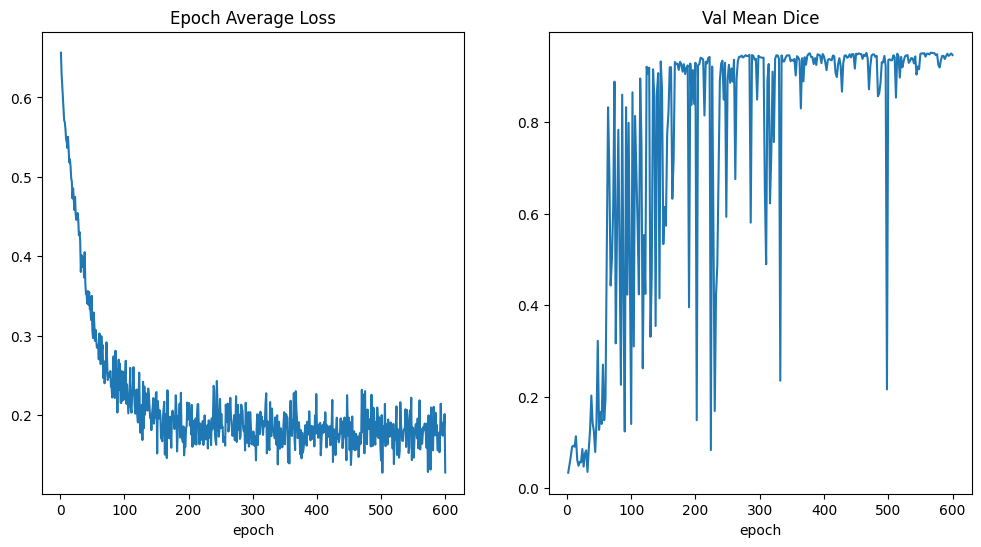

In [45]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [val_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

## Check best model output with the input image and label

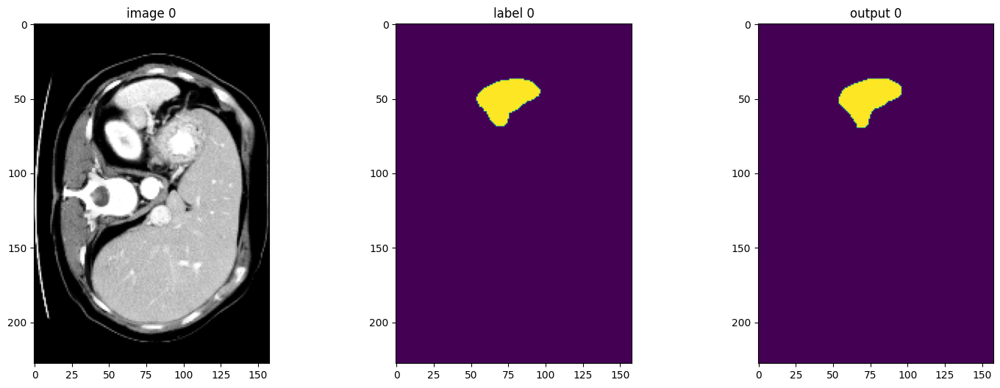

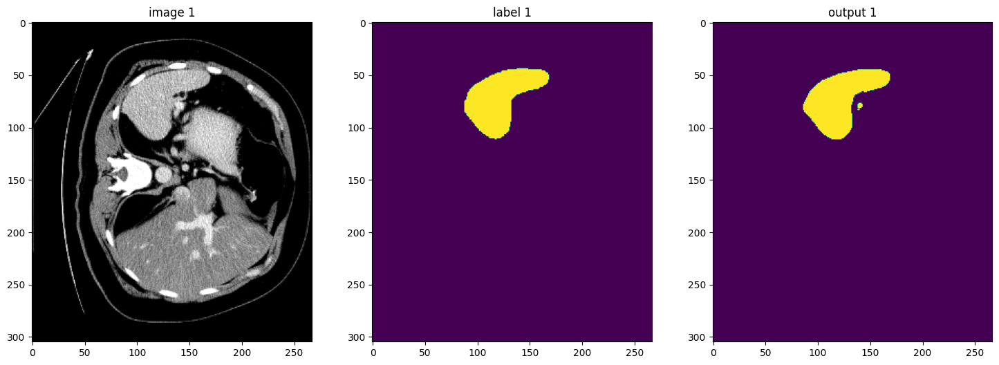

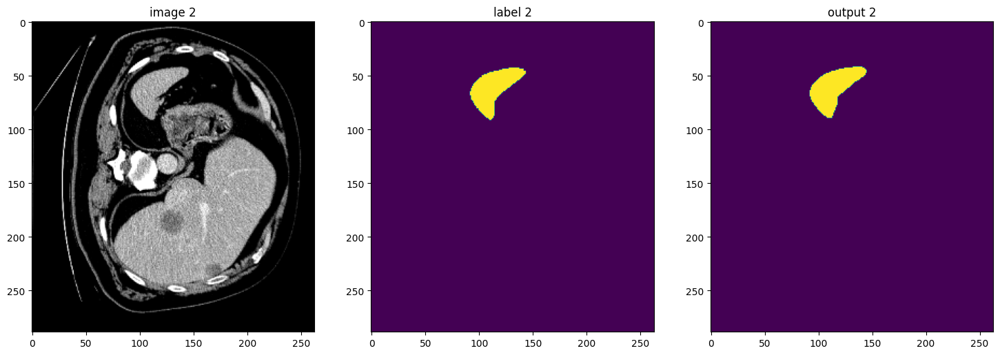

In [46]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()
with torch.no_grad():
    for i, val_data in enumerate(val_loader):
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        val_outputs = sliding_window_inference(val_data["image"].to(device), roi_size, sw_batch_size, model)
        # plot the slice [:, :, 80]
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(val_data["image"][0, 0, :, :, 80], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"label {i}")
        plt.imshow(val_data["label"][0, 0, :, :, 80])
        plt.subplot(1, 3, 3)
        plt.title(f"output {i}")
        plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 80])
        plt.show()
        if i == 2:
            break

## Evaluation on original image spacings

In [47]:
val_org_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-57,
            a_max=164,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

val_org_ds = Dataset(data=val_files, transform=val_org_transforms)
val_org_loader = DataLoader(val_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=val_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
            device="cpu",
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=2),
        AsDiscreted(keys="label", to_onehot=2),
    ]
)

monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.


In [48]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

with torch.no_grad():
    for val_data in val_org_loader:
        val_inputs = val_data["image"].to(device)
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        val_data["pred"] = sliding_window_inference(val_inputs, roi_size, sw_batch_size, model)
        val_data = [post_transforms(i) for i in decollate_batch(val_data)]
        val_outputs, val_labels = from_engine(["pred", "label"])(val_data)
        # compute metric for current iteration
        dice_metric(y_pred=val_outputs, y=val_labels)

    # aggregate the final mean dice result
    metric_org = dice_metric.aggregate().item()
    # reset the status for next validation round
    dice_metric.reset()

print("Metric on original image spacing: ", metric_org)

Metric on original image spacing:  0.9618459343910217

## Inference on Test Set

In [49]:
test_images = sorted(glob.glob(os.path.join(data_dir, "imagesTs", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-57,
            a_max=164,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

test_org_ds = Dataset(data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=test_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=2),
        SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./out", output_postfix="seg", resample=False),
    ]
)

## Cleanup data directory

Remove directory if a temporary was used.

In [ ]:
if directory is None:
    shutil.rmtree(root_dir)

## Enjoy ITK and MONAI!